# Norman

In [1]:
import warnings
import os
import sys
import gc
import warnings

In [2]:
import anndata as ad
import scanpy as sc
import copy
import torch
from pathlib import Path
import networkx as nx
from sklearn.neighbors import kneighbors_graph
import rapids_singlecell as rsc
import numpy as np
import scanpy as sc
import pandas as pd
import numpy as np
import scipy.stats

sys.path.append("/home/icb/kemal.inecik/work/codes/tardis")
import tardis
tardis.config = tardis.config_server

print(f"CUDA used: {torch.cuda.is_available()}")

CUDA used: True


In [3]:
%matplotlib inline
%config InlineBackend.figure_format='retina'
import matplotlib.pyplot as plt
import seaborn as sns

import pickle
_rcparams_path = "/home/icb/kemal.inecik/work/codes/tardis/training/local/figures/rcparams.pickle"
with open(_rcparams_path, 'rb') as file:
    _rcparams = pickle.load(file)
plt.rcParams.update(_rcparams)

In [4]:
with warnings.catch_warnings():
    warnings.simplefilter("ignore")
    adata_file_path = os.path.join(tardis.config.io_directories["processed"], "cpa_Norman2019_prep_new.h5ad")
    assert os.path.isfile(adata_file_path), f"File not already exist: `{adata_file_path}`"
    adata = ad.read_h5ad(adata_file_path)
    adata.X = adata.layers["counts"].copy()
    del adata.layers
    gc.collect()
adata

AnnData object with n_obs × n_vars = 108497 × 5000
    obs: 'cov_drug_dose_name', 'dose_val', 'control', 'condition', 'guide_identity', 'drug_dose_name', 'cell_type', 'split', 'split1', 'split2', 'split3', 'split4', 'split5', 'split6', 'split7', 'split8', 'split9', 'split10', 'split11', 'split12', 'split13', 'split14', 'split15', 'split16', 'split17', 'split18', 'split19', 'split20', 'split21', 'split22', 'split23', 'split24', 'split25'
    var: 'gene_symbols', 'highly_variable', 'means', 'dispersions', 'dispersions_norm'
    uns: 'hvg', 'rank_genes_groups_cov'

## Train

In [5]:
warmup_epoch_range = [12, 48]
dtc_w1 = 1000
dtc_w2 = 100

counteractive_minibatch_settings = dict(
    method = "categorical_random",
    method_kwargs = dict(
        within_labels = False,
        within_batch = False,
        within_categorical_covs = None,
        seed = "forward",
    )
)

disentenglement_targets_configurations=[
    dict(
        obs_key = "condition",
        n_reserved_latent = 8,
        counteractive_minibatch_settings = counteractive_minibatch_settings,
        auxillary_losses = [
            dict(
                apply = True, 
                target_type="categorical",
                progress_bar = False,
                weight = dtc_w1,
                method = "mse_z", 
                latent_group = "reserved",
                counteractive_example = "negative",
                transformation = "inverse", 
                warmup_epoch_range=warmup_epoch_range,
                method_kwargs = {}
            ),
            dict(
                apply = True, 
                target_type="categorical",
                progress_bar = False,
                weight = dtc_w2, 
                method = "mse_z", 
                latent_group = "reserved",
                counteractive_example = "positive",
                transformation = "none",
                warmup_epoch_range=warmup_epoch_range,
                method_kwargs = {}
            ),
            dict(
                apply = True, 
                target_type="categorical",
                progress_bar = False,
                weight = dtc_w2 * 1,
                method = "mse_z", 
                latent_group = "unreserved_complete",
                counteractive_example = "negative",
                transformation = "none", 
                warmup_epoch_range=warmup_epoch_range,
                method_kwargs = {}
            ),
            dict(
                apply = True, 
                target_type="categorical",
                progress_bar = False,
                weight = dtc_w1 * 1, 
                method = "mse_z", 
                latent_group = "unreserved_complete",
                counteractive_example = "positive",
                transformation = "inverse",
                warmup_epoch_range=warmup_epoch_range,
                method_kwargs = {}
            ),
        ]
    )
]

In [6]:
n_epochs_kl_warmup = 400

model_params = dict(
    n_hidden=512,
    n_layers=3, 
    n_latent=(24 + 8 * len(disentenglement_targets_configurations)), 
    gene_likelihood = "nb",
    use_batch_norm = "none",
    use_layer_norm = "both",
    dropout_rate = 0.1,
    include_auxillary_loss = True,
    encode_covariates=False
)

train_params = dict(
    max_epochs=1000,
    train_size=0.8,
    batch_size=512,
    check_val_every_n_epoch=10,
    learning_rate_monitor=True,
    # early stopping:
    early_stopping=True,
    early_stopping_patience=150,
    early_stopping_monitor="elbo_train",
    plan_kwargs = dict(
        n_epochs_kl_warmup=n_epochs_kl_warmup,
        lr=1e-3,
        weight_decay=1e-6,
        # optimizer="AdamW"
        # lr-scheduler:
        reduce_lr_on_plateau=True,
        lr_patience=100,
        lr_scheduler_metric="elbo_train",
    )
)

dataset_params = dict(
    layer=None, 
    labels_key=None,
    batch_key=None,
    categorical_covariate_keys=None,
    disentenglement_targets_configurations=disentenglement_targets_configurations
)

tardis.MyModel.setup_anndata(adata, **dataset_params)
dataset_params["adata_path"] = adata_file_path
dataset_params["adata"] = os.path.split(adata_file_path)[1]

tardis.MyModel.setup_wandb(
    wandb_configurations=tardis.config.wandb,
    hyperparams=dict(
        model_params=model_params,
        train_params=train_params,
        dataset_params=dataset_params,
    )
)

vae = tardis.MyModel(
    adata,
    **model_params
)
vae.train(**train_params)

CUDA backend failed to initialize: Found cuDNN version 8700, but JAX was built against version 8907, which is newer. The copy of cuDNN that is installed must be at least as new as the version against which JAX was built. (Set TF_CPP_MIN_LOG_LEVEL=0 and rerun for more info.)


W&B logger initialized with the following parameters: 
Entity: inecik-academic
Project: tardis_conference
ID: jf5bxcc9
Name: breezy-rain-621
Tags: tardis, conference, figures, final
Notes: Final runs for Tardis before conference.
URL: https://wandb.ai/inecik-academic/tardis_conference/runs/jf5bxcc9
Directory: /lustre/groups/ml01/workspace/kemal.inecik/wandb/run-20240507_120139-jf5bxcc9/files



/home/icb/kemal.inecik/tools/apps/mamba/envs/tardis_env/lib/python3.10/site-packages/lightning/fabric/plugins/environments/slurm.py:168: The `srun` command is available on your system but is not used. HINT: If your intention is to run Lightning on SLURM, prepend your python command with `srun` like so: srun python /home/icb/kemal.inecik/tools/apps/mamba/envs/tardis_ ...


GPU available: True (cuda), used: True


TPU available: False, using: 0 TPU cores


IPU available: False, using: 0 IPUs


HPU available: False, using: 0 HPUs


/home/icb/kemal.inecik/tools/apps/mamba/envs/tardis_env/lib/python3.10/site-packages/lightning/fabric/plugins/environments/slurm.py:168: The `srun` command is available on your system but is not used. HINT: If your intention is to run Lightning on SLURM, prepend your python command with `srun` like so: srun python /home/icb/kemal.inecik/tools/apps/mamba/envs/tardis_ ...
You are using a CUDA device ('NVIDIA A100-PCIE-40GB MIG 3g.20gb') that has Tensor Cores. To properly utilize them, you should set `torch.set_float32_matmul_precision('medium' | 'high')` which will trade-off precision for performance. For more details, read https://pytorch.org/docs/stable/generated/torch.set_float32_matmul_precision.html#torch.set_float32_matmul_precision


LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [MIG-6e34a936-7121-513e-b278-9713b460855e]


/home/icb/kemal.inecik/tools/apps/mamba/envs/tardis_env/lib/python3.10/site-packages/torch/optim/lr_scheduler.py:28: UserWarning: The verbose parameter is deprecated. Please use get_last_lr() to access the learning rate.
  warnings.warn("The verbose parameter is deprecated. Please use get_last_lr() "


Training:   0%|          | 0/1000 [00:00<?, ?it/s]

Epoch 1/1000:   0%|          | 0/1000 [00:00<?, ?it/s]

/home/icb/kemal.inecik/work/codes/tardis/tardis/_counteractivegenerator.py:237: UserWarning: Possible group definition indices are calculated for `condition` for `training` set. Number of elements in each group: 224,384,445,184,413,316,556,146,472,365,426,364,238,283,46,216,450,292,272,546,235,265,139,50,316,148,106,279,99,89,184,197,53,327,230,174,269,143,88,178,386,458,324,980,140,378,176,194,279,330,227,141,372,253,259,398,301,626,298,302,226,584,234,160,259,343,283,722,359,351,257,361,363,369,124,220,226,157,55,128,197,500,311,273,338,222,155,243,383,171,136,107,283,391,146,159,444,78,141,283,174,372,98,230,196,216,331,131,150,299,289,112,112,339,343,345,255,42,46,218,216,277,79,217,318,246,194,241,279,210,952,266,186,528,301,146,504,362,507,453,207,456,458,271,366,234,367,246,282,305,266,245,266,397,392,243,249,191,162,626,253,227,138,149,174,158,534,257,386,222,275,399,611,416,296,250,223,230,171,177,215,195,203,239,614,348,340,357,345,7112,433,278,198,173,346,174,269,274,151,319

/home/icb/kemal.inecik/work/codes/tardis/tardis/_counteractivegenerator.py:237: UserWarning: Possible group definition indices are calculated for `condition` for `validation` set. Number of elements in each group: 52,97,113,48,82,63,131,29,110,98,107,100,63,75,13,48,112,73,76,117,71,70,49,14,94,36,28,85,27,18,46,48,11,85,56,37,62,37,26,59,82,108,91,239,39,97,39,47,76,68,58,37,98,75,70,80,86,161,84,64,64,147,63,23,63,82,71,183,82,94,67,98,88,76,35,64,51,34,16,23,50,130,71,72,88,50,37,52,96,45,39,23,46,103,46,41,108,18,52,85,41,91,28,73,41,58,79,36,33,69,60,28,29,106,84,99,72,12,13,48,62,52,17,37,77,65,43,57,82,53,245,71,55,119,74,46,119,70,119,128,54,115,121,67,85,66,77,56,81,61,73,57,53,103,105,70,49,46,30,144,57,66,38,37,41,44,133,58,94,47,70,113,139,97,76,72,61,61,47,45,49,41,52,66,149,86,72,89,118,1795,97,71,47,38,100,43,62,58,49,84,35,71,60,75,81,128,68,59,85,22,14,35,60,81,20,74,61,94,50,40,58,88,69,54,76,46,48,62,58,68,57,103,52,66,16,50,32,135,135,138,96,76,77,54,193,123,29,49,6

Epoch 1/1000:   0%|          | 1/1000 [00:16<4:30:23, 16.24s/it]

Epoch 1/1000:   0%|          | 1/1000 [00:16<4:30:23, 16.24s/it, v_num=c9_1, total_loss_train=1.45e+3, kl_local_train=128]

Epoch 2/1000:   0%|          | 1/1000 [00:16<4:30:23, 16.24s/it, v_num=c9_1, total_loss_train=1.45e+3, kl_local_train=128]

Epoch 2/1000:   0%|          | 2/1000 [00:24<3:14:31, 11.70s/it, v_num=c9_1, total_loss_train=1.45e+3, kl_local_train=128]

Epoch 2/1000:   0%|          | 2/1000 [00:24<3:14:31, 11.70s/it, v_num=c9_1, total_loss_train=1.31e+3, kl_local_train=58.1]

Epoch 3/1000:   0%|          | 2/1000 [00:24<3:14:31, 11.70s/it, v_num=c9_1, total_loss_train=1.31e+3, kl_local_train=58.1]

Epoch 3/1000:   0%|          | 3/1000 [00:33<2:48:29, 10.14s/it, v_num=c9_1, total_loss_train=1.31e+3, kl_local_train=58.1]

Epoch 3/1000:   0%|          | 3/1000 [00:33<2:48:29, 10.14s/it, v_num=c9_1, total_loss_train=1.3e+3, kl_local_train=4.2]  

Epoch 4/1000:   0%|          | 3/1000 [00:33<2:48:29, 10.14s/it, v_num=c9_1, total_loss_train=1.3e+3, kl_local_train=4.2]

Epoch 4/1000:   0%|          | 4/1000 [00:41<2:37:39,  9.50s/it, v_num=c9_1, total_loss_train=1.3e+3, kl_local_train=4.2]

Epoch 4/1000:   0%|          | 4/1000 [00:41<2:37:39,  9.50s/it, v_num=c9_1, total_loss_train=1.29e+3, kl_local_train=1.49]

Epoch 5/1000:   0%|          | 4/1000 [00:41<2:37:39,  9.50s/it, v_num=c9_1, total_loss_train=1.29e+3, kl_local_train=1.49]

Epoch 5/1000:   0%|          | 5/1000 [00:50<2:31:48,  9.15s/it, v_num=c9_1, total_loss_train=1.29e+3, kl_local_train=1.49]

Epoch 5/1000:   0%|          | 5/1000 [00:50<2:31:48,  9.15s/it, v_num=c9_1, total_loss_train=1.28e+3, kl_local_train=1.95]

Epoch 6/1000:   0%|          | 5/1000 [00:50<2:31:48,  9.15s/it, v_num=c9_1, total_loss_train=1.28e+3, kl_local_train=1.95]

Epoch 6/1000:   1%|          | 6/1000 [00:58<2:29:15,  9.01s/it, v_num=c9_1, total_loss_train=1.28e+3, kl_local_train=1.95]

Epoch 6/1000:   1%|          | 6/1000 [00:58<2:29:15,  9.01s/it, v_num=c9_1, total_loss_train=1.26e+3, kl_local_train=30.4]

Epoch 7/1000:   1%|          | 6/1000 [00:58<2:29:15,  9.01s/it, v_num=c9_1, total_loss_train=1.26e+3, kl_local_train=30.4]

Epoch 7/1000:   1%|          | 7/1000 [01:07<2:24:51,  8.75s/it, v_num=c9_1, total_loss_train=1.26e+3, kl_local_train=30.4]

Epoch 7/1000:   1%|          | 7/1000 [01:07<2:24:51,  8.75s/it, v_num=c9_1, total_loss_train=1.25e+3, kl_local_train=30.2]

Epoch 8/1000:   1%|          | 7/1000 [01:07<2:24:51,  8.75s/it, v_num=c9_1, total_loss_train=1.25e+3, kl_local_train=30.2]

Epoch 8/1000:   1%|          | 8/1000 [01:15<2:24:16,  8.73s/it, v_num=c9_1, total_loss_train=1.25e+3, kl_local_train=30.2]

Epoch 8/1000:   1%|          | 8/1000 [01:15<2:24:16,  8.73s/it, v_num=c9_1, total_loss_train=1.24e+3, kl_local_train=31.9]

Epoch 9/1000:   1%|          | 8/1000 [01:15<2:24:16,  8.73s/it, v_num=c9_1, total_loss_train=1.24e+3, kl_local_train=31.9]

Epoch 9/1000:   1%|          | 9/1000 [01:23<2:20:46,  8.52s/it, v_num=c9_1, total_loss_train=1.24e+3, kl_local_train=31.9]

Epoch 9/1000:   1%|          | 9/1000 [01:23<2:20:46,  8.52s/it, v_num=c9_1, total_loss_train=1.22e+3, kl_local_train=36.7]

Epoch 10/1000:   1%|          | 9/1000 [01:23<2:20:46,  8.52s/it, v_num=c9_1, total_loss_train=1.22e+3, kl_local_train=36.7]

Epoch 10/1000:   1%|          | 10/1000 [01:31<2:17:35,  8.34s/it, v_num=c9_1, total_loss_train=1.22e+3, kl_local_train=36.7]

Epoch 10/1000:   1%|          | 10/1000 [01:31<2:17:35,  8.34s/it, v_num=c9_1, total_loss_train=1.21e+3, kl_local_train=35.9]

Epoch 11/1000:   1%|          | 10/1000 [01:31<2:17:35,  8.34s/it, v_num=c9_1, total_loss_train=1.21e+3, kl_local_train=35.9]

Epoch 11/1000:   1%|          | 11/1000 [01:39<2:15:56,  8.25s/it, v_num=c9_1, total_loss_train=1.21e+3, kl_local_train=35.9]

Epoch 11/1000:   1%|          | 11/1000 [01:39<2:15:56,  8.25s/it, v_num=c9_1, total_loss_train=1.2e+3, kl_local_train=35.6] 

Epoch 12/1000:   1%|          | 11/1000 [01:39<2:15:56,  8.25s/it, v_num=c9_1, total_loss_train=1.2e+3, kl_local_train=35.6]

Epoch 12/1000:   1%|          | 12/1000 [01:48<2:18:55,  8.44s/it, v_num=c9_1, total_loss_train=1.2e+3, kl_local_train=35.6]

Epoch 12/1000:   1%|          | 12/1000 [01:48<2:18:55,  8.44s/it, v_num=c9_1, total_loss_train=1.2e+3, kl_local_train=35.3]

Epoch 13/1000:   1%|          | 12/1000 [01:48<2:18:55,  8.44s/it, v_num=c9_1, total_loss_train=1.2e+3, kl_local_train=35.3]

Epoch 13/1000:   1%|▏         | 13/1000 [01:57<2:18:56,  8.45s/it, v_num=c9_1, total_loss_train=1.2e+3, kl_local_train=35.3]

Epoch 13/1000:   1%|▏         | 13/1000 [01:57<2:18:56,  8.45s/it, v_num=c9_1, total_loss_train=1.19e+3, kl_local_train=36.2]

Epoch 14/1000:   1%|▏         | 13/1000 [01:57<2:18:56,  8.45s/it, v_num=c9_1, total_loss_train=1.19e+3, kl_local_train=36.2]

Epoch 14/1000:   1%|▏         | 14/1000 [02:05<2:16:24,  8.30s/it, v_num=c9_1, total_loss_train=1.19e+3, kl_local_train=36.2]

Epoch 14/1000:   1%|▏         | 14/1000 [02:05<2:16:24,  8.30s/it, v_num=c9_1, total_loss_train=1.21e+3, kl_local_train=45]  

Epoch 15/1000:   1%|▏         | 14/1000 [02:05<2:16:24,  8.30s/it, v_num=c9_1, total_loss_train=1.21e+3, kl_local_train=45]

Epoch 15/1000:   2%|▏         | 15/1000 [02:13<2:16:34,  8.32s/it, v_num=c9_1, total_loss_train=1.21e+3, kl_local_train=45]

Epoch 15/1000:   2%|▏         | 15/1000 [02:13<2:16:34,  8.32s/it, v_num=c9_1, total_loss_train=1.23e+3, kl_local_train=63.1]

Epoch 16/1000:   2%|▏         | 15/1000 [02:13<2:16:34,  8.32s/it, v_num=c9_1, total_loss_train=1.23e+3, kl_local_train=63.1]

Epoch 16/1000:   2%|▏         | 16/1000 [02:22<2:18:38,  8.45s/it, v_num=c9_1, total_loss_train=1.23e+3, kl_local_train=63.1]

Epoch 16/1000:   2%|▏         | 16/1000 [02:22<2:18:38,  8.45s/it, v_num=c9_1, total_loss_train=1.26e+3, kl_local_train=79.4]

Epoch 17/1000:   2%|▏         | 16/1000 [02:22<2:18:38,  8.45s/it, v_num=c9_1, total_loss_train=1.26e+3, kl_local_train=79.4]

Epoch 17/1000:   2%|▏         | 17/1000 [02:30<2:17:30,  8.39s/it, v_num=c9_1, total_loss_train=1.26e+3, kl_local_train=79.4]

Epoch 17/1000:   2%|▏         | 17/1000 [02:30<2:17:30,  8.39s/it, v_num=c9_1, total_loss_train=1.28e+3, kl_local_train=93.7]

Epoch 18/1000:   2%|▏         | 17/1000 [02:30<2:17:30,  8.39s/it, v_num=c9_1, total_loss_train=1.28e+3, kl_local_train=93.7]

Epoch 18/1000:   2%|▏         | 18/1000 [02:38<2:17:30,  8.40s/it, v_num=c9_1, total_loss_train=1.28e+3, kl_local_train=93.7]

Epoch 18/1000:   2%|▏         | 18/1000 [02:38<2:17:30,  8.40s/it, v_num=c9_1, total_loss_train=1.31e+3, kl_local_train=95.8]

Epoch 19/1000:   2%|▏         | 18/1000 [02:38<2:17:30,  8.40s/it, v_num=c9_1, total_loss_train=1.31e+3, kl_local_train=95.8]

Epoch 19/1000:   2%|▏         | 19/1000 [02:46<2:14:30,  8.23s/it, v_num=c9_1, total_loss_train=1.31e+3, kl_local_train=95.8]

Epoch 19/1000:   2%|▏         | 19/1000 [02:46<2:14:30,  8.23s/it, v_num=c9_1, total_loss_train=1.33e+3, kl_local_train=123] 

Epoch 20/1000:   2%|▏         | 19/1000 [02:46<2:14:30,  8.23s/it, v_num=c9_1, total_loss_train=1.33e+3, kl_local_train=123]

Epoch 20/1000:   2%|▏         | 20/1000 [02:54<2:14:44,  8.25s/it, v_num=c9_1, total_loss_train=1.33e+3, kl_local_train=123]

Epoch 20/1000:   2%|▏         | 20/1000 [02:54<2:14:44,  8.25s/it, v_num=c9_1, total_loss_train=1.36e+3, kl_local_train=124]

Epoch 21/1000:   2%|▏         | 20/1000 [02:55<2:14:44,  8.25s/it, v_num=c9_1, total_loss_train=1.36e+3, kl_local_train=124]

Epoch 21/1000:   2%|▏         | 21/1000 [03:04<2:19:51,  8.57s/it, v_num=c9_1, total_loss_train=1.36e+3, kl_local_train=124]

Epoch 21/1000:   2%|▏         | 21/1000 [03:04<2:19:51,  8.57s/it, v_num=c9_1, total_loss_train=1.38e+3, kl_local_train=148]

Epoch 22/1000:   2%|▏         | 21/1000 [03:04<2:19:51,  8.57s/it, v_num=c9_1, total_loss_train=1.38e+3, kl_local_train=148]

Epoch 22/1000:   2%|▏         | 22/1000 [03:13<2:20:41,  8.63s/it, v_num=c9_1, total_loss_train=1.38e+3, kl_local_train=148]

Epoch 22/1000:   2%|▏         | 22/1000 [03:13<2:20:41,  8.63s/it, v_num=c9_1, total_loss_train=1.41e+3, kl_local_train=159]

Epoch 23/1000:   2%|▏         | 22/1000 [03:13<2:20:41,  8.63s/it, v_num=c9_1, total_loss_train=1.41e+3, kl_local_train=159]

Epoch 23/1000:   2%|▏         | 23/1000 [03:22<2:22:35,  8.76s/it, v_num=c9_1, total_loss_train=1.41e+3, kl_local_train=159]

Epoch 23/1000:   2%|▏         | 23/1000 [03:22<2:22:35,  8.76s/it, v_num=c9_1, total_loss_train=1.43e+3, kl_local_train=164]

Epoch 24/1000:   2%|▏         | 23/1000 [03:22<2:22:35,  8.76s/it, v_num=c9_1, total_loss_train=1.43e+3, kl_local_train=164]

Epoch 24/1000:   2%|▏         | 24/1000 [03:30<2:18:48,  8.53s/it, v_num=c9_1, total_loss_train=1.43e+3, kl_local_train=164]

Epoch 24/1000:   2%|▏         | 24/1000 [03:30<2:18:48,  8.53s/it, v_num=c9_1, total_loss_train=1.46e+3, kl_local_train=171]

Epoch 25/1000:   2%|▏         | 24/1000 [03:30<2:18:48,  8.53s/it, v_num=c9_1, total_loss_train=1.46e+3, kl_local_train=171]

Epoch 25/1000:   2%|▎         | 25/1000 [03:38<2:18:15,  8.51s/it, v_num=c9_1, total_loss_train=1.46e+3, kl_local_train=171]

Epoch 25/1000:   2%|▎         | 25/1000 [03:38<2:18:15,  8.51s/it, v_num=c9_1, total_loss_train=1.48e+3, kl_local_train=190]

Epoch 26/1000:   2%|▎         | 25/1000 [03:38<2:18:15,  8.51s/it, v_num=c9_1, total_loss_train=1.48e+3, kl_local_train=190]

Epoch 26/1000:   3%|▎         | 26/1000 [03:47<2:19:07,  8.57s/it, v_num=c9_1, total_loss_train=1.48e+3, kl_local_train=190]

Epoch 26/1000:   3%|▎         | 26/1000 [03:47<2:19:07,  8.57s/it, v_num=c9_1, total_loss_train=1.51e+3, kl_local_train=168]

Epoch 27/1000:   3%|▎         | 26/1000 [03:47<2:19:07,  8.57s/it, v_num=c9_1, total_loss_train=1.51e+3, kl_local_train=168]

Epoch 27/1000:   3%|▎         | 27/1000 [03:55<2:17:39,  8.49s/it, v_num=c9_1, total_loss_train=1.51e+3, kl_local_train=168]

Epoch 27/1000:   3%|▎         | 27/1000 [03:55<2:17:39,  8.49s/it, v_num=c9_1, total_loss_train=1.53e+3, kl_local_train=176]

Epoch 28/1000:   3%|▎         | 27/1000 [03:55<2:17:39,  8.49s/it, v_num=c9_1, total_loss_train=1.53e+3, kl_local_train=176]

Epoch 28/1000:   3%|▎         | 28/1000 [04:04<2:17:20,  8.48s/it, v_num=c9_1, total_loss_train=1.53e+3, kl_local_train=176]

Epoch 28/1000:   3%|▎         | 28/1000 [04:04<2:17:20,  8.48s/it, v_num=c9_1, total_loss_train=1.56e+3, kl_local_train=186]

Epoch 29/1000:   3%|▎         | 28/1000 [04:04<2:17:20,  8.48s/it, v_num=c9_1, total_loss_train=1.56e+3, kl_local_train=186]

Epoch 29/1000:   3%|▎         | 29/1000 [04:12<2:15:25,  8.37s/it, v_num=c9_1, total_loss_train=1.56e+3, kl_local_train=186]

Epoch 29/1000:   3%|▎         | 29/1000 [04:12<2:15:25,  8.37s/it, v_num=c9_1, total_loss_train=1.58e+3, kl_local_train=200]

Epoch 30/1000:   3%|▎         | 29/1000 [04:12<2:15:25,  8.37s/it, v_num=c9_1, total_loss_train=1.58e+3, kl_local_train=200]

Epoch 30/1000:   3%|▎         | 30/1000 [04:20<2:16:02,  8.42s/it, v_num=c9_1, total_loss_train=1.58e+3, kl_local_train=200]

Epoch 30/1000:   3%|▎         | 30/1000 [04:20<2:16:02,  8.42s/it, v_num=c9_1, total_loss_train=1.61e+3, kl_local_train=195]

Epoch 31/1000:   3%|▎         | 30/1000 [04:20<2:16:02,  8.42s/it, v_num=c9_1, total_loss_train=1.61e+3, kl_local_train=195]

Epoch 31/1000:   3%|▎         | 31/1000 [04:28<2:13:28,  8.27s/it, v_num=c9_1, total_loss_train=1.61e+3, kl_local_train=195]

Epoch 31/1000:   3%|▎         | 31/1000 [04:28<2:13:28,  8.27s/it, v_num=c9_1, total_loss_train=1.63e+3, kl_local_train=208]

Epoch 32/1000:   3%|▎         | 31/1000 [04:28<2:13:28,  8.27s/it, v_num=c9_1, total_loss_train=1.63e+3, kl_local_train=208]

Epoch 32/1000:   3%|▎         | 32/1000 [04:37<2:15:17,  8.39s/it, v_num=c9_1, total_loss_train=1.63e+3, kl_local_train=208]

Epoch 32/1000:   3%|▎         | 32/1000 [04:37<2:15:17,  8.39s/it, v_num=c9_1, total_loss_train=1.66e+3, kl_local_train=203]

Epoch 33/1000:   3%|▎         | 32/1000 [04:37<2:15:17,  8.39s/it, v_num=c9_1, total_loss_train=1.66e+3, kl_local_train=203]

Epoch 33/1000:   3%|▎         | 33/1000 [04:45<2:14:52,  8.37s/it, v_num=c9_1, total_loss_train=1.66e+3, kl_local_train=203]

Epoch 33/1000:   3%|▎         | 33/1000 [04:45<2:14:52,  8.37s/it, v_num=c9_1, total_loss_train=1.68e+3, kl_local_train=214]

Epoch 34/1000:   3%|▎         | 33/1000 [04:45<2:14:52,  8.37s/it, v_num=c9_1, total_loss_train=1.68e+3, kl_local_train=214]

Epoch 34/1000:   3%|▎         | 34/1000 [04:54<2:16:18,  8.47s/it, v_num=c9_1, total_loss_train=1.68e+3, kl_local_train=214]

Epoch 34/1000:   3%|▎         | 34/1000 [04:54<2:16:18,  8.47s/it, v_num=c9_1, total_loss_train=1.71e+3, kl_local_train=210]

Epoch 35/1000:   3%|▎         | 34/1000 [04:54<2:16:18,  8.47s/it, v_num=c9_1, total_loss_train=1.71e+3, kl_local_train=210]

Epoch 35/1000:   4%|▎         | 35/1000 [05:03<2:18:14,  8.59s/it, v_num=c9_1, total_loss_train=1.71e+3, kl_local_train=210]

Epoch 35/1000:   4%|▎         | 35/1000 [05:03<2:18:14,  8.59s/it, v_num=c9_1, total_loss_train=1.74e+3, kl_local_train=206]

Epoch 36/1000:   4%|▎         | 35/1000 [05:03<2:18:14,  8.59s/it, v_num=c9_1, total_loss_train=1.74e+3, kl_local_train=206]

Epoch 36/1000:   4%|▎         | 36/1000 [05:11<2:16:19,  8.49s/it, v_num=c9_1, total_loss_train=1.74e+3, kl_local_train=206]

Epoch 36/1000:   4%|▎         | 36/1000 [05:11<2:16:19,  8.49s/it, v_num=c9_1, total_loss_train=1.76e+3, kl_local_train=206]

Epoch 37/1000:   4%|▎         | 36/1000 [05:11<2:16:19,  8.49s/it, v_num=c9_1, total_loss_train=1.76e+3, kl_local_train=206]

Epoch 37/1000:   4%|▎         | 37/1000 [05:19<2:16:14,  8.49s/it, v_num=c9_1, total_loss_train=1.76e+3, kl_local_train=206]

Epoch 37/1000:   4%|▎         | 37/1000 [05:19<2:16:14,  8.49s/it, v_num=c9_1, total_loss_train=1.79e+3, kl_local_train=212]

Epoch 38/1000:   4%|▎         | 37/1000 [05:19<2:16:14,  8.49s/it, v_num=c9_1, total_loss_train=1.79e+3, kl_local_train=212]

Epoch 38/1000:   4%|▍         | 38/1000 [05:28<2:18:36,  8.64s/it, v_num=c9_1, total_loss_train=1.79e+3, kl_local_train=212]

Epoch 38/1000:   4%|▍         | 38/1000 [05:28<2:18:36,  8.64s/it, v_num=c9_1, total_loss_train=1.81e+3, kl_local_train=197]

Epoch 39/1000:   4%|▍         | 38/1000 [05:28<2:18:36,  8.64s/it, v_num=c9_1, total_loss_train=1.81e+3, kl_local_train=197]

Epoch 39/1000:   4%|▍         | 39/1000 [05:37<2:18:04,  8.62s/it, v_num=c9_1, total_loss_train=1.81e+3, kl_local_train=197]

Epoch 39/1000:   4%|▍         | 39/1000 [05:37<2:18:04,  8.62s/it, v_num=c9_1, total_loss_train=1.84e+3, kl_local_train=221]

Epoch 40/1000:   4%|▍         | 39/1000 [05:37<2:18:04,  8.62s/it, v_num=c9_1, total_loss_train=1.84e+3, kl_local_train=221]

Epoch 40/1000:   4%|▍         | 40/1000 [05:46<2:18:59,  8.69s/it, v_num=c9_1, total_loss_train=1.84e+3, kl_local_train=221]

Epoch 40/1000:   4%|▍         | 40/1000 [05:46<2:18:59,  8.69s/it, v_num=c9_1, total_loss_train=1.86e+3, kl_local_train=223]

Epoch 41/1000:   4%|▍         | 40/1000 [05:46<2:18:59,  8.69s/it, v_num=c9_1, total_loss_train=1.86e+3, kl_local_train=223]

Epoch 41/1000:   4%|▍         | 41/1000 [05:54<2:16:16,  8.53s/it, v_num=c9_1, total_loss_train=1.86e+3, kl_local_train=223]

Epoch 41/1000:   4%|▍         | 41/1000 [05:54<2:16:16,  8.53s/it, v_num=c9_1, total_loss_train=1.89e+3, kl_local_train=210]

Epoch 42/1000:   4%|▍         | 41/1000 [05:54<2:16:16,  8.53s/it, v_num=c9_1, total_loss_train=1.89e+3, kl_local_train=210]

Epoch 42/1000:   4%|▍         | 42/1000 [06:02<2:15:59,  8.52s/it, v_num=c9_1, total_loss_train=1.89e+3, kl_local_train=210]

Epoch 42/1000:   4%|▍         | 42/1000 [06:02<2:15:59,  8.52s/it, v_num=c9_1, total_loss_train=1.92e+3, kl_local_train=235]

Epoch 43/1000:   4%|▍         | 42/1000 [06:02<2:15:59,  8.52s/it, v_num=c9_1, total_loss_train=1.92e+3, kl_local_train=235]

Epoch 43/1000:   4%|▍         | 43/1000 [06:11<2:14:28,  8.43s/it, v_num=c9_1, total_loss_train=1.92e+3, kl_local_train=235]

Epoch 43/1000:   4%|▍         | 43/1000 [06:11<2:14:28,  8.43s/it, v_num=c9_1, total_loss_train=1.95e+3, kl_local_train=237]

Epoch 44/1000:   4%|▍         | 43/1000 [06:11<2:14:28,  8.43s/it, v_num=c9_1, total_loss_train=1.95e+3, kl_local_train=237]

Epoch 44/1000:   4%|▍         | 44/1000 [06:19<2:11:16,  8.24s/it, v_num=c9_1, total_loss_train=1.95e+3, kl_local_train=237]

Epoch 44/1000:   4%|▍         | 44/1000 [06:19<2:11:16,  8.24s/it, v_num=c9_1, total_loss_train=1.97e+3, kl_local_train=221]

Epoch 45/1000:   4%|▍         | 44/1000 [06:19<2:11:16,  8.24s/it, v_num=c9_1, total_loss_train=1.97e+3, kl_local_train=221]

Epoch 45/1000:   4%|▍         | 45/1000 [06:27<2:11:06,  8.24s/it, v_num=c9_1, total_loss_train=1.97e+3, kl_local_train=221]

Epoch 45/1000:   4%|▍         | 45/1000 [06:27<2:11:06,  8.24s/it, v_num=c9_1, total_loss_train=1.99e+3, kl_local_train=211]

Epoch 46/1000:   4%|▍         | 45/1000 [06:27<2:11:06,  8.24s/it, v_num=c9_1, total_loss_train=1.99e+3, kl_local_train=211]

Epoch 46/1000:   5%|▍         | 46/1000 [06:36<2:14:22,  8.45s/it, v_num=c9_1, total_loss_train=1.99e+3, kl_local_train=211]

Epoch 46/1000:   5%|▍         | 46/1000 [06:36<2:14:22,  8.45s/it, v_num=c9_1, total_loss_train=2.02e+3, kl_local_train=209]

Epoch 47/1000:   5%|▍         | 46/1000 [06:36<2:14:22,  8.45s/it, v_num=c9_1, total_loss_train=2.02e+3, kl_local_train=209]

Epoch 47/1000:   5%|▍         | 47/1000 [06:44<2:15:25,  8.53s/it, v_num=c9_1, total_loss_train=2.02e+3, kl_local_train=209]

Epoch 47/1000:   5%|▍         | 47/1000 [06:44<2:15:25,  8.53s/it, v_num=c9_1, total_loss_train=2.04e+3, kl_local_train=238]

Epoch 48/1000:   5%|▍         | 47/1000 [06:44<2:15:25,  8.53s/it, v_num=c9_1, total_loss_train=2.04e+3, kl_local_train=238]

Epoch 48/1000:   5%|▍         | 48/1000 [06:53<2:13:30,  8.41s/it, v_num=c9_1, total_loss_train=2.04e+3, kl_local_train=238]

Epoch 48/1000:   5%|▍         | 48/1000 [06:53<2:13:30,  8.41s/it, v_num=c9_1, total_loss_train=2.07e+3, kl_local_train=212]

Epoch 49/1000:   5%|▍         | 48/1000 [06:53<2:13:30,  8.41s/it, v_num=c9_1, total_loss_train=2.07e+3, kl_local_train=212]

Epoch 49/1000:   5%|▍         | 49/1000 [07:02<2:16:28,  8.61s/it, v_num=c9_1, total_loss_train=2.07e+3, kl_local_train=212]

Epoch 49/1000:   5%|▍         | 49/1000 [07:02<2:16:28,  8.61s/it, v_num=c9_1, total_loss_train=2.09e+3, kl_local_train=209]

Epoch 50/1000:   5%|▍         | 49/1000 [07:02<2:16:28,  8.61s/it, v_num=c9_1, total_loss_train=2.09e+3, kl_local_train=209]

Epoch 50/1000:   5%|▌         | 50/1000 [07:10<2:16:57,  8.65s/it, v_num=c9_1, total_loss_train=2.09e+3, kl_local_train=209]

Epoch 50/1000:   5%|▌         | 50/1000 [07:10<2:16:57,  8.65s/it, v_num=c9_1, total_loss_train=2.11e+3, kl_local_train=227]

Epoch 51/1000:   5%|▌         | 50/1000 [07:10<2:16:57,  8.65s/it, v_num=c9_1, total_loss_train=2.11e+3, kl_local_train=227]

Epoch 51/1000:   5%|▌         | 51/1000 [07:19<2:15:15,  8.55s/it, v_num=c9_1, total_loss_train=2.11e+3, kl_local_train=227]

Epoch 51/1000:   5%|▌         | 51/1000 [07:19<2:15:15,  8.55s/it, v_num=c9_1, total_loss_train=2.11e+3, kl_local_train=202]

Epoch 52/1000:   5%|▌         | 51/1000 [07:19<2:15:15,  8.55s/it, v_num=c9_1, total_loss_train=2.11e+3, kl_local_train=202]

Epoch 52/1000:   5%|▌         | 52/1000 [07:27<2:14:09,  8.49s/it, v_num=c9_1, total_loss_train=2.11e+3, kl_local_train=202]

Epoch 52/1000:   5%|▌         | 52/1000 [07:27<2:14:09,  8.49s/it, v_num=c9_1, total_loss_train=2.11e+3, kl_local_train=226]

Epoch 53/1000:   5%|▌         | 52/1000 [07:27<2:14:09,  8.49s/it, v_num=c9_1, total_loss_train=2.11e+3, kl_local_train=226]

Epoch 53/1000:   5%|▌         | 53/1000 [07:35<2:11:32,  8.33s/it, v_num=c9_1, total_loss_train=2.11e+3, kl_local_train=226]

Epoch 53/1000:   5%|▌         | 53/1000 [07:35<2:11:32,  8.33s/it, v_num=c9_1, total_loss_train=2.11e+3, kl_local_train=211]

Epoch 54/1000:   5%|▌         | 53/1000 [07:35<2:11:32,  8.33s/it, v_num=c9_1, total_loss_train=2.11e+3, kl_local_train=211]

Epoch 54/1000:   5%|▌         | 54/1000 [07:44<2:12:31,  8.41s/it, v_num=c9_1, total_loss_train=2.11e+3, kl_local_train=211]

Epoch 54/1000:   5%|▌         | 54/1000 [07:44<2:12:31,  8.41s/it, v_num=c9_1, total_loss_train=2.11e+3, kl_local_train=224]

Epoch 55/1000:   5%|▌         | 54/1000 [07:44<2:12:31,  8.41s/it, v_num=c9_1, total_loss_train=2.11e+3, kl_local_train=224]

Epoch 55/1000:   6%|▌         | 55/1000 [07:51<2:09:56,  8.25s/it, v_num=c9_1, total_loss_train=2.11e+3, kl_local_train=224]

Epoch 55/1000:   6%|▌         | 55/1000 [07:51<2:09:56,  8.25s/it, v_num=c9_1, total_loss_train=2.11e+3, kl_local_train=209]

Epoch 56/1000:   6%|▌         | 55/1000 [07:51<2:09:56,  8.25s/it, v_num=c9_1, total_loss_train=2.11e+3, kl_local_train=209]

Epoch 56/1000:   6%|▌         | 56/1000 [08:00<2:10:30,  8.30s/it, v_num=c9_1, total_loss_train=2.11e+3, kl_local_train=209]

Epoch 56/1000:   6%|▌         | 56/1000 [08:00<2:10:30,  8.30s/it, v_num=c9_1, total_loss_train=2.1e+3, kl_local_train=189] 

Epoch 57/1000:   6%|▌         | 56/1000 [08:00<2:10:30,  8.30s/it, v_num=c9_1, total_loss_train=2.1e+3, kl_local_train=189]

Epoch 57/1000:   6%|▌         | 57/1000 [08:08<2:08:33,  8.18s/it, v_num=c9_1, total_loss_train=2.1e+3, kl_local_train=189]

Epoch 57/1000:   6%|▌         | 57/1000 [08:08<2:08:33,  8.18s/it, v_num=c9_1, total_loss_train=2.1e+3, kl_local_train=187]

Epoch 58/1000:   6%|▌         | 57/1000 [08:08<2:08:33,  8.18s/it, v_num=c9_1, total_loss_train=2.1e+3, kl_local_train=187]

Epoch 58/1000:   6%|▌         | 58/1000 [08:16<2:07:40,  8.13s/it, v_num=c9_1, total_loss_train=2.1e+3, kl_local_train=187]

Epoch 58/1000:   6%|▌         | 58/1000 [08:16<2:07:40,  8.13s/it, v_num=c9_1, total_loss_train=2.1e+3, kl_local_train=178]

Epoch 59/1000:   6%|▌         | 58/1000 [08:16<2:07:40,  8.13s/it, v_num=c9_1, total_loss_train=2.1e+3, kl_local_train=178]

Epoch 59/1000:   6%|▌         | 59/1000 [08:24<2:06:11,  8.05s/it, v_num=c9_1, total_loss_train=2.1e+3, kl_local_train=178]

Epoch 59/1000:   6%|▌         | 59/1000 [08:24<2:06:11,  8.05s/it, v_num=c9_1, total_loss_train=2.09e+3, kl_local_train=170]

Epoch 60/1000:   6%|▌         | 59/1000 [08:24<2:06:11,  8.05s/it, v_num=c9_1, total_loss_train=2.09e+3, kl_local_train=170]

Epoch 60/1000:   6%|▌         | 60/1000 [08:32<2:09:22,  8.26s/it, v_num=c9_1, total_loss_train=2.09e+3, kl_local_train=170]

Epoch 60/1000:   6%|▌         | 60/1000 [08:32<2:09:22,  8.26s/it, v_num=c9_1, total_loss_train=2.09e+3, kl_local_train=173]

Epoch 61/1000:   6%|▌         | 60/1000 [08:32<2:09:22,  8.26s/it, v_num=c9_1, total_loss_train=2.09e+3, kl_local_train=173]

Epoch 61/1000:   6%|▌         | 61/1000 [08:41<2:13:05,  8.50s/it, v_num=c9_1, total_loss_train=2.09e+3, kl_local_train=173]

Epoch 61/1000:   6%|▌         | 61/1000 [08:41<2:13:05,  8.50s/it, v_num=c9_1, total_loss_train=2.09e+3, kl_local_train=183]

Epoch 62/1000:   6%|▌         | 61/1000 [08:41<2:13:05,  8.50s/it, v_num=c9_1, total_loss_train=2.09e+3, kl_local_train=183]

Epoch 62/1000:   6%|▌         | 62/1000 [08:50<2:12:32,  8.48s/it, v_num=c9_1, total_loss_train=2.09e+3, kl_local_train=183]

Epoch 62/1000:   6%|▌         | 62/1000 [08:50<2:12:32,  8.48s/it, v_num=c9_1, total_loss_train=2.09e+3, kl_local_train=163]

Epoch 63/1000:   6%|▌         | 62/1000 [08:50<2:12:32,  8.48s/it, v_num=c9_1, total_loss_train=2.09e+3, kl_local_train=163]

Epoch 63/1000:   6%|▋         | 63/1000 [08:58<2:10:52,  8.38s/it, v_num=c9_1, total_loss_train=2.09e+3, kl_local_train=163]

Epoch 63/1000:   6%|▋         | 63/1000 [08:58<2:10:52,  8.38s/it, v_num=c9_1, total_loss_train=2.09e+3, kl_local_train=156]

Epoch 64/1000:   6%|▋         | 63/1000 [08:58<2:10:52,  8.38s/it, v_num=c9_1, total_loss_train=2.09e+3, kl_local_train=156]

Epoch 64/1000:   6%|▋         | 64/1000 [09:07<2:14:10,  8.60s/it, v_num=c9_1, total_loss_train=2.09e+3, kl_local_train=156]

Epoch 64/1000:   6%|▋         | 64/1000 [09:07<2:14:10,  8.60s/it, v_num=c9_1, total_loss_train=2.08e+3, kl_local_train=147]

Epoch 65/1000:   6%|▋         | 64/1000 [09:07<2:14:10,  8.60s/it, v_num=c9_1, total_loss_train=2.08e+3, kl_local_train=147]

Epoch 65/1000:   6%|▋         | 65/1000 [09:16<2:13:24,  8.56s/it, v_num=c9_1, total_loss_train=2.08e+3, kl_local_train=147]

Epoch 65/1000:   6%|▋         | 65/1000 [09:16<2:13:24,  8.56s/it, v_num=c9_1, total_loss_train=2.08e+3, kl_local_train=145]

Epoch 66/1000:   6%|▋         | 65/1000 [09:16<2:13:24,  8.56s/it, v_num=c9_1, total_loss_train=2.08e+3, kl_local_train=145]

Epoch 66/1000:   7%|▋         | 66/1000 [09:25<2:15:32,  8.71s/it, v_num=c9_1, total_loss_train=2.08e+3, kl_local_train=145]

Epoch 66/1000:   7%|▋         | 66/1000 [09:25<2:15:32,  8.71s/it, v_num=c9_1, total_loss_train=2.08e+3, kl_local_train=162]

Epoch 67/1000:   7%|▋         | 66/1000 [09:25<2:15:32,  8.71s/it, v_num=c9_1, total_loss_train=2.08e+3, kl_local_train=162]

Epoch 67/1000:   7%|▋         | 67/1000 [09:34<2:16:39,  8.79s/it, v_num=c9_1, total_loss_train=2.08e+3, kl_local_train=162]

Epoch 67/1000:   7%|▋         | 67/1000 [09:34<2:16:39,  8.79s/it, v_num=c9_1, total_loss_train=2.08e+3, kl_local_train=158]

Epoch 68/1000:   7%|▋         | 67/1000 [09:34<2:16:39,  8.79s/it, v_num=c9_1, total_loss_train=2.08e+3, kl_local_train=158]

Epoch 68/1000:   7%|▋         | 68/1000 [09:42<2:15:58,  8.75s/it, v_num=c9_1, total_loss_train=2.08e+3, kl_local_train=158]

Epoch 68/1000:   7%|▋         | 68/1000 [09:42<2:15:58,  8.75s/it, v_num=c9_1, total_loss_train=2.07e+3, kl_local_train=139]

Epoch 69/1000:   7%|▋         | 68/1000 [09:42<2:15:58,  8.75s/it, v_num=c9_1, total_loss_train=2.07e+3, kl_local_train=139]

Epoch 69/1000:   7%|▋         | 69/1000 [09:51<2:14:06,  8.64s/it, v_num=c9_1, total_loss_train=2.07e+3, kl_local_train=139]

Epoch 69/1000:   7%|▋         | 69/1000 [09:51<2:14:06,  8.64s/it, v_num=c9_1, total_loss_train=2.07e+3, kl_local_train=142]

Epoch 70/1000:   7%|▋         | 69/1000 [09:51<2:14:06,  8.64s/it, v_num=c9_1, total_loss_train=2.07e+3, kl_local_train=142]

Epoch 70/1000:   7%|▋         | 70/1000 [09:59<2:14:28,  8.68s/it, v_num=c9_1, total_loss_train=2.07e+3, kl_local_train=142]

Epoch 70/1000:   7%|▋         | 70/1000 [09:59<2:14:28,  8.68s/it, v_num=c9_1, total_loss_train=2.08e+3, kl_local_train=146]

Epoch 71/1000:   7%|▋         | 70/1000 [09:59<2:14:28,  8.68s/it, v_num=c9_1, total_loss_train=2.08e+3, kl_local_train=146]

Epoch 71/1000:   7%|▋         | 71/1000 [10:08<2:12:16,  8.54s/it, v_num=c9_1, total_loss_train=2.08e+3, kl_local_train=146]

Epoch 71/1000:   7%|▋         | 71/1000 [10:08<2:12:16,  8.54s/it, v_num=c9_1, total_loss_train=2.08e+3, kl_local_train=142]

Epoch 72/1000:   7%|▋         | 71/1000 [10:08<2:12:16,  8.54s/it, v_num=c9_1, total_loss_train=2.08e+3, kl_local_train=142]

Epoch 72/1000:   7%|▋         | 72/1000 [10:16<2:12:50,  8.59s/it, v_num=c9_1, total_loss_train=2.08e+3, kl_local_train=142]

Epoch 72/1000:   7%|▋         | 72/1000 [10:16<2:12:50,  8.59s/it, v_num=c9_1, total_loss_train=2.07e+3, kl_local_train=135]

Epoch 73/1000:   7%|▋         | 72/1000 [10:16<2:12:50,  8.59s/it, v_num=c9_1, total_loss_train=2.07e+3, kl_local_train=135]

Epoch 73/1000:   7%|▋         | 73/1000 [10:25<2:11:03,  8.48s/it, v_num=c9_1, total_loss_train=2.07e+3, kl_local_train=135]

Epoch 73/1000:   7%|▋         | 73/1000 [10:25<2:11:03,  8.48s/it, v_num=c9_1, total_loss_train=2.07e+3, kl_local_train=126]

Epoch 74/1000:   7%|▋         | 73/1000 [10:25<2:11:03,  8.48s/it, v_num=c9_1, total_loss_train=2.07e+3, kl_local_train=126]

Epoch 74/1000:   7%|▋         | 74/1000 [10:33<2:12:31,  8.59s/it, v_num=c9_1, total_loss_train=2.07e+3, kl_local_train=126]

Epoch 74/1000:   7%|▋         | 74/1000 [10:33<2:12:31,  8.59s/it, v_num=c9_1, total_loss_train=2.07e+3, kl_local_train=134]

Epoch 75/1000:   7%|▋         | 74/1000 [10:33<2:12:31,  8.59s/it, v_num=c9_1, total_loss_train=2.07e+3, kl_local_train=134]

Epoch 75/1000:   8%|▊         | 75/1000 [10:42<2:11:30,  8.53s/it, v_num=c9_1, total_loss_train=2.07e+3, kl_local_train=134]

Epoch 75/1000:   8%|▊         | 75/1000 [10:42<2:11:30,  8.53s/it, v_num=c9_1, total_loss_train=2.06e+3, kl_local_train=136]

Epoch 76/1000:   8%|▊         | 75/1000 [10:42<2:11:30,  8.53s/it, v_num=c9_1, total_loss_train=2.06e+3, kl_local_train=136]

Epoch 76/1000:   8%|▊         | 76/1000 [10:51<2:12:34,  8.61s/it, v_num=c9_1, total_loss_train=2.06e+3, kl_local_train=136]

Epoch 76/1000:   8%|▊         | 76/1000 [10:51<2:12:34,  8.61s/it, v_num=c9_1, total_loss_train=2.06e+3, kl_local_train=122]

Epoch 77/1000:   8%|▊         | 76/1000 [10:51<2:12:34,  8.61s/it, v_num=c9_1, total_loss_train=2.06e+3, kl_local_train=122]

Epoch 77/1000:   8%|▊         | 77/1000 [10:59<2:10:36,  8.49s/it, v_num=c9_1, total_loss_train=2.06e+3, kl_local_train=122]

Epoch 77/1000:   8%|▊         | 77/1000 [10:59<2:10:36,  8.49s/it, v_num=c9_1, total_loss_train=2.06e+3, kl_local_train=128]

Epoch 78/1000:   8%|▊         | 77/1000 [10:59<2:10:36,  8.49s/it, v_num=c9_1, total_loss_train=2.06e+3, kl_local_train=128]

Epoch 78/1000:   8%|▊         | 78/1000 [11:07<2:10:04,  8.46s/it, v_num=c9_1, total_loss_train=2.06e+3, kl_local_train=128]

Epoch 78/1000:   8%|▊         | 78/1000 [11:07<2:10:04,  8.46s/it, v_num=c9_1, total_loss_train=2.06e+3, kl_local_train=121]

Epoch 79/1000:   8%|▊         | 78/1000 [11:07<2:10:04,  8.46s/it, v_num=c9_1, total_loss_train=2.06e+3, kl_local_train=121]

Epoch 79/1000:   8%|▊         | 79/1000 [11:15<2:07:49,  8.33s/it, v_num=c9_1, total_loss_train=2.06e+3, kl_local_train=121]

Epoch 79/1000:   8%|▊         | 79/1000 [11:15<2:07:49,  8.33s/it, v_num=c9_1, total_loss_train=2.06e+3, kl_local_train=129]

Epoch 80/1000:   8%|▊         | 79/1000 [11:15<2:07:49,  8.33s/it, v_num=c9_1, total_loss_train=2.06e+3, kl_local_train=129]

Epoch 80/1000:   8%|▊         | 80/1000 [11:24<2:08:54,  8.41s/it, v_num=c9_1, total_loss_train=2.06e+3, kl_local_train=129]

Epoch 80/1000:   8%|▊         | 80/1000 [11:24<2:08:54,  8.41s/it, v_num=c9_1, total_loss_train=2.05e+3, kl_local_train=107]

Epoch 81/1000:   8%|▊         | 80/1000 [11:24<2:08:54,  8.41s/it, v_num=c9_1, total_loss_train=2.05e+3, kl_local_train=107]

Epoch 81/1000:   8%|▊         | 81/1000 [11:33<2:11:39,  8.60s/it, v_num=c9_1, total_loss_train=2.05e+3, kl_local_train=107]

Epoch 81/1000:   8%|▊         | 81/1000 [11:33<2:11:39,  8.60s/it, v_num=c9_1, total_loss_train=2.05e+3, kl_local_train=113]

Epoch 82/1000:   8%|▊         | 81/1000 [11:33<2:11:39,  8.60s/it, v_num=c9_1, total_loss_train=2.05e+3, kl_local_train=113]

Epoch 82/1000:   8%|▊         | 82/1000 [11:42<2:12:44,  8.68s/it, v_num=c9_1, total_loss_train=2.05e+3, kl_local_train=113]

Epoch 82/1000:   8%|▊         | 82/1000 [11:42<2:12:44,  8.68s/it, v_num=c9_1, total_loss_train=2.05e+3, kl_local_train=112]

Epoch 83/1000:   8%|▊         | 82/1000 [11:42<2:12:44,  8.68s/it, v_num=c9_1, total_loss_train=2.05e+3, kl_local_train=112]

Epoch 83/1000:   8%|▊         | 83/1000 [11:50<2:11:53,  8.63s/it, v_num=c9_1, total_loss_train=2.05e+3, kl_local_train=112]

Epoch 83/1000:   8%|▊         | 83/1000 [11:50<2:11:53,  8.63s/it, v_num=c9_1, total_loss_train=2.04e+3, kl_local_train=107]

Epoch 84/1000:   8%|▊         | 83/1000 [11:50<2:11:53,  8.63s/it, v_num=c9_1, total_loss_train=2.04e+3, kl_local_train=107]

Epoch 84/1000:   8%|▊         | 84/1000 [11:59<2:10:14,  8.53s/it, v_num=c9_1, total_loss_train=2.04e+3, kl_local_train=107]

Epoch 84/1000:   8%|▊         | 84/1000 [11:59<2:10:14,  8.53s/it, v_num=c9_1, total_loss_train=2.04e+3, kl_local_train=111]

Epoch 85/1000:   8%|▊         | 84/1000 [11:59<2:10:14,  8.53s/it, v_num=c9_1, total_loss_train=2.04e+3, kl_local_train=111]

Epoch 85/1000:   8%|▊         | 85/1000 [12:07<2:09:05,  8.47s/it, v_num=c9_1, total_loss_train=2.04e+3, kl_local_train=111]

Epoch 85/1000:   8%|▊         | 85/1000 [12:07<2:09:05,  8.47s/it, v_num=c9_1, total_loss_train=2.04e+3, kl_local_train=106]

Epoch 86/1000:   8%|▊         | 85/1000 [12:07<2:09:05,  8.47s/it, v_num=c9_1, total_loss_train=2.04e+3, kl_local_train=106]

Epoch 86/1000:   9%|▊         | 86/1000 [12:16<2:11:44,  8.65s/it, v_num=c9_1, total_loss_train=2.04e+3, kl_local_train=106]

Epoch 86/1000:   9%|▊         | 86/1000 [12:16<2:11:44,  8.65s/it, v_num=c9_1, total_loss_train=2.04e+3, kl_local_train=105]

Epoch 87/1000:   9%|▊         | 86/1000 [12:16<2:11:44,  8.65s/it, v_num=c9_1, total_loss_train=2.04e+3, kl_local_train=105]

Epoch 87/1000:   9%|▊         | 87/1000 [12:24<2:09:35,  8.52s/it, v_num=c9_1, total_loss_train=2.04e+3, kl_local_train=105]

Epoch 87/1000:   9%|▊         | 87/1000 [12:24<2:09:35,  8.52s/it, v_num=c9_1, total_loss_train=2.04e+3, kl_local_train=107]

Epoch 88/1000:   9%|▊         | 87/1000 [12:24<2:09:35,  8.52s/it, v_num=c9_1, total_loss_train=2.04e+3, kl_local_train=107]

Epoch 88/1000:   9%|▉         | 88/1000 [12:33<2:10:06,  8.56s/it, v_num=c9_1, total_loss_train=2.04e+3, kl_local_train=107]

Epoch 88/1000:   9%|▉         | 88/1000 [12:33<2:10:06,  8.56s/it, v_num=c9_1, total_loss_train=2.04e+3, kl_local_train=107]

Epoch 89/1000:   9%|▉         | 88/1000 [12:33<2:10:06,  8.56s/it, v_num=c9_1, total_loss_train=2.04e+3, kl_local_train=107]

Epoch 89/1000:   9%|▉         | 89/1000 [12:42<2:10:52,  8.62s/it, v_num=c9_1, total_loss_train=2.04e+3, kl_local_train=107]

Epoch 89/1000:   9%|▉         | 89/1000 [12:42<2:10:52,  8.62s/it, v_num=c9_1, total_loss_train=2.03e+3, kl_local_train=99.9]

Epoch 90/1000:   9%|▉         | 89/1000 [12:42<2:10:52,  8.62s/it, v_num=c9_1, total_loss_train=2.03e+3, kl_local_train=99.9]

Epoch 90/1000:   9%|▉         | 90/1000 [12:51<2:12:18,  8.72s/it, v_num=c9_1, total_loss_train=2.03e+3, kl_local_train=99.9]

Epoch 90/1000:   9%|▉         | 90/1000 [12:51<2:12:18,  8.72s/it, v_num=c9_1, total_loss_train=2.03e+3, kl_local_train=98.8]

Epoch 91/1000:   9%|▉         | 90/1000 [12:51<2:12:18,  8.72s/it, v_num=c9_1, total_loss_train=2.03e+3, kl_local_train=98.8]

Epoch 91/1000:   9%|▉         | 91/1000 [12:59<2:12:16,  8.73s/it, v_num=c9_1, total_loss_train=2.03e+3, kl_local_train=98.8]

Epoch 91/1000:   9%|▉         | 91/1000 [12:59<2:12:16,  8.73s/it, v_num=c9_1, total_loss_train=2.03e+3, kl_local_train=89.8]

Epoch 92/1000:   9%|▉         | 91/1000 [12:59<2:12:16,  8.73s/it, v_num=c9_1, total_loss_train=2.03e+3, kl_local_train=89.8]

Epoch 92/1000:   9%|▉         | 92/1000 [13:08<2:09:49,  8.58s/it, v_num=c9_1, total_loss_train=2.03e+3, kl_local_train=89.8]

Epoch 92/1000:   9%|▉         | 92/1000 [13:08<2:09:49,  8.58s/it, v_num=c9_1, total_loss_train=2.03e+3, kl_local_train=87.8]

Epoch 93/1000:   9%|▉         | 92/1000 [13:08<2:09:49,  8.58s/it, v_num=c9_1, total_loss_train=2.03e+3, kl_local_train=87.8]

Epoch 93/1000:   9%|▉         | 93/1000 [13:16<2:09:39,  8.58s/it, v_num=c9_1, total_loss_train=2.03e+3, kl_local_train=87.8]

Epoch 93/1000:   9%|▉         | 93/1000 [13:16<2:09:39,  8.58s/it, v_num=c9_1, total_loss_train=2.02e+3, kl_local_train=86.1]

Epoch 94/1000:   9%|▉         | 93/1000 [13:16<2:09:39,  8.58s/it, v_num=c9_1, total_loss_train=2.02e+3, kl_local_train=86.1]

Epoch 94/1000:   9%|▉         | 94/1000 [13:25<2:11:29,  8.71s/it, v_num=c9_1, total_loss_train=2.02e+3, kl_local_train=86.1]

Epoch 94/1000:   9%|▉         | 94/1000 [13:25<2:11:29,  8.71s/it, v_num=c9_1, total_loss_train=2.02e+3, kl_local_train=91.8]

Epoch 95/1000:   9%|▉         | 94/1000 [13:25<2:11:29,  8.71s/it, v_num=c9_1, total_loss_train=2.02e+3, kl_local_train=91.8]

Epoch 95/1000:  10%|▉         | 95/1000 [13:34<2:11:12,  8.70s/it, v_num=c9_1, total_loss_train=2.02e+3, kl_local_train=91.8]

Epoch 95/1000:  10%|▉         | 95/1000 [13:34<2:11:12,  8.70s/it, v_num=c9_1, total_loss_train=2.03e+3, kl_local_train=90.5]

Epoch 96/1000:  10%|▉         | 95/1000 [13:34<2:11:12,  8.70s/it, v_num=c9_1, total_loss_train=2.03e+3, kl_local_train=90.5]

Epoch 96/1000:  10%|▉         | 96/1000 [13:42<2:10:02,  8.63s/it, v_num=c9_1, total_loss_train=2.03e+3, kl_local_train=90.5]

Epoch 96/1000:  10%|▉         | 96/1000 [13:42<2:10:02,  8.63s/it, v_num=c9_1, total_loss_train=2.02e+3, kl_local_train=88.4]

Epoch 97/1000:  10%|▉         | 96/1000 [13:42<2:10:02,  8.63s/it, v_num=c9_1, total_loss_train=2.02e+3, kl_local_train=88.4]

Epoch 97/1000:  10%|▉         | 97/1000 [13:51<2:11:59,  8.77s/it, v_num=c9_1, total_loss_train=2.02e+3, kl_local_train=88.4]

Epoch 97/1000:  10%|▉         | 97/1000 [13:51<2:11:59,  8.77s/it, v_num=c9_1, total_loss_train=2.02e+3, kl_local_train=90.3]

Epoch 98/1000:  10%|▉         | 97/1000 [13:51<2:11:59,  8.77s/it, v_num=c9_1, total_loss_train=2.02e+3, kl_local_train=90.3]

Epoch 98/1000:  10%|▉         | 98/1000 [14:00<2:13:07,  8.86s/it, v_num=c9_1, total_loss_train=2.02e+3, kl_local_train=90.3]

Epoch 98/1000:  10%|▉         | 98/1000 [14:00<2:13:07,  8.86s/it, v_num=c9_1, total_loss_train=2.01e+3, kl_local_train=84.7]

Epoch 99/1000:  10%|▉         | 98/1000 [14:00<2:13:07,  8.86s/it, v_num=c9_1, total_loss_train=2.01e+3, kl_local_train=84.7]

Epoch 99/1000:  10%|▉         | 99/1000 [14:09<2:13:14,  8.87s/it, v_num=c9_1, total_loss_train=2.01e+3, kl_local_train=84.7]

Epoch 99/1000:  10%|▉         | 99/1000 [14:09<2:13:14,  8.87s/it, v_num=c9_1, total_loss_train=2.01e+3, kl_local_train=89.6]

Epoch 100/1000:  10%|▉         | 99/1000 [14:09<2:13:14,  8.87s/it, v_num=c9_1, total_loss_train=2.01e+3, kl_local_train=89.6]

Epoch 100/1000:  10%|█         | 100/1000 [14:18<2:11:26,  8.76s/it, v_num=c9_1, total_loss_train=2.01e+3, kl_local_train=89.6]

Epoch 100/1000:  10%|█         | 100/1000 [14:18<2:11:26,  8.76s/it, v_num=c9_1, total_loss_train=2.01e+3, kl_local_train=89.3]

Epoch 101/1000:  10%|█         | 100/1000 [14:18<2:11:26,  8.76s/it, v_num=c9_1, total_loss_train=2.01e+3, kl_local_train=89.3]

Epoch 101/1000:  10%|█         | 101/1000 [14:26<2:08:09,  8.55s/it, v_num=c9_1, total_loss_train=2.01e+3, kl_local_train=89.3]

Epoch 101/1000:  10%|█         | 101/1000 [14:26<2:08:09,  8.55s/it, v_num=c9_1, total_loss_train=2.01e+3, kl_local_train=87.7]

Epoch 102/1000:  10%|█         | 101/1000 [14:26<2:08:09,  8.55s/it, v_num=c9_1, total_loss_train=2.01e+3, kl_local_train=87.7]

Epoch 102/1000:  10%|█         | 102/1000 [14:34<2:07:34,  8.52s/it, v_num=c9_1, total_loss_train=2.01e+3, kl_local_train=87.7]

Epoch 102/1000:  10%|█         | 102/1000 [14:34<2:07:34,  8.52s/it, v_num=c9_1, total_loss_train=2e+3, kl_local_train=83.8]   

Epoch 103/1000:  10%|█         | 102/1000 [14:34<2:07:34,  8.52s/it, v_num=c9_1, total_loss_train=2e+3, kl_local_train=83.8]

Epoch 103/1000:  10%|█         | 103/1000 [14:43<2:08:09,  8.57s/it, v_num=c9_1, total_loss_train=2e+3, kl_local_train=83.8]

Epoch 103/1000:  10%|█         | 103/1000 [14:43<2:08:09,  8.57s/it, v_num=c9_1, total_loss_train=2.01e+3, kl_local_train=79.8]

Epoch 104/1000:  10%|█         | 103/1000 [14:43<2:08:09,  8.57s/it, v_num=c9_1, total_loss_train=2.01e+3, kl_local_train=79.8]

Epoch 104/1000:  10%|█         | 104/1000 [14:52<2:09:03,  8.64s/it, v_num=c9_1, total_loss_train=2.01e+3, kl_local_train=79.8]

Epoch 104/1000:  10%|█         | 104/1000 [14:52<2:09:03,  8.64s/it, v_num=c9_1, total_loss_train=2e+3, kl_local_train=83]     

Epoch 105/1000:  10%|█         | 104/1000 [14:52<2:09:03,  8.64s/it, v_num=c9_1, total_loss_train=2e+3, kl_local_train=83]

Epoch 105/1000:  10%|█         | 105/1000 [15:01<2:09:04,  8.65s/it, v_num=c9_1, total_loss_train=2e+3, kl_local_train=83]

Epoch 105/1000:  10%|█         | 105/1000 [15:01<2:09:04,  8.65s/it, v_num=c9_1, total_loss_train=2e+3, kl_local_train=84.4]

Epoch 106/1000:  10%|█         | 105/1000 [15:01<2:09:04,  8.65s/it, v_num=c9_1, total_loss_train=2e+3, kl_local_train=84.4]

Epoch 106/1000:  11%|█         | 106/1000 [15:09<2:06:44,  8.51s/it, v_num=c9_1, total_loss_train=2e+3, kl_local_train=84.4]

Epoch 106/1000:  11%|█         | 106/1000 [15:09<2:06:44,  8.51s/it, v_num=c9_1, total_loss_train=2e+3, kl_local_train=81.9]

Epoch 107/1000:  11%|█         | 106/1000 [15:09<2:06:44,  8.51s/it, v_num=c9_1, total_loss_train=2e+3, kl_local_train=81.9]

Epoch 107/1000:  11%|█         | 107/1000 [15:17<2:06:05,  8.47s/it, v_num=c9_1, total_loss_train=2e+3, kl_local_train=81.9]

Epoch 107/1000:  11%|█         | 107/1000 [15:17<2:06:05,  8.47s/it, v_num=c9_1, total_loss_train=2e+3, kl_local_train=80]  

Epoch 108/1000:  11%|█         | 107/1000 [15:17<2:06:05,  8.47s/it, v_num=c9_1, total_loss_train=2e+3, kl_local_train=80]

Epoch 108/1000:  11%|█         | 108/1000 [15:25<2:05:42,  8.46s/it, v_num=c9_1, total_loss_train=2e+3, kl_local_train=80]

Epoch 108/1000:  11%|█         | 108/1000 [15:25<2:05:42,  8.46s/it, v_num=c9_1, total_loss_train=1.99e+3, kl_local_train=82.8]

Epoch 109/1000:  11%|█         | 108/1000 [15:26<2:05:42,  8.46s/it, v_num=c9_1, total_loss_train=1.99e+3, kl_local_train=82.8]

Epoch 109/1000:  11%|█         | 109/1000 [15:34<2:07:53,  8.61s/it, v_num=c9_1, total_loss_train=1.99e+3, kl_local_train=82.8]

Epoch 109/1000:  11%|█         | 109/1000 [15:34<2:07:53,  8.61s/it, v_num=c9_1, total_loss_train=1.99e+3, kl_local_train=80.4]

Epoch 110/1000:  11%|█         | 109/1000 [15:34<2:07:53,  8.61s/it, v_num=c9_1, total_loss_train=1.99e+3, kl_local_train=80.4]

Epoch 110/1000:  11%|█         | 110/1000 [15:43<2:06:27,  8.53s/it, v_num=c9_1, total_loss_train=1.99e+3, kl_local_train=80.4]

Epoch 110/1000:  11%|█         | 110/1000 [15:43<2:06:27,  8.53s/it, v_num=c9_1, total_loss_train=1.99e+3, kl_local_train=77.7]

Epoch 111/1000:  11%|█         | 110/1000 [15:43<2:06:27,  8.53s/it, v_num=c9_1, total_loss_train=1.99e+3, kl_local_train=77.7]

Epoch 111/1000:  11%|█         | 111/1000 [15:51<2:04:14,  8.38s/it, v_num=c9_1, total_loss_train=1.99e+3, kl_local_train=77.7]

Epoch 111/1000:  11%|█         | 111/1000 [15:51<2:04:14,  8.38s/it, v_num=c9_1, total_loss_train=1.99e+3, kl_local_train=77]  

Epoch 112/1000:  11%|█         | 111/1000 [15:51<2:04:14,  8.38s/it, v_num=c9_1, total_loss_train=1.99e+3, kl_local_train=77]

Epoch 112/1000:  11%|█         | 112/1000 [16:00<2:07:24,  8.61s/it, v_num=c9_1, total_loss_train=1.99e+3, kl_local_train=77]

Epoch 112/1000:  11%|█         | 112/1000 [16:00<2:07:24,  8.61s/it, v_num=c9_1, total_loss_train=1.99e+3, kl_local_train=76.3]

Epoch 113/1000:  11%|█         | 112/1000 [16:00<2:07:24,  8.61s/it, v_num=c9_1, total_loss_train=1.99e+3, kl_local_train=76.3]

Epoch 113/1000:  11%|█▏        | 113/1000 [16:09<2:10:43,  8.84s/it, v_num=c9_1, total_loss_train=1.99e+3, kl_local_train=76.3]

Epoch 113/1000:  11%|█▏        | 113/1000 [16:09<2:10:43,  8.84s/it, v_num=c9_1, total_loss_train=1.99e+3, kl_local_train=74.8]

Epoch 114/1000:  11%|█▏        | 113/1000 [16:09<2:10:43,  8.84s/it, v_num=c9_1, total_loss_train=1.99e+3, kl_local_train=74.8]

Epoch 114/1000:  11%|█▏        | 114/1000 [16:18<2:07:59,  8.67s/it, v_num=c9_1, total_loss_train=1.99e+3, kl_local_train=74.8]

Epoch 114/1000:  11%|█▏        | 114/1000 [16:18<2:07:59,  8.67s/it, v_num=c9_1, total_loss_train=1.98e+3, kl_local_train=75]  

Epoch 115/1000:  11%|█▏        | 114/1000 [16:18<2:07:59,  8.67s/it, v_num=c9_1, total_loss_train=1.98e+3, kl_local_train=75]

Epoch 115/1000:  12%|█▏        | 115/1000 [16:27<2:09:45,  8.80s/it, v_num=c9_1, total_loss_train=1.98e+3, kl_local_train=75]

Epoch 115/1000:  12%|█▏        | 115/1000 [16:27<2:09:45,  8.80s/it, v_num=c9_1, total_loss_train=1.98e+3, kl_local_train=73.6]

Epoch 116/1000:  12%|█▏        | 115/1000 [16:27<2:09:45,  8.80s/it, v_num=c9_1, total_loss_train=1.98e+3, kl_local_train=73.6]

Epoch 116/1000:  12%|█▏        | 116/1000 [16:35<2:08:53,  8.75s/it, v_num=c9_1, total_loss_train=1.98e+3, kl_local_train=73.6]

Epoch 116/1000:  12%|█▏        | 116/1000 [16:35<2:08:53,  8.75s/it, v_num=c9_1, total_loss_train=1.98e+3, kl_local_train=78.5]

Epoch 117/1000:  12%|█▏        | 116/1000 [16:35<2:08:53,  8.75s/it, v_num=c9_1, total_loss_train=1.98e+3, kl_local_train=78.5]

Epoch 117/1000:  12%|█▏        | 117/1000 [16:44<2:08:09,  8.71s/it, v_num=c9_1, total_loss_train=1.98e+3, kl_local_train=78.5]

Epoch 117/1000:  12%|█▏        | 117/1000 [16:44<2:08:09,  8.71s/it, v_num=c9_1, total_loss_train=1.98e+3, kl_local_train=74.5]

Epoch 118/1000:  12%|█▏        | 117/1000 [16:44<2:08:09,  8.71s/it, v_num=c9_1, total_loss_train=1.98e+3, kl_local_train=74.5]

Epoch 118/1000:  12%|█▏        | 118/1000 [16:53<2:07:30,  8.67s/it, v_num=c9_1, total_loss_train=1.98e+3, kl_local_train=74.5]

Epoch 118/1000:  12%|█▏        | 118/1000 [16:53<2:07:30,  8.67s/it, v_num=c9_1, total_loss_train=1.98e+3, kl_local_train=77.1]

Epoch 119/1000:  12%|█▏        | 118/1000 [16:53<2:07:30,  8.67s/it, v_num=c9_1, total_loss_train=1.98e+3, kl_local_train=77.1]

Epoch 119/1000:  12%|█▏        | 119/1000 [17:01<2:05:13,  8.53s/it, v_num=c9_1, total_loss_train=1.98e+3, kl_local_train=77.1]

Epoch 119/1000:  12%|█▏        | 119/1000 [17:01<2:05:13,  8.53s/it, v_num=c9_1, total_loss_train=1.98e+3, kl_local_train=78.4]

Epoch 120/1000:  12%|█▏        | 119/1000 [17:01<2:05:13,  8.53s/it, v_num=c9_1, total_loss_train=1.98e+3, kl_local_train=78.4]

Epoch 120/1000:  12%|█▏        | 120/1000 [17:10<2:06:59,  8.66s/it, v_num=c9_1, total_loss_train=1.98e+3, kl_local_train=78.4]

Epoch 120/1000:  12%|█▏        | 120/1000 [17:10<2:06:59,  8.66s/it, v_num=c9_1, total_loss_train=1.97e+3, kl_local_train=74]  

Epoch 121/1000:  12%|█▏        | 120/1000 [17:10<2:06:59,  8.66s/it, v_num=c9_1, total_loss_train=1.97e+3, kl_local_train=74]

Epoch 121/1000:  12%|█▏        | 121/1000 [17:18<2:03:41,  8.44s/it, v_num=c9_1, total_loss_train=1.97e+3, kl_local_train=74]

Epoch 121/1000:  12%|█▏        | 121/1000 [17:18<2:03:41,  8.44s/it, v_num=c9_1, total_loss_train=1.98e+3, kl_local_train=73.5]

Epoch 122/1000:  12%|█▏        | 121/1000 [17:18<2:03:41,  8.44s/it, v_num=c9_1, total_loss_train=1.98e+3, kl_local_train=73.5]

Epoch 122/1000:  12%|█▏        | 122/1000 [17:26<2:01:16,  8.29s/it, v_num=c9_1, total_loss_train=1.98e+3, kl_local_train=73.5]

Epoch 122/1000:  12%|█▏        | 122/1000 [17:26<2:01:16,  8.29s/it, v_num=c9_1, total_loss_train=1.97e+3, kl_local_train=69.8]

Epoch 123/1000:  12%|█▏        | 122/1000 [17:26<2:01:16,  8.29s/it, v_num=c9_1, total_loss_train=1.97e+3, kl_local_train=69.8]

Epoch 123/1000:  12%|█▏        | 123/1000 [17:35<2:04:54,  8.55s/it, v_num=c9_1, total_loss_train=1.97e+3, kl_local_train=69.8]

Epoch 123/1000:  12%|█▏        | 123/1000 [17:35<2:04:54,  8.55s/it, v_num=c9_1, total_loss_train=1.97e+3, kl_local_train=72.7]

Epoch 124/1000:  12%|█▏        | 123/1000 [17:35<2:04:54,  8.55s/it, v_num=c9_1, total_loss_train=1.97e+3, kl_local_train=72.7]

Epoch 124/1000:  12%|█▏        | 124/1000 [17:43<2:04:35,  8.53s/it, v_num=c9_1, total_loss_train=1.97e+3, kl_local_train=72.7]

Epoch 124/1000:  12%|█▏        | 124/1000 [17:43<2:04:35,  8.53s/it, v_num=c9_1, total_loss_train=1.97e+3, kl_local_train=70.6]

Epoch 125/1000:  12%|█▏        | 124/1000 [17:43<2:04:35,  8.53s/it, v_num=c9_1, total_loss_train=1.97e+3, kl_local_train=70.6]

Epoch 125/1000:  12%|█▎        | 125/1000 [17:51<2:02:51,  8.42s/it, v_num=c9_1, total_loss_train=1.97e+3, kl_local_train=70.6]

Epoch 125/1000:  12%|█▎        | 125/1000 [17:51<2:02:51,  8.42s/it, v_num=c9_1, total_loss_train=1.97e+3, kl_local_train=70.7]

Epoch 126/1000:  12%|█▎        | 125/1000 [17:51<2:02:51,  8.42s/it, v_num=c9_1, total_loss_train=1.97e+3, kl_local_train=70.7]

Epoch 126/1000:  13%|█▎        | 126/1000 [18:00<2:03:52,  8.50s/it, v_num=c9_1, total_loss_train=1.97e+3, kl_local_train=70.7]

Epoch 126/1000:  13%|█▎        | 126/1000 [18:00<2:03:52,  8.50s/it, v_num=c9_1, total_loss_train=1.96e+3, kl_local_train=69.3]

Epoch 127/1000:  13%|█▎        | 126/1000 [18:00<2:03:52,  8.50s/it, v_num=c9_1, total_loss_train=1.96e+3, kl_local_train=69.3]

Epoch 127/1000:  13%|█▎        | 127/1000 [18:08<2:02:22,  8.41s/it, v_num=c9_1, total_loss_train=1.96e+3, kl_local_train=69.3]

Epoch 127/1000:  13%|█▎        | 127/1000 [18:08<2:02:22,  8.41s/it, v_num=c9_1, total_loss_train=1.97e+3, kl_local_train=73.4]

Epoch 128/1000:  13%|█▎        | 127/1000 [18:08<2:02:22,  8.41s/it, v_num=c9_1, total_loss_train=1.97e+3, kl_local_train=73.4]

Epoch 128/1000:  13%|█▎        | 128/1000 [18:17<2:02:47,  8.45s/it, v_num=c9_1, total_loss_train=1.97e+3, kl_local_train=73.4]

Epoch 128/1000:  13%|█▎        | 128/1000 [18:17<2:02:47,  8.45s/it, v_num=c9_1, total_loss_train=1.97e+3, kl_local_train=71.2]

Epoch 129/1000:  13%|█▎        | 128/1000 [18:17<2:02:47,  8.45s/it, v_num=c9_1, total_loss_train=1.97e+3, kl_local_train=71.2]

Epoch 129/1000:  13%|█▎        | 129/1000 [18:25<2:02:22,  8.43s/it, v_num=c9_1, total_loss_train=1.97e+3, kl_local_train=71.2]

Epoch 129/1000:  13%|█▎        | 129/1000 [18:25<2:02:22,  8.43s/it, v_num=c9_1, total_loss_train=1.96e+3, kl_local_train=72.2]

Epoch 130/1000:  13%|█▎        | 129/1000 [18:25<2:02:22,  8.43s/it, v_num=c9_1, total_loss_train=1.96e+3, kl_local_train=72.2]

Epoch 130/1000:  13%|█▎        | 130/1000 [18:33<2:01:04,  8.35s/it, v_num=c9_1, total_loss_train=1.96e+3, kl_local_train=72.2]

Epoch 130/1000:  13%|█▎        | 130/1000 [18:33<2:01:04,  8.35s/it, v_num=c9_1, total_loss_train=1.96e+3, kl_local_train=70.5]

Epoch 131/1000:  13%|█▎        | 130/1000 [18:33<2:01:04,  8.35s/it, v_num=c9_1, total_loss_train=1.96e+3, kl_local_train=70.5]

Epoch 131/1000:  13%|█▎        | 131/1000 [18:42<2:00:25,  8.31s/it, v_num=c9_1, total_loss_train=1.96e+3, kl_local_train=70.5]

Epoch 131/1000:  13%|█▎        | 131/1000 [18:42<2:00:25,  8.31s/it, v_num=c9_1, total_loss_train=1.96e+3, kl_local_train=68.2]

Epoch 132/1000:  13%|█▎        | 131/1000 [18:42<2:00:25,  8.31s/it, v_num=c9_1, total_loss_train=1.96e+3, kl_local_train=68.2]

Epoch 132/1000:  13%|█▎        | 132/1000 [18:50<2:00:51,  8.35s/it, v_num=c9_1, total_loss_train=1.96e+3, kl_local_train=68.2]

Epoch 132/1000:  13%|█▎        | 132/1000 [18:50<2:00:51,  8.35s/it, v_num=c9_1, total_loss_train=1.96e+3, kl_local_train=71.7]

Epoch 133/1000:  13%|█▎        | 132/1000 [18:50<2:00:51,  8.35s/it, v_num=c9_1, total_loss_train=1.96e+3, kl_local_train=71.7]

Epoch 133/1000:  13%|█▎        | 133/1000 [18:59<2:03:51,  8.57s/it, v_num=c9_1, total_loss_train=1.96e+3, kl_local_train=71.7]

Epoch 133/1000:  13%|█▎        | 133/1000 [18:59<2:03:51,  8.57s/it, v_num=c9_1, total_loss_train=1.96e+3, kl_local_train=67.7]

Epoch 134/1000:  13%|█▎        | 133/1000 [18:59<2:03:51,  8.57s/it, v_num=c9_1, total_loss_train=1.96e+3, kl_local_train=67.7]

Epoch 134/1000:  13%|█▎        | 134/1000 [19:08<2:02:52,  8.51s/it, v_num=c9_1, total_loss_train=1.96e+3, kl_local_train=67.7]

Epoch 134/1000:  13%|█▎        | 134/1000 [19:08<2:02:52,  8.51s/it, v_num=c9_1, total_loss_train=1.96e+3, kl_local_train=72.1]

Epoch 135/1000:  13%|█▎        | 134/1000 [19:08<2:02:52,  8.51s/it, v_num=c9_1, total_loss_train=1.96e+3, kl_local_train=72.1]

Epoch 135/1000:  14%|█▎        | 135/1000 [19:16<2:03:17,  8.55s/it, v_num=c9_1, total_loss_train=1.96e+3, kl_local_train=72.1]

Epoch 135/1000:  14%|█▎        | 135/1000 [19:16<2:03:17,  8.55s/it, v_num=c9_1, total_loss_train=1.96e+3, kl_local_train=71.7]

Epoch 136/1000:  14%|█▎        | 135/1000 [19:16<2:03:17,  8.55s/it, v_num=c9_1, total_loss_train=1.96e+3, kl_local_train=71.7]

Epoch 136/1000:  14%|█▎        | 136/1000 [19:25<2:03:39,  8.59s/it, v_num=c9_1, total_loss_train=1.96e+3, kl_local_train=71.7]

Epoch 136/1000:  14%|█▎        | 136/1000 [19:25<2:03:39,  8.59s/it, v_num=c9_1, total_loss_train=1.96e+3, kl_local_train=71]  

Epoch 137/1000:  14%|█▎        | 136/1000 [19:25<2:03:39,  8.59s/it, v_num=c9_1, total_loss_train=1.96e+3, kl_local_train=71]

Epoch 137/1000:  14%|█▎        | 137/1000 [19:33<2:02:44,  8.53s/it, v_num=c9_1, total_loss_train=1.96e+3, kl_local_train=71]

Epoch 137/1000:  14%|█▎        | 137/1000 [19:33<2:02:44,  8.53s/it, v_num=c9_1, total_loss_train=1.95e+3, kl_local_train=69]

Epoch 138/1000:  14%|█▎        | 137/1000 [19:33<2:02:44,  8.53s/it, v_num=c9_1, total_loss_train=1.95e+3, kl_local_train=69]

Epoch 138/1000:  14%|█▍        | 138/1000 [19:41<2:01:08,  8.43s/it, v_num=c9_1, total_loss_train=1.95e+3, kl_local_train=69]

Epoch 138/1000:  14%|█▍        | 138/1000 [19:41<2:01:08,  8.43s/it, v_num=c9_1, total_loss_train=1.95e+3, kl_local_train=71.7]

Epoch 139/1000:  14%|█▍        | 138/1000 [19:41<2:01:08,  8.43s/it, v_num=c9_1, total_loss_train=1.95e+3, kl_local_train=71.7]

Epoch 139/1000:  14%|█▍        | 139/1000 [19:50<2:00:28,  8.40s/it, v_num=c9_1, total_loss_train=1.95e+3, kl_local_train=71.7]

Epoch 139/1000:  14%|█▍        | 139/1000 [19:50<2:00:28,  8.40s/it, v_num=c9_1, total_loss_train=1.95e+3, kl_local_train=69.5]

Epoch 140/1000:  14%|█▍        | 139/1000 [19:50<2:00:28,  8.40s/it, v_num=c9_1, total_loss_train=1.95e+3, kl_local_train=69.5]

Epoch 140/1000:  14%|█▍        | 140/1000 [19:58<2:01:41,  8.49s/it, v_num=c9_1, total_loss_train=1.95e+3, kl_local_train=69.5]

Epoch 140/1000:  14%|█▍        | 140/1000 [19:58<2:01:41,  8.49s/it, v_num=c9_1, total_loss_train=1.95e+3, kl_local_train=69.5]

Epoch 141/1000:  14%|█▍        | 140/1000 [19:58<2:01:41,  8.49s/it, v_num=c9_1, total_loss_train=1.95e+3, kl_local_train=69.5]

Epoch 141/1000:  14%|█▍        | 141/1000 [20:07<2:00:44,  8.43s/it, v_num=c9_1, total_loss_train=1.95e+3, kl_local_train=69.5]

Epoch 141/1000:  14%|█▍        | 141/1000 [20:07<2:00:44,  8.43s/it, v_num=c9_1, total_loss_train=1.95e+3, kl_local_train=66.7]

Epoch 142/1000:  14%|█▍        | 141/1000 [20:07<2:00:44,  8.43s/it, v_num=c9_1, total_loss_train=1.95e+3, kl_local_train=66.7]

Epoch 142/1000:  14%|█▍        | 142/1000 [20:15<2:01:50,  8.52s/it, v_num=c9_1, total_loss_train=1.95e+3, kl_local_train=66.7]

Epoch 142/1000:  14%|█▍        | 142/1000 [20:15<2:01:50,  8.52s/it, v_num=c9_1, total_loss_train=1.95e+3, kl_local_train=72.4]

Epoch 143/1000:  14%|█▍        | 142/1000 [20:15<2:01:50,  8.52s/it, v_num=c9_1, total_loss_train=1.95e+3, kl_local_train=72.4]

Epoch 143/1000:  14%|█▍        | 143/1000 [20:25<2:04:29,  8.72s/it, v_num=c9_1, total_loss_train=1.95e+3, kl_local_train=72.4]

Epoch 143/1000:  14%|█▍        | 143/1000 [20:25<2:04:29,  8.72s/it, v_num=c9_1, total_loss_train=1.95e+3, kl_local_train=66.9]

Epoch 144/1000:  14%|█▍        | 143/1000 [20:25<2:04:29,  8.72s/it, v_num=c9_1, total_loss_train=1.95e+3, kl_local_train=66.9]

Epoch 144/1000:  14%|█▍        | 144/1000 [20:34<2:05:37,  8.81s/it, v_num=c9_1, total_loss_train=1.95e+3, kl_local_train=66.9]

Epoch 144/1000:  14%|█▍        | 144/1000 [20:34<2:05:37,  8.81s/it, v_num=c9_1, total_loss_train=1946.5, kl_local_train=67.1] 

Epoch 145/1000:  14%|█▍        | 144/1000 [20:34<2:05:37,  8.81s/it, v_num=c9_1, total_loss_train=1946.5, kl_local_train=67.1]

Epoch 145/1000:  14%|█▍        | 145/1000 [20:42<2:04:43,  8.75s/it, v_num=c9_1, total_loss_train=1946.5, kl_local_train=67.1]

Epoch 145/1000:  14%|█▍        | 145/1000 [20:42<2:04:43,  8.75s/it, v_num=c9_1, total_loss_train=1.95e+3, kl_local_train=67.7]

Epoch 146/1000:  14%|█▍        | 145/1000 [20:42<2:04:43,  8.75s/it, v_num=c9_1, total_loss_train=1.95e+3, kl_local_train=67.7]

Epoch 146/1000:  15%|█▍        | 146/1000 [20:50<2:01:08,  8.51s/it, v_num=c9_1, total_loss_train=1.95e+3, kl_local_train=67.7]

Epoch 146/1000:  15%|█▍        | 146/1000 [20:50<2:01:08,  8.51s/it, v_num=c9_1, total_loss_train=1.95e+3, kl_local_train=69.3]

Epoch 147/1000:  15%|█▍        | 146/1000 [20:50<2:01:08,  8.51s/it, v_num=c9_1, total_loss_train=1.95e+3, kl_local_train=69.3]

Epoch 147/1000:  15%|█▍        | 147/1000 [20:59<2:01:47,  8.57s/it, v_num=c9_1, total_loss_train=1.95e+3, kl_local_train=69.3]

Epoch 147/1000:  15%|█▍        | 147/1000 [20:59<2:01:47,  8.57s/it, v_num=c9_1, total_loss_train=1.95e+3, kl_local_train=71.5]

Epoch 148/1000:  15%|█▍        | 147/1000 [20:59<2:01:47,  8.57s/it, v_num=c9_1, total_loss_train=1.95e+3, kl_local_train=71.5]

Epoch 148/1000:  15%|█▍        | 148/1000 [21:07<2:00:31,  8.49s/it, v_num=c9_1, total_loss_train=1.95e+3, kl_local_train=71.5]

Epoch 148/1000:  15%|█▍        | 148/1000 [21:07<2:00:31,  8.49s/it, v_num=c9_1, total_loss_train=1.95e+3, kl_local_train=65.3]

Epoch 149/1000:  15%|█▍        | 148/1000 [21:07<2:00:31,  8.49s/it, v_num=c9_1, total_loss_train=1.95e+3, kl_local_train=65.3]

Epoch 149/1000:  15%|█▍        | 149/1000 [21:16<2:02:28,  8.64s/it, v_num=c9_1, total_loss_train=1.95e+3, kl_local_train=65.3]

Epoch 149/1000:  15%|█▍        | 149/1000 [21:16<2:02:28,  8.64s/it, v_num=c9_1, total_loss_train=1.94e+3, kl_local_train=66.8]

Epoch 150/1000:  15%|█▍        | 149/1000 [21:16<2:02:28,  8.64s/it, v_num=c9_1, total_loss_train=1.94e+3, kl_local_train=66.8]

Epoch 150/1000:  15%|█▌        | 150/1000 [21:25<2:02:28,  8.64s/it, v_num=c9_1, total_loss_train=1.94e+3, kl_local_train=66.8]

Epoch 150/1000:  15%|█▌        | 150/1000 [21:25<2:02:28,  8.64s/it, v_num=c9_1, total_loss_train=1.94e+3, kl_local_train=67]  

Epoch 151/1000:  15%|█▌        | 150/1000 [21:25<2:02:28,  8.64s/it, v_num=c9_1, total_loss_train=1.94e+3, kl_local_train=67]

Epoch 151/1000:  15%|█▌        | 151/1000 [21:34<2:02:43,  8.67s/it, v_num=c9_1, total_loss_train=1.94e+3, kl_local_train=67]

Epoch 151/1000:  15%|█▌        | 151/1000 [21:34<2:02:43,  8.67s/it, v_num=c9_1, total_loss_train=1.94e+3, kl_local_train=67.1]

Epoch 152/1000:  15%|█▌        | 151/1000 [21:34<2:02:43,  8.67s/it, v_num=c9_1, total_loss_train=1.94e+3, kl_local_train=67.1]

Epoch 152/1000:  15%|█▌        | 152/1000 [21:42<2:02:28,  8.67s/it, v_num=c9_1, total_loss_train=1.94e+3, kl_local_train=67.1]

Epoch 152/1000:  15%|█▌        | 152/1000 [21:42<2:02:28,  8.67s/it, v_num=c9_1, total_loss_train=1.94e+3, kl_local_train=66]  

Epoch 153/1000:  15%|█▌        | 152/1000 [21:42<2:02:28,  8.67s/it, v_num=c9_1, total_loss_train=1.94e+3, kl_local_train=66]

Epoch 153/1000:  15%|█▌        | 153/1000 [21:51<2:03:13,  8.73s/it, v_num=c9_1, total_loss_train=1.94e+3, kl_local_train=66]

Epoch 153/1000:  15%|█▌        | 153/1000 [21:51<2:03:13,  8.73s/it, v_num=c9_1, total_loss_train=1.94e+3, kl_local_train=64.2]

Epoch 154/1000:  15%|█▌        | 153/1000 [21:51<2:03:13,  8.73s/it, v_num=c9_1, total_loss_train=1.94e+3, kl_local_train=64.2]

Epoch 154/1000:  15%|█▌        | 154/1000 [22:00<2:01:35,  8.62s/it, v_num=c9_1, total_loss_train=1.94e+3, kl_local_train=64.2]

Epoch 154/1000:  15%|█▌        | 154/1000 [22:00<2:01:35,  8.62s/it, v_num=c9_1, total_loss_train=1.94e+3, kl_local_train=64.4]

Epoch 155/1000:  15%|█▌        | 154/1000 [22:00<2:01:35,  8.62s/it, v_num=c9_1, total_loss_train=1.94e+3, kl_local_train=64.4]

Epoch 155/1000:  16%|█▌        | 155/1000 [22:08<1:59:44,  8.50s/it, v_num=c9_1, total_loss_train=1.94e+3, kl_local_train=64.4]

Epoch 155/1000:  16%|█▌        | 155/1000 [22:08<1:59:44,  8.50s/it, v_num=c9_1, total_loss_train=1.94e+3, kl_local_train=67.6]

Epoch 156/1000:  16%|█▌        | 155/1000 [22:08<1:59:44,  8.50s/it, v_num=c9_1, total_loss_train=1.94e+3, kl_local_train=67.6]

Epoch 156/1000:  16%|█▌        | 156/1000 [22:16<2:00:12,  8.55s/it, v_num=c9_1, total_loss_train=1.94e+3, kl_local_train=67.6]

Epoch 156/1000:  16%|█▌        | 156/1000 [22:16<2:00:12,  8.55s/it, v_num=c9_1, total_loss_train=1.94e+3, kl_local_train=65.5]

Epoch 157/1000:  16%|█▌        | 156/1000 [22:16<2:00:12,  8.55s/it, v_num=c9_1, total_loss_train=1.94e+3, kl_local_train=65.5]

Epoch 157/1000:  16%|█▌        | 157/1000 [22:25<2:00:48,  8.60s/it, v_num=c9_1, total_loss_train=1.94e+3, kl_local_train=65.5]

Epoch 157/1000:  16%|█▌        | 157/1000 [22:25<2:00:48,  8.60s/it, v_num=c9_1, total_loss_train=1.94e+3, kl_local_train=69.1]

Epoch 158/1000:  16%|█▌        | 157/1000 [22:25<2:00:48,  8.60s/it, v_num=c9_1, total_loss_train=1.94e+3, kl_local_train=69.1]

Epoch 158/1000:  16%|█▌        | 158/1000 [22:34<2:00:15,  8.57s/it, v_num=c9_1, total_loss_train=1.94e+3, kl_local_train=69.1]

Epoch 158/1000:  16%|█▌        | 158/1000 [22:34<2:00:15,  8.57s/it, v_num=c9_1, total_loss_train=1.93e+3, kl_local_train=67.4]

Epoch 159/1000:  16%|█▌        | 158/1000 [22:34<2:00:15,  8.57s/it, v_num=c9_1, total_loss_train=1.93e+3, kl_local_train=67.4]

Epoch 159/1000:  16%|█▌        | 159/1000 [22:42<2:00:35,  8.60s/it, v_num=c9_1, total_loss_train=1.93e+3, kl_local_train=67.4]

Epoch 159/1000:  16%|█▌        | 159/1000 [22:42<2:00:35,  8.60s/it, v_num=c9_1, total_loss_train=1.94e+3, kl_local_train=67.1]

Epoch 160/1000:  16%|█▌        | 159/1000 [22:42<2:00:35,  8.60s/it, v_num=c9_1, total_loss_train=1.94e+3, kl_local_train=67.1]

Epoch 160/1000:  16%|█▌        | 160/1000 [22:51<2:01:04,  8.65s/it, v_num=c9_1, total_loss_train=1.94e+3, kl_local_train=67.1]

Epoch 160/1000:  16%|█▌        | 160/1000 [22:51<2:01:04,  8.65s/it, v_num=c9_1, total_loss_train=1.93e+3, kl_local_train=66.6]

Epoch 161/1000:  16%|█▌        | 160/1000 [22:51<2:01:04,  8.65s/it, v_num=c9_1, total_loss_train=1.93e+3, kl_local_train=66.6]

Epoch 161/1000:  16%|█▌        | 161/1000 [23:00<2:01:39,  8.70s/it, v_num=c9_1, total_loss_train=1.93e+3, kl_local_train=66.6]

Epoch 161/1000:  16%|█▌        | 161/1000 [23:00<2:01:39,  8.70s/it, v_num=c9_1, total_loss_train=1.93e+3, kl_local_train=66]  

Epoch 162/1000:  16%|█▌        | 161/1000 [23:00<2:01:39,  8.70s/it, v_num=c9_1, total_loss_train=1.93e+3, kl_local_train=66]

Epoch 162/1000:  16%|█▌        | 162/1000 [23:08<2:00:30,  8.63s/it, v_num=c9_1, total_loss_train=1.93e+3, kl_local_train=66]

Epoch 162/1000:  16%|█▌        | 162/1000 [23:08<2:00:30,  8.63s/it, v_num=c9_1, total_loss_train=1.93e+3, kl_local_train=65.8]

Epoch 163/1000:  16%|█▌        | 162/1000 [23:08<2:00:30,  8.63s/it, v_num=c9_1, total_loss_train=1.93e+3, kl_local_train=65.8]

Epoch 163/1000:  16%|█▋        | 163/1000 [23:17<1:59:26,  8.56s/it, v_num=c9_1, total_loss_train=1.93e+3, kl_local_train=65.8]

Epoch 163/1000:  16%|█▋        | 163/1000 [23:17<1:59:26,  8.56s/it, v_num=c9_1, total_loss_train=1.93e+3, kl_local_train=64.5]

Epoch 164/1000:  16%|█▋        | 163/1000 [23:17<1:59:26,  8.56s/it, v_num=c9_1, total_loss_train=1.93e+3, kl_local_train=64.5]

Epoch 164/1000:  16%|█▋        | 164/1000 [23:26<2:01:01,  8.69s/it, v_num=c9_1, total_loss_train=1.93e+3, kl_local_train=64.5]

Epoch 164/1000:  16%|█▋        | 164/1000 [23:26<2:01:01,  8.69s/it, v_num=c9_1, total_loss_train=1.93e+3, kl_local_train=65.8]

Epoch 165/1000:  16%|█▋        | 164/1000 [23:26<2:01:01,  8.69s/it, v_num=c9_1, total_loss_train=1.93e+3, kl_local_train=65.8]

Epoch 165/1000:  16%|█▋        | 165/1000 [23:35<2:01:41,  8.74s/it, v_num=c9_1, total_loss_train=1.93e+3, kl_local_train=65.8]

Epoch 165/1000:  16%|█▋        | 165/1000 [23:35<2:01:41,  8.74s/it, v_num=c9_1, total_loss_train=1.93e+3, kl_local_train=66]  

Epoch 166/1000:  16%|█▋        | 165/1000 [23:35<2:01:41,  8.74s/it, v_num=c9_1, total_loss_train=1.93e+3, kl_local_train=66]

Epoch 166/1000:  17%|█▋        | 166/1000 [23:43<1:59:17,  8.58s/it, v_num=c9_1, total_loss_train=1.93e+3, kl_local_train=66]

Epoch 166/1000:  17%|█▋        | 166/1000 [23:43<1:59:17,  8.58s/it, v_num=c9_1, total_loss_train=1.93e+3, kl_local_train=62.1]

Epoch 167/1000:  17%|█▋        | 166/1000 [23:43<1:59:17,  8.58s/it, v_num=c9_1, total_loss_train=1.93e+3, kl_local_train=62.1]

Epoch 167/1000:  17%|█▋        | 167/1000 [23:52<1:59:45,  8.63s/it, v_num=c9_1, total_loss_train=1.93e+3, kl_local_train=62.1]

Epoch 167/1000:  17%|█▋        | 167/1000 [23:52<1:59:45,  8.63s/it, v_num=c9_1, total_loss_train=1.93e+3, kl_local_train=64.9]

Epoch 168/1000:  17%|█▋        | 167/1000 [23:52<1:59:45,  8.63s/it, v_num=c9_1, total_loss_train=1.93e+3, kl_local_train=64.9]

Epoch 168/1000:  17%|█▋        | 168/1000 [24:00<1:57:00,  8.44s/it, v_num=c9_1, total_loss_train=1.93e+3, kl_local_train=64.9]

Epoch 168/1000:  17%|█▋        | 168/1000 [24:00<1:57:00,  8.44s/it, v_num=c9_1, total_loss_train=1.93e+3, kl_local_train=67.2]

Epoch 169/1000:  17%|█▋        | 168/1000 [24:00<1:57:00,  8.44s/it, v_num=c9_1, total_loss_train=1.93e+3, kl_local_train=67.2]

Epoch 169/1000:  17%|█▋        | 169/1000 [24:08<1:54:54,  8.30s/it, v_num=c9_1, total_loss_train=1.93e+3, kl_local_train=67.2]

Epoch 169/1000:  17%|█▋        | 169/1000 [24:08<1:54:54,  8.30s/it, v_num=c9_1, total_loss_train=1.93e+3, kl_local_train=64.5]

Epoch 170/1000:  17%|█▋        | 169/1000 [24:08<1:54:54,  8.30s/it, v_num=c9_1, total_loss_train=1.93e+3, kl_local_train=64.5]

Epoch 170/1000:  17%|█▋        | 170/1000 [24:16<1:57:38,  8.50s/it, v_num=c9_1, total_loss_train=1.93e+3, kl_local_train=64.5]

Epoch 170/1000:  17%|█▋        | 170/1000 [24:16<1:57:38,  8.50s/it, v_num=c9_1, total_loss_train=1.92e+3, kl_local_train=64.6]

Epoch 171/1000:  17%|█▋        | 170/1000 [24:16<1:57:38,  8.50s/it, v_num=c9_1, total_loss_train=1.92e+3, kl_local_train=64.6]

Epoch 171/1000:  17%|█▋        | 171/1000 [24:25<1:57:38,  8.51s/it, v_num=c9_1, total_loss_train=1.92e+3, kl_local_train=64.6]

Epoch 171/1000:  17%|█▋        | 171/1000 [24:25<1:57:38,  8.51s/it, v_num=c9_1, total_loss_train=1.93e+3, kl_local_train=66.3]

Epoch 172/1000:  17%|█▋        | 171/1000 [24:25<1:57:38,  8.51s/it, v_num=c9_1, total_loss_train=1.93e+3, kl_local_train=66.3]

Epoch 172/1000:  17%|█▋        | 172/1000 [24:34<1:59:24,  8.65s/it, v_num=c9_1, total_loss_train=1.93e+3, kl_local_train=66.3]

Epoch 172/1000:  17%|█▋        | 172/1000 [24:34<1:59:24,  8.65s/it, v_num=c9_1, total_loss_train=1.93e+3, kl_local_train=65.4]

Epoch 173/1000:  17%|█▋        | 172/1000 [24:34<1:59:24,  8.65s/it, v_num=c9_1, total_loss_train=1.93e+3, kl_local_train=65.4]

Epoch 173/1000:  17%|█▋        | 173/1000 [24:43<2:00:07,  8.72s/it, v_num=c9_1, total_loss_train=1.93e+3, kl_local_train=65.4]

Epoch 173/1000:  17%|█▋        | 173/1000 [24:43<2:00:07,  8.72s/it, v_num=c9_1, total_loss_train=1.92e+3, kl_local_train=63.8]

Epoch 174/1000:  17%|█▋        | 173/1000 [24:43<2:00:07,  8.72s/it, v_num=c9_1, total_loss_train=1.92e+3, kl_local_train=63.8]

Epoch 174/1000:  17%|█▋        | 174/1000 [24:51<1:58:22,  8.60s/it, v_num=c9_1, total_loss_train=1.92e+3, kl_local_train=63.8]

Epoch 174/1000:  17%|█▋        | 174/1000 [24:51<1:58:22,  8.60s/it, v_num=c9_1, total_loss_train=1.92e+3, kl_local_train=65.1]

Epoch 175/1000:  17%|█▋        | 174/1000 [24:51<1:58:22,  8.60s/it, v_num=c9_1, total_loss_train=1.92e+3, kl_local_train=65.1]

Epoch 175/1000:  18%|█▊        | 175/1000 [25:00<1:57:56,  8.58s/it, v_num=c9_1, total_loss_train=1.92e+3, kl_local_train=65.1]

Epoch 175/1000:  18%|█▊        | 175/1000 [25:00<1:57:56,  8.58s/it, v_num=c9_1, total_loss_train=1.92e+3, kl_local_train=64.8]

Epoch 176/1000:  18%|█▊        | 175/1000 [25:00<1:57:56,  8.58s/it, v_num=c9_1, total_loss_train=1.92e+3, kl_local_train=64.8]

Epoch 176/1000:  18%|█▊        | 176/1000 [25:08<1:57:38,  8.57s/it, v_num=c9_1, total_loss_train=1.92e+3, kl_local_train=64.8]

Epoch 176/1000:  18%|█▊        | 176/1000 [25:08<1:57:38,  8.57s/it, v_num=c9_1, total_loss_train=1.92e+3, kl_local_train=64.7]

Epoch 177/1000:  18%|█▊        | 176/1000 [25:08<1:57:38,  8.57s/it, v_num=c9_1, total_loss_train=1.92e+3, kl_local_train=64.7]

Epoch 177/1000:  18%|█▊        | 177/1000 [25:17<1:58:06,  8.61s/it, v_num=c9_1, total_loss_train=1.92e+3, kl_local_train=64.7]

Epoch 177/1000:  18%|█▊        | 177/1000 [25:17<1:58:06,  8.61s/it, v_num=c9_1, total_loss_train=1.92e+3, kl_local_train=64.1]

Epoch 178/1000:  18%|█▊        | 177/1000 [25:17<1:58:06,  8.61s/it, v_num=c9_1, total_loss_train=1.92e+3, kl_local_train=64.1]

Epoch 178/1000:  18%|█▊        | 178/1000 [25:25<1:56:13,  8.48s/it, v_num=c9_1, total_loss_train=1.92e+3, kl_local_train=64.1]

Epoch 178/1000:  18%|█▊        | 178/1000 [25:25<1:56:13,  8.48s/it, v_num=c9_1, total_loss_train=1.92e+3, kl_local_train=64.1]

Epoch 179/1000:  18%|█▊        | 178/1000 [25:25<1:56:13,  8.48s/it, v_num=c9_1, total_loss_train=1.92e+3, kl_local_train=64.1]

Epoch 179/1000:  18%|█▊        | 179/1000 [25:34<1:56:33,  8.52s/it, v_num=c9_1, total_loss_train=1.92e+3, kl_local_train=64.1]

Epoch 179/1000:  18%|█▊        | 179/1000 [25:34<1:56:33,  8.52s/it, v_num=c9_1, total_loss_train=1.92e+3, kl_local_train=64]  

Epoch 180/1000:  18%|█▊        | 179/1000 [25:34<1:56:33,  8.52s/it, v_num=c9_1, total_loss_train=1.92e+3, kl_local_train=64]

Epoch 180/1000:  18%|█▊        | 180/1000 [25:42<1:56:55,  8.56s/it, v_num=c9_1, total_loss_train=1.92e+3, kl_local_train=64]

Epoch 180/1000:  18%|█▊        | 180/1000 [25:42<1:56:55,  8.56s/it, v_num=c9_1, total_loss_train=1.92e+3, kl_local_train=63.8]

Epoch 181/1000:  18%|█▊        | 180/1000 [25:42<1:56:55,  8.56s/it, v_num=c9_1, total_loss_train=1.92e+3, kl_local_train=63.8]

Epoch 181/1000:  18%|█▊        | 181/1000 [25:51<1:55:28,  8.46s/it, v_num=c9_1, total_loss_train=1.92e+3, kl_local_train=63.8]

Epoch 181/1000:  18%|█▊        | 181/1000 [25:51<1:55:28,  8.46s/it, v_num=c9_1, total_loss_train=1.92e+3, kl_local_train=63.8]

Epoch 182/1000:  18%|█▊        | 181/1000 [25:51<1:55:28,  8.46s/it, v_num=c9_1, total_loss_train=1.92e+3, kl_local_train=63.8]

Epoch 182/1000:  18%|█▊        | 182/1000 [25:58<1:52:45,  8.27s/it, v_num=c9_1, total_loss_train=1.92e+3, kl_local_train=63.8]

Epoch 182/1000:  18%|█▊        | 182/1000 [25:58<1:52:45,  8.27s/it, v_num=c9_1, total_loss_train=1.92e+3, kl_local_train=62]  

Epoch 183/1000:  18%|█▊        | 182/1000 [25:58<1:52:45,  8.27s/it, v_num=c9_1, total_loss_train=1.92e+3, kl_local_train=62]

Epoch 183/1000:  18%|█▊        | 183/1000 [26:06<1:51:03,  8.16s/it, v_num=c9_1, total_loss_train=1.92e+3, kl_local_train=62]

Epoch 183/1000:  18%|█▊        | 183/1000 [26:06<1:51:03,  8.16s/it, v_num=c9_1, total_loss_train=1.92e+3, kl_local_train=62.3]

Epoch 184/1000:  18%|█▊        | 183/1000 [26:06<1:51:03,  8.16s/it, v_num=c9_1, total_loss_train=1.92e+3, kl_local_train=62.3]

Epoch 184/1000:  18%|█▊        | 184/1000 [26:15<1:51:58,  8.23s/it, v_num=c9_1, total_loss_train=1.92e+3, kl_local_train=62.3]

Epoch 184/1000:  18%|█▊        | 184/1000 [26:15<1:51:58,  8.23s/it, v_num=c9_1, total_loss_train=1.92e+3, kl_local_train=62.6]

Epoch 185/1000:  18%|█▊        | 184/1000 [26:15<1:51:58,  8.23s/it, v_num=c9_1, total_loss_train=1.92e+3, kl_local_train=62.6]

Epoch 185/1000:  18%|█▊        | 185/1000 [26:23<1:51:28,  8.21s/it, v_num=c9_1, total_loss_train=1.92e+3, kl_local_train=62.6]

Epoch 185/1000:  18%|█▊        | 185/1000 [26:23<1:51:28,  8.21s/it, v_num=c9_1, total_loss_train=1.92e+3, kl_local_train=63]  

Epoch 186/1000:  18%|█▊        | 185/1000 [26:23<1:51:28,  8.21s/it, v_num=c9_1, total_loss_train=1.92e+3, kl_local_train=63]

Epoch 186/1000:  19%|█▊        | 186/1000 [26:31<1:50:49,  8.17s/it, v_num=c9_1, total_loss_train=1.92e+3, kl_local_train=63]

Epoch 186/1000:  19%|█▊        | 186/1000 [26:31<1:50:49,  8.17s/it, v_num=c9_1, total_loss_train=1.92e+3, kl_local_train=62.1]

Epoch 187/1000:  19%|█▊        | 186/1000 [26:31<1:50:49,  8.17s/it, v_num=c9_1, total_loss_train=1.92e+3, kl_local_train=62.1]

Epoch 187/1000:  19%|█▊        | 187/1000 [26:39<1:51:24,  8.22s/it, v_num=c9_1, total_loss_train=1.92e+3, kl_local_train=62.1]

Epoch 187/1000:  19%|█▊        | 187/1000 [26:39<1:51:24,  8.22s/it, v_num=c9_1, total_loss_train=1.92e+3, kl_local_train=62]  

Epoch 188/1000:  19%|█▊        | 187/1000 [26:39<1:51:24,  8.22s/it, v_num=c9_1, total_loss_train=1.92e+3, kl_local_train=62]

Epoch 188/1000:  19%|█▉        | 188/1000 [26:48<1:53:07,  8.36s/it, v_num=c9_1, total_loss_train=1.92e+3, kl_local_train=62]

Epoch 188/1000:  19%|█▉        | 188/1000 [26:48<1:53:07,  8.36s/it, v_num=c9_1, total_loss_train=1.92e+3, kl_local_train=61.7]

Epoch 189/1000:  19%|█▉        | 188/1000 [26:48<1:53:07,  8.36s/it, v_num=c9_1, total_loss_train=1.92e+3, kl_local_train=61.7]

Epoch 189/1000:  19%|█▉        | 189/1000 [26:57<1:54:35,  8.48s/it, v_num=c9_1, total_loss_train=1.92e+3, kl_local_train=61.7]

Epoch 189/1000:  19%|█▉        | 189/1000 [26:57<1:54:35,  8.48s/it, v_num=c9_1, total_loss_train=1.91e+3, kl_local_train=62.2]

Epoch 190/1000:  19%|█▉        | 189/1000 [26:57<1:54:35,  8.48s/it, v_num=c9_1, total_loss_train=1.91e+3, kl_local_train=62.2]

Epoch 190/1000:  19%|█▉        | 190/1000 [27:05<1:54:53,  8.51s/it, v_num=c9_1, total_loss_train=1.91e+3, kl_local_train=62.2]

Epoch 190/1000:  19%|█▉        | 190/1000 [27:05<1:54:53,  8.51s/it, v_num=c9_1, total_loss_train=1.92e+3, kl_local_train=62.7]

Epoch 191/1000:  19%|█▉        | 190/1000 [27:05<1:54:53,  8.51s/it, v_num=c9_1, total_loss_train=1.92e+3, kl_local_train=62.7]

Epoch 191/1000:  19%|█▉        | 191/1000 [27:14<1:55:36,  8.57s/it, v_num=c9_1, total_loss_train=1.92e+3, kl_local_train=62.7]

Epoch 191/1000:  19%|█▉        | 191/1000 [27:14<1:55:36,  8.57s/it, v_num=c9_1, total_loss_train=1.91e+3, kl_local_train=62]  

Epoch 192/1000:  19%|█▉        | 191/1000 [27:14<1:55:36,  8.57s/it, v_num=c9_1, total_loss_train=1.91e+3, kl_local_train=62]

Epoch 192/1000:  19%|█▉        | 192/1000 [27:23<1:54:53,  8.53s/it, v_num=c9_1, total_loss_train=1.91e+3, kl_local_train=62]

Epoch 192/1000:  19%|█▉        | 192/1000 [27:23<1:54:53,  8.53s/it, v_num=c9_1, total_loss_train=1.91e+3, kl_local_train=62.8]

Epoch 193/1000:  19%|█▉        | 192/1000 [27:23<1:54:53,  8.53s/it, v_num=c9_1, total_loss_train=1.91e+3, kl_local_train=62.8]

Epoch 193/1000:  19%|█▉        | 193/1000 [27:31<1:55:35,  8.59s/it, v_num=c9_1, total_loss_train=1.91e+3, kl_local_train=62.8]

Epoch 193/1000:  19%|█▉        | 193/1000 [27:31<1:55:35,  8.59s/it, v_num=c9_1, total_loss_train=1.92e+3, kl_local_train=62.6]

Epoch 194/1000:  19%|█▉        | 193/1000 [27:31<1:55:35,  8.59s/it, v_num=c9_1, total_loss_train=1.92e+3, kl_local_train=62.6]

Epoch 194/1000:  19%|█▉        | 194/1000 [27:39<1:53:54,  8.48s/it, v_num=c9_1, total_loss_train=1.92e+3, kl_local_train=62.6]

Epoch 194/1000:  19%|█▉        | 194/1000 [27:39<1:53:54,  8.48s/it, v_num=c9_1, total_loss_train=1.91e+3, kl_local_train=63.1]

Epoch 195/1000:  19%|█▉        | 194/1000 [27:39<1:53:54,  8.48s/it, v_num=c9_1, total_loss_train=1.91e+3, kl_local_train=63.1]

Epoch 195/1000:  20%|█▉        | 195/1000 [27:47<1:51:27,  8.31s/it, v_num=c9_1, total_loss_train=1.91e+3, kl_local_train=63.1]

Epoch 195/1000:  20%|█▉        | 195/1000 [27:47<1:51:27,  8.31s/it, v_num=c9_1, total_loss_train=1.91e+3, kl_local_train=62.9]

Epoch 196/1000:  20%|█▉        | 195/1000 [27:47<1:51:27,  8.31s/it, v_num=c9_1, total_loss_train=1.91e+3, kl_local_train=62.9]

Epoch 196/1000:  20%|█▉        | 196/1000 [27:55<1:49:40,  8.19s/it, v_num=c9_1, total_loss_train=1.91e+3, kl_local_train=62.9]

Epoch 196/1000:  20%|█▉        | 196/1000 [27:55<1:49:40,  8.19s/it, v_num=c9_1, total_loss_train=1.92e+3, kl_local_train=62.7]

Epoch 197/1000:  20%|█▉        | 196/1000 [27:55<1:49:40,  8.19s/it, v_num=c9_1, total_loss_train=1.92e+3, kl_local_train=62.7]

Epoch 197/1000:  20%|█▉        | 197/1000 [28:04<1:50:45,  8.28s/it, v_num=c9_1, total_loss_train=1.92e+3, kl_local_train=62.7]

Epoch 197/1000:  20%|█▉        | 197/1000 [28:04<1:50:45,  8.28s/it, v_num=c9_1, total_loss_train=1.91e+3, kl_local_train=61.8]

Epoch 198/1000:  20%|█▉        | 197/1000 [28:04<1:50:45,  8.28s/it, v_num=c9_1, total_loss_train=1.91e+3, kl_local_train=61.8]

Epoch 198/1000:  20%|█▉        | 198/1000 [28:12<1:51:05,  8.31s/it, v_num=c9_1, total_loss_train=1.91e+3, kl_local_train=61.8]

Epoch 198/1000:  20%|█▉        | 198/1000 [28:12<1:51:05,  8.31s/it, v_num=c9_1, total_loss_train=1.91e+3, kl_local_train=62]  

Epoch 199/1000:  20%|█▉        | 198/1000 [28:12<1:51:05,  8.31s/it, v_num=c9_1, total_loss_train=1.91e+3, kl_local_train=62]

Epoch 199/1000:  20%|█▉        | 199/1000 [28:21<1:51:33,  8.36s/it, v_num=c9_1, total_loss_train=1.91e+3, kl_local_train=62]

Epoch 199/1000:  20%|█▉        | 199/1000 [28:21<1:51:33,  8.36s/it, v_num=c9_1, total_loss_train=1.91e+3, kl_local_train=62]

Epoch 200/1000:  20%|█▉        | 199/1000 [28:21<1:51:33,  8.36s/it, v_num=c9_1, total_loss_train=1.91e+3, kl_local_train=62]

Epoch 200/1000:  20%|██        | 200/1000 [28:29<1:50:19,  8.27s/it, v_num=c9_1, total_loss_train=1.91e+3, kl_local_train=62]

Epoch 200/1000:  20%|██        | 200/1000 [28:29<1:50:19,  8.27s/it, v_num=c9_1, total_loss_train=1.91e+3, kl_local_train=62.9]

Epoch 201/1000:  20%|██        | 200/1000 [28:29<1:50:19,  8.27s/it, v_num=c9_1, total_loss_train=1.91e+3, kl_local_train=62.9]

Epoch 201/1000:  20%|██        | 201/1000 [28:37<1:48:20,  8.14s/it, v_num=c9_1, total_loss_train=1.91e+3, kl_local_train=62.9]

Epoch 201/1000:  20%|██        | 201/1000 [28:37<1:48:20,  8.14s/it, v_num=c9_1, total_loss_train=1.91e+3, kl_local_train=61.3]

Epoch 202/1000:  20%|██        | 201/1000 [28:37<1:48:20,  8.14s/it, v_num=c9_1, total_loss_train=1.91e+3, kl_local_train=61.3]

Epoch 202/1000:  20%|██        | 202/1000 [28:45<1:48:33,  8.16s/it, v_num=c9_1, total_loss_train=1.91e+3, kl_local_train=61.3]

Epoch 202/1000:  20%|██        | 202/1000 [28:45<1:48:33,  8.16s/it, v_num=c9_1, total_loss_train=1.91e+3, kl_local_train=63.8]

Epoch 203/1000:  20%|██        | 202/1000 [28:45<1:48:33,  8.16s/it, v_num=c9_1, total_loss_train=1.91e+3, kl_local_train=63.8]

Epoch 203/1000:  20%|██        | 203/1000 [28:53<1:47:45,  8.11s/it, v_num=c9_1, total_loss_train=1.91e+3, kl_local_train=63.8]

Epoch 203/1000:  20%|██        | 203/1000 [28:53<1:47:45,  8.11s/it, v_num=c9_1, total_loss_train=1.91e+3, kl_local_train=62]  

Epoch 204/1000:  20%|██        | 203/1000 [28:53<1:47:45,  8.11s/it, v_num=c9_1, total_loss_train=1.91e+3, kl_local_train=62]

Epoch 204/1000:  20%|██        | 204/1000 [29:01<1:48:12,  8.16s/it, v_num=c9_1, total_loss_train=1.91e+3, kl_local_train=62]

Epoch 204/1000:  20%|██        | 204/1000 [29:01<1:48:12,  8.16s/it, v_num=c9_1, total_loss_train=1.91e+3, kl_local_train=59.8]

Epoch 205/1000:  20%|██        | 204/1000 [29:01<1:48:12,  8.16s/it, v_num=c9_1, total_loss_train=1.91e+3, kl_local_train=59.8]

Epoch 205/1000:  20%|██        | 205/1000 [29:10<1:49:35,  8.27s/it, v_num=c9_1, total_loss_train=1.91e+3, kl_local_train=59.8]

Epoch 205/1000:  20%|██        | 205/1000 [29:10<1:49:35,  8.27s/it, v_num=c9_1, total_loss_train=1.91e+3, kl_local_train=61.7]

Epoch 206/1000:  20%|██        | 205/1000 [29:10<1:49:35,  8.27s/it, v_num=c9_1, total_loss_train=1.91e+3, kl_local_train=61.7]

Epoch 206/1000:  21%|██        | 206/1000 [29:18<1:50:29,  8.35s/it, v_num=c9_1, total_loss_train=1.91e+3, kl_local_train=61.7]

Epoch 206/1000:  21%|██        | 206/1000 [29:18<1:50:29,  8.35s/it, v_num=c9_1, total_loss_train=1.91e+3, kl_local_train=62.3]

Epoch 207/1000:  21%|██        | 206/1000 [29:18<1:50:29,  8.35s/it, v_num=c9_1, total_loss_train=1.91e+3, kl_local_train=62.3]

Epoch 207/1000:  21%|██        | 207/1000 [29:27<1:54:23,  8.66s/it, v_num=c9_1, total_loss_train=1.91e+3, kl_local_train=62.3]

Epoch 207/1000:  21%|██        | 207/1000 [29:27<1:54:23,  8.66s/it, v_num=c9_1, total_loss_train=1.91e+3, kl_local_train=61.7]

Epoch 208/1000:  21%|██        | 207/1000 [29:27<1:54:23,  8.66s/it, v_num=c9_1, total_loss_train=1.91e+3, kl_local_train=61.7]

Epoch 208/1000:  21%|██        | 208/1000 [29:36<1:54:50,  8.70s/it, v_num=c9_1, total_loss_train=1.91e+3, kl_local_train=61.7]

Epoch 208/1000:  21%|██        | 208/1000 [29:36<1:54:50,  8.70s/it, v_num=c9_1, total_loss_train=1.91e+3, kl_local_train=61.4]

Epoch 209/1000:  21%|██        | 208/1000 [29:36<1:54:50,  8.70s/it, v_num=c9_1, total_loss_train=1.91e+3, kl_local_train=61.4]

Epoch 209/1000:  21%|██        | 209/1000 [29:44<1:52:56,  8.57s/it, v_num=c9_1, total_loss_train=1.91e+3, kl_local_train=61.4]

Epoch 209/1000:  21%|██        | 209/1000 [29:44<1:52:56,  8.57s/it, v_num=c9_1, total_loss_train=1.91e+3, kl_local_train=62.6]

Epoch 210/1000:  21%|██        | 209/1000 [29:45<1:52:56,  8.57s/it, v_num=c9_1, total_loss_train=1.91e+3, kl_local_train=62.6]

Epoch 210/1000:  21%|██        | 210/1000 [29:53<1:54:21,  8.69s/it, v_num=c9_1, total_loss_train=1.91e+3, kl_local_train=62.6]

Epoch 210/1000:  21%|██        | 210/1000 [29:53<1:54:21,  8.69s/it, v_num=c9_1, total_loss_train=1.91e+3, kl_local_train=61.4]

Epoch 211/1000:  21%|██        | 210/1000 [29:53<1:54:21,  8.69s/it, v_num=c9_1, total_loss_train=1.91e+3, kl_local_train=61.4]

Epoch 211/1000:  21%|██        | 211/1000 [30:02<1:53:45,  8.65s/it, v_num=c9_1, total_loss_train=1.91e+3, kl_local_train=61.4]

Epoch 211/1000:  21%|██        | 211/1000 [30:02<1:53:45,  8.65s/it, v_num=c9_1, total_loss_train=1.91e+3, kl_local_train=61.5]

Epoch 212/1000:  21%|██        | 211/1000 [30:02<1:53:45,  8.65s/it, v_num=c9_1, total_loss_train=1.91e+3, kl_local_train=61.5]

Epoch 212/1000:  21%|██        | 212/1000 [30:11<1:53:53,  8.67s/it, v_num=c9_1, total_loss_train=1.91e+3, kl_local_train=61.5]

Epoch 212/1000:  21%|██        | 212/1000 [30:11<1:53:53,  8.67s/it, v_num=c9_1, total_loss_train=1.91e+3, kl_local_train=61.6]

Epoch 213/1000:  21%|██        | 212/1000 [30:11<1:53:53,  8.67s/it, v_num=c9_1, total_loss_train=1.91e+3, kl_local_train=61.6]

Epoch 213/1000:  21%|██▏       | 213/1000 [30:19<1:53:07,  8.62s/it, v_num=c9_1, total_loss_train=1.91e+3, kl_local_train=61.6]

Epoch 213/1000:  21%|██▏       | 213/1000 [30:19<1:53:07,  8.62s/it, v_num=c9_1, total_loss_train=1.91e+3, kl_local_train=59.4]

Epoch 214/1000:  21%|██▏       | 213/1000 [30:19<1:53:07,  8.62s/it, v_num=c9_1, total_loss_train=1.91e+3, kl_local_train=59.4]

Epoch 214/1000:  21%|██▏       | 214/1000 [30:27<1:51:25,  8.51s/it, v_num=c9_1, total_loss_train=1.91e+3, kl_local_train=59.4]

Epoch 214/1000:  21%|██▏       | 214/1000 [30:27<1:51:25,  8.51s/it, v_num=c9_1, total_loss_train=1.91e+3, kl_local_train=61.6]

Epoch 215/1000:  21%|██▏       | 214/1000 [30:27<1:51:25,  8.51s/it, v_num=c9_1, total_loss_train=1.91e+3, kl_local_train=61.6]

Epoch 215/1000:  22%|██▏       | 215/1000 [30:36<1:51:08,  8.49s/it, v_num=c9_1, total_loss_train=1.91e+3, kl_local_train=61.6]

Epoch 215/1000:  22%|██▏       | 215/1000 [30:36<1:51:08,  8.49s/it, v_num=c9_1, total_loss_train=1.91e+3, kl_local_train=62.8]

Epoch 216/1000:  22%|██▏       | 215/1000 [30:36<1:51:08,  8.49s/it, v_num=c9_1, total_loss_train=1.91e+3, kl_local_train=62.8]

Epoch 216/1000:  22%|██▏       | 216/1000 [30:46<1:55:35,  8.85s/it, v_num=c9_1, total_loss_train=1.91e+3, kl_local_train=62.8]

Epoch 216/1000:  22%|██▏       | 216/1000 [30:46<1:55:35,  8.85s/it, v_num=c9_1, total_loss_train=1.91e+3, kl_local_train=62.1]

Epoch 217/1000:  22%|██▏       | 216/1000 [30:46<1:55:35,  8.85s/it, v_num=c9_1, total_loss_train=1.91e+3, kl_local_train=62.1]

Epoch 217/1000:  22%|██▏       | 217/1000 [30:54<1:54:48,  8.80s/it, v_num=c9_1, total_loss_train=1.91e+3, kl_local_train=62.1]

Epoch 217/1000:  22%|██▏       | 217/1000 [30:54<1:54:48,  8.80s/it, v_num=c9_1, total_loss_train=1.91e+3, kl_local_train=60.7]

Epoch 218/1000:  22%|██▏       | 217/1000 [30:54<1:54:48,  8.80s/it, v_num=c9_1, total_loss_train=1.91e+3, kl_local_train=60.7]

Epoch 218/1000:  22%|██▏       | 218/1000 [31:04<1:56:26,  8.93s/it, v_num=c9_1, total_loss_train=1.91e+3, kl_local_train=60.7]

Epoch 218/1000:  22%|██▏       | 218/1000 [31:04<1:56:26,  8.93s/it, v_num=c9_1, total_loss_train=1.91e+3, kl_local_train=59.6]

Epoch 219/1000:  22%|██▏       | 218/1000 [31:04<1:56:26,  8.93s/it, v_num=c9_1, total_loss_train=1.91e+3, kl_local_train=59.6]

Epoch 219/1000:  22%|██▏       | 219/1000 [31:12<1:53:00,  8.68s/it, v_num=c9_1, total_loss_train=1.91e+3, kl_local_train=59.6]

Epoch 219/1000:  22%|██▏       | 219/1000 [31:12<1:53:00,  8.68s/it, v_num=c9_1, total_loss_train=1.91e+3, kl_local_train=61.3]

Epoch 220/1000:  22%|██▏       | 219/1000 [31:12<1:53:00,  8.68s/it, v_num=c9_1, total_loss_train=1.91e+3, kl_local_train=61.3]

Epoch 220/1000:  22%|██▏       | 220/1000 [31:20<1:52:26,  8.65s/it, v_num=c9_1, total_loss_train=1.91e+3, kl_local_train=61.3]

Epoch 220/1000:  22%|██▏       | 220/1000 [31:20<1:52:26,  8.65s/it, v_num=c9_1, total_loss_train=1.91e+3, kl_local_train=60.5]

Epoch 221/1000:  22%|██▏       | 220/1000 [31:20<1:52:26,  8.65s/it, v_num=c9_1, total_loss_train=1.91e+3, kl_local_train=60.5]

Epoch 221/1000:  22%|██▏       | 221/1000 [31:28<1:50:26,  8.51s/it, v_num=c9_1, total_loss_train=1.91e+3, kl_local_train=60.5]

Epoch 221/1000:  22%|██▏       | 221/1000 [31:28<1:50:26,  8.51s/it, v_num=c9_1, total_loss_train=1.9e+3, kl_local_train=60.4] 

Epoch 222/1000:  22%|██▏       | 221/1000 [31:28<1:50:26,  8.51s/it, v_num=c9_1, total_loss_train=1.9e+3, kl_local_train=60.4]

Epoch 222/1000:  22%|██▏       | 222/1000 [31:36<1:47:45,  8.31s/it, v_num=c9_1, total_loss_train=1.9e+3, kl_local_train=60.4]

Epoch 222/1000:  22%|██▏       | 222/1000 [31:36<1:47:45,  8.31s/it, v_num=c9_1, total_loss_train=1.91e+3, kl_local_train=60] 

Epoch 223/1000:  22%|██▏       | 222/1000 [31:36<1:47:45,  8.31s/it, v_num=c9_1, total_loss_train=1.91e+3, kl_local_train=60]

Epoch 223/1000:  22%|██▏       | 223/1000 [31:44<1:47:04,  8.27s/it, v_num=c9_1, total_loss_train=1.91e+3, kl_local_train=60]

Epoch 223/1000:  22%|██▏       | 223/1000 [31:44<1:47:04,  8.27s/it, v_num=c9_1, total_loss_train=1.9e+3, kl_local_train=59.7]

Epoch 224/1000:  22%|██▏       | 223/1000 [31:44<1:47:04,  8.27s/it, v_num=c9_1, total_loss_train=1.9e+3, kl_local_train=59.7]

Epoch 224/1000:  22%|██▏       | 224/1000 [31:53<1:46:39,  8.25s/it, v_num=c9_1, total_loss_train=1.9e+3, kl_local_train=59.7]

Epoch 224/1000:  22%|██▏       | 224/1000 [31:53<1:46:39,  8.25s/it, v_num=c9_1, total_loss_train=1.91e+3, kl_local_train=59.3]

Epoch 225/1000:  22%|██▏       | 224/1000 [31:53<1:46:39,  8.25s/it, v_num=c9_1, total_loss_train=1.91e+3, kl_local_train=59.3]

Epoch 225/1000:  22%|██▎       | 225/1000 [32:01<1:47:43,  8.34s/it, v_num=c9_1, total_loss_train=1.91e+3, kl_local_train=59.3]

Epoch 225/1000:  22%|██▎       | 225/1000 [32:01<1:47:43,  8.34s/it, v_num=c9_1, total_loss_train=1.91e+3, kl_local_train=59.5]

Epoch 226/1000:  22%|██▎       | 225/1000 [32:01<1:47:43,  8.34s/it, v_num=c9_1, total_loss_train=1.91e+3, kl_local_train=59.5]

Epoch 226/1000:  23%|██▎       | 226/1000 [32:09<1:46:01,  8.22s/it, v_num=c9_1, total_loss_train=1.91e+3, kl_local_train=59.5]

Epoch 226/1000:  23%|██▎       | 226/1000 [32:09<1:46:01,  8.22s/it, v_num=c9_1, total_loss_train=1.9e+3, kl_local_train=59.4] 

Epoch 227/1000:  23%|██▎       | 226/1000 [32:09<1:46:01,  8.22s/it, v_num=c9_1, total_loss_train=1.9e+3, kl_local_train=59.4]

Epoch 227/1000:  23%|██▎       | 227/1000 [32:17<1:45:03,  8.16s/it, v_num=c9_1, total_loss_train=1.9e+3, kl_local_train=59.4]

Epoch 227/1000:  23%|██▎       | 227/1000 [32:17<1:45:03,  8.16s/it, v_num=c9_1, total_loss_train=1.91e+3, kl_local_train=61.6]

Epoch 228/1000:  23%|██▎       | 227/1000 [32:17<1:45:03,  8.16s/it, v_num=c9_1, total_loss_train=1.91e+3, kl_local_train=61.6]

Epoch 228/1000:  23%|██▎       | 228/1000 [32:26<1:46:03,  8.24s/it, v_num=c9_1, total_loss_train=1.91e+3, kl_local_train=61.6]

Epoch 228/1000:  23%|██▎       | 228/1000 [32:26<1:46:03,  8.24s/it, v_num=c9_1, total_loss_train=1.9e+3, kl_local_train=59.2] 

Epoch 229/1000:  23%|██▎       | 228/1000 [32:26<1:46:03,  8.24s/it, v_num=c9_1, total_loss_train=1.9e+3, kl_local_train=59.2]

Epoch 229/1000:  23%|██▎       | 229/1000 [32:34<1:46:12,  8.27s/it, v_num=c9_1, total_loss_train=1.9e+3, kl_local_train=59.2]

Epoch 229/1000:  23%|██▎       | 229/1000 [32:34<1:46:12,  8.27s/it, v_num=c9_1, total_loss_train=1.9e+3, kl_local_train=59.6]

Epoch 230/1000:  23%|██▎       | 229/1000 [32:34<1:46:12,  8.27s/it, v_num=c9_1, total_loss_train=1.9e+3, kl_local_train=59.6]

Epoch 230/1000:  23%|██▎       | 230/1000 [32:42<1:47:09,  8.35s/it, v_num=c9_1, total_loss_train=1.9e+3, kl_local_train=59.6]

Epoch 230/1000:  23%|██▎       | 230/1000 [32:42<1:47:09,  8.35s/it, v_num=c9_1, total_loss_train=1.9e+3, kl_local_train=60.4]

Epoch 231/1000:  23%|██▎       | 230/1000 [32:42<1:47:09,  8.35s/it, v_num=c9_1, total_loss_train=1.9e+3, kl_local_train=60.4]

Epoch 231/1000:  23%|██▎       | 231/1000 [32:51<1:47:11,  8.36s/it, v_num=c9_1, total_loss_train=1.9e+3, kl_local_train=60.4]

Epoch 231/1000:  23%|██▎       | 231/1000 [32:51<1:47:11,  8.36s/it, v_num=c9_1, total_loss_train=1.9e+3, kl_local_train=58.2]

Epoch 232/1000:  23%|██▎       | 231/1000 [32:51<1:47:11,  8.36s/it, v_num=c9_1, total_loss_train=1.9e+3, kl_local_train=58.2]

Epoch 232/1000:  23%|██▎       | 232/1000 [32:59<1:47:53,  8.43s/it, v_num=c9_1, total_loss_train=1.9e+3, kl_local_train=58.2]

Epoch 232/1000:  23%|██▎       | 232/1000 [32:59<1:47:53,  8.43s/it, v_num=c9_1, total_loss_train=1.9e+3, kl_local_train=59.5]

Epoch 233/1000:  23%|██▎       | 232/1000 [32:59<1:47:53,  8.43s/it, v_num=c9_1, total_loss_train=1.9e+3, kl_local_train=59.5]

Epoch 233/1000:  23%|██▎       | 233/1000 [33:08<1:48:34,  8.49s/it, v_num=c9_1, total_loss_train=1.9e+3, kl_local_train=59.5]

Epoch 233/1000:  23%|██▎       | 233/1000 [33:08<1:48:34,  8.49s/it, v_num=c9_1, total_loss_train=1.9e+3, kl_local_train=59.6]

Epoch 234/1000:  23%|██▎       | 233/1000 [33:08<1:48:34,  8.49s/it, v_num=c9_1, total_loss_train=1.9e+3, kl_local_train=59.6]

Epoch 234/1000:  23%|██▎       | 234/1000 [33:16<1:47:35,  8.43s/it, v_num=c9_1, total_loss_train=1.9e+3, kl_local_train=59.6]

Epoch 234/1000:  23%|██▎       | 234/1000 [33:16<1:47:35,  8.43s/it, v_num=c9_1, total_loss_train=1.9e+3, kl_local_train=59.6]

Epoch 235/1000:  23%|██▎       | 234/1000 [33:16<1:47:35,  8.43s/it, v_num=c9_1, total_loss_train=1.9e+3, kl_local_train=59.6]

Epoch 235/1000:  24%|██▎       | 235/1000 [33:25<1:46:38,  8.36s/it, v_num=c9_1, total_loss_train=1.9e+3, kl_local_train=59.6]

Epoch 235/1000:  24%|██▎       | 235/1000 [33:25<1:46:38,  8.36s/it, v_num=c9_1, total_loss_train=1.9e+3, kl_local_train=59.2]

Epoch 236/1000:  24%|██▎       | 235/1000 [33:25<1:46:38,  8.36s/it, v_num=c9_1, total_loss_train=1.9e+3, kl_local_train=59.2]

Epoch 236/1000:  24%|██▎       | 236/1000 [33:32<1:44:36,  8.22s/it, v_num=c9_1, total_loss_train=1.9e+3, kl_local_train=59.2]

Epoch 236/1000:  24%|██▎       | 236/1000 [33:32<1:44:36,  8.22s/it, v_num=c9_1, total_loss_train=1.9e+3, kl_local_train=60.1]

Epoch 237/1000:  24%|██▎       | 236/1000 [33:32<1:44:36,  8.22s/it, v_num=c9_1, total_loss_train=1.9e+3, kl_local_train=60.1]

Epoch 237/1000:  24%|██▎       | 237/1000 [33:41<1:45:34,  8.30s/it, v_num=c9_1, total_loss_train=1.9e+3, kl_local_train=60.1]

Epoch 237/1000:  24%|██▎       | 237/1000 [33:41<1:45:34,  8.30s/it, v_num=c9_1, total_loss_train=1.9e+3, kl_local_train=60.5]

Epoch 238/1000:  24%|██▎       | 237/1000 [33:41<1:45:34,  8.30s/it, v_num=c9_1, total_loss_train=1.9e+3, kl_local_train=60.5]

Epoch 238/1000:  24%|██▍       | 238/1000 [33:50<1:47:04,  8.43s/it, v_num=c9_1, total_loss_train=1.9e+3, kl_local_train=60.5]

Epoch 238/1000:  24%|██▍       | 238/1000 [33:50<1:47:04,  8.43s/it, v_num=c9_1, total_loss_train=1.9e+3, kl_local_train=57.9]

Epoch 239/1000:  24%|██▍       | 238/1000 [33:50<1:47:04,  8.43s/it, v_num=c9_1, total_loss_train=1.9e+3, kl_local_train=57.9]

Epoch 239/1000:  24%|██▍       | 239/1000 [33:58<1:46:37,  8.41s/it, v_num=c9_1, total_loss_train=1.9e+3, kl_local_train=57.9]

Epoch 239/1000:  24%|██▍       | 239/1000 [33:58<1:46:37,  8.41s/it, v_num=c9_1, total_loss_train=1.9e+3, kl_local_train=58.8]

Epoch 240/1000:  24%|██▍       | 239/1000 [33:58<1:46:37,  8.41s/it, v_num=c9_1, total_loss_train=1.9e+3, kl_local_train=58.8]

Epoch 240/1000:  24%|██▍       | 240/1000 [34:06<1:46:16,  8.39s/it, v_num=c9_1, total_loss_train=1.9e+3, kl_local_train=58.8]

Epoch 240/1000:  24%|██▍       | 240/1000 [34:06<1:46:16,  8.39s/it, v_num=c9_1, total_loss_train=1.9e+3, kl_local_train=59.4]

Epoch 241/1000:  24%|██▍       | 240/1000 [34:06<1:46:16,  8.39s/it, v_num=c9_1, total_loss_train=1.9e+3, kl_local_train=59.4]

Epoch 241/1000:  24%|██▍       | 241/1000 [34:15<1:46:09,  8.39s/it, v_num=c9_1, total_loss_train=1.9e+3, kl_local_train=59.4]

Epoch 241/1000:  24%|██▍       | 241/1000 [34:15<1:46:09,  8.39s/it, v_num=c9_1, total_loss_train=1.9e+3, kl_local_train=58.8]

Epoch 242/1000:  24%|██▍       | 241/1000 [34:15<1:46:09,  8.39s/it, v_num=c9_1, total_loss_train=1.9e+3, kl_local_train=58.8]

Epoch 242/1000:  24%|██▍       | 242/1000 [34:24<1:47:45,  8.53s/it, v_num=c9_1, total_loss_train=1.9e+3, kl_local_train=58.8]

Epoch 242/1000:  24%|██▍       | 242/1000 [34:24<1:47:45,  8.53s/it, v_num=c9_1, total_loss_train=1.9e+3, kl_local_train=58.7]

Epoch 243/1000:  24%|██▍       | 242/1000 [34:24<1:47:45,  8.53s/it, v_num=c9_1, total_loss_train=1.9e+3, kl_local_train=58.7]

Epoch 243/1000:  24%|██▍       | 243/1000 [34:32<1:47:18,  8.51s/it, v_num=c9_1, total_loss_train=1.9e+3, kl_local_train=58.7]

Epoch 243/1000:  24%|██▍       | 243/1000 [34:32<1:47:18,  8.51s/it, v_num=c9_1, total_loss_train=1.9e+3, kl_local_train=58.5]

Epoch 244/1000:  24%|██▍       | 243/1000 [34:32<1:47:18,  8.51s/it, v_num=c9_1, total_loss_train=1.9e+3, kl_local_train=58.5]

Epoch 244/1000:  24%|██▍       | 244/1000 [34:41<1:47:21,  8.52s/it, v_num=c9_1, total_loss_train=1.9e+3, kl_local_train=58.5]

Epoch 244/1000:  24%|██▍       | 244/1000 [34:41<1:47:21,  8.52s/it, v_num=c9_1, total_loss_train=1.9e+3, kl_local_train=60.6]

Epoch 245/1000:  24%|██▍       | 244/1000 [34:41<1:47:21,  8.52s/it, v_num=c9_1, total_loss_train=1.9e+3, kl_local_train=60.6]

Epoch 245/1000:  24%|██▍       | 245/1000 [34:50<1:49:59,  8.74s/it, v_num=c9_1, total_loss_train=1.9e+3, kl_local_train=60.6]

Epoch 245/1000:  24%|██▍       | 245/1000 [34:50<1:49:59,  8.74s/it, v_num=c9_1, total_loss_train=1.9e+3, kl_local_train=59.7]

Epoch 246/1000:  24%|██▍       | 245/1000 [34:50<1:49:59,  8.74s/it, v_num=c9_1, total_loss_train=1.9e+3, kl_local_train=59.7]

Epoch 246/1000:  25%|██▍       | 246/1000 [34:58<1:47:42,  8.57s/it, v_num=c9_1, total_loss_train=1.9e+3, kl_local_train=59.7]

Epoch 246/1000:  25%|██▍       | 246/1000 [34:58<1:47:42,  8.57s/it, v_num=c9_1, total_loss_train=1.9e+3, kl_local_train=58.2]

Epoch 247/1000:  25%|██▍       | 246/1000 [34:58<1:47:42,  8.57s/it, v_num=c9_1, total_loss_train=1.9e+3, kl_local_train=58.2]

Epoch 247/1000:  25%|██▍       | 247/1000 [35:06<1:46:26,  8.48s/it, v_num=c9_1, total_loss_train=1.9e+3, kl_local_train=58.2]

Epoch 247/1000:  25%|██▍       | 247/1000 [35:06<1:46:26,  8.48s/it, v_num=c9_1, total_loss_train=1.9e+3, kl_local_train=59.7]

Epoch 248/1000:  25%|██▍       | 247/1000 [35:06<1:46:26,  8.48s/it, v_num=c9_1, total_loss_train=1.9e+3, kl_local_train=59.7]

Epoch 248/1000:  25%|██▍       | 248/1000 [35:15<1:46:32,  8.50s/it, v_num=c9_1, total_loss_train=1.9e+3, kl_local_train=59.7]

Epoch 248/1000:  25%|██▍       | 248/1000 [35:15<1:46:32,  8.50s/it, v_num=c9_1, total_loss_train=1.9e+3, kl_local_train=58.8]

Epoch 249/1000:  25%|██▍       | 248/1000 [35:15<1:46:32,  8.50s/it, v_num=c9_1, total_loss_train=1.9e+3, kl_local_train=58.8]

Epoch 249/1000:  25%|██▍       | 249/1000 [35:23<1:45:41,  8.44s/it, v_num=c9_1, total_loss_train=1.9e+3, kl_local_train=58.8]

Epoch 249/1000:  25%|██▍       | 249/1000 [35:23<1:45:41,  8.44s/it, v_num=c9_1, total_loss_train=1.9e+3, kl_local_train=59.5]

Epoch 250/1000:  25%|██▍       | 249/1000 [35:23<1:45:41,  8.44s/it, v_num=c9_1, total_loss_train=1.9e+3, kl_local_train=59.5]

Epoch 250/1000:  25%|██▌       | 250/1000 [35:31<1:43:36,  8.29s/it, v_num=c9_1, total_loss_train=1.9e+3, kl_local_train=59.5]

Epoch 250/1000:  25%|██▌       | 250/1000 [35:31<1:43:36,  8.29s/it, v_num=c9_1, total_loss_train=1.9e+3, kl_local_train=59.1]

Epoch 251/1000:  25%|██▌       | 250/1000 [35:31<1:43:36,  8.29s/it, v_num=c9_1, total_loss_train=1.9e+3, kl_local_train=59.1]

Epoch 251/1000:  25%|██▌       | 251/1000 [35:39<1:43:40,  8.30s/it, v_num=c9_1, total_loss_train=1.9e+3, kl_local_train=59.1]

Epoch 251/1000:  25%|██▌       | 251/1000 [35:39<1:43:40,  8.30s/it, v_num=c9_1, total_loss_train=1.9e+3, kl_local_train=58.9]

Epoch 252/1000:  25%|██▌       | 251/1000 [35:39<1:43:40,  8.30s/it, v_num=c9_1, total_loss_train=1.9e+3, kl_local_train=58.9]

Epoch 252/1000:  25%|██▌       | 252/1000 [35:48<1:44:52,  8.41s/it, v_num=c9_1, total_loss_train=1.9e+3, kl_local_train=58.9]

Epoch 252/1000:  25%|██▌       | 252/1000 [35:48<1:44:52,  8.41s/it, v_num=c9_1, total_loss_train=1.9e+3, kl_local_train=58.6]

Epoch 253/1000:  25%|██▌       | 252/1000 [35:48<1:44:52,  8.41s/it, v_num=c9_1, total_loss_train=1.9e+3, kl_local_train=58.6]

Epoch 253/1000:  25%|██▌       | 253/1000 [35:57<1:46:12,  8.53s/it, v_num=c9_1, total_loss_train=1.9e+3, kl_local_train=58.6]

Epoch 253/1000:  25%|██▌       | 253/1000 [35:57<1:46:12,  8.53s/it, v_num=c9_1, total_loss_train=1.9e+3, kl_local_train=58.1]

Epoch 254/1000:  25%|██▌       | 253/1000 [35:57<1:46:12,  8.53s/it, v_num=c9_1, total_loss_train=1.9e+3, kl_local_train=58.1]

Epoch 254/1000:  25%|██▌       | 254/1000 [36:05<1:45:47,  8.51s/it, v_num=c9_1, total_loss_train=1.9e+3, kl_local_train=58.1]

Epoch 254/1000:  25%|██▌       | 254/1000 [36:05<1:45:47,  8.51s/it, v_num=c9_1, total_loss_train=1.9e+3, kl_local_train=58.2]

Epoch 255/1000:  25%|██▌       | 254/1000 [36:05<1:45:47,  8.51s/it, v_num=c9_1, total_loss_train=1.9e+3, kl_local_train=58.2]

Epoch 255/1000:  26%|██▌       | 255/1000 [36:14<1:46:07,  8.55s/it, v_num=c9_1, total_loss_train=1.9e+3, kl_local_train=58.2]

Epoch 255/1000:  26%|██▌       | 255/1000 [36:14<1:46:07,  8.55s/it, v_num=c9_1, total_loss_train=1.9e+3, kl_local_train=58.7]

Epoch 256/1000:  26%|██▌       | 255/1000 [36:14<1:46:07,  8.55s/it, v_num=c9_1, total_loss_train=1.9e+3, kl_local_train=58.7]

Epoch 256/1000:  26%|██▌       | 256/1000 [36:23<1:47:00,  8.63s/it, v_num=c9_1, total_loss_train=1.9e+3, kl_local_train=58.7]

Epoch 256/1000:  26%|██▌       | 256/1000 [36:23<1:47:00,  8.63s/it, v_num=c9_1, total_loss_train=1.9e+3, kl_local_train=57.3]

Epoch 257/1000:  26%|██▌       | 256/1000 [36:23<1:47:00,  8.63s/it, v_num=c9_1, total_loss_train=1.9e+3, kl_local_train=57.3]

Epoch 257/1000:  26%|██▌       | 257/1000 [36:32<1:47:12,  8.66s/it, v_num=c9_1, total_loss_train=1.9e+3, kl_local_train=57.3]

Epoch 257/1000:  26%|██▌       | 257/1000 [36:32<1:47:12,  8.66s/it, v_num=c9_1, total_loss_train=1.9e+3, kl_local_train=57.4]

Epoch 258/1000:  26%|██▌       | 257/1000 [36:32<1:47:12,  8.66s/it, v_num=c9_1, total_loss_train=1.9e+3, kl_local_train=57.4]

Epoch 258/1000:  26%|██▌       | 258/1000 [36:40<1:46:59,  8.65s/it, v_num=c9_1, total_loss_train=1.9e+3, kl_local_train=57.4]

Epoch 258/1000:  26%|██▌       | 258/1000 [36:40<1:46:59,  8.65s/it, v_num=c9_1, total_loss_train=1.9e+3, kl_local_train=58.5]

Epoch 259/1000:  26%|██▌       | 258/1000 [36:40<1:46:59,  8.65s/it, v_num=c9_1, total_loss_train=1.9e+3, kl_local_train=58.5]

Epoch 259/1000:  26%|██▌       | 259/1000 [36:48<1:45:27,  8.54s/it, v_num=c9_1, total_loss_train=1.9e+3, kl_local_train=58.5]

Epoch 259/1000:  26%|██▌       | 259/1000 [36:48<1:45:27,  8.54s/it, v_num=c9_1, total_loss_train=1.9e+3, kl_local_train=57.4]

Epoch 260/1000:  26%|██▌       | 259/1000 [36:48<1:45:27,  8.54s/it, v_num=c9_1, total_loss_train=1.9e+3, kl_local_train=57.4]

Epoch 260/1000:  26%|██▌       | 260/1000 [36:57<1:44:03,  8.44s/it, v_num=c9_1, total_loss_train=1.9e+3, kl_local_train=57.4]

Epoch 260/1000:  26%|██▌       | 260/1000 [36:57<1:44:03,  8.44s/it, v_num=c9_1, total_loss_train=1.9e+3, kl_local_train=57.7]

Epoch 261/1000:  26%|██▌       | 260/1000 [36:57<1:44:03,  8.44s/it, v_num=c9_1, total_loss_train=1.9e+3, kl_local_train=57.7]

Epoch 261/1000:  26%|██▌       | 261/1000 [37:05<1:43:26,  8.40s/it, v_num=c9_1, total_loss_train=1.9e+3, kl_local_train=57.7]

Epoch 261/1000:  26%|██▌       | 261/1000 [37:05<1:43:26,  8.40s/it, v_num=c9_1, total_loss_train=1.9e+3, kl_local_train=58.2]

Epoch 262/1000:  26%|██▌       | 261/1000 [37:05<1:43:26,  8.40s/it, v_num=c9_1, total_loss_train=1.9e+3, kl_local_train=58.2]

Epoch 262/1000:  26%|██▌       | 262/1000 [37:14<1:44:14,  8.47s/it, v_num=c9_1, total_loss_train=1.9e+3, kl_local_train=58.2]

Epoch 262/1000:  26%|██▌       | 262/1000 [37:14<1:44:14,  8.47s/it, v_num=c9_1, total_loss_train=1.9e+3, kl_local_train=57.4]

Epoch 263/1000:  26%|██▌       | 262/1000 [37:14<1:44:14,  8.47s/it, v_num=c9_1, total_loss_train=1.9e+3, kl_local_train=57.4]

Epoch 263/1000:  26%|██▋       | 263/1000 [37:22<1:41:56,  8.30s/it, v_num=c9_1, total_loss_train=1.9e+3, kl_local_train=57.4]

Epoch 263/1000:  26%|██▋       | 263/1000 [37:22<1:41:56,  8.30s/it, v_num=c9_1, total_loss_train=1.9e+3, kl_local_train=57.8]

Epoch 264/1000:  26%|██▋       | 263/1000 [37:22<1:41:56,  8.30s/it, v_num=c9_1, total_loss_train=1.9e+3, kl_local_train=57.8]

Epoch 264/1000:  26%|██▋       | 264/1000 [37:31<1:45:50,  8.63s/it, v_num=c9_1, total_loss_train=1.9e+3, kl_local_train=57.8]

Epoch 264/1000:  26%|██▋       | 264/1000 [37:31<1:45:50,  8.63s/it, v_num=c9_1, total_loss_train=1.9e+3, kl_local_train=57.2]

Epoch 265/1000:  26%|██▋       | 264/1000 [37:31<1:45:50,  8.63s/it, v_num=c9_1, total_loss_train=1.9e+3, kl_local_train=57.2]

Epoch 265/1000:  26%|██▋       | 265/1000 [37:40<1:46:38,  8.71s/it, v_num=c9_1, total_loss_train=1.9e+3, kl_local_train=57.2]

Epoch 265/1000:  26%|██▋       | 265/1000 [37:40<1:46:38,  8.71s/it, v_num=c9_1, total_loss_train=1.9e+3, kl_local_train=58.2]

Epoch 266/1000:  26%|██▋       | 265/1000 [37:40<1:46:38,  8.71s/it, v_num=c9_1, total_loss_train=1.9e+3, kl_local_train=58.2]

Epoch 266/1000:  27%|██▋       | 266/1000 [37:49<1:47:20,  8.77s/it, v_num=c9_1, total_loss_train=1.9e+3, kl_local_train=58.2]

Epoch 266/1000:  27%|██▋       | 266/1000 [37:49<1:47:20,  8.77s/it, v_num=c9_1, total_loss_train=1.9e+3, kl_local_train=56.8]

Epoch 267/1000:  27%|██▋       | 266/1000 [37:49<1:47:20,  8.77s/it, v_num=c9_1, total_loss_train=1.9e+3, kl_local_train=56.8]

Epoch 267/1000:  27%|██▋       | 267/1000 [37:57<1:46:58,  8.76s/it, v_num=c9_1, total_loss_train=1.9e+3, kl_local_train=56.8]

Epoch 267/1000:  27%|██▋       | 267/1000 [37:57<1:46:58,  8.76s/it, v_num=c9_1, total_loss_train=1.9e+3, kl_local_train=56.3]

Epoch 268/1000:  27%|██▋       | 267/1000 [37:57<1:46:58,  8.76s/it, v_num=c9_1, total_loss_train=1.9e+3, kl_local_train=56.3]

Epoch 268/1000:  27%|██▋       | 268/1000 [38:06<1:46:45,  8.75s/it, v_num=c9_1, total_loss_train=1.9e+3, kl_local_train=56.3]

Epoch 268/1000:  27%|██▋       | 268/1000 [38:06<1:46:45,  8.75s/it, v_num=c9_1, total_loss_train=1.9e+3, kl_local_train=57.4]

Epoch 269/1000:  27%|██▋       | 268/1000 [38:06<1:46:45,  8.75s/it, v_num=c9_1, total_loss_train=1.9e+3, kl_local_train=57.4]

Epoch 269/1000:  27%|██▋       | 269/1000 [38:15<1:47:13,  8.80s/it, v_num=c9_1, total_loss_train=1.9e+3, kl_local_train=57.4]

Epoch 269/1000:  27%|██▋       | 269/1000 [38:15<1:47:13,  8.80s/it, v_num=c9_1, total_loss_train=1.9e+3, kl_local_train=57.1]

Epoch 270/1000:  27%|██▋       | 269/1000 [38:15<1:47:13,  8.80s/it, v_num=c9_1, total_loss_train=1.9e+3, kl_local_train=57.1]

Epoch 270/1000:  27%|██▋       | 270/1000 [38:24<1:46:22,  8.74s/it, v_num=c9_1, total_loss_train=1.9e+3, kl_local_train=57.1]

Epoch 270/1000:  27%|██▋       | 270/1000 [38:24<1:46:22,  8.74s/it, v_num=c9_1, total_loss_train=1.9e+3, kl_local_train=56.4]

Epoch 271/1000:  27%|██▋       | 270/1000 [38:24<1:46:22,  8.74s/it, v_num=c9_1, total_loss_train=1.9e+3, kl_local_train=56.4]

Epoch 271/1000:  27%|██▋       | 271/1000 [38:32<1:44:27,  8.60s/it, v_num=c9_1, total_loss_train=1.9e+3, kl_local_train=56.4]

Epoch 271/1000:  27%|██▋       | 271/1000 [38:32<1:44:27,  8.60s/it, v_num=c9_1, total_loss_train=1.9e+3, kl_local_train=57.1]

Epoch 272/1000:  27%|██▋       | 271/1000 [38:32<1:44:27,  8.60s/it, v_num=c9_1, total_loss_train=1.9e+3, kl_local_train=57.1]

Epoch 272/1000:  27%|██▋       | 272/1000 [38:40<1:43:25,  8.52s/it, v_num=c9_1, total_loss_train=1.9e+3, kl_local_train=57.1]

Epoch 272/1000:  27%|██▋       | 272/1000 [38:40<1:43:25,  8.52s/it, v_num=c9_1, total_loss_train=1.9e+3, kl_local_train=56.5]

Epoch 273/1000:  27%|██▋       | 272/1000 [38:40<1:43:25,  8.52s/it, v_num=c9_1, total_loss_train=1.9e+3, kl_local_train=56.5]

Epoch 273/1000:  27%|██▋       | 273/1000 [38:49<1:44:24,  8.62s/it, v_num=c9_1, total_loss_train=1.9e+3, kl_local_train=56.5]

Epoch 273/1000:  27%|██▋       | 273/1000 [38:49<1:44:24,  8.62s/it, v_num=c9_1, total_loss_train=1.9e+3, kl_local_train=55.8]

Epoch 274/1000:  27%|██▋       | 273/1000 [38:49<1:44:24,  8.62s/it, v_num=c9_1, total_loss_train=1.9e+3, kl_local_train=55.8]

Epoch 274/1000:  27%|██▋       | 274/1000 [38:58<1:43:58,  8.59s/it, v_num=c9_1, total_loss_train=1.9e+3, kl_local_train=55.8]

Epoch 274/1000:  27%|██▋       | 274/1000 [38:58<1:43:58,  8.59s/it, v_num=c9_1, total_loss_train=1.9e+3, kl_local_train=56.3]

Epoch 275/1000:  27%|██▋       | 274/1000 [38:58<1:43:58,  8.59s/it, v_num=c9_1, total_loss_train=1.9e+3, kl_local_train=56.3]

Epoch 275/1000:  28%|██▊       | 275/1000 [39:06<1:42:48,  8.51s/it, v_num=c9_1, total_loss_train=1.9e+3, kl_local_train=56.3]

Epoch 275/1000:  28%|██▊       | 275/1000 [39:06<1:42:48,  8.51s/it, v_num=c9_1, total_loss_train=1.9e+3, kl_local_train=56.6]

Epoch 276/1000:  28%|██▊       | 275/1000 [39:06<1:42:48,  8.51s/it, v_num=c9_1, total_loss_train=1.9e+3, kl_local_train=56.6]

Epoch 276/1000:  28%|██▊       | 276/1000 [39:15<1:43:49,  8.60s/it, v_num=c9_1, total_loss_train=1.9e+3, kl_local_train=56.6]

Epoch 276/1000:  28%|██▊       | 276/1000 [39:15<1:43:49,  8.60s/it, v_num=c9_1, total_loss_train=1.9e+3, kl_local_train=56]  

Epoch 277/1000:  28%|██▊       | 276/1000 [39:15<1:43:49,  8.60s/it, v_num=c9_1, total_loss_train=1.9e+3, kl_local_train=56]

Epoch 277/1000:  28%|██▊       | 277/1000 [39:23<1:42:46,  8.53s/it, v_num=c9_1, total_loss_train=1.9e+3, kl_local_train=56]

Epoch 277/1000:  28%|██▊       | 277/1000 [39:23<1:42:46,  8.53s/it, v_num=c9_1, total_loss_train=1.9e+3, kl_local_train=56.2]

Epoch 278/1000:  28%|██▊       | 277/1000 [39:23<1:42:46,  8.53s/it, v_num=c9_1, total_loss_train=1.9e+3, kl_local_train=56.2]

Epoch 278/1000:  28%|██▊       | 278/1000 [39:32<1:42:35,  8.53s/it, v_num=c9_1, total_loss_train=1.9e+3, kl_local_train=56.2]

Epoch 278/1000:  28%|██▊       | 278/1000 [39:32<1:42:35,  8.53s/it, v_num=c9_1, total_loss_train=1.9e+3, kl_local_train=56]  

Epoch 279/1000:  28%|██▊       | 278/1000 [39:32<1:42:35,  8.53s/it, v_num=c9_1, total_loss_train=1.9e+3, kl_local_train=56]

Epoch 279/1000:  28%|██▊       | 279/1000 [39:41<1:44:29,  8.70s/it, v_num=c9_1, total_loss_train=1.9e+3, kl_local_train=56]

Epoch 279/1000:  28%|██▊       | 279/1000 [39:41<1:44:29,  8.70s/it, v_num=c9_1, total_loss_train=1.9e+3, kl_local_train=55.9]

Epoch 280/1000:  28%|██▊       | 279/1000 [39:41<1:44:29,  8.70s/it, v_num=c9_1, total_loss_train=1.9e+3, kl_local_train=55.9]

Epoch 280/1000:  28%|██▊       | 280/1000 [39:49<1:43:58,  8.66s/it, v_num=c9_1, total_loss_train=1.9e+3, kl_local_train=55.9]

Epoch 280/1000:  28%|██▊       | 280/1000 [39:49<1:43:58,  8.66s/it, v_num=c9_1, total_loss_train=1.9e+3, kl_local_train=56.2]

Epoch 281/1000:  28%|██▊       | 280/1000 [39:49<1:43:58,  8.66s/it, v_num=c9_1, total_loss_train=1.9e+3, kl_local_train=56.2]

Epoch 281/1000:  28%|██▊       | 281/1000 [39:58<1:43:01,  8.60s/it, v_num=c9_1, total_loss_train=1.9e+3, kl_local_train=56.2]

Epoch 281/1000:  28%|██▊       | 281/1000 [39:58<1:43:01,  8.60s/it, v_num=c9_1, total_loss_train=1.9e+3, kl_local_train=55.9]

Epoch 282/1000:  28%|██▊       | 281/1000 [39:58<1:43:01,  8.60s/it, v_num=c9_1, total_loss_train=1.9e+3, kl_local_train=55.9]

Epoch 282/1000:  28%|██▊       | 282/1000 [40:07<1:44:51,  8.76s/it, v_num=c9_1, total_loss_train=1.9e+3, kl_local_train=55.9]

Epoch 282/1000:  28%|██▊       | 282/1000 [40:07<1:44:51,  8.76s/it, v_num=c9_1, total_loss_train=1.9e+3, kl_local_train=55.8]

Epoch 283/1000:  28%|██▊       | 282/1000 [40:07<1:44:51,  8.76s/it, v_num=c9_1, total_loss_train=1.9e+3, kl_local_train=55.8]

Epoch 283/1000:  28%|██▊       | 283/1000 [40:16<1:44:55,  8.78s/it, v_num=c9_1, total_loss_train=1.9e+3, kl_local_train=55.8]

Epoch 283/1000:  28%|██▊       | 283/1000 [40:16<1:44:55,  8.78s/it, v_num=c9_1, total_loss_train=1.9e+3, kl_local_train=56.1]

Epoch 284/1000:  28%|██▊       | 283/1000 [40:16<1:44:55,  8.78s/it, v_num=c9_1, total_loss_train=1.9e+3, kl_local_train=56.1]

Epoch 284/1000:  28%|██▊       | 284/1000 [40:24<1:43:44,  8.69s/it, v_num=c9_1, total_loss_train=1.9e+3, kl_local_train=56.1]

Epoch 284/1000:  28%|██▊       | 284/1000 [40:24<1:43:44,  8.69s/it, v_num=c9_1, total_loss_train=1.9e+3, kl_local_train=55.5]

Epoch 285/1000:  28%|██▊       | 284/1000 [40:24<1:43:44,  8.69s/it, v_num=c9_1, total_loss_train=1.9e+3, kl_local_train=55.5]

Epoch 285/1000:  28%|██▊       | 285/1000 [40:32<1:41:44,  8.54s/it, v_num=c9_1, total_loss_train=1.9e+3, kl_local_train=55.5]

Epoch 285/1000:  28%|██▊       | 285/1000 [40:32<1:41:44,  8.54s/it, v_num=c9_1, total_loss_train=1.9e+3, kl_local_train=55.9]

Epoch 286/1000:  28%|██▊       | 285/1000 [40:32<1:41:44,  8.54s/it, v_num=c9_1, total_loss_train=1.9e+3, kl_local_train=55.9]

Epoch 286/1000:  29%|██▊       | 286/1000 [40:41<1:41:54,  8.56s/it, v_num=c9_1, total_loss_train=1.9e+3, kl_local_train=55.9]

Epoch 286/1000:  29%|██▊       | 286/1000 [40:41<1:41:54,  8.56s/it, v_num=c9_1, total_loss_train=1.89e+3, kl_local_train=55.3]

Epoch 287/1000:  29%|██▊       | 286/1000 [40:41<1:41:54,  8.56s/it, v_num=c9_1, total_loss_train=1.89e+3, kl_local_train=55.3]

Epoch 287/1000:  29%|██▊       | 287/1000 [40:50<1:42:50,  8.65s/it, v_num=c9_1, total_loss_train=1.89e+3, kl_local_train=55.3]

Epoch 287/1000:  29%|██▊       | 287/1000 [40:50<1:42:50,  8.65s/it, v_num=c9_1, total_loss_train=1.9e+3, kl_local_train=55.5] 

Epoch 288/1000:  29%|██▊       | 287/1000 [40:50<1:42:50,  8.65s/it, v_num=c9_1, total_loss_train=1.9e+3, kl_local_train=55.5]

Epoch 288/1000:  29%|██▉       | 288/1000 [40:58<1:42:16,  8.62s/it, v_num=c9_1, total_loss_train=1.9e+3, kl_local_train=55.5]

Epoch 288/1000:  29%|██▉       | 288/1000 [40:58<1:42:16,  8.62s/it, v_num=c9_1, total_loss_train=1.9e+3, kl_local_train=54.7]

Epoch 289/1000:  29%|██▉       | 288/1000 [40:58<1:42:16,  8.62s/it, v_num=c9_1, total_loss_train=1.9e+3, kl_local_train=54.7]

Epoch 289/1000:  29%|██▉       | 289/1000 [41:07<1:42:37,  8.66s/it, v_num=c9_1, total_loss_train=1.9e+3, kl_local_train=54.7]

Epoch 289/1000:  29%|██▉       | 289/1000 [41:07<1:42:37,  8.66s/it, v_num=c9_1, total_loss_train=1.9e+3, kl_local_train=56.7]

Epoch 290/1000:  29%|██▉       | 289/1000 [41:07<1:42:37,  8.66s/it, v_num=c9_1, total_loss_train=1.9e+3, kl_local_train=56.7]

Epoch 290/1000:  29%|██▉       | 290/1000 [41:16<1:42:26,  8.66s/it, v_num=c9_1, total_loss_train=1.9e+3, kl_local_train=56.7]

Epoch 290/1000:  29%|██▉       | 290/1000 [41:16<1:42:26,  8.66s/it, v_num=c9_1, total_loss_train=1.9e+3, kl_local_train=56.1]

Epoch 291/1000:  29%|██▉       | 290/1000 [41:16<1:42:26,  8.66s/it, v_num=c9_1, total_loss_train=1.9e+3, kl_local_train=56.1]

Epoch 291/1000:  29%|██▉       | 291/1000 [41:24<1:41:23,  8.58s/it, v_num=c9_1, total_loss_train=1.9e+3, kl_local_train=56.1]

Epoch 291/1000:  29%|██▉       | 291/1000 [41:24<1:41:23,  8.58s/it, v_num=c9_1, total_loss_train=1.9e+3, kl_local_train=55.9]

Epoch 292/1000:  29%|██▉       | 291/1000 [41:24<1:41:23,  8.58s/it, v_num=c9_1, total_loss_train=1.9e+3, kl_local_train=55.9]

Epoch 292/1000:  29%|██▉       | 292/1000 [41:33<1:41:33,  8.61s/it, v_num=c9_1, total_loss_train=1.9e+3, kl_local_train=55.9]

Epoch 292/1000:  29%|██▉       | 292/1000 [41:33<1:41:33,  8.61s/it, v_num=c9_1, total_loss_train=1.9e+3, kl_local_train=54.5]

Epoch 293/1000:  29%|██▉       | 292/1000 [41:33<1:41:33,  8.61s/it, v_num=c9_1, total_loss_train=1.9e+3, kl_local_train=54.5]

Epoch 293/1000:  29%|██▉       | 293/1000 [41:41<1:41:07,  8.58s/it, v_num=c9_1, total_loss_train=1.9e+3, kl_local_train=54.5]

Epoch 293/1000:  29%|██▉       | 293/1000 [41:41<1:41:07,  8.58s/it, v_num=c9_1, total_loss_train=1.89e+3, kl_local_train=55.6]

Epoch 294/1000:  29%|██▉       | 293/1000 [41:41<1:41:07,  8.58s/it, v_num=c9_1, total_loss_train=1.89e+3, kl_local_train=55.6]

Epoch 294/1000:  29%|██▉       | 294/1000 [41:50<1:41:49,  8.65s/it, v_num=c9_1, total_loss_train=1.89e+3, kl_local_train=55.6]

Epoch 294/1000:  29%|██▉       | 294/1000 [41:50<1:41:49,  8.65s/it, v_num=c9_1, total_loss_train=1.9e+3, kl_local_train=55.2] 

Epoch 295/1000:  29%|██▉       | 294/1000 [41:50<1:41:49,  8.65s/it, v_num=c9_1, total_loss_train=1.9e+3, kl_local_train=55.2]

Epoch 295/1000:  30%|██▉       | 295/1000 [41:59<1:40:15,  8.53s/it, v_num=c9_1, total_loss_train=1.9e+3, kl_local_train=55.2]

Epoch 295/1000:  30%|██▉       | 295/1000 [41:59<1:40:15,  8.53s/it, v_num=c9_1, total_loss_train=1.9e+3, kl_local_train=55.2]

Epoch 296/1000:  30%|██▉       | 295/1000 [41:59<1:40:15,  8.53s/it, v_num=c9_1, total_loss_train=1.9e+3, kl_local_train=55.2]

Epoch 296/1000:  30%|██▉       | 296/1000 [42:07<1:40:54,  8.60s/it, v_num=c9_1, total_loss_train=1.9e+3, kl_local_train=55.2]

Epoch 296/1000:  30%|██▉       | 296/1000 [42:07<1:40:54,  8.60s/it, v_num=c9_1, total_loss_train=1.89e+3, kl_local_train=56.1]

Epoch 297/1000:  30%|██▉       | 296/1000 [42:07<1:40:54,  8.60s/it, v_num=c9_1, total_loss_train=1.89e+3, kl_local_train=56.1]

Epoch 297/1000:  30%|██▉       | 297/1000 [42:16<1:42:44,  8.77s/it, v_num=c9_1, total_loss_train=1.89e+3, kl_local_train=56.1]

Epoch 297/1000:  30%|██▉       | 297/1000 [42:16<1:42:44,  8.77s/it, v_num=c9_1, total_loss_train=1.9e+3, kl_local_train=55.1] 

Epoch 298/1000:  30%|██▉       | 297/1000 [42:16<1:42:44,  8.77s/it, v_num=c9_1, total_loss_train=1.9e+3, kl_local_train=55.1]

Epoch 298/1000:  30%|██▉       | 298/1000 [42:25<1:41:57,  8.71s/it, v_num=c9_1, total_loss_train=1.9e+3, kl_local_train=55.1]

Epoch 298/1000:  30%|██▉       | 298/1000 [42:25<1:41:57,  8.71s/it, v_num=c9_1, total_loss_train=1.9e+3, kl_local_train=54.9]

Epoch 299/1000:  30%|██▉       | 298/1000 [42:25<1:41:57,  8.71s/it, v_num=c9_1, total_loss_train=1.9e+3, kl_local_train=54.9]

Epoch 299/1000:  30%|██▉       | 299/1000 [42:34<1:42:51,  8.80s/it, v_num=c9_1, total_loss_train=1.9e+3, kl_local_train=54.9]

Epoch 299/1000:  30%|██▉       | 299/1000 [42:34<1:42:51,  8.80s/it, v_num=c9_1, total_loss_train=1.9e+3, kl_local_train=55]  

Epoch 300/1000:  30%|██▉       | 299/1000 [42:34<1:42:51,  8.80s/it, v_num=c9_1, total_loss_train=1.9e+3, kl_local_train=55]

Epoch 300/1000:  30%|███       | 300/1000 [42:42<1:41:20,  8.69s/it, v_num=c9_1, total_loss_train=1.9e+3, kl_local_train=55]

Epoch 300/1000:  30%|███       | 300/1000 [42:42<1:41:20,  8.69s/it, v_num=c9_1, total_loss_train=1.9e+3, kl_local_train=55.2]

Epoch 301/1000:  30%|███       | 300/1000 [42:42<1:41:20,  8.69s/it, v_num=c9_1, total_loss_train=1.9e+3, kl_local_train=55.2]

Epoch 301/1000:  30%|███       | 301/1000 [42:51<1:42:14,  8.78s/it, v_num=c9_1, total_loss_train=1.9e+3, kl_local_train=55.2]

Epoch 301/1000:  30%|███       | 301/1000 [42:51<1:42:14,  8.78s/it, v_num=c9_1, total_loss_train=1.9e+3, kl_local_train=54.9]

Epoch 302/1000:  30%|███       | 301/1000 [42:51<1:42:14,  8.78s/it, v_num=c9_1, total_loss_train=1.9e+3, kl_local_train=54.9]

Epoch 302/1000:  30%|███       | 302/1000 [43:00<1:42:32,  8.81s/it, v_num=c9_1, total_loss_train=1.9e+3, kl_local_train=54.9]

Epoch 302/1000:  30%|███       | 302/1000 [43:00<1:42:32,  8.81s/it, v_num=c9_1, total_loss_train=1.9e+3, kl_local_train=54.6]

Epoch 303/1000:  30%|███       | 302/1000 [43:00<1:42:32,  8.81s/it, v_num=c9_1, total_loss_train=1.9e+3, kl_local_train=54.6]

Epoch 303/1000:  30%|███       | 303/1000 [43:10<1:43:45,  8.93s/it, v_num=c9_1, total_loss_train=1.9e+3, kl_local_train=54.6]

Epoch 303/1000:  30%|███       | 303/1000 [43:10<1:43:45,  8.93s/it, v_num=c9_1, total_loss_train=1.9e+3, kl_local_train=54.2]

Epoch 304/1000:  30%|███       | 303/1000 [43:10<1:43:45,  8.93s/it, v_num=c9_1, total_loss_train=1.9e+3, kl_local_train=54.2]

Epoch 304/1000:  30%|███       | 304/1000 [43:19<1:44:11,  8.98s/it, v_num=c9_1, total_loss_train=1.9e+3, kl_local_train=54.2]

Epoch 304/1000:  30%|███       | 304/1000 [43:19<1:44:11,  8.98s/it, v_num=c9_1, total_loss_train=1.9e+3, kl_local_train=54]  

Epoch 305/1000:  30%|███       | 304/1000 [43:19<1:44:11,  8.98s/it, v_num=c9_1, total_loss_train=1.9e+3, kl_local_train=54]

Epoch 305/1000:  30%|███       | 305/1000 [43:27<1:41:09,  8.73s/it, v_num=c9_1, total_loss_train=1.9e+3, kl_local_train=54]

Epoch 305/1000:  30%|███       | 305/1000 [43:27<1:41:09,  8.73s/it, v_num=c9_1, total_loss_train=1.9e+3, kl_local_train=54.1]

Epoch 306/1000:  30%|███       | 305/1000 [43:27<1:41:09,  8.73s/it, v_num=c9_1, total_loss_train=1.9e+3, kl_local_train=54.1]

Epoch 306/1000:  31%|███       | 306/1000 [43:35<1:39:19,  8.59s/it, v_num=c9_1, total_loss_train=1.9e+3, kl_local_train=54.1]

Epoch 306/1000:  31%|███       | 306/1000 [43:35<1:39:19,  8.59s/it, v_num=c9_1, total_loss_train=1.9e+3, kl_local_train=54.6]

Epoch 307/1000:  31%|███       | 306/1000 [43:35<1:39:19,  8.59s/it, v_num=c9_1, total_loss_train=1.9e+3, kl_local_train=54.6]

Epoch 307/1000:  31%|███       | 307/1000 [43:44<1:39:25,  8.61s/it, v_num=c9_1, total_loss_train=1.9e+3, kl_local_train=54.6]

Epoch 307/1000:  31%|███       | 307/1000 [43:44<1:39:25,  8.61s/it, v_num=c9_1, total_loss_train=1.89e+3, kl_local_train=54.4]

Epoch 308/1000:  31%|███       | 307/1000 [43:44<1:39:25,  8.61s/it, v_num=c9_1, total_loss_train=1.89e+3, kl_local_train=54.4]

Epoch 308/1000:  31%|███       | 308/1000 [43:53<1:41:10,  8.77s/it, v_num=c9_1, total_loss_train=1.89e+3, kl_local_train=54.4]

Epoch 308/1000:  31%|███       | 308/1000 [43:53<1:41:10,  8.77s/it, v_num=c9_1, total_loss_train=1.9e+3, kl_local_train=54.4] 

Epoch 309/1000:  31%|███       | 308/1000 [43:53<1:41:10,  8.77s/it, v_num=c9_1, total_loss_train=1.9e+3, kl_local_train=54.4]

Epoch 309/1000:  31%|███       | 309/1000 [44:01<1:40:17,  8.71s/it, v_num=c9_1, total_loss_train=1.9e+3, kl_local_train=54.4]

Epoch 309/1000:  31%|███       | 309/1000 [44:01<1:40:17,  8.71s/it, v_num=c9_1, total_loss_train=1.9e+3, kl_local_train=54.4]

Epoch 310/1000:  31%|███       | 309/1000 [44:01<1:40:17,  8.71s/it, v_num=c9_1, total_loss_train=1.9e+3, kl_local_train=54.4]

Epoch 310/1000:  31%|███       | 310/1000 [44:10<1:40:23,  8.73s/it, v_num=c9_1, total_loss_train=1.9e+3, kl_local_train=54.4]

Epoch 310/1000:  31%|███       | 310/1000 [44:10<1:40:23,  8.73s/it, v_num=c9_1, total_loss_train=1.9e+3, kl_local_train=54.3]

Epoch 311/1000:  31%|███       | 310/1000 [44:10<1:40:23,  8.73s/it, v_num=c9_1, total_loss_train=1.9e+3, kl_local_train=54.3]

Epoch 311/1000:  31%|███       | 311/1000 [44:19<1:38:53,  8.61s/it, v_num=c9_1, total_loss_train=1.9e+3, kl_local_train=54.3]

Epoch 311/1000:  31%|███       | 311/1000 [44:19<1:38:53,  8.61s/it, v_num=c9_1, total_loss_train=1.9e+3, kl_local_train=54.2]

Epoch 312/1000:  31%|███       | 311/1000 [44:19<1:38:53,  8.61s/it, v_num=c9_1, total_loss_train=1.9e+3, kl_local_train=54.2]

Epoch 312/1000:  31%|███       | 312/1000 [44:27<1:37:49,  8.53s/it, v_num=c9_1, total_loss_train=1.9e+3, kl_local_train=54.2]

Epoch 312/1000:  31%|███       | 312/1000 [44:27<1:37:49,  8.53s/it, v_num=c9_1, total_loss_train=1.9e+3, kl_local_train=53.7]

Epoch 313/1000:  31%|███       | 312/1000 [44:27<1:37:49,  8.53s/it, v_num=c9_1, total_loss_train=1.9e+3, kl_local_train=53.7]

Epoch 313/1000:  31%|███▏      | 313/1000 [44:36<1:38:11,  8.58s/it, v_num=c9_1, total_loss_train=1.9e+3, kl_local_train=53.7]

Epoch 313/1000:  31%|███▏      | 313/1000 [44:36<1:38:11,  8.58s/it, v_num=c9_1, total_loss_train=1.9e+3, kl_local_train=53.4]

Epoch 314/1000:  31%|███▏      | 313/1000 [44:36<1:38:11,  8.58s/it, v_num=c9_1, total_loss_train=1.9e+3, kl_local_train=53.4]

Epoch 314/1000:  31%|███▏      | 314/1000 [44:44<1:38:17,  8.60s/it, v_num=c9_1, total_loss_train=1.9e+3, kl_local_train=53.4]

Epoch 314/1000:  31%|███▏      | 314/1000 [44:44<1:38:17,  8.60s/it, v_num=c9_1, total_loss_train=1.89e+3, kl_local_train=53.8]

Epoch 315/1000:  31%|███▏      | 314/1000 [44:44<1:38:17,  8.60s/it, v_num=c9_1, total_loss_train=1.89e+3, kl_local_train=53.8]

Epoch 315/1000:  32%|███▏      | 315/1000 [44:53<1:38:25,  8.62s/it, v_num=c9_1, total_loss_train=1.89e+3, kl_local_train=53.8]

Epoch 315/1000:  32%|███▏      | 315/1000 [44:53<1:38:25,  8.62s/it, v_num=c9_1, total_loss_train=1.89e+3, kl_local_train=53.3]

Epoch 316/1000:  32%|███▏      | 315/1000 [44:53<1:38:25,  8.62s/it, v_num=c9_1, total_loss_train=1.89e+3, kl_local_train=53.3]

Epoch 316/1000:  32%|███▏      | 316/1000 [45:01<1:37:17,  8.53s/it, v_num=c9_1, total_loss_train=1.89e+3, kl_local_train=53.3]

Epoch 316/1000:  32%|███▏      | 316/1000 [45:01<1:37:17,  8.53s/it, v_num=c9_1, total_loss_train=1.9e+3, kl_local_train=53.6] 

Epoch 317/1000:  32%|███▏      | 316/1000 [45:01<1:37:17,  8.53s/it, v_num=c9_1, total_loss_train=1.9e+3, kl_local_train=53.6]

Epoch 317/1000:  32%|███▏      | 317/1000 [45:10<1:38:46,  8.68s/it, v_num=c9_1, total_loss_train=1.9e+3, kl_local_train=53.6]

Epoch 317/1000:  32%|███▏      | 317/1000 [45:10<1:38:46,  8.68s/it, v_num=c9_1, total_loss_train=1.9e+3, kl_local_train=53.1]

Epoch 318/1000:  32%|███▏      | 317/1000 [45:10<1:38:46,  8.68s/it, v_num=c9_1, total_loss_train=1.9e+3, kl_local_train=53.1]

Epoch 318/1000:  32%|███▏      | 318/1000 [45:19<1:38:24,  8.66s/it, v_num=c9_1, total_loss_train=1.9e+3, kl_local_train=53.1]

Epoch 318/1000:  32%|███▏      | 318/1000 [45:19<1:38:24,  8.66s/it, v_num=c9_1, total_loss_train=1.89e+3, kl_local_train=53.6]

Epoch 319/1000:  32%|███▏      | 318/1000 [45:19<1:38:24,  8.66s/it, v_num=c9_1, total_loss_train=1.89e+3, kl_local_train=53.6]

Epoch 319/1000:  32%|███▏      | 319/1000 [45:27<1:37:46,  8.62s/it, v_num=c9_1, total_loss_train=1.89e+3, kl_local_train=53.6]

Epoch 319/1000:  32%|███▏      | 319/1000 [45:27<1:37:46,  8.62s/it, v_num=c9_1, total_loss_train=1.89e+3, kl_local_train=52.9]

Epoch 320/1000:  32%|███▏      | 319/1000 [45:27<1:37:46,  8.62s/it, v_num=c9_1, total_loss_train=1.89e+3, kl_local_train=52.9]

Epoch 320/1000:  32%|███▏      | 320/1000 [45:36<1:38:11,  8.66s/it, v_num=c9_1, total_loss_train=1.89e+3, kl_local_train=52.9]

Epoch 320/1000:  32%|███▏      | 320/1000 [45:36<1:38:11,  8.66s/it, v_num=c9_1, total_loss_train=1.9e+3, kl_local_train=53.4] 

Epoch 321/1000:  32%|███▏      | 320/1000 [45:36<1:38:11,  8.66s/it, v_num=c9_1, total_loss_train=1.9e+3, kl_local_train=53.4]

Epoch 321/1000:  32%|███▏      | 321/1000 [45:45<1:37:13,  8.59s/it, v_num=c9_1, total_loss_train=1.9e+3, kl_local_train=53.4]

Epoch 321/1000:  32%|███▏      | 321/1000 [45:45<1:37:13,  8.59s/it, v_num=c9_1, total_loss_train=1.9e+3, kl_local_train=53.2]

Epoch 322/1000:  32%|███▏      | 321/1000 [45:45<1:37:13,  8.59s/it, v_num=c9_1, total_loss_train=1.9e+3, kl_local_train=53.2]

Epoch 322/1000:  32%|███▏      | 322/1000 [45:54<1:39:16,  8.79s/it, v_num=c9_1, total_loss_train=1.9e+3, kl_local_train=53.2]

Epoch 322/1000:  32%|███▏      | 322/1000 [45:54<1:39:16,  8.79s/it, v_num=c9_1, total_loss_train=1.9e+3, kl_local_train=53.5]

Epoch 323/1000:  32%|███▏      | 322/1000 [45:54<1:39:16,  8.79s/it, v_num=c9_1, total_loss_train=1.9e+3, kl_local_train=53.5]

Epoch 323/1000:  32%|███▏      | 323/1000 [46:03<1:40:08,  8.87s/it, v_num=c9_1, total_loss_train=1.9e+3, kl_local_train=53.5]

Epoch 323/1000:  32%|███▏      | 323/1000 [46:03<1:40:08,  8.87s/it, v_num=c9_1, total_loss_train=1.89e+3, kl_local_train=53.1]

Epoch 324/1000:  32%|███▏      | 323/1000 [46:03<1:40:08,  8.87s/it, v_num=c9_1, total_loss_train=1.89e+3, kl_local_train=53.1]

Epoch 324/1000:  32%|███▏      | 324/1000 [46:11<1:37:23,  8.64s/it, v_num=c9_1, total_loss_train=1.89e+3, kl_local_train=53.1]

Epoch 324/1000:  32%|███▏      | 324/1000 [46:11<1:37:23,  8.64s/it, v_num=c9_1, total_loss_train=1.9e+3, kl_local_train=53.4] 

Epoch 325/1000:  32%|███▏      | 324/1000 [46:11<1:37:23,  8.64s/it, v_num=c9_1, total_loss_train=1.9e+3, kl_local_train=53.4]

Epoch 325/1000:  32%|███▎      | 325/1000 [46:19<1:36:24,  8.57s/it, v_num=c9_1, total_loss_train=1.9e+3, kl_local_train=53.4]

Epoch 325/1000:  32%|███▎      | 325/1000 [46:19<1:36:24,  8.57s/it, v_num=c9_1, total_loss_train=1.9e+3, kl_local_train=52.6]

Epoch 326/1000:  32%|███▎      | 325/1000 [46:19<1:36:24,  8.57s/it, v_num=c9_1, total_loss_train=1.9e+3, kl_local_train=52.6]

Epoch 326/1000:  33%|███▎      | 326/1000 [46:27<1:34:23,  8.40s/it, v_num=c9_1, total_loss_train=1.9e+3, kl_local_train=52.6]

Epoch 326/1000:  33%|███▎      | 326/1000 [46:27<1:34:23,  8.40s/it, v_num=c9_1, total_loss_train=1.9e+3, kl_local_train=53.3]

Epoch 327/1000:  33%|███▎      | 326/1000 [46:27<1:34:23,  8.40s/it, v_num=c9_1, total_loss_train=1.9e+3, kl_local_train=53.3]

Epoch 327/1000:  33%|███▎      | 327/1000 [46:37<1:38:00,  8.74s/it, v_num=c9_1, total_loss_train=1.9e+3, kl_local_train=53.3]

Epoch 327/1000:  33%|███▎      | 327/1000 [46:37<1:38:00,  8.74s/it, v_num=c9_1, total_loss_train=1.9e+3, kl_local_train=52.4]

Epoch 328/1000:  33%|███▎      | 327/1000 [46:37<1:38:00,  8.74s/it, v_num=c9_1, total_loss_train=1.9e+3, kl_local_train=52.4]

Epoch 328/1000:  33%|███▎      | 328/1000 [46:46<1:37:27,  8.70s/it, v_num=c9_1, total_loss_train=1.9e+3, kl_local_train=52.4]

Epoch 328/1000:  33%|███▎      | 328/1000 [46:46<1:37:27,  8.70s/it, v_num=c9_1, total_loss_train=1.9e+3, kl_local_train=52.2]

Epoch 329/1000:  33%|███▎      | 328/1000 [46:46<1:37:27,  8.70s/it, v_num=c9_1, total_loss_train=1.9e+3, kl_local_train=52.2]

Epoch 329/1000:  33%|███▎      | 329/1000 [46:55<1:38:34,  8.82s/it, v_num=c9_1, total_loss_train=1.9e+3, kl_local_train=52.2]

Epoch 329/1000:  33%|███▎      | 329/1000 [46:55<1:38:34,  8.82s/it, v_num=c9_1, total_loss_train=1.89e+3, kl_local_train=52.4]

Epoch 330/1000:  33%|███▎      | 329/1000 [46:55<1:38:34,  8.82s/it, v_num=c9_1, total_loss_train=1.89e+3, kl_local_train=52.4]

Epoch 330/1000:  33%|███▎      | 330/1000 [47:04<1:40:15,  8.98s/it, v_num=c9_1, total_loss_train=1.89e+3, kl_local_train=52.4]

Epoch 330/1000:  33%|███▎      | 330/1000 [47:04<1:40:15,  8.98s/it, v_num=c9_1, total_loss_train=1.9e+3, kl_local_train=52.7] 

Epoch 331/1000:  33%|███▎      | 330/1000 [47:04<1:40:15,  8.98s/it, v_num=c9_1, total_loss_train=1.9e+3, kl_local_train=52.7]

Epoch 331/1000:  33%|███▎      | 331/1000 [47:13<1:40:04,  8.98s/it, v_num=c9_1, total_loss_train=1.9e+3, kl_local_train=52.7]

Epoch 331/1000:  33%|███▎      | 331/1000 [47:13<1:40:04,  8.98s/it, v_num=c9_1, total_loss_train=1.9e+3, kl_local_train=52.8]

Epoch 332/1000:  33%|███▎      | 331/1000 [47:13<1:40:04,  8.98s/it, v_num=c9_1, total_loss_train=1.9e+3, kl_local_train=52.8]

Epoch 332/1000:  33%|███▎      | 332/1000 [47:22<1:39:15,  8.92s/it, v_num=c9_1, total_loss_train=1.9e+3, kl_local_train=52.8]

Epoch 332/1000:  33%|███▎      | 332/1000 [47:22<1:39:15,  8.92s/it, v_num=c9_1, total_loss_train=1.9e+3, kl_local_train=52.9]

Epoch 333/1000:  33%|███▎      | 332/1000 [47:22<1:39:15,  8.92s/it, v_num=c9_1, total_loss_train=1.9e+3, kl_local_train=52.9]

Epoch 333/1000:  33%|███▎      | 333/1000 [47:31<1:39:01,  8.91s/it, v_num=c9_1, total_loss_train=1.9e+3, kl_local_train=52.9]

Epoch 333/1000:  33%|███▎      | 333/1000 [47:31<1:39:01,  8.91s/it, v_num=c9_1, total_loss_train=1.9e+3, kl_local_train=52.2]

Epoch 334/1000:  33%|███▎      | 333/1000 [47:31<1:39:01,  8.91s/it, v_num=c9_1, total_loss_train=1.9e+3, kl_local_train=52.2]

Epoch 334/1000:  33%|███▎      | 334/1000 [47:40<1:38:56,  8.91s/it, v_num=c9_1, total_loss_train=1.9e+3, kl_local_train=52.2]

Epoch 334/1000:  33%|███▎      | 334/1000 [47:40<1:38:56,  8.91s/it, v_num=c9_1, total_loss_train=1.9e+3, kl_local_train=52.5]

Epoch 335/1000:  33%|███▎      | 334/1000 [47:40<1:38:56,  8.91s/it, v_num=c9_1, total_loss_train=1.9e+3, kl_local_train=52.5]

Epoch 335/1000:  34%|███▎      | 335/1000 [47:48<1:38:05,  8.85s/it, v_num=c9_1, total_loss_train=1.9e+3, kl_local_train=52.5]

Epoch 335/1000:  34%|███▎      | 335/1000 [47:48<1:38:05,  8.85s/it, v_num=c9_1, total_loss_train=1.89e+3, kl_local_train=52.9]

Epoch 336/1000:  34%|███▎      | 335/1000 [47:48<1:38:05,  8.85s/it, v_num=c9_1, total_loss_train=1.89e+3, kl_local_train=52.9]

Epoch 336/1000:  34%|███▎      | 336/1000 [47:57<1:36:14,  8.70s/it, v_num=c9_1, total_loss_train=1.89e+3, kl_local_train=52.9]

Epoch 336/1000:  34%|███▎      | 336/1000 [47:57<1:36:14,  8.70s/it, v_num=c9_1, total_loss_train=1.9e+3, kl_local_train=51.6] 

Epoch 337/1000:  34%|███▎      | 336/1000 [47:57<1:36:14,  8.70s/it, v_num=c9_1, total_loss_train=1.9e+3, kl_local_train=51.6]

Epoch 337/1000:  34%|███▎      | 337/1000 [48:05<1:35:23,  8.63s/it, v_num=c9_1, total_loss_train=1.9e+3, kl_local_train=51.6]

Epoch 337/1000:  34%|███▎      | 337/1000 [48:05<1:35:23,  8.63s/it, v_num=c9_1, total_loss_train=1.9e+3, kl_local_train=52]  

Epoch 338/1000:  34%|███▎      | 337/1000 [48:05<1:35:23,  8.63s/it, v_num=c9_1, total_loss_train=1.9e+3, kl_local_train=52]

Epoch 338/1000:  34%|███▍      | 338/1000 [48:14<1:34:44,  8.59s/it, v_num=c9_1, total_loss_train=1.9e+3, kl_local_train=52]

Epoch 338/1000:  34%|███▍      | 338/1000 [48:14<1:34:44,  8.59s/it, v_num=c9_1, total_loss_train=1.9e+3, kl_local_train=51.9]

Epoch 339/1000:  34%|███▍      | 338/1000 [48:14<1:34:44,  8.59s/it, v_num=c9_1, total_loss_train=1.9e+3, kl_local_train=51.9]

Epoch 339/1000:  34%|███▍      | 339/1000 [48:22<1:34:25,  8.57s/it, v_num=c9_1, total_loss_train=1.9e+3, kl_local_train=51.9]

Epoch 339/1000:  34%|███▍      | 339/1000 [48:22<1:34:25,  8.57s/it, v_num=c9_1, total_loss_train=1.9e+3, kl_local_train=52.4]

Epoch 340/1000:  34%|███▍      | 339/1000 [48:22<1:34:25,  8.57s/it, v_num=c9_1, total_loss_train=1.9e+3, kl_local_train=52.4]

Epoch 340/1000:  34%|███▍      | 340/1000 [48:31<1:35:24,  8.67s/it, v_num=c9_1, total_loss_train=1.9e+3, kl_local_train=52.4]

Epoch 340/1000:  34%|███▍      | 340/1000 [48:31<1:35:24,  8.67s/it, v_num=c9_1, total_loss_train=1.9e+3, kl_local_train=52]  

Epoch 341/1000:  34%|███▍      | 340/1000 [48:31<1:35:24,  8.67s/it, v_num=c9_1, total_loss_train=1.9e+3, kl_local_train=52]

Epoch 341/1000:  34%|███▍      | 341/1000 [48:40<1:36:14,  8.76s/it, v_num=c9_1, total_loss_train=1.9e+3, kl_local_train=52]

Epoch 341/1000:  34%|███▍      | 341/1000 [48:40<1:36:14,  8.76s/it, v_num=c9_1, total_loss_train=1.9e+3, kl_local_train=52.1]

Epoch 342/1000:  34%|███▍      | 341/1000 [48:40<1:36:14,  8.76s/it, v_num=c9_1, total_loss_train=1.9e+3, kl_local_train=52.1]

Epoch 342/1000:  34%|███▍      | 342/1000 [48:48<1:34:38,  8.63s/it, v_num=c9_1, total_loss_train=1.9e+3, kl_local_train=52.1]

Epoch 342/1000:  34%|███▍      | 342/1000 [48:48<1:34:38,  8.63s/it, v_num=c9_1, total_loss_train=1.9e+3, kl_local_train=51.9]

Epoch 343/1000:  34%|███▍      | 342/1000 [48:48<1:34:38,  8.63s/it, v_num=c9_1, total_loss_train=1.9e+3, kl_local_train=51.9]

Epoch 343/1000:  34%|███▍      | 343/1000 [48:57<1:34:51,  8.66s/it, v_num=c9_1, total_loss_train=1.9e+3, kl_local_train=51.9]

Epoch 343/1000:  34%|███▍      | 343/1000 [48:57<1:34:51,  8.66s/it, v_num=c9_1, total_loss_train=1.9e+3, kl_local_train=51.4]

Epoch 344/1000:  34%|███▍      | 343/1000 [48:57<1:34:51,  8.66s/it, v_num=c9_1, total_loss_train=1.9e+3, kl_local_train=51.4]

Epoch 344/1000:  34%|███▍      | 344/1000 [49:07<1:37:40,  8.93s/it, v_num=c9_1, total_loss_train=1.9e+3, kl_local_train=51.4]

Epoch 344/1000:  34%|███▍      | 344/1000 [49:07<1:37:40,  8.93s/it, v_num=c9_1, total_loss_train=1.9e+3, kl_local_train=51.6]

Epoch 345/1000:  34%|███▍      | 344/1000 [49:07<1:37:40,  8.93s/it, v_num=c9_1, total_loss_train=1.9e+3, kl_local_train=51.6]

Epoch 345/1000:  34%|███▍      | 345/1000 [49:15<1:37:13,  8.91s/it, v_num=c9_1, total_loss_train=1.9e+3, kl_local_train=51.6]

Epoch 345/1000:  34%|███▍      | 345/1000 [49:15<1:37:13,  8.91s/it, v_num=c9_1, total_loss_train=1.9e+3, kl_local_train=52.1]

Epoch 346/1000:  34%|███▍      | 345/1000 [49:15<1:37:13,  8.91s/it, v_num=c9_1, total_loss_train=1.9e+3, kl_local_train=52.1]

Epoch 346/1000:  35%|███▍      | 346/1000 [49:24<1:35:38,  8.77s/it, v_num=c9_1, total_loss_train=1.9e+3, kl_local_train=52.1]

Epoch 346/1000:  35%|███▍      | 346/1000 [49:24<1:35:38,  8.77s/it, v_num=c9_1, total_loss_train=1.9e+3, kl_local_train=51.7]

Epoch 347/1000:  35%|███▍      | 346/1000 [49:24<1:35:38,  8.77s/it, v_num=c9_1, total_loss_train=1.9e+3, kl_local_train=51.7]

Epoch 347/1000:  35%|███▍      | 347/1000 [49:33<1:35:57,  8.82s/it, v_num=c9_1, total_loss_train=1.9e+3, kl_local_train=51.7]

Epoch 347/1000:  35%|███▍      | 347/1000 [49:33<1:35:57,  8.82s/it, v_num=c9_1, total_loss_train=1.9e+3, kl_local_train=51.5]

Epoch 348/1000:  35%|███▍      | 347/1000 [49:33<1:35:57,  8.82s/it, v_num=c9_1, total_loss_train=1.9e+3, kl_local_train=51.5]

Epoch 348/1000:  35%|███▍      | 348/1000 [49:42<1:35:28,  8.79s/it, v_num=c9_1, total_loss_train=1.9e+3, kl_local_train=51.5]

Epoch 348/1000:  35%|███▍      | 348/1000 [49:42<1:35:28,  8.79s/it, v_num=c9_1, total_loss_train=1.89e+3, kl_local_train=51.8]

Epoch 349/1000:  35%|███▍      | 348/1000 [49:42<1:35:28,  8.79s/it, v_num=c9_1, total_loss_train=1.89e+3, kl_local_train=51.8]

Epoch 349/1000:  35%|███▍      | 349/1000 [49:50<1:35:04,  8.76s/it, v_num=c9_1, total_loss_train=1.89e+3, kl_local_train=51.8]

Epoch 349/1000:  35%|███▍      | 349/1000 [49:50<1:35:04,  8.76s/it, v_num=c9_1, total_loss_train=1.9e+3, kl_local_train=50.8] 

Epoch 350/1000:  35%|███▍      | 349/1000 [49:50<1:35:04,  8.76s/it, v_num=c9_1, total_loss_train=1.9e+3, kl_local_train=50.8]

Epoch 350/1000:  35%|███▌      | 350/1000 [49:59<1:34:20,  8.71s/it, v_num=c9_1, total_loss_train=1.9e+3, kl_local_train=50.8]

Epoch 350/1000:  35%|███▌      | 350/1000 [49:59<1:34:20,  8.71s/it, v_num=c9_1, total_loss_train=1.9e+3, kl_local_train=51.2]

Epoch 351/1000:  35%|███▌      | 350/1000 [49:59<1:34:20,  8.71s/it, v_num=c9_1, total_loss_train=1.9e+3, kl_local_train=51.2]

Epoch 351/1000:  35%|███▌      | 351/1000 [50:07<1:33:50,  8.68s/it, v_num=c9_1, total_loss_train=1.9e+3, kl_local_train=51.2]

Epoch 351/1000:  35%|███▌      | 351/1000 [50:07<1:33:50,  8.68s/it, v_num=c9_1, total_loss_train=1.9e+3, kl_local_train=51.6]

Epoch 352/1000:  35%|███▌      | 351/1000 [50:07<1:33:50,  8.68s/it, v_num=c9_1, total_loss_train=1.9e+3, kl_local_train=51.6]

Epoch 352/1000:  35%|███▌      | 352/1000 [50:16<1:33:21,  8.65s/it, v_num=c9_1, total_loss_train=1.9e+3, kl_local_train=51.6]

Epoch 352/1000:  35%|███▌      | 352/1000 [50:16<1:33:21,  8.65s/it, v_num=c9_1, total_loss_train=1.9e+3, kl_local_train=51.3]

Epoch 353/1000:  35%|███▌      | 352/1000 [50:16<1:33:21,  8.65s/it, v_num=c9_1, total_loss_train=1.9e+3, kl_local_train=51.3]

Epoch 353/1000:  35%|███▌      | 353/1000 [50:25<1:33:57,  8.71s/it, v_num=c9_1, total_loss_train=1.9e+3, kl_local_train=51.3]

Epoch 353/1000:  35%|███▌      | 353/1000 [50:25<1:33:57,  8.71s/it, v_num=c9_1, total_loss_train=1.9e+3, kl_local_train=51]  

Epoch 354/1000:  35%|███▌      | 353/1000 [50:25<1:33:57,  8.71s/it, v_num=c9_1, total_loss_train=1.9e+3, kl_local_train=51]

Epoch 354/1000:  35%|███▌      | 354/1000 [50:33<1:33:22,  8.67s/it, v_num=c9_1, total_loss_train=1.9e+3, kl_local_train=51]

Epoch 354/1000:  35%|███▌      | 354/1000 [50:33<1:33:22,  8.67s/it, v_num=c9_1, total_loss_train=1.9e+3, kl_local_train=50.8]

Epoch 355/1000:  35%|███▌      | 354/1000 [50:33<1:33:22,  8.67s/it, v_num=c9_1, total_loss_train=1.9e+3, kl_local_train=50.8]

Epoch 355/1000:  36%|███▌      | 355/1000 [50:42<1:34:07,  8.76s/it, v_num=c9_1, total_loss_train=1.9e+3, kl_local_train=50.8]

Epoch 355/1000:  36%|███▌      | 355/1000 [50:42<1:34:07,  8.76s/it, v_num=c9_1, total_loss_train=1.9e+3, kl_local_train=51]  

Epoch 356/1000:  36%|███▌      | 355/1000 [50:42<1:34:07,  8.76s/it, v_num=c9_1, total_loss_train=1.9e+3, kl_local_train=51]

Epoch 356/1000:  36%|███▌      | 356/1000 [50:52<1:35:19,  8.88s/it, v_num=c9_1, total_loss_train=1.9e+3, kl_local_train=51]

Epoch 356/1000:  36%|███▌      | 356/1000 [50:52<1:35:19,  8.88s/it, v_num=c9_1, total_loss_train=1.9e+3, kl_local_train=50.9]

Epoch 357/1000:  36%|███▌      | 356/1000 [50:52<1:35:19,  8.88s/it, v_num=c9_1, total_loss_train=1.9e+3, kl_local_train=50.9]

Epoch 357/1000:  36%|███▌      | 357/1000 [51:00<1:33:21,  8.71s/it, v_num=c9_1, total_loss_train=1.9e+3, kl_local_train=50.9]

Epoch 357/1000:  36%|███▌      | 357/1000 [51:00<1:33:21,  8.71s/it, v_num=c9_1, total_loss_train=1.9e+3, kl_local_train=50.9]

Epoch 358/1000:  36%|███▌      | 357/1000 [51:00<1:33:21,  8.71s/it, v_num=c9_1, total_loss_train=1.9e+3, kl_local_train=50.9]

Epoch 358/1000:  36%|███▌      | 358/1000 [51:08<1:31:54,  8.59s/it, v_num=c9_1, total_loss_train=1.9e+3, kl_local_train=50.9]

Epoch 358/1000:  36%|███▌      | 358/1000 [51:08<1:31:54,  8.59s/it, v_num=c9_1, total_loss_train=1.89e+3, kl_local_train=50.9]

Epoch 359/1000:  36%|███▌      | 358/1000 [51:08<1:31:54,  8.59s/it, v_num=c9_1, total_loss_train=1.89e+3, kl_local_train=50.9]

Epoch 359/1000:  36%|███▌      | 359/1000 [51:18<1:34:44,  8.87s/it, v_num=c9_1, total_loss_train=1.89e+3, kl_local_train=50.9]

Epoch 359/1000:  36%|███▌      | 359/1000 [51:18<1:34:44,  8.87s/it, v_num=c9_1, total_loss_train=1.9e+3, kl_local_train=50.6] 

Epoch 360/1000:  36%|███▌      | 359/1000 [51:18<1:34:44,  8.87s/it, v_num=c9_1, total_loss_train=1.9e+3, kl_local_train=50.6]

Epoch 360/1000:  36%|███▌      | 360/1000 [51:26<1:32:44,  8.69s/it, v_num=c9_1, total_loss_train=1.9e+3, kl_local_train=50.6]

Epoch 360/1000:  36%|███▌      | 360/1000 [51:26<1:32:44,  8.69s/it, v_num=c9_1, total_loss_train=1.89e+3, kl_local_train=50.4]

Epoch 361/1000:  36%|███▌      | 360/1000 [51:26<1:32:44,  8.69s/it, v_num=c9_1, total_loss_train=1.89e+3, kl_local_train=50.4]

Epoch 361/1000:  36%|███▌      | 361/1000 [51:35<1:33:23,  8.77s/it, v_num=c9_1, total_loss_train=1.89e+3, kl_local_train=50.4]

Epoch 361/1000:  36%|███▌      | 361/1000 [51:35<1:33:23,  8.77s/it, v_num=c9_1, total_loss_train=1.9e+3, kl_local_train=51.4] 

Epoch 362/1000:  36%|███▌      | 361/1000 [51:35<1:33:23,  8.77s/it, v_num=c9_1, total_loss_train=1.9e+3, kl_local_train=51.4]

Epoch 362/1000:  36%|███▌      | 362/1000 [51:43<1:32:21,  8.69s/it, v_num=c9_1, total_loss_train=1.9e+3, kl_local_train=51.4]

Epoch 362/1000:  36%|███▌      | 362/1000 [51:43<1:32:21,  8.69s/it, v_num=c9_1, total_loss_train=1.9e+3, kl_local_train=50.6]

Epoch 363/1000:  36%|███▌      | 362/1000 [51:43<1:32:21,  8.69s/it, v_num=c9_1, total_loss_train=1.9e+3, kl_local_train=50.6]

Epoch 363/1000:  36%|███▋      | 363/1000 [51:51<1:29:57,  8.47s/it, v_num=c9_1, total_loss_train=1.9e+3, kl_local_train=50.6]

Epoch 363/1000:  36%|███▋      | 363/1000 [51:51<1:29:57,  8.47s/it, v_num=c9_1, total_loss_train=1.9e+3, kl_local_train=50.6]

Epoch 364/1000:  36%|███▋      | 363/1000 [51:51<1:29:57,  8.47s/it, v_num=c9_1, total_loss_train=1.9e+3, kl_local_train=50.6]

Epoch 364/1000:  36%|███▋      | 364/1000 [52:00<1:29:59,  8.49s/it, v_num=c9_1, total_loss_train=1.9e+3, kl_local_train=50.6]

Epoch 364/1000:  36%|███▋      | 364/1000 [52:00<1:29:59,  8.49s/it, v_num=c9_1, total_loss_train=1.9e+3, kl_local_train=50.3]

Epoch 365/1000:  36%|███▋      | 364/1000 [52:00<1:29:59,  8.49s/it, v_num=c9_1, total_loss_train=1.9e+3, kl_local_train=50.3]

Epoch 365/1000:  36%|███▋      | 365/1000 [52:08<1:29:16,  8.44s/it, v_num=c9_1, total_loss_train=1.9e+3, kl_local_train=50.3]

Epoch 365/1000:  36%|███▋      | 365/1000 [52:08<1:29:16,  8.44s/it, v_num=c9_1, total_loss_train=1.9e+3, kl_local_train=51.4]

Epoch 366/1000:  36%|███▋      | 365/1000 [52:08<1:29:16,  8.44s/it, v_num=c9_1, total_loss_train=1.9e+3, kl_local_train=51.4]

Epoch 366/1000:  37%|███▋      | 366/1000 [52:17<1:28:55,  8.42s/it, v_num=c9_1, total_loss_train=1.9e+3, kl_local_train=51.4]

Epoch 366/1000:  37%|███▋      | 366/1000 [52:17<1:28:55,  8.42s/it, v_num=c9_1, total_loss_train=1.9e+3, kl_local_train=50.4]

Epoch 367/1000:  37%|███▋      | 366/1000 [52:17<1:28:55,  8.42s/it, v_num=c9_1, total_loss_train=1.9e+3, kl_local_train=50.4]

Epoch 367/1000:  37%|███▋      | 367/1000 [52:25<1:28:32,  8.39s/it, v_num=c9_1, total_loss_train=1.9e+3, kl_local_train=50.4]

Epoch 367/1000:  37%|███▋      | 367/1000 [52:25<1:28:32,  8.39s/it, v_num=c9_1, total_loss_train=1.9e+3, kl_local_train=50.7]

Epoch 368/1000:  37%|███▋      | 367/1000 [52:25<1:28:32,  8.39s/it, v_num=c9_1, total_loss_train=1.9e+3, kl_local_train=50.7]

Epoch 368/1000:  37%|███▋      | 368/1000 [52:34<1:29:07,  8.46s/it, v_num=c9_1, total_loss_train=1.9e+3, kl_local_train=50.7]

Epoch 368/1000:  37%|███▋      | 368/1000 [52:34<1:29:07,  8.46s/it, v_num=c9_1, total_loss_train=1.9e+3, kl_local_train=51]  

Epoch 369/1000:  37%|███▋      | 368/1000 [52:34<1:29:07,  8.46s/it, v_num=c9_1, total_loss_train=1.9e+3, kl_local_train=51]

Epoch 369/1000:  37%|███▋      | 369/1000 [52:42<1:29:45,  8.54s/it, v_num=c9_1, total_loss_train=1.9e+3, kl_local_train=51]

Epoch 369/1000:  37%|███▋      | 369/1000 [52:42<1:29:45,  8.54s/it, v_num=c9_1, total_loss_train=1.9e+3, kl_local_train=50.3]

Epoch 370/1000:  37%|███▋      | 369/1000 [52:42<1:29:45,  8.54s/it, v_num=c9_1, total_loss_train=1.9e+3, kl_local_train=50.3]

Epoch 370/1000:  37%|███▋      | 370/1000 [52:51<1:31:06,  8.68s/it, v_num=c9_1, total_loss_train=1.9e+3, kl_local_train=50.3]

Epoch 370/1000:  37%|███▋      | 370/1000 [52:51<1:31:06,  8.68s/it, v_num=c9_1, total_loss_train=1.9e+3, kl_local_train=50.2]

Epoch 371/1000:  37%|███▋      | 370/1000 [52:51<1:31:06,  8.68s/it, v_num=c9_1, total_loss_train=1.9e+3, kl_local_train=50.2]

Epoch 371/1000:  37%|███▋      | 371/1000 [53:00<1:32:35,  8.83s/it, v_num=c9_1, total_loss_train=1.9e+3, kl_local_train=50.2]

Epoch 371/1000:  37%|███▋      | 371/1000 [53:00<1:32:35,  8.83s/it, v_num=c9_1, total_loss_train=1.9e+3, kl_local_train=50.9]

Epoch 372/1000:  37%|███▋      | 371/1000 [53:01<1:32:35,  8.83s/it, v_num=c9_1, total_loss_train=1.9e+3, kl_local_train=50.9]

Epoch 372/1000:  37%|███▋      | 372/1000 [53:09<1:31:55,  8.78s/it, v_num=c9_1, total_loss_train=1.9e+3, kl_local_train=50.9]

Epoch 372/1000:  37%|███▋      | 372/1000 [53:09<1:31:55,  8.78s/it, v_num=c9_1, total_loss_train=1.9e+3, kl_local_train=49.9]

Epoch 373/1000:  37%|███▋      | 372/1000 [53:09<1:31:55,  8.78s/it, v_num=c9_1, total_loss_train=1.9e+3, kl_local_train=49.9]

Epoch 373/1000:  37%|███▋      | 373/1000 [53:18<1:32:13,  8.83s/it, v_num=c9_1, total_loss_train=1.9e+3, kl_local_train=49.9]

Epoch 373/1000:  37%|███▋      | 373/1000 [53:18<1:32:13,  8.83s/it, v_num=c9_1, total_loss_train=1.9e+3, kl_local_train=50.3]

Epoch 374/1000:  37%|███▋      | 373/1000 [53:18<1:32:13,  8.83s/it, v_num=c9_1, total_loss_train=1.9e+3, kl_local_train=50.3]

Epoch 374/1000:  37%|███▋      | 374/1000 [53:26<1:29:53,  8.62s/it, v_num=c9_1, total_loss_train=1.9e+3, kl_local_train=50.3]

Epoch 374/1000:  37%|███▋      | 374/1000 [53:26<1:29:53,  8.62s/it, v_num=c9_1, total_loss_train=1.9e+3, kl_local_train=50.1]

Epoch 375/1000:  37%|███▋      | 374/1000 [53:26<1:29:53,  8.62s/it, v_num=c9_1, total_loss_train=1.9e+3, kl_local_train=50.1]

Epoch 375/1000:  38%|███▊      | 375/1000 [53:35<1:29:27,  8.59s/it, v_num=c9_1, total_loss_train=1.9e+3, kl_local_train=50.1]

Epoch 375/1000:  38%|███▊      | 375/1000 [53:35<1:29:27,  8.59s/it, v_num=c9_1, total_loss_train=1.9e+3, kl_local_train=50.1]

Epoch 376/1000:  38%|███▊      | 375/1000 [53:35<1:29:27,  8.59s/it, v_num=c9_1, total_loss_train=1.9e+3, kl_local_train=50.1]

Epoch 376/1000:  38%|███▊      | 376/1000 [53:44<1:30:06,  8.66s/it, v_num=c9_1, total_loss_train=1.9e+3, kl_local_train=50.1]

Epoch 376/1000:  38%|███▊      | 376/1000 [53:44<1:30:06,  8.66s/it, v_num=c9_1, total_loss_train=1.9e+3, kl_local_train=50]  

Epoch 377/1000:  38%|███▊      | 376/1000 [53:44<1:30:06,  8.66s/it, v_num=c9_1, total_loss_train=1.9e+3, kl_local_train=50]

Epoch 377/1000:  38%|███▊      | 377/1000 [53:52<1:29:27,  8.62s/it, v_num=c9_1, total_loss_train=1.9e+3, kl_local_train=50]

Epoch 377/1000:  38%|███▊      | 377/1000 [53:52<1:29:27,  8.62s/it, v_num=c9_1, total_loss_train=1.9e+3, kl_local_train=50]

Epoch 378/1000:  38%|███▊      | 377/1000 [53:52<1:29:27,  8.62s/it, v_num=c9_1, total_loss_train=1.9e+3, kl_local_train=50]

Epoch 378/1000:  38%|███▊      | 378/1000 [54:00<1:27:40,  8.46s/it, v_num=c9_1, total_loss_train=1.9e+3, kl_local_train=50]

Epoch 378/1000:  38%|███▊      | 378/1000 [54:00<1:27:40,  8.46s/it, v_num=c9_1, total_loss_train=1.9e+3, kl_local_train=49.6]

Epoch 379/1000:  38%|███▊      | 378/1000 [54:00<1:27:40,  8.46s/it, v_num=c9_1, total_loss_train=1.9e+3, kl_local_train=49.6]

Epoch 379/1000:  38%|███▊      | 379/1000 [54:09<1:27:12,  8.43s/it, v_num=c9_1, total_loss_train=1.9e+3, kl_local_train=49.6]

Epoch 379/1000:  38%|███▊      | 379/1000 [54:09<1:27:12,  8.43s/it, v_num=c9_1, total_loss_train=1.9e+3, kl_local_train=49.8]

Epoch 380/1000:  38%|███▊      | 379/1000 [54:09<1:27:12,  8.43s/it, v_num=c9_1, total_loss_train=1.9e+3, kl_local_train=49.8]

Epoch 380/1000:  38%|███▊      | 380/1000 [54:17<1:27:21,  8.45s/it, v_num=c9_1, total_loss_train=1.9e+3, kl_local_train=49.8]

Epoch 380/1000:  38%|███▊      | 380/1000 [54:17<1:27:21,  8.45s/it, v_num=c9_1, total_loss_train=1.9e+3, kl_local_train=49.9]

Epoch 381/1000:  38%|███▊      | 380/1000 [54:17<1:27:21,  8.45s/it, v_num=c9_1, total_loss_train=1.9e+3, kl_local_train=49.9]

Epoch 381/1000:  38%|███▊      | 381/1000 [54:26<1:27:27,  8.48s/it, v_num=c9_1, total_loss_train=1.9e+3, kl_local_train=49.9]

Epoch 381/1000:  38%|███▊      | 381/1000 [54:26<1:27:27,  8.48s/it, v_num=c9_1, total_loss_train=1.9e+3, kl_local_train=49.4]

Epoch 382/1000:  38%|███▊      | 381/1000 [54:26<1:27:27,  8.48s/it, v_num=c9_1, total_loss_train=1.9e+3, kl_local_train=49.4]

Epoch 382/1000:  38%|███▊      | 382/1000 [54:34<1:27:36,  8.51s/it, v_num=c9_1, total_loss_train=1.9e+3, kl_local_train=49.4]

Epoch 382/1000:  38%|███▊      | 382/1000 [54:34<1:27:36,  8.51s/it, v_num=c9_1, total_loss_train=1.9e+3, kl_local_train=49.9]

Epoch 383/1000:  38%|███▊      | 382/1000 [54:34<1:27:36,  8.51s/it, v_num=c9_1, total_loss_train=1.9e+3, kl_local_train=49.9]

Epoch 383/1000:  38%|███▊      | 383/1000 [54:43<1:28:07,  8.57s/it, v_num=c9_1, total_loss_train=1.9e+3, kl_local_train=49.9]

Epoch 383/1000:  38%|███▊      | 383/1000 [54:43<1:28:07,  8.57s/it, v_num=c9_1, total_loss_train=1.9e+3, kl_local_train=49.7]

Epoch 384/1000:  38%|███▊      | 383/1000 [54:43<1:28:07,  8.57s/it, v_num=c9_1, total_loss_train=1.9e+3, kl_local_train=49.7]

Epoch 384/1000:  38%|███▊      | 384/1000 [54:51<1:27:20,  8.51s/it, v_num=c9_1, total_loss_train=1.9e+3, kl_local_train=49.7]

Epoch 384/1000:  38%|███▊      | 384/1000 [54:51<1:27:20,  8.51s/it, v_num=c9_1, total_loss_train=1.9e+3, kl_local_train=49.2]

Epoch 385/1000:  38%|███▊      | 384/1000 [54:51<1:27:20,  8.51s/it, v_num=c9_1, total_loss_train=1.9e+3, kl_local_train=49.2]

Epoch 385/1000:  38%|███▊      | 385/1000 [54:59<1:26:10,  8.41s/it, v_num=c9_1, total_loss_train=1.9e+3, kl_local_train=49.2]

Epoch 385/1000:  38%|███▊      | 385/1000 [54:59<1:26:10,  8.41s/it, v_num=c9_1, total_loss_train=1.9e+3, kl_local_train=50]  

Epoch 386/1000:  38%|███▊      | 385/1000 [54:59<1:26:10,  8.41s/it, v_num=c9_1, total_loss_train=1.9e+3, kl_local_train=50]

Epoch 386/1000:  39%|███▊      | 386/1000 [55:08<1:27:29,  8.55s/it, v_num=c9_1, total_loss_train=1.9e+3, kl_local_train=50]

Epoch 386/1000:  39%|███▊      | 386/1000 [55:08<1:27:29,  8.55s/it, v_num=c9_1, total_loss_train=1.9e+3, kl_local_train=49.1]

Epoch 387/1000:  39%|███▊      | 386/1000 [55:08<1:27:29,  8.55s/it, v_num=c9_1, total_loss_train=1.9e+3, kl_local_train=49.1]

Epoch 387/1000:  39%|███▊      | 387/1000 [55:17<1:27:17,  8.54s/it, v_num=c9_1, total_loss_train=1.9e+3, kl_local_train=49.1]

Epoch 387/1000:  39%|███▊      | 387/1000 [55:17<1:27:17,  8.54s/it, v_num=c9_1, total_loss_train=1.9e+3, kl_local_train=49.4]

Epoch 388/1000:  39%|███▊      | 387/1000 [55:17<1:27:17,  8.54s/it, v_num=c9_1, total_loss_train=1.9e+3, kl_local_train=49.4]

Epoch 388/1000:  39%|███▉      | 388/1000 [55:25<1:25:55,  8.42s/it, v_num=c9_1, total_loss_train=1.9e+3, kl_local_train=49.4]

Epoch 388/1000:  39%|███▉      | 388/1000 [55:25<1:25:55,  8.42s/it, v_num=c9_1, total_loss_train=1.9e+3, kl_local_train=49.1]

Epoch 389/1000:  39%|███▉      | 388/1000 [55:25<1:25:55,  8.42s/it, v_num=c9_1, total_loss_train=1.9e+3, kl_local_train=49.1]

Epoch 389/1000:  39%|███▉      | 389/1000 [55:33<1:25:53,  8.43s/it, v_num=c9_1, total_loss_train=1.9e+3, kl_local_train=49.1]

Epoch 389/1000:  39%|███▉      | 389/1000 [55:33<1:25:53,  8.43s/it, v_num=c9_1, total_loss_train=1.9e+3, kl_local_train=48.9]

Epoch 390/1000:  39%|███▉      | 389/1000 [55:33<1:25:53,  8.43s/it, v_num=c9_1, total_loss_train=1.9e+3, kl_local_train=48.9]

Epoch 390/1000:  39%|███▉      | 390/1000 [55:42<1:25:26,  8.40s/it, v_num=c9_1, total_loss_train=1.9e+3, kl_local_train=48.9]

Epoch 390/1000:  39%|███▉      | 390/1000 [55:42<1:25:26,  8.40s/it, v_num=c9_1, total_loss_train=1.9e+3, kl_local_train=49.7]

Epoch 391/1000:  39%|███▉      | 390/1000 [55:42<1:25:26,  8.40s/it, v_num=c9_1, total_loss_train=1.9e+3, kl_local_train=49.7]

Epoch 391/1000:  39%|███▉      | 391/1000 [55:50<1:26:04,  8.48s/it, v_num=c9_1, total_loss_train=1.9e+3, kl_local_train=49.7]

Epoch 391/1000:  39%|███▉      | 391/1000 [55:50<1:26:04,  8.48s/it, v_num=c9_1, total_loss_train=1.9e+3, kl_local_train=49.8]

Epoch 392/1000:  39%|███▉      | 391/1000 [55:50<1:26:04,  8.48s/it, v_num=c9_1, total_loss_train=1.9e+3, kl_local_train=49.8]

Epoch 392/1000:  39%|███▉      | 392/1000 [55:59<1:26:01,  8.49s/it, v_num=c9_1, total_loss_train=1.9e+3, kl_local_train=49.8]

Epoch 392/1000:  39%|███▉      | 392/1000 [55:59<1:26:01,  8.49s/it, v_num=c9_1, total_loss_train=1.9e+3, kl_local_train=48.8]

Epoch 393/1000:  39%|███▉      | 392/1000 [55:59<1:26:01,  8.49s/it, v_num=c9_1, total_loss_train=1.9e+3, kl_local_train=48.8]

Epoch 393/1000:  39%|███▉      | 393/1000 [56:07<1:24:30,  8.35s/it, v_num=c9_1, total_loss_train=1.9e+3, kl_local_train=48.8]

Epoch 393/1000:  39%|███▉      | 393/1000 [56:07<1:24:30,  8.35s/it, v_num=c9_1, total_loss_train=1.9e+3, kl_local_train=49.1]

Epoch 394/1000:  39%|███▉      | 393/1000 [56:07<1:24:30,  8.35s/it, v_num=c9_1, total_loss_train=1.9e+3, kl_local_train=49.1]

Epoch 394/1000:  39%|███▉      | 394/1000 [56:16<1:26:14,  8.54s/it, v_num=c9_1, total_loss_train=1.9e+3, kl_local_train=49.1]

Epoch 394/1000:  39%|███▉      | 394/1000 [56:16<1:26:14,  8.54s/it, v_num=c9_1, total_loss_train=1.9e+3, kl_local_train=49]  

Epoch 395/1000:  39%|███▉      | 394/1000 [56:16<1:26:14,  8.54s/it, v_num=c9_1, total_loss_train=1.9e+3, kl_local_train=49]

Epoch 395/1000:  40%|███▉      | 395/1000 [56:25<1:26:52,  8.62s/it, v_num=c9_1, total_loss_train=1.9e+3, kl_local_train=49]

Epoch 395/1000:  40%|███▉      | 395/1000 [56:25<1:26:52,  8.62s/it, v_num=c9_1, total_loss_train=1.9e+3, kl_local_train=49.1]

Epoch 396/1000:  40%|███▉      | 395/1000 [56:25<1:26:52,  8.62s/it, v_num=c9_1, total_loss_train=1.9e+3, kl_local_train=49.1]

Epoch 396/1000:  40%|███▉      | 396/1000 [56:34<1:28:18,  8.77s/it, v_num=c9_1, total_loss_train=1.9e+3, kl_local_train=49.1]

Epoch 396/1000:  40%|███▉      | 396/1000 [56:34<1:28:18,  8.77s/it, v_num=c9_1, total_loss_train=1.9e+3, kl_local_train=48.9]

Epoch 397/1000:  40%|███▉      | 396/1000 [56:34<1:28:18,  8.77s/it, v_num=c9_1, total_loss_train=1.9e+3, kl_local_train=48.9]

Epoch 397/1000:  40%|███▉      | 397/1000 [56:42<1:26:55,  8.65s/it, v_num=c9_1, total_loss_train=1.9e+3, kl_local_train=48.9]

Epoch 397/1000:  40%|███▉      | 397/1000 [56:42<1:26:55,  8.65s/it, v_num=c9_1, total_loss_train=1.9e+3, kl_local_train=48.5]

Epoch 398/1000:  40%|███▉      | 397/1000 [56:42<1:26:55,  8.65s/it, v_num=c9_1, total_loss_train=1.9e+3, kl_local_train=48.5]

Epoch 398/1000:  40%|███▉      | 398/1000 [56:50<1:24:46,  8.45s/it, v_num=c9_1, total_loss_train=1.9e+3, kl_local_train=48.5]

Epoch 398/1000:  40%|███▉      | 398/1000 [56:50<1:24:46,  8.45s/it, v_num=c9_1, total_loss_train=1.89e+3, kl_local_train=49.6]

Epoch 399/1000:  40%|███▉      | 398/1000 [56:50<1:24:46,  8.45s/it, v_num=c9_1, total_loss_train=1.89e+3, kl_local_train=49.6]

Epoch 399/1000:  40%|███▉      | 399/1000 [56:59<1:25:55,  8.58s/it, v_num=c9_1, total_loss_train=1.89e+3, kl_local_train=49.6]

Epoch 399/1000:  40%|███▉      | 399/1000 [56:59<1:25:55,  8.58s/it, v_num=c9_1, total_loss_train=1.9e+3, kl_local_train=48.9] 

Epoch 400/1000:  40%|███▉      | 399/1000 [56:59<1:25:55,  8.58s/it, v_num=c9_1, total_loss_train=1.9e+3, kl_local_train=48.9]

Epoch 400/1000:  40%|████      | 400/1000 [57:07<1:24:50,  8.48s/it, v_num=c9_1, total_loss_train=1.9e+3, kl_local_train=48.9]

Epoch 400/1000:  40%|████      | 400/1000 [57:07<1:24:50,  8.48s/it, v_num=c9_1, total_loss_train=1.9e+3, kl_local_train=48.8]

Epoch 401/1000:  40%|████      | 400/1000 [57:07<1:24:50,  8.48s/it, v_num=c9_1, total_loss_train=1.9e+3, kl_local_train=48.8]

Epoch 401/1000:  40%|████      | 401/1000 [57:15<1:23:33,  8.37s/it, v_num=c9_1, total_loss_train=1.9e+3, kl_local_train=48.8]

Epoch 401/1000:  40%|████      | 401/1000 [57:15<1:23:33,  8.37s/it, v_num=c9_1, total_loss_train=1.9e+3, kl_local_train=48.4]

Epoch 402/1000:  40%|████      | 401/1000 [57:15<1:23:33,  8.37s/it, v_num=c9_1, total_loss_train=1.9e+3, kl_local_train=48.4]

Epoch 402/1000:  40%|████      | 402/1000 [57:24<1:24:17,  8.46s/it, v_num=c9_1, total_loss_train=1.9e+3, kl_local_train=48.4]

Epoch 402/1000:  40%|████      | 402/1000 [57:24<1:24:17,  8.46s/it, v_num=c9_1, total_loss_train=1.9e+3, kl_local_train=48.5]

Epoch 403/1000:  40%|████      | 402/1000 [57:24<1:24:17,  8.46s/it, v_num=c9_1, total_loss_train=1.9e+3, kl_local_train=48.5]

Epoch 403/1000:  40%|████      | 403/1000 [57:33<1:25:24,  8.58s/it, v_num=c9_1, total_loss_train=1.9e+3, kl_local_train=48.5]

Epoch 403/1000:  40%|████      | 403/1000 [57:33<1:25:24,  8.58s/it, v_num=c9_1, total_loss_train=1.9e+3, kl_local_train=48.8]

Epoch 404/1000:  40%|████      | 403/1000 [57:33<1:25:24,  8.58s/it, v_num=c9_1, total_loss_train=1.9e+3, kl_local_train=48.8]

Epoch 404/1000:  40%|████      | 404/1000 [57:42<1:26:03,  8.66s/it, v_num=c9_1, total_loss_train=1.9e+3, kl_local_train=48.8]

Epoch 404/1000:  40%|████      | 404/1000 [57:42<1:26:03,  8.66s/it, v_num=c9_1, total_loss_train=1.9e+3, kl_local_train=49]  

Epoch 405/1000:  40%|████      | 404/1000 [57:42<1:26:03,  8.66s/it, v_num=c9_1, total_loss_train=1.9e+3, kl_local_train=49]

Epoch 405/1000:  40%|████      | 405/1000 [57:50<1:25:33,  8.63s/it, v_num=c9_1, total_loss_train=1.9e+3, kl_local_train=49]

Epoch 405/1000:  40%|████      | 405/1000 [57:50<1:25:33,  8.63s/it, v_num=c9_1, total_loss_train=1.9e+3, kl_local_train=48.5]

Epoch 406/1000:  40%|████      | 405/1000 [57:50<1:25:33,  8.63s/it, v_num=c9_1, total_loss_train=1.9e+3, kl_local_train=48.5]

Epoch 406/1000:  41%|████      | 406/1000 [57:59<1:25:57,  8.68s/it, v_num=c9_1, total_loss_train=1.9e+3, kl_local_train=48.5]

Epoch 406/1000:  41%|████      | 406/1000 [57:59<1:25:57,  8.68s/it, v_num=c9_1, total_loss_train=1.9e+3, kl_local_train=48.3]

Epoch 407/1000:  41%|████      | 406/1000 [57:59<1:25:57,  8.68s/it, v_num=c9_1, total_loss_train=1.9e+3, kl_local_train=48.3]

Epoch 407/1000:  41%|████      | 407/1000 [58:08<1:25:36,  8.66s/it, v_num=c9_1, total_loss_train=1.9e+3, kl_local_train=48.3]

Epoch 407/1000:  41%|████      | 407/1000 [58:08<1:25:36,  8.66s/it, v_num=c9_1, total_loss_train=1.9e+3, kl_local_train=48.2]

Epoch 408/1000:  41%|████      | 407/1000 [58:08<1:25:36,  8.66s/it, v_num=c9_1, total_loss_train=1.9e+3, kl_local_train=48.2]

Epoch 408/1000:  41%|████      | 408/1000 [58:16<1:25:00,  8.62s/it, v_num=c9_1, total_loss_train=1.9e+3, kl_local_train=48.2]

Epoch 408/1000:  41%|████      | 408/1000 [58:16<1:25:00,  8.62s/it, v_num=c9_1, total_loss_train=1.9e+3, kl_local_train=48.8]

Epoch 409/1000:  41%|████      | 408/1000 [58:16<1:25:00,  8.62s/it, v_num=c9_1, total_loss_train=1.9e+3, kl_local_train=48.8]

Epoch 409/1000:  41%|████      | 409/1000 [58:24<1:23:00,  8.43s/it, v_num=c9_1, total_loss_train=1.9e+3, kl_local_train=48.8]

Epoch 409/1000:  41%|████      | 409/1000 [58:24<1:23:00,  8.43s/it, v_num=c9_1, total_loss_train=1.9e+3, kl_local_train=48.3]

Epoch 410/1000:  41%|████      | 409/1000 [58:24<1:23:00,  8.43s/it, v_num=c9_1, total_loss_train=1.9e+3, kl_local_train=48.3]

Epoch 410/1000:  41%|████      | 410/1000 [58:33<1:22:45,  8.42s/it, v_num=c9_1, total_loss_train=1.9e+3, kl_local_train=48.3]

Epoch 410/1000:  41%|████      | 410/1000 [58:33<1:22:45,  8.42s/it, v_num=c9_1, total_loss_train=1.9e+3, kl_local_train=48.7]

Epoch 411/1000:  41%|████      | 410/1000 [58:33<1:22:45,  8.42s/it, v_num=c9_1, total_loss_train=1.9e+3, kl_local_train=48.7]

Epoch 411/1000:  41%|████      | 411/1000 [58:41<1:23:13,  8.48s/it, v_num=c9_1, total_loss_train=1.9e+3, kl_local_train=48.7]

Epoch 411/1000:  41%|████      | 411/1000 [58:41<1:23:13,  8.48s/it, v_num=c9_1, total_loss_train=1.9e+3, kl_local_train=48.5]

Epoch 412/1000:  41%|████      | 411/1000 [58:41<1:23:13,  8.48s/it, v_num=c9_1, total_loss_train=1.9e+3, kl_local_train=48.5]

Epoch 412/1000:  41%|████      | 412/1000 [58:50<1:23:42,  8.54s/it, v_num=c9_1, total_loss_train=1.9e+3, kl_local_train=48.5]

Epoch 412/1000:  41%|████      | 412/1000 [58:50<1:23:42,  8.54s/it, v_num=c9_1, total_loss_train=1.9e+3, kl_local_train=48.5]

Epoch 413/1000:  41%|████      | 412/1000 [58:50<1:23:42,  8.54s/it, v_num=c9_1, total_loss_train=1.9e+3, kl_local_train=48.5]

Epoch 413/1000:  41%|████▏     | 413/1000 [58:59<1:23:26,  8.53s/it, v_num=c9_1, total_loss_train=1.9e+3, kl_local_train=48.5]

Epoch 413/1000:  41%|████▏     | 413/1000 [58:59<1:23:26,  8.53s/it, v_num=c9_1, total_loss_train=1.89e+3, kl_local_train=48.5]

Epoch 414/1000:  41%|████▏     | 413/1000 [58:59<1:23:26,  8.53s/it, v_num=c9_1, total_loss_train=1.89e+3, kl_local_train=48.5]

Epoch 414/1000:  41%|████▏     | 414/1000 [59:07<1:23:18,  8.53s/it, v_num=c9_1, total_loss_train=1.89e+3, kl_local_train=48.5]

Epoch 414/1000:  41%|████▏     | 414/1000 [59:07<1:23:18,  8.53s/it, v_num=c9_1, total_loss_train=1.9e+3, kl_local_train=48.6] 

Epoch 415/1000:  41%|████▏     | 414/1000 [59:07<1:23:18,  8.53s/it, v_num=c9_1, total_loss_train=1.9e+3, kl_local_train=48.6]

Epoch 415/1000:  42%|████▏     | 415/1000 [59:16<1:23:29,  8.56s/it, v_num=c9_1, total_loss_train=1.9e+3, kl_local_train=48.6]

Epoch 415/1000:  42%|████▏     | 415/1000 [59:16<1:23:29,  8.56s/it, v_num=c9_1, total_loss_train=1.9e+3, kl_local_train=48.5]

Epoch 416/1000:  42%|████▏     | 415/1000 [59:16<1:23:29,  8.56s/it, v_num=c9_1, total_loss_train=1.9e+3, kl_local_train=48.5]

Epoch 416/1000:  42%|████▏     | 416/1000 [59:24<1:23:31,  8.58s/it, v_num=c9_1, total_loss_train=1.9e+3, kl_local_train=48.5]

Epoch 416/1000:  42%|████▏     | 416/1000 [59:24<1:23:31,  8.58s/it, v_num=c9_1, total_loss_train=1.9e+3, kl_local_train=48.9]

Epoch 417/1000:  42%|████▏     | 416/1000 [59:24<1:23:31,  8.58s/it, v_num=c9_1, total_loss_train=1.9e+3, kl_local_train=48.9]

Epoch 417/1000:  42%|████▏     | 417/1000 [59:33<1:24:10,  8.66s/it, v_num=c9_1, total_loss_train=1.9e+3, kl_local_train=48.9]

Epoch 417/1000:  42%|████▏     | 417/1000 [59:33<1:24:10,  8.66s/it, v_num=c9_1, total_loss_train=1.89e+3, kl_local_train=48.9]

Epoch 418/1000:  42%|████▏     | 417/1000 [59:33<1:24:10,  8.66s/it, v_num=c9_1, total_loss_train=1.89e+3, kl_local_train=48.9]

Epoch 418/1000:  42%|████▏     | 418/1000 [59:42<1:23:51,  8.65s/it, v_num=c9_1, total_loss_train=1.89e+3, kl_local_train=48.9]

Epoch 418/1000:  42%|████▏     | 418/1000 [59:42<1:23:51,  8.65s/it, v_num=c9_1, total_loss_train=1.9e+3, kl_local_train=48.5] 

Epoch 419/1000:  42%|████▏     | 418/1000 [59:42<1:23:51,  8.65s/it, v_num=c9_1, total_loss_train=1.9e+3, kl_local_train=48.5]

Epoch 419/1000:  42%|████▏     | 419/1000 [59:51<1:24:24,  8.72s/it, v_num=c9_1, total_loss_train=1.9e+3, kl_local_train=48.5]

Epoch 419/1000:  42%|████▏     | 419/1000 [59:51<1:24:24,  8.72s/it, v_num=c9_1, total_loss_train=1.89e+3, kl_local_train=49] 

Epoch 420/1000:  42%|████▏     | 419/1000 [59:51<1:24:24,  8.72s/it, v_num=c9_1, total_loss_train=1.89e+3, kl_local_train=49]

Epoch 420/1000:  42%|████▏     | 420/1000 [59:59<1:22:38,  8.55s/it, v_num=c9_1, total_loss_train=1.89e+3, kl_local_train=49]

Epoch 420/1000:  42%|████▏     | 420/1000 [59:59<1:22:38,  8.55s/it, v_num=c9_1, total_loss_train=1.9e+3, kl_local_train=48.8]

Epoch 421/1000:  42%|████▏     | 420/1000 [59:59<1:22:38,  8.55s/it, v_num=c9_1, total_loss_train=1.9e+3, kl_local_train=48.8]

Epoch 421/1000:  42%|████▏     | 421/1000 [1:00:08<1:23:06,  8.61s/it, v_num=c9_1, total_loss_train=1.9e+3, kl_local_train=48.8]

Epoch 421/1000:  42%|████▏     | 421/1000 [1:00:08<1:23:06,  8.61s/it, v_num=c9_1, total_loss_train=1.9e+3, kl_local_train=48.2]

Epoch 422/1000:  42%|████▏     | 421/1000 [1:00:08<1:23:06,  8.61s/it, v_num=c9_1, total_loss_train=1.9e+3, kl_local_train=48.2]

Epoch 422/1000:  42%|████▏     | 422/1000 [1:00:17<1:24:32,  8.78s/it, v_num=c9_1, total_loss_train=1.9e+3, kl_local_train=48.2]

Epoch 422/1000:  42%|████▏     | 422/1000 [1:00:17<1:24:32,  8.78s/it, v_num=c9_1, total_loss_train=1.89e+3, kl_local_train=48.7]

Epoch 423/1000:  42%|████▏     | 422/1000 [1:00:17<1:24:32,  8.78s/it, v_num=c9_1, total_loss_train=1.89e+3, kl_local_train=48.7]

Epoch 423/1000:  42%|████▏     | 423/1000 [1:00:25<1:23:01,  8.63s/it, v_num=c9_1, total_loss_train=1.89e+3, kl_local_train=48.7]

Epoch 423/1000:  42%|████▏     | 423/1000 [1:00:25<1:23:01,  8.63s/it, v_num=c9_1, total_loss_train=1.9e+3, kl_local_train=48.8] 

Epoch 424/1000:  42%|████▏     | 423/1000 [1:00:25<1:23:01,  8.63s/it, v_num=c9_1, total_loss_train=1.9e+3, kl_local_train=48.8]

Epoch 424/1000:  42%|████▏     | 424/1000 [1:00:33<1:21:11,  8.46s/it, v_num=c9_1, total_loss_train=1.9e+3, kl_local_train=48.8]

Epoch 424/1000:  42%|████▏     | 424/1000 [1:00:33<1:21:11,  8.46s/it, v_num=c9_1, total_loss_train=1.9e+3, kl_local_train=48.6]

Epoch 425/1000:  42%|████▏     | 424/1000 [1:00:33<1:21:11,  8.46s/it, v_num=c9_1, total_loss_train=1.9e+3, kl_local_train=48.6]

Epoch 425/1000:  42%|████▎     | 425/1000 [1:00:41<1:20:33,  8.41s/it, v_num=c9_1, total_loss_train=1.9e+3, kl_local_train=48.6]

Epoch 425/1000:  42%|████▎     | 425/1000 [1:00:41<1:20:33,  8.41s/it, v_num=c9_1, total_loss_train=1.9e+3, kl_local_train=48.3]

Epoch 426/1000:  42%|████▎     | 425/1000 [1:00:41<1:20:33,  8.41s/it, v_num=c9_1, total_loss_train=1.9e+3, kl_local_train=48.3]

Epoch 426/1000:  43%|████▎     | 426/1000 [1:00:50<1:19:47,  8.34s/it, v_num=c9_1, total_loss_train=1.9e+3, kl_local_train=48.3]

Epoch 426/1000:  43%|████▎     | 426/1000 [1:00:50<1:19:47,  8.34s/it, v_num=c9_1, total_loss_train=1.9e+3, kl_local_train=48.8]

Epoch 427/1000:  43%|████▎     | 426/1000 [1:00:50<1:19:47,  8.34s/it, v_num=c9_1, total_loss_train=1.9e+3, kl_local_train=48.8]

Epoch 427/1000:  43%|████▎     | 427/1000 [1:00:58<1:20:48,  8.46s/it, v_num=c9_1, total_loss_train=1.9e+3, kl_local_train=48.8]

Epoch 427/1000:  43%|████▎     | 427/1000 [1:00:58<1:20:48,  8.46s/it, v_num=c9_1, total_loss_train=1.89e+3, kl_local_train=48.6]

Epoch 428/1000:  43%|████▎     | 427/1000 [1:00:58<1:20:48,  8.46s/it, v_num=c9_1, total_loss_train=1.89e+3, kl_local_train=48.6]

Epoch 428/1000:  43%|████▎     | 428/1000 [1:01:06<1:19:30,  8.34s/it, v_num=c9_1, total_loss_train=1.89e+3, kl_local_train=48.6]

Epoch 428/1000:  43%|████▎     | 428/1000 [1:01:06<1:19:30,  8.34s/it, v_num=c9_1, total_loss_train=1.9e+3, kl_local_train=48.6] 

Epoch 429/1000:  43%|████▎     | 428/1000 [1:01:06<1:19:30,  8.34s/it, v_num=c9_1, total_loss_train=1.9e+3, kl_local_train=48.6]

Epoch 429/1000:  43%|████▎     | 429/1000 [1:01:15<1:19:34,  8.36s/it, v_num=c9_1, total_loss_train=1.9e+3, kl_local_train=48.6]

Epoch 429/1000:  43%|████▎     | 429/1000 [1:01:15<1:19:34,  8.36s/it, v_num=c9_1, total_loss_train=1.89e+3, kl_local_train=48.6]

Epoch 430/1000:  43%|████▎     | 429/1000 [1:01:15<1:19:34,  8.36s/it, v_num=c9_1, total_loss_train=1.89e+3, kl_local_train=48.6]

Epoch 430/1000:  43%|████▎     | 430/1000 [1:01:23<1:19:37,  8.38s/it, v_num=c9_1, total_loss_train=1.89e+3, kl_local_train=48.6]

Epoch 430/1000:  43%|████▎     | 430/1000 [1:01:23<1:19:37,  8.38s/it, v_num=c9_1, total_loss_train=1.89e+3, kl_local_train=49]  

Epoch 431/1000:  43%|████▎     | 430/1000 [1:01:23<1:19:37,  8.38s/it, v_num=c9_1, total_loss_train=1.89e+3, kl_local_train=49]

Epoch 431/1000:  43%|████▎     | 431/1000 [1:01:32<1:20:29,  8.49s/it, v_num=c9_1, total_loss_train=1.89e+3, kl_local_train=49]

Epoch 431/1000:  43%|████▎     | 431/1000 [1:01:32<1:20:29,  8.49s/it, v_num=c9_1, total_loss_train=1.89e+3, kl_local_train=48.8]

Epoch 432/1000:  43%|████▎     | 431/1000 [1:01:32<1:20:29,  8.49s/it, v_num=c9_1, total_loss_train=1.89e+3, kl_local_train=48.8]

Epoch 432/1000:  43%|████▎     | 432/1000 [1:01:41<1:21:51,  8.65s/it, v_num=c9_1, total_loss_train=1.89e+3, kl_local_train=48.8]

Epoch 432/1000:  43%|████▎     | 432/1000 [1:01:41<1:21:51,  8.65s/it, v_num=c9_1, total_loss_train=1.9e+3, kl_local_train=48.3] 

Epoch 433/1000:  43%|████▎     | 432/1000 [1:01:41<1:21:51,  8.65s/it, v_num=c9_1, total_loss_train=1.9e+3, kl_local_train=48.3]

Epoch 433/1000:  43%|████▎     | 433/1000 [1:01:50<1:22:36,  8.74s/it, v_num=c9_1, total_loss_train=1.9e+3, kl_local_train=48.3]

Epoch 433/1000:  43%|████▎     | 433/1000 [1:01:50<1:22:36,  8.74s/it, v_num=c9_1, total_loss_train=1.9e+3, kl_local_train=48.5]

Epoch 434/1000:  43%|████▎     | 433/1000 [1:01:50<1:22:36,  8.74s/it, v_num=c9_1, total_loss_train=1.9e+3, kl_local_train=48.5]

Epoch 434/1000:  43%|████▎     | 434/1000 [1:01:58<1:21:38,  8.65s/it, v_num=c9_1, total_loss_train=1.9e+3, kl_local_train=48.5]

Epoch 434/1000:  43%|████▎     | 434/1000 [1:01:58<1:21:38,  8.65s/it, v_num=c9_1, total_loss_train=1.9e+3, kl_local_train=48.9]

Epoch 435/1000:  43%|████▎     | 434/1000 [1:01:58<1:21:38,  8.65s/it, v_num=c9_1, total_loss_train=1.9e+3, kl_local_train=48.9]

Epoch 435/1000:  44%|████▎     | 435/1000 [1:02:07<1:21:53,  8.70s/it, v_num=c9_1, total_loss_train=1.9e+3, kl_local_train=48.9]

Epoch 435/1000:  44%|████▎     | 435/1000 [1:02:07<1:21:53,  8.70s/it, v_num=c9_1, total_loss_train=1.89e+3, kl_local_train=48.5]

Epoch 436/1000:  44%|████▎     | 435/1000 [1:02:07<1:21:53,  8.70s/it, v_num=c9_1, total_loss_train=1.89e+3, kl_local_train=48.5]

Epoch 436/1000:  44%|████▎     | 436/1000 [1:02:16<1:21:00,  8.62s/it, v_num=c9_1, total_loss_train=1.89e+3, kl_local_train=48.5]

Epoch 436/1000:  44%|████▎     | 436/1000 [1:02:16<1:21:00,  8.62s/it, v_num=c9_1, total_loss_train=1.89e+3, kl_local_train=49.1]

Epoch 437/1000:  44%|████▎     | 436/1000 [1:02:16<1:21:00,  8.62s/it, v_num=c9_1, total_loss_train=1.89e+3, kl_local_train=49.1]

Epoch 437/1000:  44%|████▎     | 437/1000 [1:02:24<1:19:05,  8.43s/it, v_num=c9_1, total_loss_train=1.89e+3, kl_local_train=49.1]

Epoch 437/1000:  44%|████▎     | 437/1000 [1:02:24<1:19:05,  8.43s/it, v_num=c9_1, total_loss_train=1.89e+3, kl_local_train=48.6]

Epoch 438/1000:  44%|████▎     | 437/1000 [1:02:24<1:19:05,  8.43s/it, v_num=c9_1, total_loss_train=1.89e+3, kl_local_train=48.6]

Epoch 438/1000:  44%|████▍     | 438/1000 [1:02:32<1:18:28,  8.38s/it, v_num=c9_1, total_loss_train=1.89e+3, kl_local_train=48.6]

Epoch 438/1000:  44%|████▍     | 438/1000 [1:02:32<1:18:28,  8.38s/it, v_num=c9_1, total_loss_train=1.89e+3, kl_local_train=48.6]

Epoch 439/1000:  44%|████▍     | 438/1000 [1:02:32<1:18:28,  8.38s/it, v_num=c9_1, total_loss_train=1.89e+3, kl_local_train=48.6]

Epoch 439/1000:  44%|████▍     | 439/1000 [1:02:40<1:17:45,  8.32s/it, v_num=c9_1, total_loss_train=1.89e+3, kl_local_train=48.6]

Epoch 439/1000:  44%|████▍     | 439/1000 [1:02:40<1:17:45,  8.32s/it, v_num=c9_1, total_loss_train=1.89e+3, kl_local_train=49.3]

Epoch 440/1000:  44%|████▍     | 439/1000 [1:02:40<1:17:45,  8.32s/it, v_num=c9_1, total_loss_train=1.89e+3, kl_local_train=49.3]

Epoch 440/1000:  44%|████▍     | 440/1000 [1:02:49<1:18:08,  8.37s/it, v_num=c9_1, total_loss_train=1.89e+3, kl_local_train=49.3]

Epoch 440/1000:  44%|████▍     | 440/1000 [1:02:49<1:18:08,  8.37s/it, v_num=c9_1, total_loss_train=1.9e+3, kl_local_train=48.3] 

Epoch 441/1000:  44%|████▍     | 440/1000 [1:02:49<1:18:08,  8.37s/it, v_num=c9_1, total_loss_train=1.9e+3, kl_local_train=48.3]

Epoch 441/1000:  44%|████▍     | 441/1000 [1:02:58<1:20:06,  8.60s/it, v_num=c9_1, total_loss_train=1.9e+3, kl_local_train=48.3]

Epoch 441/1000:  44%|████▍     | 441/1000 [1:02:58<1:20:06,  8.60s/it, v_num=c9_1, total_loss_train=1.89e+3, kl_local_train=49] 

Epoch 442/1000:  44%|████▍     | 441/1000 [1:02:58<1:20:06,  8.60s/it, v_num=c9_1, total_loss_train=1.89e+3, kl_local_train=49]

Epoch 442/1000:  44%|████▍     | 442/1000 [1:03:06<1:18:01,  8.39s/it, v_num=c9_1, total_loss_train=1.89e+3, kl_local_train=49]

Epoch 442/1000:  44%|████▍     | 442/1000 [1:03:06<1:18:01,  8.39s/it, v_num=c9_1, total_loss_train=1.89e+3, kl_local_train=49]

Epoch 443/1000:  44%|████▍     | 442/1000 [1:03:06<1:18:01,  8.39s/it, v_num=c9_1, total_loss_train=1.89e+3, kl_local_train=49]

Epoch 443/1000:  44%|████▍     | 443/1000 [1:03:14<1:17:51,  8.39s/it, v_num=c9_1, total_loss_train=1.89e+3, kl_local_train=49]

Epoch 443/1000:  44%|████▍     | 443/1000 [1:03:14<1:17:51,  8.39s/it, v_num=c9_1, total_loss_train=1.89e+3, kl_local_train=48.6]

Epoch 444/1000:  44%|████▍     | 443/1000 [1:03:14<1:17:51,  8.39s/it, v_num=c9_1, total_loss_train=1.89e+3, kl_local_train=48.6]

Epoch 444/1000:  44%|████▍     | 444/1000 [1:03:22<1:17:47,  8.39s/it, v_num=c9_1, total_loss_train=1.89e+3, kl_local_train=48.6]

Epoch 444/1000:  44%|████▍     | 444/1000 [1:03:22<1:17:47,  8.39s/it, v_num=c9_1, total_loss_train=1.89e+3, kl_local_train=48.4]

Epoch 445/1000:  44%|████▍     | 444/1000 [1:03:22<1:17:47,  8.39s/it, v_num=c9_1, total_loss_train=1.89e+3, kl_local_train=48.4]

Epoch 445/1000:  44%|████▍     | 445/1000 [1:03:30<1:16:43,  8.30s/it, v_num=c9_1, total_loss_train=1.89e+3, kl_local_train=48.4]

Epoch 445/1000:  44%|████▍     | 445/1000 [1:03:30<1:16:43,  8.30s/it, v_num=c9_1, total_loss_train=1.89e+3, kl_local_train=48.7]

Epoch 446/1000:  44%|████▍     | 445/1000 [1:03:30<1:16:43,  8.30s/it, v_num=c9_1, total_loss_train=1.89e+3, kl_local_train=48.7]

Epoch 446/1000:  45%|████▍     | 446/1000 [1:03:39<1:16:45,  8.31s/it, v_num=c9_1, total_loss_train=1.89e+3, kl_local_train=48.7]

Epoch 446/1000:  45%|████▍     | 446/1000 [1:03:39<1:16:45,  8.31s/it, v_num=c9_1, total_loss_train=1.89e+3, kl_local_train=49]  

Epoch 447/1000:  45%|████▍     | 446/1000 [1:03:39<1:16:45,  8.31s/it, v_num=c9_1, total_loss_train=1.89e+3, kl_local_train=49]

Epoch 447/1000:  45%|████▍     | 447/1000 [1:03:47<1:16:44,  8.33s/it, v_num=c9_1, total_loss_train=1.89e+3, kl_local_train=49]

Epoch 447/1000:  45%|████▍     | 447/1000 [1:03:47<1:16:44,  8.33s/it, v_num=c9_1, total_loss_train=1.89e+3, kl_local_train=48.6]

Epoch 448/1000:  45%|████▍     | 447/1000 [1:03:47<1:16:44,  8.33s/it, v_num=c9_1, total_loss_train=1.89e+3, kl_local_train=48.6]

Epoch 448/1000:  45%|████▍     | 448/1000 [1:03:56<1:17:18,  8.40s/it, v_num=c9_1, total_loss_train=1.89e+3, kl_local_train=48.6]

Epoch 448/1000:  45%|████▍     | 448/1000 [1:03:56<1:17:18,  8.40s/it, v_num=c9_1, total_loss_train=1.89e+3, kl_local_train=48.5]

Epoch 449/1000:  45%|████▍     | 448/1000 [1:03:56<1:17:18,  8.40s/it, v_num=c9_1, total_loss_train=1.89e+3, kl_local_train=48.5]

Epoch 449/1000:  45%|████▍     | 449/1000 [1:04:04<1:17:53,  8.48s/it, v_num=c9_1, total_loss_train=1.89e+3, kl_local_train=48.5]

Epoch 449/1000:  45%|████▍     | 449/1000 [1:04:04<1:17:53,  8.48s/it, v_num=c9_1, total_loss_train=1.89e+3, kl_local_train=48.8]

Epoch 450/1000:  45%|████▍     | 449/1000 [1:04:04<1:17:53,  8.48s/it, v_num=c9_1, total_loss_train=1.89e+3, kl_local_train=48.8]

Epoch 450/1000:  45%|████▌     | 450/1000 [1:04:13<1:17:51,  8.49s/it, v_num=c9_1, total_loss_train=1.89e+3, kl_local_train=48.8]

Epoch 450/1000:  45%|████▌     | 450/1000 [1:04:13<1:17:51,  8.49s/it, v_num=c9_1, total_loss_train=1.89e+3, kl_local_train=48.5]

Epoch 451/1000:  45%|████▌     | 450/1000 [1:04:13<1:17:51,  8.49s/it, v_num=c9_1, total_loss_train=1.89e+3, kl_local_train=48.5]

Epoch 451/1000:  45%|████▌     | 451/1000 [1:04:22<1:18:24,  8.57s/it, v_num=c9_1, total_loss_train=1.89e+3, kl_local_train=48.5]

Epoch 451/1000:  45%|████▌     | 451/1000 [1:04:22<1:18:24,  8.57s/it, v_num=c9_1, total_loss_train=1.89e+3, kl_local_train=48.8]

Epoch 452/1000:  45%|████▌     | 451/1000 [1:04:22<1:18:24,  8.57s/it, v_num=c9_1, total_loss_train=1.89e+3, kl_local_train=48.8]

Epoch 452/1000:  45%|████▌     | 452/1000 [1:04:30<1:18:30,  8.60s/it, v_num=c9_1, total_loss_train=1.89e+3, kl_local_train=48.8]

Epoch 452/1000:  45%|████▌     | 452/1000 [1:04:30<1:18:30,  8.60s/it, v_num=c9_1, total_loss_train=1.89e+3, kl_local_train=48.4]

Epoch 453/1000:  45%|████▌     | 452/1000 [1:04:30<1:18:30,  8.60s/it, v_num=c9_1, total_loss_train=1.89e+3, kl_local_train=48.4]

Epoch 453/1000:  45%|████▌     | 453/1000 [1:04:39<1:17:21,  8.49s/it, v_num=c9_1, total_loss_train=1.89e+3, kl_local_train=48.4]

Epoch 453/1000:  45%|████▌     | 453/1000 [1:04:39<1:17:21,  8.49s/it, v_num=c9_1, total_loss_train=1.89e+3, kl_local_train=49.3]

Epoch 454/1000:  45%|████▌     | 453/1000 [1:04:39<1:17:21,  8.49s/it, v_num=c9_1, total_loss_train=1.89e+3, kl_local_train=49.3]

Epoch 454/1000:  45%|████▌     | 454/1000 [1:04:47<1:17:22,  8.50s/it, v_num=c9_1, total_loss_train=1.89e+3, kl_local_train=49.3]

Epoch 454/1000:  45%|████▌     | 454/1000 [1:04:47<1:17:22,  8.50s/it, v_num=c9_1, total_loss_train=1.89e+3, kl_local_train=49]  

Epoch 455/1000:  45%|████▌     | 454/1000 [1:04:47<1:17:22,  8.50s/it, v_num=c9_1, total_loss_train=1.89e+3, kl_local_train=49]

Epoch 455/1000:  46%|████▌     | 455/1000 [1:04:55<1:15:58,  8.36s/it, v_num=c9_1, total_loss_train=1.89e+3, kl_local_train=49]

Epoch 455/1000:  46%|████▌     | 455/1000 [1:04:55<1:15:58,  8.36s/it, v_num=c9_1, total_loss_train=1.89e+3, kl_local_train=48.8]

Epoch 456/1000:  46%|████▌     | 455/1000 [1:04:55<1:15:58,  8.36s/it, v_num=c9_1, total_loss_train=1.89e+3, kl_local_train=48.8]

Epoch 456/1000:  46%|████▌     | 456/1000 [1:05:03<1:15:34,  8.33s/it, v_num=c9_1, total_loss_train=1.89e+3, kl_local_train=48.8]

Epoch 456/1000:  46%|████▌     | 456/1000 [1:05:03<1:15:34,  8.33s/it, v_num=c9_1, total_loss_train=1.89e+3, kl_local_train=49]  

Epoch 457/1000:  46%|████▌     | 456/1000 [1:05:03<1:15:34,  8.33s/it, v_num=c9_1, total_loss_train=1.89e+3, kl_local_train=49]

Epoch 457/1000:  46%|████▌     | 457/1000 [1:05:11<1:14:25,  8.22s/it, v_num=c9_1, total_loss_train=1.89e+3, kl_local_train=49]

Epoch 457/1000:  46%|████▌     | 457/1000 [1:05:11<1:14:25,  8.22s/it, v_num=c9_1, total_loss_train=1.89e+3, kl_local_train=49]

Epoch 458/1000:  46%|████▌     | 457/1000 [1:05:11<1:14:25,  8.22s/it, v_num=c9_1, total_loss_train=1.89e+3, kl_local_train=49]

Epoch 458/1000:  46%|████▌     | 458/1000 [1:05:19<1:14:02,  8.20s/it, v_num=c9_1, total_loss_train=1.89e+3, kl_local_train=49]

Epoch 458/1000:  46%|████▌     | 458/1000 [1:05:19<1:14:02,  8.20s/it, v_num=c9_1, total_loss_train=1.89e+3, kl_local_train=48.3]

Epoch 459/1000:  46%|████▌     | 458/1000 [1:05:19<1:14:02,  8.20s/it, v_num=c9_1, total_loss_train=1.89e+3, kl_local_train=48.3]

Epoch 459/1000:  46%|████▌     | 459/1000 [1:05:28<1:13:40,  8.17s/it, v_num=c9_1, total_loss_train=1.89e+3, kl_local_train=48.3]

Epoch 459/1000:  46%|████▌     | 459/1000 [1:05:28<1:13:40,  8.17s/it, v_num=c9_1, total_loss_train=1.89e+3, kl_local_train=48.4]

Epoch 460/1000:  46%|████▌     | 459/1000 [1:05:28<1:13:40,  8.17s/it, v_num=c9_1, total_loss_train=1.89e+3, kl_local_train=48.4]

Epoch 460/1000:  46%|████▌     | 460/1000 [1:05:36<1:14:52,  8.32s/it, v_num=c9_1, total_loss_train=1.89e+3, kl_local_train=48.4]

Epoch 460/1000:  46%|████▌     | 460/1000 [1:05:36<1:14:52,  8.32s/it, v_num=c9_1, total_loss_train=1.89e+3, kl_local_train=48.9]

Epoch 461/1000:  46%|████▌     | 460/1000 [1:05:36<1:14:52,  8.32s/it, v_num=c9_1, total_loss_train=1.89e+3, kl_local_train=48.9]

Epoch 461/1000:  46%|████▌     | 461/1000 [1:05:46<1:17:41,  8.65s/it, v_num=c9_1, total_loss_train=1.89e+3, kl_local_train=48.9]

Epoch 461/1000:  46%|████▌     | 461/1000 [1:05:46<1:17:41,  8.65s/it, v_num=c9_1, total_loss_train=1.89e+3, kl_local_train=49.1]

Epoch 462/1000:  46%|████▌     | 461/1000 [1:05:46<1:17:41,  8.65s/it, v_num=c9_1, total_loss_train=1.89e+3, kl_local_train=49.1]

Epoch 462/1000:  46%|████▌     | 462/1000 [1:05:54<1:16:51,  8.57s/it, v_num=c9_1, total_loss_train=1.89e+3, kl_local_train=49.1]

Epoch 462/1000:  46%|████▌     | 462/1000 [1:05:54<1:16:51,  8.57s/it, v_num=c9_1, total_loss_train=1.89e+3, kl_local_train=48.9]

Epoch 463/1000:  46%|████▌     | 462/1000 [1:05:54<1:16:51,  8.57s/it, v_num=c9_1, total_loss_train=1.89e+3, kl_local_train=48.9]

Epoch 463/1000:  46%|████▋     | 463/1000 [1:06:03<1:17:23,  8.65s/it, v_num=c9_1, total_loss_train=1.89e+3, kl_local_train=48.9]

Epoch 463/1000:  46%|████▋     | 463/1000 [1:06:03<1:17:23,  8.65s/it, v_num=c9_1, total_loss_train=1.89e+3, kl_local_train=49.1]

Epoch 464/1000:  46%|████▋     | 463/1000 [1:06:03<1:17:23,  8.65s/it, v_num=c9_1, total_loss_train=1.89e+3, kl_local_train=49.1]

Epoch 464/1000:  46%|████▋     | 464/1000 [1:06:11<1:14:52,  8.38s/it, v_num=c9_1, total_loss_train=1.89e+3, kl_local_train=49.1]

Epoch 464/1000:  46%|████▋     | 464/1000 [1:06:11<1:14:52,  8.38s/it, v_num=c9_1, total_loss_train=1.89e+3, kl_local_train=49.2]

Epoch 465/1000:  46%|████▋     | 464/1000 [1:06:11<1:14:52,  8.38s/it, v_num=c9_1, total_loss_train=1.89e+3, kl_local_train=49.2]

Epoch 465/1000:  46%|████▋     | 465/1000 [1:06:19<1:14:46,  8.39s/it, v_num=c9_1, total_loss_train=1.89e+3, kl_local_train=49.2]

Epoch 465/1000:  46%|████▋     | 465/1000 [1:06:19<1:14:46,  8.39s/it, v_num=c9_1, total_loss_train=1.89e+3, kl_local_train=48.9]

Epoch 466/1000:  46%|████▋     | 465/1000 [1:06:19<1:14:46,  8.39s/it, v_num=c9_1, total_loss_train=1.89e+3, kl_local_train=48.9]

Epoch 466/1000:  47%|████▋     | 466/1000 [1:06:27<1:14:47,  8.40s/it, v_num=c9_1, total_loss_train=1.89e+3, kl_local_train=48.9]

Epoch 466/1000:  47%|████▋     | 466/1000 [1:06:27<1:14:47,  8.40s/it, v_num=c9_1, total_loss_train=1.89e+3, kl_local_train=48.7]

Epoch 467/1000:  47%|████▋     | 466/1000 [1:06:27<1:14:47,  8.40s/it, v_num=c9_1, total_loss_train=1.89e+3, kl_local_train=48.7]

Epoch 467/1000:  47%|████▋     | 467/1000 [1:06:36<1:15:21,  8.48s/it, v_num=c9_1, total_loss_train=1.89e+3, kl_local_train=48.7]

Epoch 467/1000:  47%|████▋     | 467/1000 [1:06:36<1:15:21,  8.48s/it, v_num=c9_1, total_loss_train=1.89e+3, kl_local_train=48.7]

Epoch 468/1000:  47%|████▋     | 467/1000 [1:06:36<1:15:21,  8.48s/it, v_num=c9_1, total_loss_train=1.89e+3, kl_local_train=48.7]

Epoch 468/1000:  47%|████▋     | 468/1000 [1:06:44<1:14:28,  8.40s/it, v_num=c9_1, total_loss_train=1.89e+3, kl_local_train=48.7]

Epoch 468/1000:  47%|████▋     | 468/1000 [1:06:44<1:14:28,  8.40s/it, v_num=c9_1, total_loss_train=1.89e+3, kl_local_train=49.3]

Epoch 469/1000:  47%|████▋     | 468/1000 [1:06:44<1:14:28,  8.40s/it, v_num=c9_1, total_loss_train=1.89e+3, kl_local_train=49.3]

Epoch 469/1000:  47%|████▋     | 469/1000 [1:06:53<1:15:49,  8.57s/it, v_num=c9_1, total_loss_train=1.89e+3, kl_local_train=49.3]

Epoch 469/1000:  47%|████▋     | 469/1000 [1:06:53<1:15:49,  8.57s/it, v_num=c9_1, total_loss_train=1.89e+3, kl_local_train=48.9]

Epoch 470/1000:  47%|████▋     | 469/1000 [1:06:53<1:15:49,  8.57s/it, v_num=c9_1, total_loss_train=1.89e+3, kl_local_train=48.9]

Epoch 470/1000:  47%|████▋     | 470/1000 [1:07:02<1:15:48,  8.58s/it, v_num=c9_1, total_loss_train=1.89e+3, kl_local_train=48.9]

Epoch 470/1000:  47%|████▋     | 470/1000 [1:07:02<1:15:48,  8.58s/it, v_num=c9_1, total_loss_train=1.89e+3, kl_local_train=49]  

Epoch 471/1000:  47%|████▋     | 470/1000 [1:07:02<1:15:48,  8.58s/it, v_num=c9_1, total_loss_train=1.89e+3, kl_local_train=49]

Epoch 471/1000:  47%|████▋     | 471/1000 [1:07:10<1:15:15,  8.54s/it, v_num=c9_1, total_loss_train=1.89e+3, kl_local_train=49]

Epoch 471/1000:  47%|████▋     | 471/1000 [1:07:10<1:15:15,  8.54s/it, v_num=c9_1, total_loss_train=1.89e+3, kl_local_train=49.2]

Epoch 472/1000:  47%|████▋     | 471/1000 [1:07:10<1:15:15,  8.54s/it, v_num=c9_1, total_loss_train=1.89e+3, kl_local_train=49.2]

Epoch 472/1000:  47%|████▋     | 472/1000 [1:07:19<1:14:12,  8.43s/it, v_num=c9_1, total_loss_train=1.89e+3, kl_local_train=49.2]

Epoch 472/1000:  47%|████▋     | 472/1000 [1:07:19<1:14:12,  8.43s/it, v_num=c9_1, total_loss_train=1.89e+3, kl_local_train=49.1]

Epoch 473/1000:  47%|████▋     | 472/1000 [1:07:19<1:14:12,  8.43s/it, v_num=c9_1, total_loss_train=1.89e+3, kl_local_train=49.1]

Epoch 473/1000:  47%|████▋     | 473/1000 [1:07:27<1:13:01,  8.31s/it, v_num=c9_1, total_loss_train=1.89e+3, kl_local_train=49.1]

Epoch 473/1000:  47%|████▋     | 473/1000 [1:07:27<1:13:01,  8.31s/it, v_num=c9_1, total_loss_train=1.89e+3, kl_local_train=49]  

Epoch 474/1000:  47%|████▋     | 473/1000 [1:07:27<1:13:01,  8.31s/it, v_num=c9_1, total_loss_train=1.89e+3, kl_local_train=49]

Epoch 474/1000:  47%|████▋     | 474/1000 [1:07:35<1:12:55,  8.32s/it, v_num=c9_1, total_loss_train=1.89e+3, kl_local_train=49]

Epoch 474/1000:  47%|████▋     | 474/1000 [1:07:35<1:12:55,  8.32s/it, v_num=c9_1, total_loss_train=1.89e+3, kl_local_train=49.6]

Epoch 475/1000:  47%|████▋     | 474/1000 [1:07:35<1:12:55,  8.32s/it, v_num=c9_1, total_loss_train=1.89e+3, kl_local_train=49.6]

Epoch 475/1000:  48%|████▊     | 475/1000 [1:07:43<1:12:58,  8.34s/it, v_num=c9_1, total_loss_train=1.89e+3, kl_local_train=49.6]

Epoch 475/1000:  48%|████▊     | 475/1000 [1:07:43<1:12:58,  8.34s/it, v_num=c9_1, total_loss_train=1.89e+3, kl_local_train=48.8]

Epoch 476/1000:  48%|████▊     | 475/1000 [1:07:43<1:12:58,  8.34s/it, v_num=c9_1, total_loss_train=1.89e+3, kl_local_train=48.8]

Epoch 476/1000:  48%|████▊     | 476/1000 [1:07:52<1:13:30,  8.42s/it, v_num=c9_1, total_loss_train=1.89e+3, kl_local_train=48.8]

Epoch 476/1000:  48%|████▊     | 476/1000 [1:07:52<1:13:30,  8.42s/it, v_num=c9_1, total_loss_train=1.89e+3, kl_local_train=49.1]

Epoch 477/1000:  48%|████▊     | 476/1000 [1:07:52<1:13:30,  8.42s/it, v_num=c9_1, total_loss_train=1.89e+3, kl_local_train=49.1]

Epoch 477/1000:  48%|████▊     | 477/1000 [1:08:00<1:13:18,  8.41s/it, v_num=c9_1, total_loss_train=1.89e+3, kl_local_train=49.1]

Epoch 477/1000:  48%|████▊     | 477/1000 [1:08:00<1:13:18,  8.41s/it, v_num=c9_1, total_loss_train=1.89e+3, kl_local_train=48.6]

Epoch 478/1000:  48%|████▊     | 477/1000 [1:08:00<1:13:18,  8.41s/it, v_num=c9_1, total_loss_train=1.89e+3, kl_local_train=48.6]

Epoch 478/1000:  48%|████▊     | 478/1000 [1:08:08<1:12:25,  8.33s/it, v_num=c9_1, total_loss_train=1.89e+3, kl_local_train=48.6]

Epoch 478/1000:  48%|████▊     | 478/1000 [1:08:08<1:12:25,  8.33s/it, v_num=c9_1, total_loss_train=1.89e+3, kl_local_train=49.1]

Epoch 479/1000:  48%|████▊     | 478/1000 [1:08:08<1:12:25,  8.33s/it, v_num=c9_1, total_loss_train=1.89e+3, kl_local_train=49.1]

Epoch 479/1000:  48%|████▊     | 479/1000 [1:08:17<1:13:36,  8.48s/it, v_num=c9_1, total_loss_train=1.89e+3, kl_local_train=49.1]

Epoch 479/1000:  48%|████▊     | 479/1000 [1:08:17<1:13:36,  8.48s/it, v_num=c9_1, total_loss_train=1.89e+3, kl_local_train=49.2]

Epoch 480/1000:  48%|████▊     | 479/1000 [1:08:17<1:13:36,  8.48s/it, v_num=c9_1, total_loss_train=1.89e+3, kl_local_train=49.2]

Epoch 480/1000:  48%|████▊     | 480/1000 [1:08:26<1:13:08,  8.44s/it, v_num=c9_1, total_loss_train=1.89e+3, kl_local_train=49.2]

Epoch 480/1000:  48%|████▊     | 480/1000 [1:08:26<1:13:08,  8.44s/it, v_num=c9_1, total_loss_train=1.89e+3, kl_local_train=49.6]

Epoch 481/1000:  48%|████▊     | 480/1000 [1:08:26<1:13:08,  8.44s/it, v_num=c9_1, total_loss_train=1.89e+3, kl_local_train=49.6]

Epoch 481/1000:  48%|████▊     | 481/1000 [1:08:34<1:13:31,  8.50s/it, v_num=c9_1, total_loss_train=1.89e+3, kl_local_train=49.6]

Epoch 481/1000:  48%|████▊     | 481/1000 [1:08:34<1:13:31,  8.50s/it, v_num=c9_1, total_loss_train=1.89e+3, kl_local_train=49.5]

Epoch 482/1000:  48%|████▊     | 481/1000 [1:08:34<1:13:31,  8.50s/it, v_num=c9_1, total_loss_train=1.89e+3, kl_local_train=49.5]

Epoch 482/1000:  48%|████▊     | 482/1000 [1:08:42<1:11:59,  8.34s/it, v_num=c9_1, total_loss_train=1.89e+3, kl_local_train=49.5]

Epoch 482/1000:  48%|████▊     | 482/1000 [1:08:42<1:11:59,  8.34s/it, v_num=c9_1, total_loss_train=1.89e+3, kl_local_train=49.3]

Epoch 483/1000:  48%|████▊     | 482/1000 [1:08:42<1:11:59,  8.34s/it, v_num=c9_1, total_loss_train=1.89e+3, kl_local_train=49.3]

Epoch 483/1000:  48%|████▊     | 483/1000 [1:08:50<1:11:20,  8.28s/it, v_num=c9_1, total_loss_train=1.89e+3, kl_local_train=49.3]

Epoch 483/1000:  48%|████▊     | 483/1000 [1:08:50<1:11:20,  8.28s/it, v_num=c9_1, total_loss_train=1.89e+3, kl_local_train=48.8]

Epoch 484/1000:  48%|████▊     | 483/1000 [1:08:50<1:11:20,  8.28s/it, v_num=c9_1, total_loss_train=1.89e+3, kl_local_train=48.8]

Epoch 484/1000:  48%|████▊     | 484/1000 [1:08:59<1:11:38,  8.33s/it, v_num=c9_1, total_loss_train=1.89e+3, kl_local_train=48.8]

Epoch 484/1000:  48%|████▊     | 484/1000 [1:08:59<1:11:38,  8.33s/it, v_num=c9_1, total_loss_train=1.89e+3, kl_local_train=48.7]

Epoch 485/1000:  48%|████▊     | 484/1000 [1:08:59<1:11:38,  8.33s/it, v_num=c9_1, total_loss_train=1.89e+3, kl_local_train=48.7]

Epoch 485/1000:  48%|████▊     | 485/1000 [1:09:08<1:12:47,  8.48s/it, v_num=c9_1, total_loss_train=1.89e+3, kl_local_train=48.7]

Epoch 485/1000:  48%|████▊     | 485/1000 [1:09:08<1:12:47,  8.48s/it, v_num=c9_1, total_loss_train=1.89e+3, kl_local_train=49.2]

Epoch 486/1000:  48%|████▊     | 485/1000 [1:09:08<1:12:47,  8.48s/it, v_num=c9_1, total_loss_train=1.89e+3, kl_local_train=49.2]

Epoch 486/1000:  49%|████▊     | 486/1000 [1:09:16<1:12:22,  8.45s/it, v_num=c9_1, total_loss_train=1.89e+3, kl_local_train=49.2]

Epoch 486/1000:  49%|████▊     | 486/1000 [1:09:16<1:12:22,  8.45s/it, v_num=c9_1, total_loss_train=1.89e+3, kl_local_train=48.9]

Epoch 487/1000:  49%|████▊     | 486/1000 [1:09:16<1:12:22,  8.45s/it, v_num=c9_1, total_loss_train=1.89e+3, kl_local_train=48.9]

Epoch 487/1000:  49%|████▊     | 487/1000 [1:09:24<1:11:21,  8.35s/it, v_num=c9_1, total_loss_train=1.89e+3, kl_local_train=48.9]

Epoch 487/1000:  49%|████▊     | 487/1000 [1:09:24<1:11:21,  8.35s/it, v_num=c9_1, total_loss_train=1.89e+3, kl_local_train=48.9]

Epoch 488/1000:  49%|████▊     | 487/1000 [1:09:24<1:11:21,  8.35s/it, v_num=c9_1, total_loss_train=1.89e+3, kl_local_train=48.9]

Epoch 488/1000:  49%|████▉     | 488/1000 [1:09:33<1:12:59,  8.55s/it, v_num=c9_1, total_loss_train=1.89e+3, kl_local_train=48.9]

Epoch 488/1000:  49%|████▉     | 488/1000 [1:09:33<1:12:59,  8.55s/it, v_num=c9_1, total_loss_train=1.89e+3, kl_local_train=49.6]

Epoch 489/1000:  49%|████▉     | 488/1000 [1:09:33<1:12:59,  8.55s/it, v_num=c9_1, total_loss_train=1.89e+3, kl_local_train=49.6]

Epoch 489/1000:  49%|████▉     | 489/1000 [1:09:42<1:12:27,  8.51s/it, v_num=c9_1, total_loss_train=1.89e+3, kl_local_train=49.6]

Epoch 489/1000:  49%|████▉     | 489/1000 [1:09:42<1:12:27,  8.51s/it, v_num=c9_1, total_loss_train=1.89e+3, kl_local_train=48.9]

Epoch 490/1000:  49%|████▉     | 489/1000 [1:09:42<1:12:27,  8.51s/it, v_num=c9_1, total_loss_train=1.89e+3, kl_local_train=48.9]

Epoch 490/1000:  49%|████▉     | 490/1000 [1:09:50<1:12:09,  8.49s/it, v_num=c9_1, total_loss_train=1.89e+3, kl_local_train=48.9]

Epoch 490/1000:  49%|████▉     | 490/1000 [1:09:50<1:12:09,  8.49s/it, v_num=c9_1, total_loss_train=1.89e+3, kl_local_train=49.4]

Epoch 491/1000:  49%|████▉     | 490/1000 [1:09:50<1:12:09,  8.49s/it, v_num=c9_1, total_loss_train=1.89e+3, kl_local_train=49.4]

Epoch 491/1000:  49%|████▉     | 491/1000 [1:09:58<1:11:43,  8.46s/it, v_num=c9_1, total_loss_train=1.89e+3, kl_local_train=49.4]

Epoch 491/1000:  49%|████▉     | 491/1000 [1:09:58<1:11:43,  8.46s/it, v_num=c9_1, total_loss_train=1.89e+3, kl_local_train=49]  

Epoch 492/1000:  49%|████▉     | 491/1000 [1:09:58<1:11:43,  8.46s/it, v_num=c9_1, total_loss_train=1.89e+3, kl_local_train=49]

Epoch 492/1000:  49%|████▉     | 492/1000 [1:10:07<1:11:21,  8.43s/it, v_num=c9_1, total_loss_train=1.89e+3, kl_local_train=49]

Epoch 492/1000:  49%|████▉     | 492/1000 [1:10:07<1:11:21,  8.43s/it, v_num=c9_1, total_loss_train=1.89e+3, kl_local_train=49.1]

Epoch 493/1000:  49%|████▉     | 492/1000 [1:10:07<1:11:21,  8.43s/it, v_num=c9_1, total_loss_train=1.89e+3, kl_local_train=49.1]

Epoch 493/1000:  49%|████▉     | 493/1000 [1:10:15<1:11:28,  8.46s/it, v_num=c9_1, total_loss_train=1.89e+3, kl_local_train=49.1]

Epoch 493/1000:  49%|████▉     | 493/1000 [1:10:15<1:11:28,  8.46s/it, v_num=c9_1, total_loss_train=1.89e+3, kl_local_train=49.5]

Epoch 494/1000:  49%|████▉     | 493/1000 [1:10:15<1:11:28,  8.46s/it, v_num=c9_1, total_loss_train=1.89e+3, kl_local_train=49.5]

Epoch 494/1000:  49%|████▉     | 494/1000 [1:10:24<1:11:39,  8.50s/it, v_num=c9_1, total_loss_train=1.89e+3, kl_local_train=49.5]

Epoch 494/1000:  49%|████▉     | 494/1000 [1:10:24<1:11:39,  8.50s/it, v_num=c9_1, total_loss_train=1.89e+3, kl_local_train=48.9]

Epoch 495/1000:  49%|████▉     | 494/1000 [1:10:24<1:11:39,  8.50s/it, v_num=c9_1, total_loss_train=1.89e+3, kl_local_train=48.9]

Epoch 495/1000:  50%|████▉     | 495/1000 [1:10:32<1:10:31,  8.38s/it, v_num=c9_1, total_loss_train=1.89e+3, kl_local_train=48.9]

Epoch 495/1000:  50%|████▉     | 495/1000 [1:10:32<1:10:31,  8.38s/it, v_num=c9_1, total_loss_train=1.89e+3, kl_local_train=48.9]

Epoch 496/1000:  50%|████▉     | 495/1000 [1:10:32<1:10:31,  8.38s/it, v_num=c9_1, total_loss_train=1.89e+3, kl_local_train=48.9]

Epoch 496/1000:  50%|████▉     | 496/1000 [1:10:40<1:10:38,  8.41s/it, v_num=c9_1, total_loss_train=1.89e+3, kl_local_train=48.9]

Epoch 496/1000:  50%|████▉     | 496/1000 [1:10:40<1:10:38,  8.41s/it, v_num=c9_1, total_loss_train=1.89e+3, kl_local_train=48.9]

Epoch 497/1000:  50%|████▉     | 496/1000 [1:10:40<1:10:38,  8.41s/it, v_num=c9_1, total_loss_train=1.89e+3, kl_local_train=48.9]

Epoch 497/1000:  50%|████▉     | 497/1000 [1:10:49<1:10:50,  8.45s/it, v_num=c9_1, total_loss_train=1.89e+3, kl_local_train=48.9]

Epoch 497/1000:  50%|████▉     | 497/1000 [1:10:49<1:10:50,  8.45s/it, v_num=c9_1, total_loss_train=1.89e+3, kl_local_train=48.7]

Epoch 498/1000:  50%|████▉     | 497/1000 [1:10:49<1:10:50,  8.45s/it, v_num=c9_1, total_loss_train=1.89e+3, kl_local_train=48.7]

Epoch 498/1000:  50%|████▉     | 498/1000 [1:10:58<1:11:20,  8.53s/it, v_num=c9_1, total_loss_train=1.89e+3, kl_local_train=48.7]

Epoch 498/1000:  50%|████▉     | 498/1000 [1:10:58<1:11:20,  8.53s/it, v_num=c9_1, total_loss_train=1.89e+3, kl_local_train=49]  

Epoch 499/1000:  50%|████▉     | 498/1000 [1:10:58<1:11:20,  8.53s/it, v_num=c9_1, total_loss_train=1.89e+3, kl_local_train=49]

Epoch 499/1000:  50%|████▉     | 499/1000 [1:11:06<1:11:06,  8.52s/it, v_num=c9_1, total_loss_train=1.89e+3, kl_local_train=49]

Epoch 499/1000:  50%|████▉     | 499/1000 [1:11:06<1:11:06,  8.52s/it, v_num=c9_1, total_loss_train=1.89e+3, kl_local_train=48.8]

Epoch 500/1000:  50%|████▉     | 499/1000 [1:11:06<1:11:06,  8.52s/it, v_num=c9_1, total_loss_train=1.89e+3, kl_local_train=48.8]

Epoch 500/1000:  50%|█████     | 500/1000 [1:11:15<1:11:46,  8.61s/it, v_num=c9_1, total_loss_train=1.89e+3, kl_local_train=48.8]

Epoch 500/1000:  50%|█████     | 500/1000 [1:11:15<1:11:46,  8.61s/it, v_num=c9_1, total_loss_train=1.89e+3, kl_local_train=49.1]

Epoch 501/1000:  50%|█████     | 500/1000 [1:11:15<1:11:46,  8.61s/it, v_num=c9_1, total_loss_train=1.89e+3, kl_local_train=49.1]

Epoch 501/1000:  50%|█████     | 501/1000 [1:11:24<1:12:22,  8.70s/it, v_num=c9_1, total_loss_train=1.89e+3, kl_local_train=49.1]

Epoch 501/1000:  50%|█████     | 501/1000 [1:11:24<1:12:22,  8.70s/it, v_num=c9_1, total_loss_train=1.89e+3, kl_local_train=49.3]

Epoch 502/1000:  50%|█████     | 501/1000 [1:11:24<1:12:22,  8.70s/it, v_num=c9_1, total_loss_train=1.89e+3, kl_local_train=49.3]

Epoch 502/1000:  50%|█████     | 502/1000 [1:11:32<1:11:07,  8.57s/it, v_num=c9_1, total_loss_train=1.89e+3, kl_local_train=49.3]

Epoch 502/1000:  50%|█████     | 502/1000 [1:11:32<1:11:07,  8.57s/it, v_num=c9_1, total_loss_train=1.89e+3, kl_local_train=49.1]

Epoch 503/1000:  50%|█████     | 502/1000 [1:11:32<1:11:07,  8.57s/it, v_num=c9_1, total_loss_train=1.89e+3, kl_local_train=49.1]

Epoch 503/1000:  50%|█████     | 503/1000 [1:11:41<1:12:01,  8.70s/it, v_num=c9_1, total_loss_train=1.89e+3, kl_local_train=49.1]

Epoch 503/1000:  50%|█████     | 503/1000 [1:11:41<1:12:01,  8.70s/it, v_num=c9_1, total_loss_train=1.89e+3, kl_local_train=48.9]

Epoch 504/1000:  50%|█████     | 503/1000 [1:11:41<1:12:01,  8.70s/it, v_num=c9_1, total_loss_train=1.89e+3, kl_local_train=48.9]

Epoch 504/1000:  50%|█████     | 504/1000 [1:11:50<1:12:00,  8.71s/it, v_num=c9_1, total_loss_train=1.89e+3, kl_local_train=48.9]

Epoch 504/1000:  50%|█████     | 504/1000 [1:11:50<1:12:00,  8.71s/it, v_num=c9_1, total_loss_train=1.89e+3, kl_local_train=49]  

Epoch 505/1000:  50%|█████     | 504/1000 [1:11:50<1:12:00,  8.71s/it, v_num=c9_1, total_loss_train=1.89e+3, kl_local_train=49]

Epoch 505/1000:  50%|█████     | 505/1000 [1:11:58<1:10:13,  8.51s/it, v_num=c9_1, total_loss_train=1.89e+3, kl_local_train=49]

Epoch 505/1000:  50%|█████     | 505/1000 [1:11:58<1:10:13,  8.51s/it, v_num=c9_1, total_loss_train=1.89e+3, kl_local_train=48.7]

Epoch 506/1000:  50%|█████     | 505/1000 [1:11:58<1:10:13,  8.51s/it, v_num=c9_1, total_loss_train=1.89e+3, kl_local_train=48.7]

Epoch 506/1000:  51%|█████     | 506/1000 [1:12:06<1:08:49,  8.36s/it, v_num=c9_1, total_loss_train=1.89e+3, kl_local_train=48.7]

Epoch 506/1000:  51%|█████     | 506/1000 [1:12:06<1:08:49,  8.36s/it, v_num=c9_1, total_loss_train=1.89e+3, kl_local_train=48.9]

Epoch 507/1000:  51%|█████     | 506/1000 [1:12:06<1:08:49,  8.36s/it, v_num=c9_1, total_loss_train=1.89e+3, kl_local_train=48.9]

Epoch 507/1000:  51%|█████     | 507/1000 [1:12:14<1:09:02,  8.40s/it, v_num=c9_1, total_loss_train=1.89e+3, kl_local_train=48.9]

Epoch 507/1000:  51%|█████     | 507/1000 [1:12:14<1:09:02,  8.40s/it, v_num=c9_1, total_loss_train=1.89e+3, kl_local_train=48.8]

Epoch 508/1000:  51%|█████     | 507/1000 [1:12:14<1:09:02,  8.40s/it, v_num=c9_1, total_loss_train=1.89e+3, kl_local_train=48.8]

Epoch 508/1000:  51%|█████     | 508/1000 [1:12:23<1:09:07,  8.43s/it, v_num=c9_1, total_loss_train=1.89e+3, kl_local_train=48.8]

Epoch 508/1000:  51%|█████     | 508/1000 [1:12:23<1:09:07,  8.43s/it, v_num=c9_1, total_loss_train=1.89e+3, kl_local_train=48.9]

Epoch 509/1000:  51%|█████     | 508/1000 [1:12:23<1:09:07,  8.43s/it, v_num=c9_1, total_loss_train=1.89e+3, kl_local_train=48.9]

Epoch 509/1000:  51%|█████     | 509/1000 [1:12:31<1:08:22,  8.35s/it, v_num=c9_1, total_loss_train=1.89e+3, kl_local_train=48.9]

Epoch 509/1000:  51%|█████     | 509/1000 [1:12:31<1:08:22,  8.35s/it, v_num=c9_1, total_loss_train=1.89e+3, kl_local_train=48.9]

Epoch 510/1000:  51%|█████     | 509/1000 [1:12:31<1:08:22,  8.35s/it, v_num=c9_1, total_loss_train=1.89e+3, kl_local_train=48.9]

Epoch 510/1000:  51%|█████     | 510/1000 [1:12:39<1:07:41,  8.29s/it, v_num=c9_1, total_loss_train=1.89e+3, kl_local_train=48.9]

Epoch 510/1000:  51%|█████     | 510/1000 [1:12:39<1:07:41,  8.29s/it, v_num=c9_1, total_loss_train=1.89e+3, kl_local_train=49.1]

Epoch 511/1000:  51%|█████     | 510/1000 [1:12:39<1:07:41,  8.29s/it, v_num=c9_1, total_loss_train=1.89e+3, kl_local_train=49.1]

Epoch 511/1000:  51%|█████     | 511/1000 [1:12:47<1:06:43,  8.19s/it, v_num=c9_1, total_loss_train=1.89e+3, kl_local_train=49.1]

Epoch 511/1000:  51%|█████     | 511/1000 [1:12:47<1:06:43,  8.19s/it, v_num=c9_1, total_loss_train=1.89e+3, kl_local_train=48.7]

Epoch 512/1000:  51%|█████     | 511/1000 [1:12:47<1:06:43,  8.19s/it, v_num=c9_1, total_loss_train=1.89e+3, kl_local_train=48.7]

Epoch 512/1000:  51%|█████     | 512/1000 [1:12:55<1:06:39,  8.20s/it, v_num=c9_1, total_loss_train=1.89e+3, kl_local_train=48.7]

Epoch 512/1000:  51%|█████     | 512/1000 [1:12:55<1:06:39,  8.20s/it, v_num=c9_1, total_loss_train=1.89e+3, kl_local_train=48.9]

Epoch 513/1000:  51%|█████     | 512/1000 [1:12:55<1:06:39,  8.20s/it, v_num=c9_1, total_loss_train=1.89e+3, kl_local_train=48.9]

Epoch 513/1000:  51%|█████▏    | 513/1000 [1:13:04<1:06:49,  8.23s/it, v_num=c9_1, total_loss_train=1.89e+3, kl_local_train=48.9]

Epoch 513/1000:  51%|█████▏    | 513/1000 [1:13:04<1:06:49,  8.23s/it, v_num=c9_1, total_loss_train=1.89e+3, kl_local_train=49.2]

Epoch 514/1000:  51%|█████▏    | 513/1000 [1:13:04<1:06:49,  8.23s/it, v_num=c9_1, total_loss_train=1.89e+3, kl_local_train=49.2]

Epoch 514/1000:  51%|█████▏    | 514/1000 [1:13:12<1:07:52,  8.38s/it, v_num=c9_1, total_loss_train=1.89e+3, kl_local_train=49.2]

Epoch 514/1000:  51%|█████▏    | 514/1000 [1:13:12<1:07:52,  8.38s/it, v_num=c9_1, total_loss_train=1.89e+3, kl_local_train=49.5]

Epoch 515/1000:  51%|█████▏    | 514/1000 [1:13:12<1:07:52,  8.38s/it, v_num=c9_1, total_loss_train=1.89e+3, kl_local_train=49.5]

Epoch 515/1000:  52%|█████▏    | 515/1000 [1:13:21<1:07:55,  8.40s/it, v_num=c9_1, total_loss_train=1.89e+3, kl_local_train=49.5]

Epoch 515/1000:  52%|█████▏    | 515/1000 [1:13:21<1:07:55,  8.40s/it, v_num=c9_1, total_loss_train=1.89e+3, kl_local_train=49.1]

Epoch 516/1000:  52%|█████▏    | 515/1000 [1:13:21<1:07:55,  8.40s/it, v_num=c9_1, total_loss_train=1.89e+3, kl_local_train=49.1]

Epoch 516/1000:  52%|█████▏    | 516/1000 [1:13:30<1:08:14,  8.46s/it, v_num=c9_1, total_loss_train=1.89e+3, kl_local_train=49.1]

Epoch 516/1000:  52%|█████▏    | 516/1000 [1:13:30<1:08:14,  8.46s/it, v_num=c9_1, total_loss_train=1.89e+3, kl_local_train=48.8]

Epoch 517/1000:  52%|█████▏    | 516/1000 [1:13:30<1:08:14,  8.46s/it, v_num=c9_1, total_loss_train=1.89e+3, kl_local_train=48.8]

Epoch 517/1000:  52%|█████▏    | 517/1000 [1:13:38<1:07:09,  8.34s/it, v_num=c9_1, total_loss_train=1.89e+3, kl_local_train=48.8]

Epoch 517/1000:  52%|█████▏    | 517/1000 [1:13:38<1:07:09,  8.34s/it, v_num=c9_1, total_loss_train=1.89e+3, kl_local_train=49]  

Epoch 518/1000:  52%|█████▏    | 517/1000 [1:13:38<1:07:09,  8.34s/it, v_num=c9_1, total_loss_train=1.89e+3, kl_local_train=49]

Epoch 518/1000:  52%|█████▏    | 518/1000 [1:13:46<1:06:58,  8.34s/it, v_num=c9_1, total_loss_train=1.89e+3, kl_local_train=49]

Epoch 518/1000:  52%|█████▏    | 518/1000 [1:13:46<1:06:58,  8.34s/it, v_num=c9_1, total_loss_train=1.89e+3, kl_local_train=48.9]

Epoch 519/1000:  52%|█████▏    | 518/1000 [1:13:46<1:06:58,  8.34s/it, v_num=c9_1, total_loss_train=1.89e+3, kl_local_train=48.9]

Epoch 519/1000:  52%|█████▏    | 519/1000 [1:13:54<1:06:28,  8.29s/it, v_num=c9_1, total_loss_train=1.89e+3, kl_local_train=48.9]

Epoch 519/1000:  52%|█████▏    | 519/1000 [1:13:54<1:06:28,  8.29s/it, v_num=c9_1, total_loss_train=1.89e+3, kl_local_train=49.4]

Epoch 520/1000:  52%|█████▏    | 519/1000 [1:13:54<1:06:28,  8.29s/it, v_num=c9_1, total_loss_train=1.89e+3, kl_local_train=49.4]

Epoch 520/1000:  52%|█████▏    | 520/1000 [1:14:03<1:06:41,  8.34s/it, v_num=c9_1, total_loss_train=1.89e+3, kl_local_train=49.4]

Epoch 520/1000:  52%|█████▏    | 520/1000 [1:14:03<1:06:41,  8.34s/it, v_num=c9_1, total_loss_train=1.89e+3, kl_local_train=49.1]

Epoch 521/1000:  52%|█████▏    | 520/1000 [1:14:03<1:06:41,  8.34s/it, v_num=c9_1, total_loss_train=1.89e+3, kl_local_train=49.1]

Epoch 521/1000:  52%|█████▏    | 521/1000 [1:14:11<1:07:15,  8.43s/it, v_num=c9_1, total_loss_train=1.89e+3, kl_local_train=49.1]

Epoch 521/1000:  52%|█████▏    | 521/1000 [1:14:11<1:07:15,  8.43s/it, v_num=c9_1, total_loss_train=1.89e+3, kl_local_train=49.1]

Epoch 522/1000:  52%|█████▏    | 521/1000 [1:14:11<1:07:15,  8.43s/it, v_num=c9_1, total_loss_train=1.89e+3, kl_local_train=49.1]

Epoch 522/1000:  52%|█████▏    | 522/1000 [1:14:19<1:06:04,  8.29s/it, v_num=c9_1, total_loss_train=1.89e+3, kl_local_train=49.1]

Epoch 522/1000:  52%|█████▏    | 522/1000 [1:14:19<1:06:04,  8.29s/it, v_num=c9_1, total_loss_train=1.89e+3, kl_local_train=48.9]

Epoch 523/1000:  52%|█████▏    | 522/1000 [1:14:19<1:06:04,  8.29s/it, v_num=c9_1, total_loss_train=1.89e+3, kl_local_train=48.9]

Epoch 523/1000:  52%|█████▏    | 523/1000 [1:14:28<1:06:03,  8.31s/it, v_num=c9_1, total_loss_train=1.89e+3, kl_local_train=48.9]

Epoch 523/1000:  52%|█████▏    | 523/1000 [1:14:28<1:06:03,  8.31s/it, v_num=c9_1, total_loss_train=1.89e+3, kl_local_train=49.7]

Epoch 524/1000:  52%|█████▏    | 523/1000 [1:14:28<1:06:03,  8.31s/it, v_num=c9_1, total_loss_train=1.89e+3, kl_local_train=49.7]

Epoch 524/1000:  52%|█████▏    | 524/1000 [1:14:36<1:07:14,  8.48s/it, v_num=c9_1, total_loss_train=1.89e+3, kl_local_train=49.7]

Epoch 524/1000:  52%|█████▏    | 524/1000 [1:14:36<1:07:14,  8.48s/it, v_num=c9_1, total_loss_train=1.89e+3, kl_local_train=49]  

Epoch 525/1000:  52%|█████▏    | 524/1000 [1:14:36<1:07:14,  8.48s/it, v_num=c9_1, total_loss_train=1.89e+3, kl_local_train=49]

Epoch 525/1000:  52%|█████▎    | 525/1000 [1:14:45<1:06:15,  8.37s/it, v_num=c9_1, total_loss_train=1.89e+3, kl_local_train=49]

Epoch 525/1000:  52%|█████▎    | 525/1000 [1:14:45<1:06:15,  8.37s/it, v_num=c9_1, total_loss_train=1.89e+3, kl_local_train=48.9]

Epoch 526/1000:  52%|█████▎    | 525/1000 [1:14:45<1:06:15,  8.37s/it, v_num=c9_1, total_loss_train=1.89e+3, kl_local_train=48.9]

Epoch 526/1000:  53%|█████▎    | 526/1000 [1:14:53<1:05:40,  8.31s/it, v_num=c9_1, total_loss_train=1.89e+3, kl_local_train=48.9]

Epoch 526/1000:  53%|█████▎    | 526/1000 [1:14:53<1:05:40,  8.31s/it, v_num=c9_1, total_loss_train=1.89e+3, kl_local_train=49]  

Epoch 527/1000:  53%|█████▎    | 526/1000 [1:14:53<1:05:40,  8.31s/it, v_num=c9_1, total_loss_train=1.89e+3, kl_local_train=49]

Epoch 527/1000:  53%|█████▎    | 527/1000 [1:15:01<1:06:02,  8.38s/it, v_num=c9_1, total_loss_train=1.89e+3, kl_local_train=49]

Epoch 527/1000:  53%|█████▎    | 527/1000 [1:15:01<1:06:02,  8.38s/it, v_num=c9_1, total_loss_train=1.89e+3, kl_local_train=49.2]

Epoch 528/1000:  53%|█████▎    | 527/1000 [1:15:01<1:06:02,  8.38s/it, v_num=c9_1, total_loss_train=1.89e+3, kl_local_train=49.2]

Epoch 528/1000:  53%|█████▎    | 528/1000 [1:15:10<1:06:32,  8.46s/it, v_num=c9_1, total_loss_train=1.89e+3, kl_local_train=49.2]

Epoch 528/1000:  53%|█████▎    | 528/1000 [1:15:10<1:06:32,  8.46s/it, v_num=c9_1, total_loss_train=1.89e+3, kl_local_train=48.7]

Epoch 529/1000:  53%|█████▎    | 528/1000 [1:15:10<1:06:32,  8.46s/it, v_num=c9_1, total_loss_train=1.89e+3, kl_local_train=48.7]

Epoch 529/1000:  53%|█████▎    | 529/1000 [1:15:18<1:05:27,  8.34s/it, v_num=c9_1, total_loss_train=1.89e+3, kl_local_train=48.7]

Epoch 529/1000:  53%|█████▎    | 529/1000 [1:15:18<1:05:27,  8.34s/it, v_num=c9_1, total_loss_train=1.88e+3, kl_local_train=49.4]

Epoch 530/1000:  53%|█████▎    | 529/1000 [1:15:18<1:05:27,  8.34s/it, v_num=c9_1, total_loss_train=1.88e+3, kl_local_train=49.4]

Epoch 530/1000:  53%|█████▎    | 530/1000 [1:15:26<1:05:30,  8.36s/it, v_num=c9_1, total_loss_train=1.88e+3, kl_local_train=49.4]

Epoch 530/1000:  53%|█████▎    | 530/1000 [1:15:26<1:05:30,  8.36s/it, v_num=c9_1, total_loss_train=1.88e+3, kl_local_train=49.3]

Epoch 531/1000:  53%|█████▎    | 530/1000 [1:15:26<1:05:30,  8.36s/it, v_num=c9_1, total_loss_train=1.88e+3, kl_local_train=49.3]

Epoch 531/1000:  53%|█████▎    | 531/1000 [1:15:35<1:05:57,  8.44s/it, v_num=c9_1, total_loss_train=1.88e+3, kl_local_train=49.3]

Epoch 531/1000:  53%|█████▎    | 531/1000 [1:15:35<1:05:57,  8.44s/it, v_num=c9_1, total_loss_train=1.89e+3, kl_local_train=49.2]

Epoch 532/1000:  53%|█████▎    | 531/1000 [1:15:35<1:05:57,  8.44s/it, v_num=c9_1, total_loss_train=1.89e+3, kl_local_train=49.2]

Epoch 532/1000:  53%|█████▎    | 532/1000 [1:15:43<1:05:15,  8.37s/it, v_num=c9_1, total_loss_train=1.89e+3, kl_local_train=49.2]

Epoch 532/1000:  53%|█████▎    | 532/1000 [1:15:43<1:05:15,  8.37s/it, v_num=c9_1, total_loss_train=1.89e+3, kl_local_train=49.2]

Epoch 533/1000:  53%|█████▎    | 532/1000 [1:15:43<1:05:15,  8.37s/it, v_num=c9_1, total_loss_train=1.89e+3, kl_local_train=49.2]

Epoch 533/1000:  53%|█████▎    | 533/1000 [1:15:52<1:05:23,  8.40s/it, v_num=c9_1, total_loss_train=1.89e+3, kl_local_train=49.2]

Epoch 533/1000:  53%|█████▎    | 533/1000 [1:15:52<1:05:23,  8.40s/it, v_num=c9_1, total_loss_train=1.89e+3, kl_local_train=49]  

Epoch 534/1000:  53%|█████▎    | 533/1000 [1:15:52<1:05:23,  8.40s/it, v_num=c9_1, total_loss_train=1.89e+3, kl_local_train=49]

Epoch 534/1000:  53%|█████▎    | 534/1000 [1:16:00<1:05:47,  8.47s/it, v_num=c9_1, total_loss_train=1.89e+3, kl_local_train=49]

Epoch 534/1000:  53%|█████▎    | 534/1000 [1:16:00<1:05:47,  8.47s/it, v_num=c9_1, total_loss_train=1.89e+3, kl_local_train=49.3]

Epoch 535/1000:  53%|█████▎    | 534/1000 [1:16:00<1:05:47,  8.47s/it, v_num=c9_1, total_loss_train=1.89e+3, kl_local_train=49.3]

Epoch 535/1000:  54%|█████▎    | 535/1000 [1:16:09<1:05:20,  8.43s/it, v_num=c9_1, total_loss_train=1.89e+3, kl_local_train=49.3]

Epoch 535/1000:  54%|█████▎    | 535/1000 [1:16:09<1:05:20,  8.43s/it, v_num=c9_1, total_loss_train=1.88e+3, kl_local_train=49.4]

Epoch 536/1000:  54%|█████▎    | 535/1000 [1:16:09<1:05:20,  8.43s/it, v_num=c9_1, total_loss_train=1.88e+3, kl_local_train=49.4]

Epoch 536/1000:  54%|█████▎    | 536/1000 [1:16:17<1:04:46,  8.38s/it, v_num=c9_1, total_loss_train=1.88e+3, kl_local_train=49.4]

Epoch 536/1000:  54%|█████▎    | 536/1000 [1:16:17<1:04:46,  8.38s/it, v_num=c9_1, total_loss_train=1.89e+3, kl_local_train=49.4]

Epoch 537/1000:  54%|█████▎    | 536/1000 [1:16:17<1:04:46,  8.38s/it, v_num=c9_1, total_loss_train=1.89e+3, kl_local_train=49.4]

Epoch 537/1000:  54%|█████▎    | 537/1000 [1:16:26<1:06:43,  8.65s/it, v_num=c9_1, total_loss_train=1.89e+3, kl_local_train=49.4]

Epoch 537/1000:  54%|█████▎    | 537/1000 [1:16:26<1:06:43,  8.65s/it, v_num=c9_1, total_loss_train=1.89e+3, kl_local_train=49.5]

Epoch 538/1000:  54%|█████▎    | 537/1000 [1:16:26<1:06:43,  8.65s/it, v_num=c9_1, total_loss_train=1.89e+3, kl_local_train=49.5]

Epoch 538/1000:  54%|█████▍    | 538/1000 [1:16:35<1:07:35,  8.78s/it, v_num=c9_1, total_loss_train=1.89e+3, kl_local_train=49.5]

Epoch 538/1000:  54%|█████▍    | 538/1000 [1:16:35<1:07:35,  8.78s/it, v_num=c9_1, total_loss_train=1.89e+3, kl_local_train=49.4]

Epoch 539/1000:  54%|█████▍    | 538/1000 [1:16:35<1:07:35,  8.78s/it, v_num=c9_1, total_loss_train=1.89e+3, kl_local_train=49.4]

Epoch 539/1000:  54%|█████▍    | 539/1000 [1:16:44<1:06:44,  8.69s/it, v_num=c9_1, total_loss_train=1.89e+3, kl_local_train=49.4]

Epoch 539/1000:  54%|█████▍    | 539/1000 [1:16:44<1:06:44,  8.69s/it, v_num=c9_1, total_loss_train=1.89e+3, kl_local_train=49]  

Epoch 540/1000:  54%|█████▍    | 539/1000 [1:16:44<1:06:44,  8.69s/it, v_num=c9_1, total_loss_train=1.89e+3, kl_local_train=49]

Epoch 540/1000:  54%|█████▍    | 540/1000 [1:16:53<1:07:42,  8.83s/it, v_num=c9_1, total_loss_train=1.89e+3, kl_local_train=49]

Epoch 540/1000:  54%|█████▍    | 540/1000 [1:16:53<1:07:42,  8.83s/it, v_num=c9_1, total_loss_train=1.89e+3, kl_local_train=49]

Epoch 541/1000:  54%|█████▍    | 540/1000 [1:16:53<1:07:42,  8.83s/it, v_num=c9_1, total_loss_train=1.89e+3, kl_local_train=49]

Epoch 541/1000:  54%|█████▍    | 541/1000 [1:17:01<1:06:40,  8.72s/it, v_num=c9_1, total_loss_train=1.89e+3, kl_local_train=49]

Epoch 541/1000:  54%|█████▍    | 541/1000 [1:17:01<1:06:40,  8.72s/it, v_num=c9_1, total_loss_train=1.89e+3, kl_local_train=48.7]

Epoch 542/1000:  54%|█████▍    | 541/1000 [1:17:01<1:06:40,  8.72s/it, v_num=c9_1, total_loss_train=1.89e+3, kl_local_train=48.7]

Epoch 542/1000:  54%|█████▍    | 542/1000 [1:17:09<1:04:25,  8.44s/it, v_num=c9_1, total_loss_train=1.89e+3, kl_local_train=48.7]

Epoch 542/1000:  54%|█████▍    | 542/1000 [1:17:09<1:04:25,  8.44s/it, v_num=c9_1, total_loss_train=1.89e+3, kl_local_train=49.6]

Epoch 543/1000:  54%|█████▍    | 542/1000 [1:17:09<1:04:25,  8.44s/it, v_num=c9_1, total_loss_train=1.89e+3, kl_local_train=49.6]

Epoch 543/1000:  54%|█████▍    | 543/1000 [1:17:17<1:03:06,  8.29s/it, v_num=c9_1, total_loss_train=1.89e+3, kl_local_train=49.6]

Epoch 543/1000:  54%|█████▍    | 543/1000 [1:17:17<1:03:06,  8.29s/it, v_num=c9_1, total_loss_train=1.88e+3, kl_local_train=49.5]

Epoch 544/1000:  54%|█████▍    | 543/1000 [1:17:17<1:03:06,  8.29s/it, v_num=c9_1, total_loss_train=1.88e+3, kl_local_train=49.5]

Epoch 544/1000:  54%|█████▍    | 544/1000 [1:17:25<1:03:21,  8.34s/it, v_num=c9_1, total_loss_train=1.88e+3, kl_local_train=49.5]

Epoch 544/1000:  54%|█████▍    | 544/1000 [1:17:25<1:03:21,  8.34s/it, v_num=c9_1, total_loss_train=1.88e+3, kl_local_train=49.2]

Epoch 545/1000:  54%|█████▍    | 544/1000 [1:17:25<1:03:21,  8.34s/it, v_num=c9_1, total_loss_train=1.88e+3, kl_local_train=49.2]

Epoch 545/1000:  55%|█████▍    | 545/1000 [1:17:34<1:03:08,  8.33s/it, v_num=c9_1, total_loss_train=1.88e+3, kl_local_train=49.2]

Epoch 545/1000:  55%|█████▍    | 545/1000 [1:17:34<1:03:08,  8.33s/it, v_num=c9_1, total_loss_train=1.89e+3, kl_local_train=49.5]

Epoch 546/1000:  55%|█████▍    | 545/1000 [1:17:34<1:03:08,  8.33s/it, v_num=c9_1, total_loss_train=1.89e+3, kl_local_train=49.5]

Epoch 546/1000:  55%|█████▍    | 546/1000 [1:17:42<1:03:51,  8.44s/it, v_num=c9_1, total_loss_train=1.89e+3, kl_local_train=49.5]

Epoch 546/1000:  55%|█████▍    | 546/1000 [1:17:42<1:03:51,  8.44s/it, v_num=c9_1, total_loss_train=1.88e+3, kl_local_train=49.7]

Epoch 547/1000:  55%|█████▍    | 546/1000 [1:17:43<1:03:51,  8.44s/it, v_num=c9_1, total_loss_train=1.88e+3, kl_local_train=49.7]

Epoch 547/1000:  55%|█████▍    | 547/1000 [1:17:51<1:04:00,  8.48s/it, v_num=c9_1, total_loss_train=1.88e+3, kl_local_train=49.7]

Epoch 547/1000:  55%|█████▍    | 547/1000 [1:17:51<1:04:00,  8.48s/it, v_num=c9_1, total_loss_train=1.89e+3, kl_local_train=48.9]

Epoch 548/1000:  55%|█████▍    | 547/1000 [1:17:51<1:04:00,  8.48s/it, v_num=c9_1, total_loss_train=1.89e+3, kl_local_train=48.9]

Epoch 548/1000:  55%|█████▍    | 548/1000 [1:17:59<1:03:25,  8.42s/it, v_num=c9_1, total_loss_train=1.89e+3, kl_local_train=48.9]

Epoch 548/1000:  55%|█████▍    | 548/1000 [1:17:59<1:03:25,  8.42s/it, v_num=c9_1, total_loss_train=1.88e+3, kl_local_train=49.1]

Epoch 549/1000:  55%|█████▍    | 548/1000 [1:17:59<1:03:25,  8.42s/it, v_num=c9_1, total_loss_train=1.88e+3, kl_local_train=49.1]

Epoch 549/1000:  55%|█████▍    | 549/1000 [1:18:08<1:03:38,  8.47s/it, v_num=c9_1, total_loss_train=1.88e+3, kl_local_train=49.1]

Epoch 549/1000:  55%|█████▍    | 549/1000 [1:18:08<1:03:38,  8.47s/it, v_num=c9_1, total_loss_train=1.89e+3, kl_local_train=49.3]

Epoch 550/1000:  55%|█████▍    | 549/1000 [1:18:08<1:03:38,  8.47s/it, v_num=c9_1, total_loss_train=1.89e+3, kl_local_train=49.3]

Epoch 550/1000:  55%|█████▌    | 550/1000 [1:18:16<1:03:31,  8.47s/it, v_num=c9_1, total_loss_train=1.89e+3, kl_local_train=49.3]

Epoch 550/1000:  55%|█████▌    | 550/1000 [1:18:16<1:03:31,  8.47s/it, v_num=c9_1, total_loss_train=1.88e+3, kl_local_train=49.3]

Epoch 551/1000:  55%|█████▌    | 550/1000 [1:18:16<1:03:31,  8.47s/it, v_num=c9_1, total_loss_train=1.88e+3, kl_local_train=49.3]

Epoch 551/1000:  55%|█████▌    | 551/1000 [1:18:25<1:03:49,  8.53s/it, v_num=c9_1, total_loss_train=1.88e+3, kl_local_train=49.3]

Epoch 551/1000:  55%|█████▌    | 551/1000 [1:18:25<1:03:49,  8.53s/it, v_num=c9_1, total_loss_train=1.89e+3, kl_local_train=49]  

Epoch 552/1000:  55%|█████▌    | 551/1000 [1:18:25<1:03:49,  8.53s/it, v_num=c9_1, total_loss_train=1.89e+3, kl_local_train=49]

Epoch 552/1000:  55%|█████▌    | 552/1000 [1:18:33<1:02:35,  8.38s/it, v_num=c9_1, total_loss_train=1.89e+3, kl_local_train=49]

Epoch 552/1000:  55%|█████▌    | 552/1000 [1:18:33<1:02:35,  8.38s/it, v_num=c9_1, total_loss_train=1.88e+3, kl_local_train=49.2]

Epoch 553/1000:  55%|█████▌    | 552/1000 [1:18:33<1:02:35,  8.38s/it, v_num=c9_1, total_loss_train=1.88e+3, kl_local_train=49.2]

Epoch 553/1000:  55%|█████▌    | 553/1000 [1:18:41<1:02:25,  8.38s/it, v_num=c9_1, total_loss_train=1.88e+3, kl_local_train=49.2]

Epoch 553/1000:  55%|█████▌    | 553/1000 [1:18:41<1:02:25,  8.38s/it, v_num=c9_1, total_loss_train=1.89e+3, kl_local_train=49.4]

Epoch 554/1000:  55%|█████▌    | 553/1000 [1:18:41<1:02:25,  8.38s/it, v_num=c9_1, total_loss_train=1.89e+3, kl_local_train=49.4]

Epoch 554/1000:  55%|█████▌    | 554/1000 [1:18:50<1:02:27,  8.40s/it, v_num=c9_1, total_loss_train=1.89e+3, kl_local_train=49.4]

Epoch 554/1000:  55%|█████▌    | 554/1000 [1:18:50<1:02:27,  8.40s/it, v_num=c9_1, total_loss_train=1.89e+3, kl_local_train=49.2]

Epoch 555/1000:  55%|█████▌    | 554/1000 [1:18:50<1:02:27,  8.40s/it, v_num=c9_1, total_loss_train=1.89e+3, kl_local_train=49.2]

Epoch 555/1000:  56%|█████▌    | 555/1000 [1:18:58<1:02:07,  8.38s/it, v_num=c9_1, total_loss_train=1.89e+3, kl_local_train=49.2]

Epoch 555/1000:  56%|█████▌    | 555/1000 [1:18:58<1:02:07,  8.38s/it, v_num=c9_1, total_loss_train=1.89e+3, kl_local_train=49.4]

Epoch 556/1000:  56%|█████▌    | 555/1000 [1:18:58<1:02:07,  8.38s/it, v_num=c9_1, total_loss_train=1.89e+3, kl_local_train=49.4]

Epoch 556/1000:  56%|█████▌    | 556/1000 [1:19:07<1:02:04,  8.39s/it, v_num=c9_1, total_loss_train=1.89e+3, kl_local_train=49.4]

Epoch 556/1000:  56%|█████▌    | 556/1000 [1:19:07<1:02:04,  8.39s/it, v_num=c9_1, total_loss_train=1.88e+3, kl_local_train=49.3]

Epoch 557/1000:  56%|█████▌    | 556/1000 [1:19:07<1:02:04,  8.39s/it, v_num=c9_1, total_loss_train=1.88e+3, kl_local_train=49.3]

Epoch 557/1000:  56%|█████▌    | 557/1000 [1:19:15<1:01:27,  8.32s/it, v_num=c9_1, total_loss_train=1.88e+3, kl_local_train=49.3]

Epoch 557/1000:  56%|█████▌    | 557/1000 [1:19:15<1:01:27,  8.32s/it, v_num=c9_1, total_loss_train=1.89e+3, kl_local_train=49.3]

Epoch 558/1000:  56%|█████▌    | 557/1000 [1:19:15<1:01:27,  8.32s/it, v_num=c9_1, total_loss_train=1.89e+3, kl_local_train=49.3]

Epoch 558/1000:  56%|█████▌    | 558/1000 [1:19:23<1:01:49,  8.39s/it, v_num=c9_1, total_loss_train=1.89e+3, kl_local_train=49.3]

Epoch 558/1000:  56%|█████▌    | 558/1000 [1:19:23<1:01:49,  8.39s/it, v_num=c9_1, total_loss_train=1.88e+3, kl_local_train=49.3]

Epoch 559/1000:  56%|█████▌    | 558/1000 [1:19:23<1:01:49,  8.39s/it, v_num=c9_1, total_loss_train=1.88e+3, kl_local_train=49.3]

Epoch 559/1000:  56%|█████▌    | 559/1000 [1:19:32<1:01:29,  8.37s/it, v_num=c9_1, total_loss_train=1.88e+3, kl_local_train=49.3]

Epoch 559/1000:  56%|█████▌    | 559/1000 [1:19:32<1:01:29,  8.37s/it, v_num=c9_1, total_loss_train=1.89e+3, kl_local_train=49.1]

Epoch 560/1000:  56%|█████▌    | 559/1000 [1:19:32<1:01:29,  8.37s/it, v_num=c9_1, total_loss_train=1.89e+3, kl_local_train=49.1]

Epoch 560/1000:  56%|█████▌    | 560/1000 [1:19:40<1:01:13,  8.35s/it, v_num=c9_1, total_loss_train=1.89e+3, kl_local_train=49.1]

Epoch 560/1000:  56%|█████▌    | 560/1000 [1:19:40<1:01:13,  8.35s/it, v_num=c9_1, total_loss_train=1.88e+3, kl_local_train=49.2]

Epoch 561/1000:  56%|█████▌    | 560/1000 [1:19:40<1:01:13,  8.35s/it, v_num=c9_1, total_loss_train=1.88e+3, kl_local_train=49.2]

Epoch 561/1000:  56%|█████▌    | 561/1000 [1:19:48<1:00:21,  8.25s/it, v_num=c9_1, total_loss_train=1.88e+3, kl_local_train=49.2]

Epoch 561/1000:  56%|█████▌    | 561/1000 [1:19:48<1:00:21,  8.25s/it, v_num=c9_1, total_loss_train=1.88e+3, kl_local_train=49.3]

Epoch 562/1000:  56%|█████▌    | 561/1000 [1:19:48<1:00:21,  8.25s/it, v_num=c9_1, total_loss_train=1.88e+3, kl_local_train=49.3]

Epoch 562/1000:  56%|█████▌    | 562/1000 [1:19:56<59:19,  8.13s/it, v_num=c9_1, total_loss_train=1.88e+3, kl_local_train=49.3]  

Epoch 562/1000:  56%|█████▌    | 562/1000 [1:19:56<59:19,  8.13s/it, v_num=c9_1, total_loss_train=1.88e+3, kl_local_train=49.1]

Epoch 563/1000:  56%|█████▌    | 562/1000 [1:19:56<59:19,  8.13s/it, v_num=c9_1, total_loss_train=1.88e+3, kl_local_train=49.1]

Epoch 563/1000:  56%|█████▋    | 563/1000 [1:20:05<1:01:39,  8.47s/it, v_num=c9_1, total_loss_train=1.88e+3, kl_local_train=49.1]

Epoch 563/1000:  56%|█████▋    | 563/1000 [1:20:05<1:01:39,  8.47s/it, v_num=c9_1, total_loss_train=1.88e+3, kl_local_train=49.2]

Epoch 564/1000:  56%|█████▋    | 563/1000 [1:20:05<1:01:39,  8.47s/it, v_num=c9_1, total_loss_train=1.88e+3, kl_local_train=49.2]

Epoch 564/1000:  56%|█████▋    | 564/1000 [1:20:13<1:01:09,  8.42s/it, v_num=c9_1, total_loss_train=1.88e+3, kl_local_train=49.2]

Epoch 564/1000:  56%|█████▋    | 564/1000 [1:20:13<1:01:09,  8.42s/it, v_num=c9_1, total_loss_train=1.89e+3, kl_local_train=49.3]

Epoch 565/1000:  56%|█████▋    | 564/1000 [1:20:13<1:01:09,  8.42s/it, v_num=c9_1, total_loss_train=1.89e+3, kl_local_train=49.3]

Epoch 565/1000:  56%|█████▋    | 565/1000 [1:20:22<1:01:22,  8.47s/it, v_num=c9_1, total_loss_train=1.89e+3, kl_local_train=49.3]

Epoch 565/1000:  56%|█████▋    | 565/1000 [1:20:22<1:01:22,  8.47s/it, v_num=c9_1, total_loss_train=1.88e+3, kl_local_train=49.4]

Epoch 566/1000:  56%|█████▋    | 565/1000 [1:20:22<1:01:22,  8.47s/it, v_num=c9_1, total_loss_train=1.88e+3, kl_local_train=49.4]

Epoch 566/1000:  57%|█████▋    | 566/1000 [1:20:30<1:01:00,  8.44s/it, v_num=c9_1, total_loss_train=1.88e+3, kl_local_train=49.4]

Epoch 566/1000:  57%|█████▋    | 566/1000 [1:20:30<1:01:00,  8.44s/it, v_num=c9_1, total_loss_train=1.89e+3, kl_local_train=49.3]

Epoch 567/1000:  57%|█████▋    | 566/1000 [1:20:30<1:01:00,  8.44s/it, v_num=c9_1, total_loss_train=1.89e+3, kl_local_train=49.3]

Epoch 567/1000:  57%|█████▋    | 567/1000 [1:20:39<1:01:35,  8.53s/it, v_num=c9_1, total_loss_train=1.89e+3, kl_local_train=49.3]

Epoch 567/1000:  57%|█████▋    | 567/1000 [1:20:39<1:01:35,  8.53s/it, v_num=c9_1, total_loss_train=1.88e+3, kl_local_train=49.4]

Epoch 568/1000:  57%|█████▋    | 567/1000 [1:20:39<1:01:35,  8.53s/it, v_num=c9_1, total_loss_train=1.88e+3, kl_local_train=49.4]

Epoch 568/1000:  57%|█████▋    | 568/1000 [1:20:48<1:01:44,  8.57s/it, v_num=c9_1, total_loss_train=1.88e+3, kl_local_train=49.4]

Epoch 568/1000:  57%|█████▋    | 568/1000 [1:20:48<1:01:44,  8.57s/it, v_num=c9_1, total_loss_train=1.88e+3, kl_local_train=49.4]

Epoch 569/1000:  57%|█████▋    | 568/1000 [1:20:48<1:01:44,  8.57s/it, v_num=c9_1, total_loss_train=1.88e+3, kl_local_train=49.4]

Epoch 569/1000:  57%|█████▋    | 569/1000 [1:20:56<1:01:29,  8.56s/it, v_num=c9_1, total_loss_train=1.88e+3, kl_local_train=49.4]

Epoch 569/1000:  57%|█████▋    | 569/1000 [1:20:56<1:01:29,  8.56s/it, v_num=c9_1, total_loss_train=1.88e+3, kl_local_train=49.3]

Epoch 570/1000:  57%|█████▋    | 569/1000 [1:20:56<1:01:29,  8.56s/it, v_num=c9_1, total_loss_train=1.88e+3, kl_local_train=49.3]

Epoch 570/1000:  57%|█████▋    | 570/1000 [1:21:04<1:00:27,  8.44s/it, v_num=c9_1, total_loss_train=1.88e+3, kl_local_train=49.3]

Epoch 570/1000:  57%|█████▋    | 570/1000 [1:21:04<1:00:27,  8.44s/it, v_num=c9_1, total_loss_train=1.88e+3, kl_local_train=49.3]

Epoch 571/1000:  57%|█████▋    | 570/1000 [1:21:04<1:00:27,  8.44s/it, v_num=c9_1, total_loss_train=1.88e+3, kl_local_train=49.3]

Epoch 571/1000:  57%|█████▋    | 571/1000 [1:21:13<1:00:23,  8.45s/it, v_num=c9_1, total_loss_train=1.88e+3, kl_local_train=49.3]

Epoch 571/1000:  57%|█████▋    | 571/1000 [1:21:13<1:00:23,  8.45s/it, v_num=c9_1, total_loss_train=1.88e+3, kl_local_train=49.4]

Epoch 572/1000:  57%|█████▋    | 571/1000 [1:21:13<1:00:23,  8.45s/it, v_num=c9_1, total_loss_train=1.88e+3, kl_local_train=49.4]

Epoch 572/1000:  57%|█████▋    | 572/1000 [1:21:22<1:02:07,  8.71s/it, v_num=c9_1, total_loss_train=1.88e+3, kl_local_train=49.4]

Epoch 572/1000:  57%|█████▋    | 572/1000 [1:21:22<1:02:07,  8.71s/it, v_num=c9_1, total_loss_train=1.88e+3, kl_local_train=49.4]

Epoch 573/1000:  57%|█████▋    | 572/1000 [1:21:22<1:02:07,  8.71s/it, v_num=c9_1, total_loss_train=1.88e+3, kl_local_train=49.4]

Epoch 573/1000:  57%|█████▋    | 573/1000 [1:21:30<1:00:44,  8.53s/it, v_num=c9_1, total_loss_train=1.88e+3, kl_local_train=49.4]

Epoch 573/1000:  57%|█████▋    | 573/1000 [1:21:30<1:00:44,  8.53s/it, v_num=c9_1, total_loss_train=1.88e+3, kl_local_train=49.4]

Epoch 574/1000:  57%|█████▋    | 573/1000 [1:21:30<1:00:44,  8.53s/it, v_num=c9_1, total_loss_train=1.88e+3, kl_local_train=49.4]

Epoch 574/1000:  57%|█████▋    | 574/1000 [1:21:39<1:00:08,  8.47s/it, v_num=c9_1, total_loss_train=1.88e+3, kl_local_train=49.4]

Epoch 574/1000:  57%|█████▋    | 574/1000 [1:21:39<1:00:08,  8.47s/it, v_num=c9_1, total_loss_train=1.88e+3, kl_local_train=49.8]

Epoch 575/1000:  57%|█████▋    | 574/1000 [1:21:39<1:00:08,  8.47s/it, v_num=c9_1, total_loss_train=1.88e+3, kl_local_train=49.8]

Epoch 575/1000:  57%|█████▊    | 575/1000 [1:21:47<1:00:22,  8.52s/it, v_num=c9_1, total_loss_train=1.88e+3, kl_local_train=49.8]

Epoch 575/1000:  57%|█████▊    | 575/1000 [1:21:47<1:00:22,  8.52s/it, v_num=c9_1, total_loss_train=1.88e+3, kl_local_train=49.5]

Epoch 576/1000:  57%|█████▊    | 575/1000 [1:21:47<1:00:22,  8.52s/it, v_num=c9_1, total_loss_train=1.88e+3, kl_local_train=49.5]

Epoch 576/1000:  58%|█████▊    | 576/1000 [1:21:56<1:00:25,  8.55s/it, v_num=c9_1, total_loss_train=1.88e+3, kl_local_train=49.5]

Epoch 576/1000:  58%|█████▊    | 576/1000 [1:21:56<1:00:25,  8.55s/it, v_num=c9_1, total_loss_train=1.88e+3, kl_local_train=49.4]

Epoch 577/1000:  58%|█████▊    | 576/1000 [1:21:56<1:00:25,  8.55s/it, v_num=c9_1, total_loss_train=1.88e+3, kl_local_train=49.4]

Epoch 577/1000:  58%|█████▊    | 577/1000 [1:22:05<1:01:34,  8.73s/it, v_num=c9_1, total_loss_train=1.88e+3, kl_local_train=49.4]

Epoch 577/1000:  58%|█████▊    | 577/1000 [1:22:05<1:01:34,  8.73s/it, v_num=c9_1, total_loss_train=1.88e+3, kl_local_train=49.4]

Epoch 578/1000:  58%|█████▊    | 577/1000 [1:22:05<1:01:34,  8.73s/it, v_num=c9_1, total_loss_train=1.88e+3, kl_local_train=49.4]

Epoch 578/1000:  58%|█████▊    | 578/1000 [1:22:13<1:00:13,  8.56s/it, v_num=c9_1, total_loss_train=1.88e+3, kl_local_train=49.4]

Epoch 578/1000:  58%|█████▊    | 578/1000 [1:22:13<1:00:13,  8.56s/it, v_num=c9_1, total_loss_train=1.88e+3, kl_local_train=49.1]

Epoch 579/1000:  58%|█████▊    | 578/1000 [1:22:13<1:00:13,  8.56s/it, v_num=c9_1, total_loss_train=1.88e+3, kl_local_train=49.1]

Epoch 579/1000:  58%|█████▊    | 579/1000 [1:22:22<1:01:14,  8.73s/it, v_num=c9_1, total_loss_train=1.88e+3, kl_local_train=49.1]

Epoch 579/1000:  58%|█████▊    | 579/1000 [1:22:22<1:01:14,  8.73s/it, v_num=c9_1, total_loss_train=1.88e+3, kl_local_train=49.4]

Epoch 580/1000:  58%|█████▊    | 579/1000 [1:22:22<1:01:14,  8.73s/it, v_num=c9_1, total_loss_train=1.88e+3, kl_local_train=49.4]

Epoch 580/1000:  58%|█████▊    | 580/1000 [1:22:31<1:01:14,  8.75s/it, v_num=c9_1, total_loss_train=1.88e+3, kl_local_train=49.4]

Epoch 580/1000:  58%|█████▊    | 580/1000 [1:22:31<1:01:14,  8.75s/it, v_num=c9_1, total_loss_train=1.88e+3, kl_local_train=49.2]

Epoch 581/1000:  58%|█████▊    | 580/1000 [1:22:31<1:01:14,  8.75s/it, v_num=c9_1, total_loss_train=1.88e+3, kl_local_train=49.2]

Epoch 581/1000:  58%|█████▊    | 581/1000 [1:22:40<1:00:44,  8.70s/it, v_num=c9_1, total_loss_train=1.88e+3, kl_local_train=49.2]

Epoch 581/1000:  58%|█████▊    | 581/1000 [1:22:40<1:00:44,  8.70s/it, v_num=c9_1, total_loss_train=1.88e+3, kl_local_train=49.3]

Epoch 582/1000:  58%|█████▊    | 581/1000 [1:22:40<1:00:44,  8.70s/it, v_num=c9_1, total_loss_train=1.88e+3, kl_local_train=49.3]

Epoch 582/1000:  58%|█████▊    | 582/1000 [1:22:48<1:00:06,  8.63s/it, v_num=c9_1, total_loss_train=1.88e+3, kl_local_train=49.3]

Epoch 582/1000:  58%|█████▊    | 582/1000 [1:22:48<1:00:06,  8.63s/it, v_num=c9_1, total_loss_train=1.88e+3, kl_local_train=49.5]

Epoch 583/1000:  58%|█████▊    | 582/1000 [1:22:48<1:00:06,  8.63s/it, v_num=c9_1, total_loss_train=1.88e+3, kl_local_train=49.5]

Epoch 583/1000:  58%|█████▊    | 583/1000 [1:22:57<59:36,  8.58s/it, v_num=c9_1, total_loss_train=1.88e+3, kl_local_train=49.5]  

Epoch 583/1000:  58%|█████▊    | 583/1000 [1:22:57<59:36,  8.58s/it, v_num=c9_1, total_loss_train=1.88e+3, kl_local_train=49.4]

Epoch 584/1000:  58%|█████▊    | 583/1000 [1:22:57<59:36,  8.58s/it, v_num=c9_1, total_loss_train=1.88e+3, kl_local_train=49.4]

Epoch 584/1000:  58%|█████▊    | 584/1000 [1:23:05<58:55,  8.50s/it, v_num=c9_1, total_loss_train=1.88e+3, kl_local_train=49.4]

Epoch 584/1000:  58%|█████▊    | 584/1000 [1:23:05<58:55,  8.50s/it, v_num=c9_1, total_loss_train=1.88e+3, kl_local_train=49.3]

Epoch 585/1000:  58%|█████▊    | 584/1000 [1:23:05<58:55,  8.50s/it, v_num=c9_1, total_loss_train=1.88e+3, kl_local_train=49.3]

Epoch 585/1000:  58%|█████▊    | 585/1000 [1:23:14<59:22,  8.58s/it, v_num=c9_1, total_loss_train=1.88e+3, kl_local_train=49.3]

Epoch 585/1000:  58%|█████▊    | 585/1000 [1:23:14<59:22,  8.58s/it, v_num=c9_1, total_loss_train=1.88e+3, kl_local_train=49.3]

Epoch 586/1000:  58%|█████▊    | 585/1000 [1:23:14<59:22,  8.58s/it, v_num=c9_1, total_loss_train=1.88e+3, kl_local_train=49.3]

Epoch 586/1000:  59%|█████▊    | 586/1000 [1:23:23<1:00:34,  8.78s/it, v_num=c9_1, total_loss_train=1.88e+3, kl_local_train=49.3]

Epoch 586/1000:  59%|█████▊    | 586/1000 [1:23:23<1:00:34,  8.78s/it, v_num=c9_1, total_loss_train=1.88e+3, kl_local_train=49.2]

Epoch 587/1000:  59%|█████▊    | 586/1000 [1:23:23<1:00:34,  8.78s/it, v_num=c9_1, total_loss_train=1.88e+3, kl_local_train=49.2]

Epoch 587/1000:  59%|█████▊    | 587/1000 [1:23:31<59:33,  8.65s/it, v_num=c9_1, total_loss_train=1.88e+3, kl_local_train=49.2]  

Epoch 587/1000:  59%|█████▊    | 587/1000 [1:23:31<59:33,  8.65s/it, v_num=c9_1, total_loss_train=1.88e+3, kl_local_train=49.1]

Epoch 588/1000:  59%|█████▊    | 587/1000 [1:23:31<59:33,  8.65s/it, v_num=c9_1, total_loss_train=1.88e+3, kl_local_train=49.1]

Epoch 588/1000:  59%|█████▉    | 588/1000 [1:23:40<58:56,  8.58s/it, v_num=c9_1, total_loss_train=1.88e+3, kl_local_train=49.1]

Epoch 588/1000:  59%|█████▉    | 588/1000 [1:23:40<58:56,  8.58s/it, v_num=c9_1, total_loss_train=1.88e+3, kl_local_train=49.6]

Epoch 589/1000:  59%|█████▉    | 588/1000 [1:23:40<58:56,  8.58s/it, v_num=c9_1, total_loss_train=1.88e+3, kl_local_train=49.6]

Epoch 589/1000:  59%|█████▉    | 589/1000 [1:23:49<59:14,  8.65s/it, v_num=c9_1, total_loss_train=1.88e+3, kl_local_train=49.6]

Epoch 589/1000:  59%|█████▉    | 589/1000 [1:23:49<59:14,  8.65s/it, v_num=c9_1, total_loss_train=1.88e+3, kl_local_train=49.5]

Epoch 590/1000:  59%|█████▉    | 589/1000 [1:23:49<59:14,  8.65s/it, v_num=c9_1, total_loss_train=1.88e+3, kl_local_train=49.5]

Epoch 590/1000:  59%|█████▉    | 590/1000 [1:23:57<59:27,  8.70s/it, v_num=c9_1, total_loss_train=1.88e+3, kl_local_train=49.5]

Epoch 590/1000:  59%|█████▉    | 590/1000 [1:23:57<59:27,  8.70s/it, v_num=c9_1, total_loss_train=1.88e+3, kl_local_train=49.1]

Epoch 591/1000:  59%|█████▉    | 590/1000 [1:23:57<59:27,  8.70s/it, v_num=c9_1, total_loss_train=1.88e+3, kl_local_train=49.1]

Epoch 591/1000:  59%|█████▉    | 591/1000 [1:24:06<59:19,  8.70s/it, v_num=c9_1, total_loss_train=1.88e+3, kl_local_train=49.1]

Epoch 591/1000:  59%|█████▉    | 591/1000 [1:24:06<59:19,  8.70s/it, v_num=c9_1, total_loss_train=1.88e+3, kl_local_train=49.6]

Epoch 592/1000:  59%|█████▉    | 591/1000 [1:24:06<59:19,  8.70s/it, v_num=c9_1, total_loss_train=1.88e+3, kl_local_train=49.6]

Epoch 592/1000:  59%|█████▉    | 592/1000 [1:24:15<59:16,  8.72s/it, v_num=c9_1, total_loss_train=1.88e+3, kl_local_train=49.6]

Epoch 592/1000:  59%|█████▉    | 592/1000 [1:24:15<59:16,  8.72s/it, v_num=c9_1, total_loss_train=1.88e+3, kl_local_train=49.3]

Epoch 593/1000:  59%|█████▉    | 592/1000 [1:24:15<59:16,  8.72s/it, v_num=c9_1, total_loss_train=1.88e+3, kl_local_train=49.3]

Epoch 593/1000:  59%|█████▉    | 593/1000 [1:24:23<58:37,  8.64s/it, v_num=c9_1, total_loss_train=1.88e+3, kl_local_train=49.3]

Epoch 593/1000:  59%|█████▉    | 593/1000 [1:24:23<58:37,  8.64s/it, v_num=c9_1, total_loss_train=1.88e+3, kl_local_train=49.6]

Epoch 594/1000:  59%|█████▉    | 593/1000 [1:24:23<58:37,  8.64s/it, v_num=c9_1, total_loss_train=1.88e+3, kl_local_train=49.6]

Epoch 594/1000:  59%|█████▉    | 594/1000 [1:24:32<59:12,  8.75s/it, v_num=c9_1, total_loss_train=1.88e+3, kl_local_train=49.6]

Epoch 594/1000:  59%|█████▉    | 594/1000 [1:24:32<59:12,  8.75s/it, v_num=c9_1, total_loss_train=1.88e+3, kl_local_train=49.6]

Epoch 595/1000:  59%|█████▉    | 594/1000 [1:24:32<59:12,  8.75s/it, v_num=c9_1, total_loss_train=1.88e+3, kl_local_train=49.6]

Epoch 595/1000:  60%|█████▉    | 595/1000 [1:24:41<58:56,  8.73s/it, v_num=c9_1, total_loss_train=1.88e+3, kl_local_train=49.6]

Epoch 595/1000:  60%|█████▉    | 595/1000 [1:24:41<58:56,  8.73s/it, v_num=c9_1, total_loss_train=1.88e+3, kl_local_train=50]  

Epoch 596/1000:  60%|█████▉    | 595/1000 [1:24:41<58:56,  8.73s/it, v_num=c9_1, total_loss_train=1.88e+3, kl_local_train=50]

Epoch 596/1000:  60%|█████▉    | 596/1000 [1:24:50<58:59,  8.76s/it, v_num=c9_1, total_loss_train=1.88e+3, kl_local_train=50]

Epoch 596/1000:  60%|█████▉    | 596/1000 [1:24:50<58:59,  8.76s/it, v_num=c9_1, total_loss_train=1.88e+3, kl_local_train=49.1]

Epoch 597/1000:  60%|█████▉    | 596/1000 [1:24:50<58:59,  8.76s/it, v_num=c9_1, total_loss_train=1.88e+3, kl_local_train=49.1]

Epoch 597/1000:  60%|█████▉    | 597/1000 [1:24:58<58:09,  8.66s/it, v_num=c9_1, total_loss_train=1.88e+3, kl_local_train=49.1]

Epoch 597/1000:  60%|█████▉    | 597/1000 [1:24:58<58:09,  8.66s/it, v_num=c9_1, total_loss_train=1.88e+3, kl_local_train=49.3]

Epoch 598/1000:  60%|█████▉    | 597/1000 [1:24:58<58:09,  8.66s/it, v_num=c9_1, total_loss_train=1.88e+3, kl_local_train=49.3]

Epoch 598/1000:  60%|█████▉    | 598/1000 [1:25:07<58:40,  8.76s/it, v_num=c9_1, total_loss_train=1.88e+3, kl_local_train=49.3]

Epoch 598/1000:  60%|█████▉    | 598/1000 [1:25:07<58:40,  8.76s/it, v_num=c9_1, total_loss_train=1.88e+3, kl_local_train=49.5]

Epoch 599/1000:  60%|█████▉    | 598/1000 [1:25:07<58:40,  8.76s/it, v_num=c9_1, total_loss_train=1.88e+3, kl_local_train=49.5]

Epoch 599/1000:  60%|█████▉    | 599/1000 [1:25:15<57:20,  8.58s/it, v_num=c9_1, total_loss_train=1.88e+3, kl_local_train=49.5]

Epoch 599/1000:  60%|█████▉    | 599/1000 [1:25:15<57:20,  8.58s/it, v_num=c9_1, total_loss_train=1.88e+3, kl_local_train=48.9]

Epoch 600/1000:  60%|█████▉    | 599/1000 [1:25:15<57:20,  8.58s/it, v_num=c9_1, total_loss_train=1.88e+3, kl_local_train=48.9]

Epoch 600/1000:  60%|██████    | 600/1000 [1:25:24<56:58,  8.55s/it, v_num=c9_1, total_loss_train=1.88e+3, kl_local_train=48.9]

Epoch 600/1000:  60%|██████    | 600/1000 [1:25:24<56:58,  8.55s/it, v_num=c9_1, total_loss_train=1.88e+3, kl_local_train=49.3]

Epoch 601/1000:  60%|██████    | 600/1000 [1:25:24<56:58,  8.55s/it, v_num=c9_1, total_loss_train=1.88e+3, kl_local_train=49.3]

Epoch 601/1000:  60%|██████    | 601/1000 [1:25:33<57:39,  8.67s/it, v_num=c9_1, total_loss_train=1.88e+3, kl_local_train=49.3]

Epoch 601/1000:  60%|██████    | 601/1000 [1:25:33<57:39,  8.67s/it, v_num=c9_1, total_loss_train=1.88e+3, kl_local_train=50]  

Epoch 602/1000:  60%|██████    | 601/1000 [1:25:33<57:39,  8.67s/it, v_num=c9_1, total_loss_train=1.88e+3, kl_local_train=50]

Epoch 602/1000:  60%|██████    | 602/1000 [1:25:41<57:05,  8.61s/it, v_num=c9_1, total_loss_train=1.88e+3, kl_local_train=50]

Epoch 602/1000:  60%|██████    | 602/1000 [1:25:41<57:05,  8.61s/it, v_num=c9_1, total_loss_train=1.88e+3, kl_local_train=49.2]

Epoch 603/1000:  60%|██████    | 602/1000 [1:25:41<57:05,  8.61s/it, v_num=c9_1, total_loss_train=1.88e+3, kl_local_train=49.2]

Epoch 603/1000:  60%|██████    | 603/1000 [1:25:50<57:31,  8.69s/it, v_num=c9_1, total_loss_train=1.88e+3, kl_local_train=49.2]

Epoch 603/1000:  60%|██████    | 603/1000 [1:25:50<57:31,  8.69s/it, v_num=c9_1, total_loss_train=1.88e+3, kl_local_train=50]  

Epoch 604/1000:  60%|██████    | 603/1000 [1:25:50<57:31,  8.69s/it, v_num=c9_1, total_loss_train=1.88e+3, kl_local_train=50]

Epoch 604/1000:  60%|██████    | 604/1000 [1:25:59<57:32,  8.72s/it, v_num=c9_1, total_loss_train=1.88e+3, kl_local_train=50]

Epoch 604/1000:  60%|██████    | 604/1000 [1:25:59<57:32,  8.72s/it, v_num=c9_1, total_loss_train=1.88e+3, kl_local_train=48.9]

Epoch 605/1000:  60%|██████    | 604/1000 [1:25:59<57:32,  8.72s/it, v_num=c9_1, total_loss_train=1.88e+3, kl_local_train=48.9]

Epoch 605/1000:  60%|██████    | 605/1000 [1:26:08<57:48,  8.78s/it, v_num=c9_1, total_loss_train=1.88e+3, kl_local_train=48.9]

Epoch 605/1000:  60%|██████    | 605/1000 [1:26:08<57:48,  8.78s/it, v_num=c9_1, total_loss_train=1.88e+3, kl_local_train=49.3]

Epoch 606/1000:  60%|██████    | 605/1000 [1:26:08<57:48,  8.78s/it, v_num=c9_1, total_loss_train=1.88e+3, kl_local_train=49.3]

Epoch 606/1000:  61%|██████    | 606/1000 [1:26:16<56:44,  8.64s/it, v_num=c9_1, total_loss_train=1.88e+3, kl_local_train=49.3]

Epoch 606/1000:  61%|██████    | 606/1000 [1:26:16<56:44,  8.64s/it, v_num=c9_1, total_loss_train=1.88e+3, kl_local_train=49.7]

Epoch 607/1000:  61%|██████    | 606/1000 [1:26:16<56:44,  8.64s/it, v_num=c9_1, total_loss_train=1.88e+3, kl_local_train=49.7]

Epoch 607/1000:  61%|██████    | 607/1000 [1:26:24<55:45,  8.51s/it, v_num=c9_1, total_loss_train=1.88e+3, kl_local_train=49.7]

Epoch 607/1000:  61%|██████    | 607/1000 [1:26:24<55:45,  8.51s/it, v_num=c9_1, total_loss_train=1.88e+3, kl_local_train=49.1]

Epoch 608/1000:  61%|██████    | 607/1000 [1:26:24<55:45,  8.51s/it, v_num=c9_1, total_loss_train=1.88e+3, kl_local_train=49.1]

Epoch 608/1000:  61%|██████    | 608/1000 [1:26:33<56:30,  8.65s/it, v_num=c9_1, total_loss_train=1.88e+3, kl_local_train=49.1]

Epoch 608/1000:  61%|██████    | 608/1000 [1:26:33<56:30,  8.65s/it, v_num=c9_1, total_loss_train=1.88e+3, kl_local_train=49.3]

Epoch 609/1000:  61%|██████    | 608/1000 [1:26:33<56:30,  8.65s/it, v_num=c9_1, total_loss_train=1.88e+3, kl_local_train=49.3]

Epoch 609/1000:  61%|██████    | 609/1000 [1:26:43<57:33,  8.83s/it, v_num=c9_1, total_loss_train=1.88e+3, kl_local_train=49.3]

Epoch 609/1000:  61%|██████    | 609/1000 [1:26:43<57:33,  8.83s/it, v_num=c9_1, total_loss_train=1.88e+3, kl_local_train=49.3]

Epoch 610/1000:  61%|██████    | 609/1000 [1:26:43<57:33,  8.83s/it, v_num=c9_1, total_loss_train=1.88e+3, kl_local_train=49.3]

Epoch 610/1000:  61%|██████    | 610/1000 [1:26:51<56:43,  8.73s/it, v_num=c9_1, total_loss_train=1.88e+3, kl_local_train=49.3]

Epoch 610/1000:  61%|██████    | 610/1000 [1:26:51<56:43,  8.73s/it, v_num=c9_1, total_loss_train=1.88e+3, kl_local_train=49.4]

Epoch 611/1000:  61%|██████    | 610/1000 [1:26:51<56:43,  8.73s/it, v_num=c9_1, total_loss_train=1.88e+3, kl_local_train=49.4]

Epoch 611/1000:  61%|██████    | 611/1000 [1:27:00<55:45,  8.60s/it, v_num=c9_1, total_loss_train=1.88e+3, kl_local_train=49.4]

Epoch 611/1000:  61%|██████    | 611/1000 [1:27:00<55:45,  8.60s/it, v_num=c9_1, total_loss_train=1.88e+3, kl_local_train=49.4]

Epoch 612/1000:  61%|██████    | 611/1000 [1:27:00<55:45,  8.60s/it, v_num=c9_1, total_loss_train=1.88e+3, kl_local_train=49.4]

Epoch 612/1000:  61%|██████    | 612/1000 [1:27:08<54:40,  8.45s/it, v_num=c9_1, total_loss_train=1.88e+3, kl_local_train=49.4]

Epoch 612/1000:  61%|██████    | 612/1000 [1:27:08<54:40,  8.45s/it, v_num=c9_1, total_loss_train=1.88e+3, kl_local_train=49.2]

Epoch 613/1000:  61%|██████    | 612/1000 [1:27:08<54:40,  8.45s/it, v_num=c9_1, total_loss_train=1.88e+3, kl_local_train=49.2]

Epoch 613/1000:  61%|██████▏   | 613/1000 [1:27:16<54:28,  8.44s/it, v_num=c9_1, total_loss_train=1.88e+3, kl_local_train=49.2]

Epoch 613/1000:  61%|██████▏   | 613/1000 [1:27:16<54:28,  8.44s/it, v_num=c9_1, total_loss_train=1.88e+3, kl_local_train=49.6]

Epoch 614/1000:  61%|██████▏   | 613/1000 [1:27:16<54:28,  8.44s/it, v_num=c9_1, total_loss_train=1.88e+3, kl_local_train=49.6]

Epoch 614/1000:  61%|██████▏   | 614/1000 [1:27:24<54:14,  8.43s/it, v_num=c9_1, total_loss_train=1.88e+3, kl_local_train=49.6]

Epoch 614/1000:  61%|██████▏   | 614/1000 [1:27:24<54:14,  8.43s/it, v_num=c9_1, total_loss_train=1.88e+3, kl_local_train=49.7]

Epoch 615/1000:  61%|██████▏   | 614/1000 [1:27:24<54:14,  8.43s/it, v_num=c9_1, total_loss_train=1.88e+3, kl_local_train=49.7]

Epoch 615/1000:  62%|██████▏   | 615/1000 [1:27:33<54:17,  8.46s/it, v_num=c9_1, total_loss_train=1.88e+3, kl_local_train=49.7]

Epoch 615/1000:  62%|██████▏   | 615/1000 [1:27:33<54:17,  8.46s/it, v_num=c9_1, total_loss_train=1.88e+3, kl_local_train=49.5]

Epoch 616/1000:  62%|██████▏   | 615/1000 [1:27:33<54:17,  8.46s/it, v_num=c9_1, total_loss_train=1.88e+3, kl_local_train=49.5]

Epoch 616/1000:  62%|██████▏   | 616/1000 [1:27:41<54:10,  8.46s/it, v_num=c9_1, total_loss_train=1.88e+3, kl_local_train=49.5]

Epoch 616/1000:  62%|██████▏   | 616/1000 [1:27:41<54:10,  8.46s/it, v_num=c9_1, total_loss_train=1.88e+3, kl_local_train=49.5]

Epoch 617/1000:  62%|██████▏   | 616/1000 [1:27:41<54:10,  8.46s/it, v_num=c9_1, total_loss_train=1.88e+3, kl_local_train=49.5]

Epoch 617/1000:  62%|██████▏   | 617/1000 [1:27:50<53:21,  8.36s/it, v_num=c9_1, total_loss_train=1.88e+3, kl_local_train=49.5]

Epoch 617/1000:  62%|██████▏   | 617/1000 [1:27:50<53:21,  8.36s/it, v_num=c9_1, total_loss_train=1.88e+3, kl_local_train=49.5]

Epoch 618/1000:  62%|██████▏   | 617/1000 [1:27:50<53:21,  8.36s/it, v_num=c9_1, total_loss_train=1.88e+3, kl_local_train=49.5]

Epoch 618/1000:  62%|██████▏   | 618/1000 [1:27:58<53:45,  8.44s/it, v_num=c9_1, total_loss_train=1.88e+3, kl_local_train=49.5]

Epoch 618/1000:  62%|██████▏   | 618/1000 [1:27:58<53:45,  8.44s/it, v_num=c9_1, total_loss_train=1.88e+3, kl_local_train=49.5]

Epoch 619/1000:  62%|██████▏   | 618/1000 [1:27:58<53:45,  8.44s/it, v_num=c9_1, total_loss_train=1.88e+3, kl_local_train=49.5]

Epoch 619/1000:  62%|██████▏   | 619/1000 [1:28:06<52:56,  8.34s/it, v_num=c9_1, total_loss_train=1.88e+3, kl_local_train=49.5]

Epoch 619/1000:  62%|██████▏   | 619/1000 [1:28:06<52:56,  8.34s/it, v_num=c9_1, total_loss_train=1.88e+3, kl_local_train=50]  

Epoch 620/1000:  62%|██████▏   | 619/1000 [1:28:06<52:56,  8.34s/it, v_num=c9_1, total_loss_train=1.88e+3, kl_local_train=50]

Epoch 620/1000:  62%|██████▏   | 620/1000 [1:28:14<52:30,  8.29s/it, v_num=c9_1, total_loss_train=1.88e+3, kl_local_train=50]

Epoch 620/1000:  62%|██████▏   | 620/1000 [1:28:14<52:30,  8.29s/it, v_num=c9_1, total_loss_train=1.88e+3, kl_local_train=49.2]

Epoch 621/1000:  62%|██████▏   | 620/1000 [1:28:14<52:30,  8.29s/it, v_num=c9_1, total_loss_train=1.88e+3, kl_local_train=49.2]

Epoch 621/1000:  62%|██████▏   | 621/1000 [1:28:23<52:15,  8.27s/it, v_num=c9_1, total_loss_train=1.88e+3, kl_local_train=49.2]

Epoch 621/1000:  62%|██████▏   | 621/1000 [1:28:23<52:15,  8.27s/it, v_num=c9_1, total_loss_train=1.88e+3, kl_local_train=49.6]

Epoch 622/1000:  62%|██████▏   | 621/1000 [1:28:23<52:15,  8.27s/it, v_num=c9_1, total_loss_train=1.88e+3, kl_local_train=49.6]

Epoch 622/1000:  62%|██████▏   | 622/1000 [1:28:31<52:30,  8.33s/it, v_num=c9_1, total_loss_train=1.88e+3, kl_local_train=49.6]

Epoch 622/1000:  62%|██████▏   | 622/1000 [1:28:31<52:30,  8.33s/it, v_num=c9_1, total_loss_train=1.88e+3, kl_local_train=49.3]

Epoch 623/1000:  62%|██████▏   | 622/1000 [1:28:31<52:30,  8.33s/it, v_num=c9_1, total_loss_train=1.88e+3, kl_local_train=49.3]

Epoch 623/1000:  62%|██████▏   | 623/1000 [1:28:40<53:03,  8.44s/it, v_num=c9_1, total_loss_train=1.88e+3, kl_local_train=49.3]

Epoch 623/1000:  62%|██████▏   | 623/1000 [1:28:40<53:03,  8.44s/it, v_num=c9_1, total_loss_train=1.88e+3, kl_local_train=49.5]

Epoch 624/1000:  62%|██████▏   | 623/1000 [1:28:40<53:03,  8.44s/it, v_num=c9_1, total_loss_train=1.88e+3, kl_local_train=49.5]

Epoch 624/1000:  62%|██████▏   | 624/1000 [1:28:49<53:58,  8.61s/it, v_num=c9_1, total_loss_train=1.88e+3, kl_local_train=49.5]

Epoch 624/1000:  62%|██████▏   | 624/1000 [1:28:49<53:58,  8.61s/it, v_num=c9_1, total_loss_train=1.88e+3, kl_local_train=49.1]

Epoch 625/1000:  62%|██████▏   | 624/1000 [1:28:49<53:58,  8.61s/it, v_num=c9_1, total_loss_train=1.88e+3, kl_local_train=49.1]

Epoch 625/1000:  62%|██████▎   | 625/1000 [1:28:57<52:36,  8.42s/it, v_num=c9_1, total_loss_train=1.88e+3, kl_local_train=49.1]

Epoch 625/1000:  62%|██████▎   | 625/1000 [1:28:57<52:36,  8.42s/it, v_num=c9_1, total_loss_train=1.88e+3, kl_local_train=49.3]

Epoch 626/1000:  62%|██████▎   | 625/1000 [1:28:57<52:36,  8.42s/it, v_num=c9_1, total_loss_train=1.88e+3, kl_local_train=49.3]

Epoch 626/1000:  63%|██████▎   | 626/1000 [1:29:06<53:12,  8.54s/it, v_num=c9_1, total_loss_train=1.88e+3, kl_local_train=49.3]

Epoch 626/1000:  63%|██████▎   | 626/1000 [1:29:06<53:12,  8.54s/it, v_num=c9_1, total_loss_train=1.88e+3, kl_local_train=49.3]

Epoch 627/1000:  63%|██████▎   | 626/1000 [1:29:06<53:12,  8.54s/it, v_num=c9_1, total_loss_train=1.88e+3, kl_local_train=49.3]

Epoch 627/1000:  63%|██████▎   | 627/1000 [1:29:14<52:57,  8.52s/it, v_num=c9_1, total_loss_train=1.88e+3, kl_local_train=49.3]

Epoch 627/1000:  63%|██████▎   | 627/1000 [1:29:14<52:57,  8.52s/it, v_num=c9_1, total_loss_train=1.88e+3, kl_local_train=49.5]

Epoch 628/1000:  63%|██████▎   | 627/1000 [1:29:14<52:57,  8.52s/it, v_num=c9_1, total_loss_train=1.88e+3, kl_local_train=49.5]

Epoch 628/1000:  63%|██████▎   | 628/1000 [1:29:23<53:31,  8.63s/it, v_num=c9_1, total_loss_train=1.88e+3, kl_local_train=49.5]

Epoch 628/1000:  63%|██████▎   | 628/1000 [1:29:23<53:31,  8.63s/it, v_num=c9_1, total_loss_train=1.88e+3, kl_local_train=49.6]

Epoch 629/1000:  63%|██████▎   | 628/1000 [1:29:23<53:31,  8.63s/it, v_num=c9_1, total_loss_train=1.88e+3, kl_local_train=49.6]

Epoch 629/1000:  63%|██████▎   | 629/1000 [1:29:32<54:03,  8.74s/it, v_num=c9_1, total_loss_train=1.88e+3, kl_local_train=49.6]

Epoch 629/1000:  63%|██████▎   | 629/1000 [1:29:32<54:03,  8.74s/it, v_num=c9_1, total_loss_train=1.88e+3, kl_local_train=49.7]

Epoch 630/1000:  63%|██████▎   | 629/1000 [1:29:32<54:03,  8.74s/it, v_num=c9_1, total_loss_train=1.88e+3, kl_local_train=49.7]

Epoch 630/1000:  63%|██████▎   | 630/1000 [1:29:41<54:23,  8.82s/it, v_num=c9_1, total_loss_train=1.88e+3, kl_local_train=49.7]

Epoch 630/1000:  63%|██████▎   | 630/1000 [1:29:41<54:23,  8.82s/it, v_num=c9_1, total_loss_train=1.88e+3, kl_local_train=49.6]

Epoch 631/1000:  63%|██████▎   | 630/1000 [1:29:41<54:23,  8.82s/it, v_num=c9_1, total_loss_train=1.88e+3, kl_local_train=49.6]

Epoch 631/1000:  63%|██████▎   | 631/1000 [1:29:50<54:20,  8.84s/it, v_num=c9_1, total_loss_train=1.88e+3, kl_local_train=49.6]

Epoch 631/1000:  63%|██████▎   | 631/1000 [1:29:50<54:20,  8.84s/it, v_num=c9_1, total_loss_train=1.88e+3, kl_local_train=49.4]

Epoch 632/1000:  63%|██████▎   | 631/1000 [1:29:50<54:20,  8.84s/it, v_num=c9_1, total_loss_train=1.88e+3, kl_local_train=49.4]

Epoch 632/1000:  63%|██████▎   | 632/1000 [1:29:58<52:36,  8.58s/it, v_num=c9_1, total_loss_train=1.88e+3, kl_local_train=49.4]

Epoch 632/1000:  63%|██████▎   | 632/1000 [1:29:58<52:36,  8.58s/it, v_num=c9_1, total_loss_train=1.88e+3, kl_local_train=49.9]

Epoch 633/1000:  63%|██████▎   | 632/1000 [1:29:58<52:36,  8.58s/it, v_num=c9_1, total_loss_train=1.88e+3, kl_local_train=49.9]

Epoch 633/1000:  63%|██████▎   | 633/1000 [1:30:06<51:52,  8.48s/it, v_num=c9_1, total_loss_train=1.88e+3, kl_local_train=49.9]

Epoch 633/1000:  63%|██████▎   | 633/1000 [1:30:06<51:52,  8.48s/it, v_num=c9_1, total_loss_train=1.88e+3, kl_local_train=49.6]

Epoch 634/1000:  63%|██████▎   | 633/1000 [1:30:06<51:52,  8.48s/it, v_num=c9_1, total_loss_train=1.88e+3, kl_local_train=49.6]

Epoch 634/1000:  63%|██████▎   | 634/1000 [1:30:14<51:22,  8.42s/it, v_num=c9_1, total_loss_train=1.88e+3, kl_local_train=49.6]

Epoch 634/1000:  63%|██████▎   | 634/1000 [1:30:14<51:22,  8.42s/it, v_num=c9_1, total_loss_train=1.88e+3, kl_local_train=49.7]

Epoch 635/1000:  63%|██████▎   | 634/1000 [1:30:14<51:22,  8.42s/it, v_num=c9_1, total_loss_train=1.88e+3, kl_local_train=49.7]

Epoch 635/1000:  64%|██████▎   | 635/1000 [1:30:23<51:27,  8.46s/it, v_num=c9_1, total_loss_train=1.88e+3, kl_local_train=49.7]

Epoch 635/1000:  64%|██████▎   | 635/1000 [1:30:23<51:27,  8.46s/it, v_num=c9_1, total_loss_train=1.88e+3, kl_local_train=50]  

Epoch 636/1000:  64%|██████▎   | 635/1000 [1:30:23<51:27,  8.46s/it, v_num=c9_1, total_loss_train=1.88e+3, kl_local_train=50]

Epoch 636/1000:  64%|██████▎   | 636/1000 [1:30:32<51:36,  8.51s/it, v_num=c9_1, total_loss_train=1.88e+3, kl_local_train=50]

Epoch 636/1000:  64%|██████▎   | 636/1000 [1:30:32<51:36,  8.51s/it, v_num=c9_1, total_loss_train=1.88e+3, kl_local_train=49.2]

Epoch 637/1000:  64%|██████▎   | 636/1000 [1:30:32<51:36,  8.51s/it, v_num=c9_1, total_loss_train=1.88e+3, kl_local_train=49.2]

Epoch 637/1000:  64%|██████▎   | 637/1000 [1:30:40<50:49,  8.40s/it, v_num=c9_1, total_loss_train=1.88e+3, kl_local_train=49.2]

Epoch 637/1000:  64%|██████▎   | 637/1000 [1:30:40<50:49,  8.40s/it, v_num=c9_1, total_loss_train=1.88e+3, kl_local_train=49.6]

Epoch 638/1000:  64%|██████▎   | 637/1000 [1:30:40<50:49,  8.40s/it, v_num=c9_1, total_loss_train=1.88e+3, kl_local_train=49.6]

Epoch 638/1000:  64%|██████▍   | 638/1000 [1:30:49<51:22,  8.52s/it, v_num=c9_1, total_loss_train=1.88e+3, kl_local_train=49.6]

Epoch 638/1000:  64%|██████▍   | 638/1000 [1:30:49<51:22,  8.52s/it, v_num=c9_1, total_loss_train=1.88e+3, kl_local_train=49.5]

Epoch 639/1000:  64%|██████▍   | 638/1000 [1:30:49<51:22,  8.52s/it, v_num=c9_1, total_loss_train=1.88e+3, kl_local_train=49.5]

Epoch 639/1000:  64%|██████▍   | 639/1000 [1:30:57<50:25,  8.38s/it, v_num=c9_1, total_loss_train=1.88e+3, kl_local_train=49.5]

Epoch 639/1000:  64%|██████▍   | 639/1000 [1:30:57<50:25,  8.38s/it, v_num=c9_1, total_loss_train=1.88e+3, kl_local_train=49.6]

Epoch 640/1000:  64%|██████▍   | 639/1000 [1:30:57<50:25,  8.38s/it, v_num=c9_1, total_loss_train=1.88e+3, kl_local_train=49.6]

Epoch 640/1000:  64%|██████▍   | 640/1000 [1:31:05<50:52,  8.48s/it, v_num=c9_1, total_loss_train=1.88e+3, kl_local_train=49.6]

Epoch 640/1000:  64%|██████▍   | 640/1000 [1:31:05<50:52,  8.48s/it, v_num=c9_1, total_loss_train=1.88e+3, kl_local_train=49.5]

Epoch 641/1000:  64%|██████▍   | 640/1000 [1:31:05<50:52,  8.48s/it, v_num=c9_1, total_loss_train=1.88e+3, kl_local_train=49.5]

Epoch 641/1000:  64%|██████▍   | 641/1000 [1:31:14<50:17,  8.41s/it, v_num=c9_1, total_loss_train=1.88e+3, kl_local_train=49.5]

Epoch 641/1000:  64%|██████▍   | 641/1000 [1:31:14<50:17,  8.41s/it, v_num=c9_1, total_loss_train=1.88e+3, kl_local_train=49.6]

Epoch 642/1000:  64%|██████▍   | 641/1000 [1:31:14<50:17,  8.41s/it, v_num=c9_1, total_loss_train=1.88e+3, kl_local_train=49.6]

Epoch 642/1000:  64%|██████▍   | 642/1000 [1:31:22<49:54,  8.36s/it, v_num=c9_1, total_loss_train=1.88e+3, kl_local_train=49.6]

Epoch 642/1000:  64%|██████▍   | 642/1000 [1:31:22<49:54,  8.36s/it, v_num=c9_1, total_loss_train=1.88e+3, kl_local_train=49.4]

Epoch 643/1000:  64%|██████▍   | 642/1000 [1:31:22<49:54,  8.36s/it, v_num=c9_1, total_loss_train=1.88e+3, kl_local_train=49.4]

Epoch 643/1000:  64%|██████▍   | 643/1000 [1:31:30<49:20,  8.29s/it, v_num=c9_1, total_loss_train=1.88e+3, kl_local_train=49.4]

Epoch 643/1000:  64%|██████▍   | 643/1000 [1:31:30<49:20,  8.29s/it, v_num=c9_1, total_loss_train=1.88e+3, kl_local_train=48.8]

Epoch 644/1000:  64%|██████▍   | 643/1000 [1:31:30<49:20,  8.29s/it, v_num=c9_1, total_loss_train=1.88e+3, kl_local_train=48.8]

Epoch 644/1000:  64%|██████▍   | 644/1000 [1:31:38<49:01,  8.26s/it, v_num=c9_1, total_loss_train=1.88e+3, kl_local_train=48.8]

Epoch 644/1000:  64%|██████▍   | 644/1000 [1:31:38<49:01,  8.26s/it, v_num=c9_1, total_loss_train=1.88e+3, kl_local_train=48.8]

Epoch 645/1000:  64%|██████▍   | 644/1000 [1:31:38<49:01,  8.26s/it, v_num=c9_1, total_loss_train=1.88e+3, kl_local_train=48.8]

Epoch 645/1000:  64%|██████▍   | 645/1000 [1:31:46<48:16,  8.16s/it, v_num=c9_1, total_loss_train=1.88e+3, kl_local_train=48.8]

Epoch 645/1000:  64%|██████▍   | 645/1000 [1:31:46<48:16,  8.16s/it, v_num=c9_1, total_loss_train=1.88e+3, kl_local_train=49.3]

Epoch 646/1000:  64%|██████▍   | 645/1000 [1:31:46<48:16,  8.16s/it, v_num=c9_1, total_loss_train=1.88e+3, kl_local_train=49.3]

Epoch 646/1000:  65%|██████▍   | 646/1000 [1:31:55<48:42,  8.26s/it, v_num=c9_1, total_loss_train=1.88e+3, kl_local_train=49.3]

Epoch 646/1000:  65%|██████▍   | 646/1000 [1:31:55<48:42,  8.26s/it, v_num=c9_1, total_loss_train=1.88e+3, kl_local_train=49.7]

Epoch 647/1000:  65%|██████▍   | 646/1000 [1:31:55<48:42,  8.26s/it, v_num=c9_1, total_loss_train=1.88e+3, kl_local_train=49.7]

Epoch 647/1000:  65%|██████▍   | 647/1000 [1:32:03<49:15,  8.37s/it, v_num=c9_1, total_loss_train=1.88e+3, kl_local_train=49.7]

Epoch 647/1000:  65%|██████▍   | 647/1000 [1:32:03<49:15,  8.37s/it, v_num=c9_1, total_loss_train=1.88e+3, kl_local_train=49.6]

Epoch 648/1000:  65%|██████▍   | 647/1000 [1:32:03<49:15,  8.37s/it, v_num=c9_1, total_loss_train=1.88e+3, kl_local_train=49.6]

Epoch 648/1000:  65%|██████▍   | 648/1000 [1:32:12<49:29,  8.44s/it, v_num=c9_1, total_loss_train=1.88e+3, kl_local_train=49.6]

Epoch 648/1000:  65%|██████▍   | 648/1000 [1:32:12<49:29,  8.44s/it, v_num=c9_1, total_loss_train=1.88e+3, kl_local_train=49.3]

Epoch 649/1000:  65%|██████▍   | 648/1000 [1:32:12<49:29,  8.44s/it, v_num=c9_1, total_loss_train=1.88e+3, kl_local_train=49.3]

Epoch 649/1000:  65%|██████▍   | 649/1000 [1:32:20<49:27,  8.46s/it, v_num=c9_1, total_loss_train=1.88e+3, kl_local_train=49.3]

Epoch 649/1000:  65%|██████▍   | 649/1000 [1:32:20<49:27,  8.46s/it, v_num=c9_1, total_loss_train=1.88e+3, kl_local_train=49.2]

Epoch 650/1000:  65%|██████▍   | 649/1000 [1:32:20<49:27,  8.46s/it, v_num=c9_1, total_loss_train=1.88e+3, kl_local_train=49.2]

Epoch 650/1000:  65%|██████▌   | 650/1000 [1:32:29<49:08,  8.43s/it, v_num=c9_1, total_loss_train=1.88e+3, kl_local_train=49.2]

Epoch 650/1000:  65%|██████▌   | 650/1000 [1:32:29<49:08,  8.43s/it, v_num=c9_1, total_loss_train=1.88e+3, kl_local_train=50.3]

Epoch 651/1000:  65%|██████▌   | 650/1000 [1:32:29<49:08,  8.43s/it, v_num=c9_1, total_loss_train=1.88e+3, kl_local_train=50.3]

Epoch 651/1000:  65%|██████▌   | 651/1000 [1:32:37<48:26,  8.33s/it, v_num=c9_1, total_loss_train=1.88e+3, kl_local_train=50.3]

Epoch 651/1000:  65%|██████▌   | 651/1000 [1:32:37<48:26,  8.33s/it, v_num=c9_1, total_loss_train=1.88e+3, kl_local_train=49.7]

Epoch 652/1000:  65%|██████▌   | 651/1000 [1:32:37<48:26,  8.33s/it, v_num=c9_1, total_loss_train=1.88e+3, kl_local_train=49.7]

Epoch 652/1000:  65%|██████▌   | 652/1000 [1:32:46<49:07,  8.47s/it, v_num=c9_1, total_loss_train=1.88e+3, kl_local_train=49.7]

Epoch 652/1000:  65%|██████▌   | 652/1000 [1:32:46<49:07,  8.47s/it, v_num=c9_1, total_loss_train=1.88e+3, kl_local_train=49.5]

Epoch 653/1000:  65%|██████▌   | 652/1000 [1:32:46<49:07,  8.47s/it, v_num=c9_1, total_loss_train=1.88e+3, kl_local_train=49.5]

Epoch 653/1000:  65%|██████▌   | 653/1000 [1:32:54<49:25,  8.55s/it, v_num=c9_1, total_loss_train=1.88e+3, kl_local_train=49.5]

Epoch 653/1000:  65%|██████▌   | 653/1000 [1:32:54<49:25,  8.55s/it, v_num=c9_1, total_loss_train=1.88e+3, kl_local_train=49.9]

Epoch 654/1000:  65%|██████▌   | 653/1000 [1:32:54<49:25,  8.55s/it, v_num=c9_1, total_loss_train=1.88e+3, kl_local_train=49.9]

Epoch 654/1000:  65%|██████▌   | 654/1000 [1:33:02<48:32,  8.42s/it, v_num=c9_1, total_loss_train=1.88e+3, kl_local_train=49.9]

Epoch 654/1000:  65%|██████▌   | 654/1000 [1:33:02<48:32,  8.42s/it, v_num=c9_1, total_loss_train=1.88e+3, kl_local_train=50.1]

Epoch 655/1000:  65%|██████▌   | 654/1000 [1:33:02<48:32,  8.42s/it, v_num=c9_1, total_loss_train=1.88e+3, kl_local_train=50.1]

Epoch 655/1000:  66%|██████▌   | 655/1000 [1:33:11<48:25,  8.42s/it, v_num=c9_1, total_loss_train=1.88e+3, kl_local_train=50.1]

Epoch 655/1000:  66%|██████▌   | 655/1000 [1:33:11<48:25,  8.42s/it, v_num=c9_1, total_loss_train=1.88e+3, kl_local_train=49.7]

Epoch 656/1000:  66%|██████▌   | 655/1000 [1:33:11<48:25,  8.42s/it, v_num=c9_1, total_loss_train=1.88e+3, kl_local_train=49.7]

Epoch 656/1000:  66%|██████▌   | 656/1000 [1:33:20<49:15,  8.59s/it, v_num=c9_1, total_loss_train=1.88e+3, kl_local_train=49.7]

Epoch 656/1000:  66%|██████▌   | 656/1000 [1:33:20<49:15,  8.59s/it, v_num=c9_1, total_loss_train=1.88e+3, kl_local_train=49.2]

Epoch 657/1000:  66%|██████▌   | 656/1000 [1:33:20<49:15,  8.59s/it, v_num=c9_1, total_loss_train=1.88e+3, kl_local_train=49.2]

Epoch 657/1000:  66%|██████▌   | 657/1000 [1:33:29<49:21,  8.64s/it, v_num=c9_1, total_loss_train=1.88e+3, kl_local_train=49.2]

Epoch 657/1000:  66%|██████▌   | 657/1000 [1:33:29<49:21,  8.64s/it, v_num=c9_1, total_loss_train=1.88e+3, kl_local_train=49.5]

Epoch 658/1000:  66%|██████▌   | 657/1000 [1:33:29<49:21,  8.64s/it, v_num=c9_1, total_loss_train=1.88e+3, kl_local_train=49.5]

Epoch 658/1000:  66%|██████▌   | 658/1000 [1:33:37<48:58,  8.59s/it, v_num=c9_1, total_loss_train=1.88e+3, kl_local_train=49.5]

Epoch 658/1000:  66%|██████▌   | 658/1000 [1:33:37<48:58,  8.59s/it, v_num=c9_1, total_loss_train=1.88e+3, kl_local_train=49.1]

Epoch 659/1000:  66%|██████▌   | 658/1000 [1:33:37<48:58,  8.59s/it, v_num=c9_1, total_loss_train=1.88e+3, kl_local_train=49.1]

Epoch 659/1000:  66%|██████▌   | 659/1000 [1:33:46<48:52,  8.60s/it, v_num=c9_1, total_loss_train=1.88e+3, kl_local_train=49.1]

Epoch 659/1000:  66%|██████▌   | 659/1000 [1:33:46<48:52,  8.60s/it, v_num=c9_1, total_loss_train=1.88e+3, kl_local_train=49.4]

Epoch 660/1000:  66%|██████▌   | 659/1000 [1:33:46<48:52,  8.60s/it, v_num=c9_1, total_loss_train=1.88e+3, kl_local_train=49.4]

Epoch 660/1000:  66%|██████▌   | 660/1000 [1:33:54<48:09,  8.50s/it, v_num=c9_1, total_loss_train=1.88e+3, kl_local_train=49.4]

Epoch 660/1000:  66%|██████▌   | 660/1000 [1:33:54<48:09,  8.50s/it, v_num=c9_1, total_loss_train=1.88e+3, kl_local_train=49.5]

Epoch 661/1000:  66%|██████▌   | 660/1000 [1:33:54<48:09,  8.50s/it, v_num=c9_1, total_loss_train=1.88e+3, kl_local_train=49.5]

Epoch 661/1000:  66%|██████▌   | 661/1000 [1:34:03<48:13,  8.54s/it, v_num=c9_1, total_loss_train=1.88e+3, kl_local_train=49.5]

Epoch 661/1000:  66%|██████▌   | 661/1000 [1:34:03<48:13,  8.54s/it, v_num=c9_1, total_loss_train=1.88e+3, kl_local_train=49.8]

Epoch 662/1000:  66%|██████▌   | 661/1000 [1:34:03<48:13,  8.54s/it, v_num=c9_1, total_loss_train=1.88e+3, kl_local_train=49.8]

Epoch 662/1000:  66%|██████▌   | 662/1000 [1:34:11<47:46,  8.48s/it, v_num=c9_1, total_loss_train=1.88e+3, kl_local_train=49.8]

Epoch 662/1000:  66%|██████▌   | 662/1000 [1:34:11<47:46,  8.48s/it, v_num=c9_1, total_loss_train=1.88e+3, kl_local_train=49.5]

Epoch 663/1000:  66%|██████▌   | 662/1000 [1:34:11<47:46,  8.48s/it, v_num=c9_1, total_loss_train=1.88e+3, kl_local_train=49.5]

Epoch 663/1000:  66%|██████▋   | 663/1000 [1:34:19<47:47,  8.51s/it, v_num=c9_1, total_loss_train=1.88e+3, kl_local_train=49.5]

Epoch 663/1000:  66%|██████▋   | 663/1000 [1:34:19<47:47,  8.51s/it, v_num=c9_1, total_loss_train=1.88e+3, kl_local_train=49.4]

Epoch 664/1000:  66%|██████▋   | 663/1000 [1:34:19<47:47,  8.51s/it, v_num=c9_1, total_loss_train=1.88e+3, kl_local_train=49.4]

Epoch 664/1000:  66%|██████▋   | 664/1000 [1:34:28<47:58,  8.57s/it, v_num=c9_1, total_loss_train=1.88e+3, kl_local_train=49.4]

Epoch 664/1000:  66%|██████▋   | 664/1000 [1:34:28<47:58,  8.57s/it, v_num=c9_1, total_loss_train=1.88e+3, kl_local_train=49.1]

Epoch 665/1000:  66%|██████▋   | 664/1000 [1:34:28<47:58,  8.57s/it, v_num=c9_1, total_loss_train=1.88e+3, kl_local_train=49.1]

Epoch 665/1000:  66%|██████▋   | 665/1000 [1:34:37<47:44,  8.55s/it, v_num=c9_1, total_loss_train=1.88e+3, kl_local_train=49.1]

Epoch 665/1000:  66%|██████▋   | 665/1000 [1:34:37<47:44,  8.55s/it, v_num=c9_1, total_loss_train=1.88e+3, kl_local_train=49.9]

Epoch 666/1000:  66%|██████▋   | 665/1000 [1:34:37<47:44,  8.55s/it, v_num=c9_1, total_loss_train=1.88e+3, kl_local_train=49.9]

Epoch 666/1000:  67%|██████▋   | 666/1000 [1:34:45<47:44,  8.57s/it, v_num=c9_1, total_loss_train=1.88e+3, kl_local_train=49.9]

Epoch 666/1000:  67%|██████▋   | 666/1000 [1:34:45<47:44,  8.57s/it, v_num=c9_1, total_loss_train=1.88e+3, kl_local_train=49.8]

Epoch 667/1000:  67%|██████▋   | 666/1000 [1:34:45<47:44,  8.57s/it, v_num=c9_1, total_loss_train=1.88e+3, kl_local_train=49.8]

Epoch 667/1000:  67%|██████▋   | 667/1000 [1:34:54<47:21,  8.53s/it, v_num=c9_1, total_loss_train=1.88e+3, kl_local_train=49.8]

Epoch 667/1000:  67%|██████▋   | 667/1000 [1:34:54<47:21,  8.53s/it, v_num=c9_1, total_loss_train=1.88e+3, kl_local_train=49.3]

Epoch 668/1000:  67%|██████▋   | 667/1000 [1:34:54<47:21,  8.53s/it, v_num=c9_1, total_loss_train=1.88e+3, kl_local_train=49.3]

Epoch 668/1000:  67%|██████▋   | 668/1000 [1:35:03<47:40,  8.62s/it, v_num=c9_1, total_loss_train=1.88e+3, kl_local_train=49.3]

Epoch 668/1000:  67%|██████▋   | 668/1000 [1:35:03<47:40,  8.62s/it, v_num=c9_1, total_loss_train=1.88e+3, kl_local_train=49.7]

Epoch 669/1000:  67%|██████▋   | 668/1000 [1:35:03<47:40,  8.62s/it, v_num=c9_1, total_loss_train=1.88e+3, kl_local_train=49.7]

Epoch 669/1000:  67%|██████▋   | 669/1000 [1:35:11<47:32,  8.62s/it, v_num=c9_1, total_loss_train=1.88e+3, kl_local_train=49.7]

Epoch 669/1000:  67%|██████▋   | 669/1000 [1:35:11<47:32,  8.62s/it, v_num=c9_1, total_loss_train=1.88e+3, kl_local_train=49.7]

Epoch 670/1000:  67%|██████▋   | 669/1000 [1:35:11<47:32,  8.62s/it, v_num=c9_1, total_loss_train=1.88e+3, kl_local_train=49.7]

Epoch 670/1000:  67%|██████▋   | 670/1000 [1:35:20<47:37,  8.66s/it, v_num=c9_1, total_loss_train=1.88e+3, kl_local_train=49.7]

Epoch 670/1000:  67%|██████▋   | 670/1000 [1:35:20<47:37,  8.66s/it, v_num=c9_1, total_loss_train=1.88e+3, kl_local_train=49.6]

Epoch 671/1000:  67%|██████▋   | 670/1000 [1:35:20<47:37,  8.66s/it, v_num=c9_1, total_loss_train=1.88e+3, kl_local_train=49.6]

Epoch 671/1000:  67%|██████▋   | 671/1000 [1:35:28<46:51,  8.55s/it, v_num=c9_1, total_loss_train=1.88e+3, kl_local_train=49.6]

Epoch 671/1000:  67%|██████▋   | 671/1000 [1:35:28<46:51,  8.55s/it, v_num=c9_1, total_loss_train=1.88e+3, kl_local_train=49.7]

Epoch 672/1000:  67%|██████▋   | 671/1000 [1:35:28<46:51,  8.55s/it, v_num=c9_1, total_loss_train=1.88e+3, kl_local_train=49.7]

Epoch 672/1000:  67%|██████▋   | 672/1000 [1:35:37<47:02,  8.61s/it, v_num=c9_1, total_loss_train=1.88e+3, kl_local_train=49.7]

Epoch 672/1000:  67%|██████▋   | 672/1000 [1:35:37<47:02,  8.61s/it, v_num=c9_1, total_loss_train=1.88e+3, kl_local_train=49.7]

Epoch 673/1000:  67%|██████▋   | 672/1000 [1:35:37<47:02,  8.61s/it, v_num=c9_1, total_loss_train=1.88e+3, kl_local_train=49.7]

Epoch 673/1000:  67%|██████▋   | 673/1000 [1:35:45<46:24,  8.51s/it, v_num=c9_1, total_loss_train=1.88e+3, kl_local_train=49.7]

Epoch 673/1000:  67%|██████▋   | 673/1000 [1:35:45<46:24,  8.51s/it, v_num=c9_1, total_loss_train=1.88e+3, kl_local_train=49.5]

Epoch 674/1000:  67%|██████▋   | 673/1000 [1:35:45<46:24,  8.51s/it, v_num=c9_1, total_loss_train=1.88e+3, kl_local_train=49.5]

Epoch 674/1000:  67%|██████▋   | 674/1000 [1:35:53<45:43,  8.41s/it, v_num=c9_1, total_loss_train=1.88e+3, kl_local_train=49.5]

Epoch 674/1000:  67%|██████▋   | 674/1000 [1:35:53<45:43,  8.41s/it, v_num=c9_1, total_loss_train=1.88e+3, kl_local_train=49.9]

Epoch 675/1000:  67%|██████▋   | 674/1000 [1:35:53<45:43,  8.41s/it, v_num=c9_1, total_loss_train=1.88e+3, kl_local_train=49.9]

Epoch 675/1000:  68%|██████▊   | 675/1000 [1:36:01<44:57,  8.30s/it, v_num=c9_1, total_loss_train=1.88e+3, kl_local_train=49.9]

Epoch 675/1000:  68%|██████▊   | 675/1000 [1:36:01<44:57,  8.30s/it, v_num=c9_1, total_loss_train=1.88e+3, kl_local_train=49.5]

Epoch 676/1000:  68%|██████▊   | 675/1000 [1:36:01<44:57,  8.30s/it, v_num=c9_1, total_loss_train=1.88e+3, kl_local_train=49.5]

Epoch 676/1000:  68%|██████▊   | 676/1000 [1:36:09<44:23,  8.22s/it, v_num=c9_1, total_loss_train=1.88e+3, kl_local_train=49.5]

Epoch 676/1000:  68%|██████▊   | 676/1000 [1:36:09<44:23,  8.22s/it, v_num=c9_1, total_loss_train=1.88e+3, kl_local_train=49.7]

Epoch 677/1000:  68%|██████▊   | 676/1000 [1:36:09<44:23,  8.22s/it, v_num=c9_1, total_loss_train=1.88e+3, kl_local_train=49.7]

Epoch 677/1000:  68%|██████▊   | 677/1000 [1:36:18<44:29,  8.27s/it, v_num=c9_1, total_loss_train=1.88e+3, kl_local_train=49.7]

Epoch 677/1000:  68%|██████▊   | 677/1000 [1:36:18<44:29,  8.27s/it, v_num=c9_1, total_loss_train=1.88e+3, kl_local_train=49.9]

Epoch 678/1000:  68%|██████▊   | 677/1000 [1:36:18<44:29,  8.27s/it, v_num=c9_1, total_loss_train=1.88e+3, kl_local_train=49.9]

Epoch 678/1000:  68%|██████▊   | 678/1000 [1:36:26<44:02,  8.21s/it, v_num=c9_1, total_loss_train=1.88e+3, kl_local_train=49.9]

Epoch 678/1000:  68%|██████▊   | 678/1000 [1:36:26<44:02,  8.21s/it, v_num=c9_1, total_loss_train=1.88e+3, kl_local_train=49.5]

Epoch 679/1000:  68%|██████▊   | 678/1000 [1:36:26<44:02,  8.21s/it, v_num=c9_1, total_loss_train=1.88e+3, kl_local_train=49.5]

Epoch 679/1000:  68%|██████▊   | 679/1000 [1:36:34<44:22,  8.29s/it, v_num=c9_1, total_loss_train=1.88e+3, kl_local_train=49.5]

Epoch 679/1000:  68%|██████▊   | 679/1000 [1:36:34<44:22,  8.29s/it, v_num=c9_1, total_loss_train=1.88e+3, kl_local_train=49.5]

Epoch 680/1000:  68%|██████▊   | 679/1000 [1:36:34<44:22,  8.29s/it, v_num=c9_1, total_loss_train=1.88e+3, kl_local_train=49.5]

Epoch 680/1000:  68%|██████▊   | 680/1000 [1:36:43<44:30,  8.34s/it, v_num=c9_1, total_loss_train=1.88e+3, kl_local_train=49.5]

Epoch 680/1000:  68%|██████▊   | 680/1000 [1:36:43<44:30,  8.34s/it, v_num=c9_1, total_loss_train=1.88e+3, kl_local_train=49.5]

Epoch 681/1000:  68%|██████▊   | 680/1000 [1:36:43<44:30,  8.34s/it, v_num=c9_1, total_loss_train=1.88e+3, kl_local_train=49.5]

Epoch 681/1000:  68%|██████▊   | 681/1000 [1:36:51<44:41,  8.40s/it, v_num=c9_1, total_loss_train=1.88e+3, kl_local_train=49.5]

Epoch 681/1000:  68%|██████▊   | 681/1000 [1:36:51<44:41,  8.40s/it, v_num=c9_1, total_loss_train=1.88e+3, kl_local_train=49.9]

Epoch 682/1000:  68%|██████▊   | 681/1000 [1:36:51<44:41,  8.40s/it, v_num=c9_1, total_loss_train=1.88e+3, kl_local_train=49.9]

Epoch 682/1000:  68%|██████▊   | 682/1000 [1:37:00<45:28,  8.58s/it, v_num=c9_1, total_loss_train=1.88e+3, kl_local_train=49.9]

Epoch 682/1000:  68%|██████▊   | 682/1000 [1:37:00<45:28,  8.58s/it, v_num=c9_1, total_loss_train=1.88e+3, kl_local_train=49.9]

Epoch 683/1000:  68%|██████▊   | 682/1000 [1:37:00<45:28,  8.58s/it, v_num=c9_1, total_loss_train=1.88e+3, kl_local_train=49.9]

Epoch 683/1000:  68%|██████▊   | 683/1000 [1:37:09<45:50,  8.68s/it, v_num=c9_1, total_loss_train=1.88e+3, kl_local_train=49.9]

Epoch 683/1000:  68%|██████▊   | 683/1000 [1:37:09<45:50,  8.68s/it, v_num=c9_1, total_loss_train=1.88e+3, kl_local_train=49.8]

Epoch 684/1000:  68%|██████▊   | 683/1000 [1:37:09<45:50,  8.68s/it, v_num=c9_1, total_loss_train=1.88e+3, kl_local_train=49.8]

Epoch 684/1000:  68%|██████▊   | 684/1000 [1:37:18<46:04,  8.75s/it, v_num=c9_1, total_loss_train=1.88e+3, kl_local_train=49.8]

Epoch 684/1000:  68%|██████▊   | 684/1000 [1:37:18<46:04,  8.75s/it, v_num=c9_1, total_loss_train=1.88e+3, kl_local_train=49.6]

Epoch 685/1000:  68%|██████▊   | 684/1000 [1:37:18<46:04,  8.75s/it, v_num=c9_1, total_loss_train=1.88e+3, kl_local_train=49.6]

Epoch 685/1000:  68%|██████▊   | 685/1000 [1:37:26<44:33,  8.49s/it, v_num=c9_1, total_loss_train=1.88e+3, kl_local_train=49.6]

Epoch 685/1000:  68%|██████▊   | 685/1000 [1:37:26<44:33,  8.49s/it, v_num=c9_1, total_loss_train=1.88e+3, kl_local_train=49.7]

Epoch 686/1000:  68%|██████▊   | 685/1000 [1:37:26<44:33,  8.49s/it, v_num=c9_1, total_loss_train=1.88e+3, kl_local_train=49.7]

Epoch 686/1000:  69%|██████▊   | 686/1000 [1:37:35<44:45,  8.55s/it, v_num=c9_1, total_loss_train=1.88e+3, kl_local_train=49.7]

Epoch 686/1000:  69%|██████▊   | 686/1000 [1:37:35<44:45,  8.55s/it, v_num=c9_1, total_loss_train=1.88e+3, kl_local_train=49.8]

Epoch 687/1000:  69%|██████▊   | 686/1000 [1:37:35<44:45,  8.55s/it, v_num=c9_1, total_loss_train=1.88e+3, kl_local_train=49.8]

Epoch 687/1000:  69%|██████▊   | 687/1000 [1:37:43<44:31,  8.53s/it, v_num=c9_1, total_loss_train=1.88e+3, kl_local_train=49.8]

Epoch 687/1000:  69%|██████▊   | 687/1000 [1:37:43<44:31,  8.53s/it, v_num=c9_1, total_loss_train=1.88e+3, kl_local_train=49.7]

Epoch 688/1000:  69%|██████▊   | 687/1000 [1:37:43<44:31,  8.53s/it, v_num=c9_1, total_loss_train=1.88e+3, kl_local_train=49.7]

Epoch 688/1000:  69%|██████▉   | 688/1000 [1:37:51<43:38,  8.39s/it, v_num=c9_1, total_loss_train=1.88e+3, kl_local_train=49.7]

Epoch 688/1000:  69%|██████▉   | 688/1000 [1:37:51<43:38,  8.39s/it, v_num=c9_1, total_loss_train=1.88e+3, kl_local_train=49.5]

Epoch 689/1000:  69%|██████▉   | 688/1000 [1:37:51<43:38,  8.39s/it, v_num=c9_1, total_loss_train=1.88e+3, kl_local_train=49.5]

Epoch 689/1000:  69%|██████▉   | 689/1000 [1:37:59<42:52,  8.27s/it, v_num=c9_1, total_loss_train=1.88e+3, kl_local_train=49.5]

Epoch 689/1000:  69%|██████▉   | 689/1000 [1:37:59<42:52,  8.27s/it, v_num=c9_1, total_loss_train=1.88e+3, kl_local_train=49.7]

Epoch 690/1000:  69%|██████▉   | 689/1000 [1:37:59<42:52,  8.27s/it, v_num=c9_1, total_loss_train=1.88e+3, kl_local_train=49.7]

Epoch 690/1000:  69%|██████▉   | 690/1000 [1:38:08<43:14,  8.37s/it, v_num=c9_1, total_loss_train=1.88e+3, kl_local_train=49.7]

Epoch 690/1000:  69%|██████▉   | 690/1000 [1:38:08<43:14,  8.37s/it, v_num=c9_1, total_loss_train=1.88e+3, kl_local_train=49.6]

Epoch 691/1000:  69%|██████▉   | 690/1000 [1:38:08<43:14,  8.37s/it, v_num=c9_1, total_loss_train=1.88e+3, kl_local_train=49.6]

Epoch 691/1000:  69%|██████▉   | 691/1000 [1:38:16<42:50,  8.32s/it, v_num=c9_1, total_loss_train=1.88e+3, kl_local_train=49.6]

Epoch 691/1000:  69%|██████▉   | 691/1000 [1:38:16<42:50,  8.32s/it, v_num=c9_1, total_loss_train=1.88e+3, kl_local_train=50.2]

Epoch 692/1000:  69%|██████▉   | 691/1000 [1:38:16<42:50,  8.32s/it, v_num=c9_1, total_loss_train=1.88e+3, kl_local_train=50.2]

Epoch 692/1000:  69%|██████▉   | 692/1000 [1:38:25<43:26,  8.46s/it, v_num=c9_1, total_loss_train=1.88e+3, kl_local_train=50.2]

Epoch 692/1000:  69%|██████▉   | 692/1000 [1:38:25<43:26,  8.46s/it, v_num=c9_1, total_loss_train=1.88e+3, kl_local_train=49.7]

Epoch 693/1000:  69%|██████▉   | 692/1000 [1:38:25<43:26,  8.46s/it, v_num=c9_1, total_loss_train=1.88e+3, kl_local_train=49.7]

Epoch 693/1000:  69%|██████▉   | 693/1000 [1:38:33<43:13,  8.45s/it, v_num=c9_1, total_loss_train=1.88e+3, kl_local_train=49.7]

Epoch 693/1000:  69%|██████▉   | 693/1000 [1:38:33<43:13,  8.45s/it, v_num=c9_1, total_loss_train=1.88e+3, kl_local_train=50.1]

Epoch 694/1000:  69%|██████▉   | 693/1000 [1:38:33<43:13,  8.45s/it, v_num=c9_1, total_loss_train=1.88e+3, kl_local_train=50.1]

Epoch 694/1000:  69%|██████▉   | 694/1000 [1:38:43<44:28,  8.72s/it, v_num=c9_1, total_loss_train=1.88e+3, kl_local_train=50.1]

Epoch 694/1000:  69%|██████▉   | 694/1000 [1:38:43<44:28,  8.72s/it, v_num=c9_1, total_loss_train=1.88e+3, kl_local_train=49.7]

Epoch 695/1000:  69%|██████▉   | 694/1000 [1:38:43<44:28,  8.72s/it, v_num=c9_1, total_loss_train=1.88e+3, kl_local_train=49.7]

Epoch 695/1000:  70%|██████▉   | 695/1000 [1:38:52<44:44,  8.80s/it, v_num=c9_1, total_loss_train=1.88e+3, kl_local_train=49.7]

Epoch 695/1000:  70%|██████▉   | 695/1000 [1:38:52<44:44,  8.80s/it, v_num=c9_1, total_loss_train=1.88e+3, kl_local_train=49.5]

Epoch 696/1000:  70%|██████▉   | 695/1000 [1:38:52<44:44,  8.80s/it, v_num=c9_1, total_loss_train=1.88e+3, kl_local_train=49.5]

Epoch 696/1000:  70%|██████▉   | 696/1000 [1:39:00<43:35,  8.60s/it, v_num=c9_1, total_loss_train=1.88e+3, kl_local_train=49.5]

Epoch 696/1000:  70%|██████▉   | 696/1000 [1:39:00<43:35,  8.60s/it, v_num=c9_1, total_loss_train=1.88e+3, kl_local_train=49.9]

Epoch 697/1000:  70%|██████▉   | 696/1000 [1:39:00<43:35,  8.60s/it, v_num=c9_1, total_loss_train=1.88e+3, kl_local_train=49.9]

Epoch 697/1000:  70%|██████▉   | 697/1000 [1:39:08<43:20,  8.58s/it, v_num=c9_1, total_loss_train=1.88e+3, kl_local_train=49.9]

Epoch 697/1000:  70%|██████▉   | 697/1000 [1:39:08<43:20,  8.58s/it, v_num=c9_1, total_loss_train=1.88e+3, kl_local_train=49.4]

Epoch 698/1000:  70%|██████▉   | 697/1000 [1:39:08<43:20,  8.58s/it, v_num=c9_1, total_loss_train=1.88e+3, kl_local_train=49.4]

Epoch 698/1000:  70%|██████▉   | 698/1000 [1:39:17<42:47,  8.50s/it, v_num=c9_1, total_loss_train=1.88e+3, kl_local_train=49.4]

Epoch 698/1000:  70%|██████▉   | 698/1000 [1:39:17<42:47,  8.50s/it, v_num=c9_1, total_loss_train=1.88e+3, kl_local_train=50.1]

Epoch 699/1000:  70%|██████▉   | 698/1000 [1:39:17<42:47,  8.50s/it, v_num=c9_1, total_loss_train=1.88e+3, kl_local_train=50.1]

Epoch 699/1000:  70%|██████▉   | 699/1000 [1:39:25<42:14,  8.42s/it, v_num=c9_1, total_loss_train=1.88e+3, kl_local_train=50.1]

Epoch 699/1000:  70%|██████▉   | 699/1000 [1:39:25<42:14,  8.42s/it, v_num=c9_1, total_loss_train=1.88e+3, kl_local_train=49.3]

Epoch 700/1000:  70%|██████▉   | 699/1000 [1:39:25<42:14,  8.42s/it, v_num=c9_1, total_loss_train=1.88e+3, kl_local_train=49.3]

Epoch 700/1000:  70%|███████   | 700/1000 [1:39:33<42:18,  8.46s/it, v_num=c9_1, total_loss_train=1.88e+3, kl_local_train=49.3]

Epoch 700/1000:  70%|███████   | 700/1000 [1:39:33<42:18,  8.46s/it, v_num=c9_1, total_loss_train=1.88e+3, kl_local_train=49.6]

Epoch 701/1000:  70%|███████   | 700/1000 [1:39:33<42:18,  8.46s/it, v_num=c9_1, total_loss_train=1.88e+3, kl_local_train=49.6]

Epoch 701/1000:  70%|███████   | 701/1000 [1:39:42<41:50,  8.39s/it, v_num=c9_1, total_loss_train=1.88e+3, kl_local_train=49.6]

Epoch 701/1000:  70%|███████   | 701/1000 [1:39:42<41:50,  8.39s/it, v_num=c9_1, total_loss_train=1.88e+3, kl_local_train=50.2]

Epoch 702/1000:  70%|███████   | 701/1000 [1:39:42<41:50,  8.39s/it, v_num=c9_1, total_loss_train=1.88e+3, kl_local_train=50.2]

Epoch 702/1000:  70%|███████   | 702/1000 [1:39:50<41:36,  8.38s/it, v_num=c9_1, total_loss_train=1.88e+3, kl_local_train=50.2]

Epoch 702/1000:  70%|███████   | 702/1000 [1:39:50<41:36,  8.38s/it, v_num=c9_1, total_loss_train=1.88e+3, kl_local_train=50.1]

Epoch 703/1000:  70%|███████   | 702/1000 [1:39:50<41:36,  8.38s/it, v_num=c9_1, total_loss_train=1.88e+3, kl_local_train=50.1]

Epoch 703/1000:  70%|███████   | 703/1000 [1:39:59<42:00,  8.49s/it, v_num=c9_1, total_loss_train=1.88e+3, kl_local_train=50.1]

Epoch 703/1000:  70%|███████   | 703/1000 [1:39:59<42:00,  8.49s/it, v_num=c9_1, total_loss_train=1.88e+3, kl_local_train=50]  

Epoch 704/1000:  70%|███████   | 703/1000 [1:39:59<42:00,  8.49s/it, v_num=c9_1, total_loss_train=1.88e+3, kl_local_train=50]

Epoch 704/1000:  70%|███████   | 704/1000 [1:40:07<41:26,  8.40s/it, v_num=c9_1, total_loss_train=1.88e+3, kl_local_train=50]

Epoch 704/1000:  70%|███████   | 704/1000 [1:40:07<41:26,  8.40s/it, v_num=c9_1, total_loss_train=1.88e+3, kl_local_train=49.9]

Epoch 705/1000:  70%|███████   | 704/1000 [1:40:07<41:26,  8.40s/it, v_num=c9_1, total_loss_train=1.88e+3, kl_local_train=49.9]

Epoch 705/1000:  70%|███████   | 705/1000 [1:40:15<40:51,  8.31s/it, v_num=c9_1, total_loss_train=1.88e+3, kl_local_train=49.9]

Epoch 705/1000:  70%|███████   | 705/1000 [1:40:15<40:51,  8.31s/it, v_num=c9_1, total_loss_train=1.88e+3, kl_local_train=49.8]

Epoch 706/1000:  70%|███████   | 705/1000 [1:40:15<40:51,  8.31s/it, v_num=c9_1, total_loss_train=1.88e+3, kl_local_train=49.8]

Epoch 706/1000:  71%|███████   | 706/1000 [1:40:24<41:45,  8.52s/it, v_num=c9_1, total_loss_train=1.88e+3, kl_local_train=49.8]

Epoch 706/1000:  71%|███████   | 706/1000 [1:40:24<41:45,  8.52s/it, v_num=c9_1, total_loss_train=1.88e+3, kl_local_train=49.6]

Epoch 707/1000:  71%|███████   | 706/1000 [1:40:24<41:45,  8.52s/it, v_num=c9_1, total_loss_train=1.88e+3, kl_local_train=49.6]

Epoch 707/1000:  71%|███████   | 707/1000 [1:40:33<41:32,  8.51s/it, v_num=c9_1, total_loss_train=1.88e+3, kl_local_train=49.6]

Epoch 707/1000:  71%|███████   | 707/1000 [1:40:33<41:32,  8.51s/it, v_num=c9_1, total_loss_train=1.88e+3, kl_local_train=49.8]

Epoch 708/1000:  71%|███████   | 707/1000 [1:40:33<41:32,  8.51s/it, v_num=c9_1, total_loss_train=1.88e+3, kl_local_train=49.8]

Epoch 708/1000:  71%|███████   | 708/1000 [1:40:41<41:54,  8.61s/it, v_num=c9_1, total_loss_train=1.88e+3, kl_local_train=49.8]

Epoch 708/1000:  71%|███████   | 708/1000 [1:40:41<41:54,  8.61s/it, v_num=c9_1, total_loss_train=1.88e+3, kl_local_train=49.7]

Epoch 709/1000:  71%|███████   | 708/1000 [1:40:41<41:54,  8.61s/it, v_num=c9_1, total_loss_train=1.88e+3, kl_local_train=49.7]

Epoch 709/1000:  71%|███████   | 709/1000 [1:40:50<41:46,  8.61s/it, v_num=c9_1, total_loss_train=1.88e+3, kl_local_train=49.7]

Epoch 709/1000:  71%|███████   | 709/1000 [1:40:50<41:46,  8.61s/it, v_num=c9_1, total_loss_train=1.88e+3, kl_local_train=49.6]

Epoch 710/1000:  71%|███████   | 709/1000 [1:40:50<41:46,  8.61s/it, v_num=c9_1, total_loss_train=1.88e+3, kl_local_train=49.6]

Epoch 710/1000:  71%|███████   | 710/1000 [1:40:59<42:06,  8.71s/it, v_num=c9_1, total_loss_train=1.88e+3, kl_local_train=49.6]

Epoch 710/1000:  71%|███████   | 710/1000 [1:40:59<42:06,  8.71s/it, v_num=c9_1, total_loss_train=1.88e+3, kl_local_train=49.5]

Epoch 711/1000:  71%|███████   | 710/1000 [1:40:59<42:06,  8.71s/it, v_num=c9_1, total_loss_train=1.88e+3, kl_local_train=49.5]

Epoch 711/1000:  71%|███████   | 711/1000 [1:41:07<41:04,  8.53s/it, v_num=c9_1, total_loss_train=1.88e+3, kl_local_train=49.5]

Epoch 711/1000:  71%|███████   | 711/1000 [1:41:07<41:04,  8.53s/it, v_num=c9_1, total_loss_train=1.88e+3, kl_local_train=49.7]

Epoch 712/1000:  71%|███████   | 711/1000 [1:41:07<41:04,  8.53s/it, v_num=c9_1, total_loss_train=1.88e+3, kl_local_train=49.7]

Epoch 712/1000:  71%|███████   | 712/1000 [1:41:15<40:36,  8.46s/it, v_num=c9_1, total_loss_train=1.88e+3, kl_local_train=49.7]

Epoch 712/1000:  71%|███████   | 712/1000 [1:41:15<40:36,  8.46s/it, v_num=c9_1, total_loss_train=1.88e+3, kl_local_train=49.7]

Epoch 713/1000:  71%|███████   | 712/1000 [1:41:15<40:36,  8.46s/it, v_num=c9_1, total_loss_train=1.88e+3, kl_local_train=49.7]

Epoch 713/1000:  71%|███████▏  | 713/1000 [1:41:24<40:26,  8.45s/it, v_num=c9_1, total_loss_train=1.88e+3, kl_local_train=49.7]

Epoch 713/1000:  71%|███████▏  | 713/1000 [1:41:24<40:26,  8.45s/it, v_num=c9_1, total_loss_train=1.88e+3, kl_local_train=49.5]

Epoch 714/1000:  71%|███████▏  | 713/1000 [1:41:24<40:26,  8.45s/it, v_num=c9_1, total_loss_train=1.88e+3, kl_local_train=49.5]

Epoch 714/1000:  71%|███████▏  | 714/1000 [1:41:32<40:11,  8.43s/it, v_num=c9_1, total_loss_train=1.88e+3, kl_local_train=49.5]

Epoch 714/1000:  71%|███████▏  | 714/1000 [1:41:32<40:11,  8.43s/it, v_num=c9_1, total_loss_train=1.88e+3, kl_local_train=49.5]

Epoch 715/1000:  71%|███████▏  | 714/1000 [1:41:32<40:11,  8.43s/it, v_num=c9_1, total_loss_train=1.88e+3, kl_local_train=49.5]

Epoch 715/1000:  72%|███████▏  | 715/1000 [1:41:42<41:21,  8.71s/it, v_num=c9_1, total_loss_train=1.88e+3, kl_local_train=49.5]

Epoch 715/1000:  72%|███████▏  | 715/1000 [1:41:42<41:21,  8.71s/it, v_num=c9_1, total_loss_train=1.88e+3, kl_local_train=49.8]

Epoch 716/1000:  72%|███████▏  | 715/1000 [1:41:42<41:21,  8.71s/it, v_num=c9_1, total_loss_train=1.88e+3, kl_local_train=49.8]

Epoch 716/1000:  72%|███████▏  | 716/1000 [1:41:50<40:55,  8.65s/it, v_num=c9_1, total_loss_train=1.88e+3, kl_local_train=49.8]

Epoch 716/1000:  72%|███████▏  | 716/1000 [1:41:50<40:55,  8.65s/it, v_num=c9_1, total_loss_train=1.88e+3, kl_local_train=49.6]

Epoch 717/1000:  72%|███████▏  | 716/1000 [1:41:50<40:55,  8.65s/it, v_num=c9_1, total_loss_train=1.88e+3, kl_local_train=49.6]

Epoch 717/1000:  72%|███████▏  | 717/1000 [1:41:59<40:32,  8.60s/it, v_num=c9_1, total_loss_train=1.88e+3, kl_local_train=49.6]

Epoch 717/1000:  72%|███████▏  | 717/1000 [1:41:59<40:32,  8.60s/it, v_num=c9_1, total_loss_train=1.88e+3, kl_local_train=49.7]

Epoch 718/1000:  72%|███████▏  | 717/1000 [1:41:59<40:32,  8.60s/it, v_num=c9_1, total_loss_train=1.88e+3, kl_local_train=49.7]

Epoch 718/1000:  72%|███████▏  | 718/1000 [1:42:07<40:35,  8.63s/it, v_num=c9_1, total_loss_train=1.88e+3, kl_local_train=49.7]

Epoch 718/1000:  72%|███████▏  | 718/1000 [1:42:07<40:35,  8.63s/it, v_num=c9_1, total_loss_train=1.88e+3, kl_local_train=49.7]

Epoch 719/1000:  72%|███████▏  | 718/1000 [1:42:07<40:35,  8.63s/it, v_num=c9_1, total_loss_train=1.88e+3, kl_local_train=49.7]

Epoch 719/1000:  72%|███████▏  | 719/1000 [1:42:16<40:58,  8.75s/it, v_num=c9_1, total_loss_train=1.88e+3, kl_local_train=49.7]

Epoch 719/1000:  72%|███████▏  | 719/1000 [1:42:16<40:58,  8.75s/it, v_num=c9_1, total_loss_train=1.88e+3, kl_local_train=50]  

Epoch 720/1000:  72%|███████▏  | 719/1000 [1:42:16<40:58,  8.75s/it, v_num=c9_1, total_loss_train=1.88e+3, kl_local_train=50]

Epoch 720/1000:  72%|███████▏  | 720/1000 [1:42:25<41:06,  8.81s/it, v_num=c9_1, total_loss_train=1.88e+3, kl_local_train=50]

Epoch 720/1000:  72%|███████▏  | 720/1000 [1:42:25<41:06,  8.81s/it, v_num=c9_1, total_loss_train=1.88e+3, kl_local_train=49.7]

Epoch 721/1000:  72%|███████▏  | 720/1000 [1:42:25<41:06,  8.81s/it, v_num=c9_1, total_loss_train=1.88e+3, kl_local_train=49.7]

Epoch 721/1000:  72%|███████▏  | 721/1000 [1:42:34<40:46,  8.77s/it, v_num=c9_1, total_loss_train=1.88e+3, kl_local_train=49.7]

Epoch 721/1000:  72%|███████▏  | 721/1000 [1:42:34<40:46,  8.77s/it, v_num=c9_1, total_loss_train=1.88e+3, kl_local_train=49.7]

Epoch 722/1000:  72%|███████▏  | 721/1000 [1:42:34<40:46,  8.77s/it, v_num=c9_1, total_loss_train=1.88e+3, kl_local_train=49.7]

Epoch 722/1000:  72%|███████▏  | 722/1000 [1:42:42<40:03,  8.64s/it, v_num=c9_1, total_loss_train=1.88e+3, kl_local_train=49.7]

Epoch 722/1000:  72%|███████▏  | 722/1000 [1:42:42<40:03,  8.64s/it, v_num=c9_1, total_loss_train=1.88e+3, kl_local_train=49.5]

Epoch 723/1000:  72%|███████▏  | 722/1000 [1:42:42<40:03,  8.64s/it, v_num=c9_1, total_loss_train=1.88e+3, kl_local_train=49.5]

Epoch 723/1000:  72%|███████▏  | 723/1000 [1:42:51<39:59,  8.66s/it, v_num=c9_1, total_loss_train=1.88e+3, kl_local_train=49.5]

Epoch 723/1000:  72%|███████▏  | 723/1000 [1:42:51<39:59,  8.66s/it, v_num=c9_1, total_loss_train=1.88e+3, kl_local_train=49.7]

Epoch 724/1000:  72%|███████▏  | 723/1000 [1:42:51<39:59,  8.66s/it, v_num=c9_1, total_loss_train=1.88e+3, kl_local_train=49.7]

Epoch 724/1000:  72%|███████▏  | 724/1000 [1:42:59<39:29,  8.58s/it, v_num=c9_1, total_loss_train=1.88e+3, kl_local_train=49.7]

Epoch 724/1000:  72%|███████▏  | 724/1000 [1:42:59<39:29,  8.58s/it, v_num=c9_1, total_loss_train=1.88e+3, kl_local_train=50]  

Epoch 725/1000:  72%|███████▏  | 724/1000 [1:42:59<39:29,  8.58s/it, v_num=c9_1, total_loss_train=1.88e+3, kl_local_train=50]

Epoch 725/1000:  72%|███████▎  | 725/1000 [1:43:08<39:01,  8.51s/it, v_num=c9_1, total_loss_train=1.88e+3, kl_local_train=50]

Epoch 725/1000:  72%|███████▎  | 725/1000 [1:43:08<39:01,  8.51s/it, v_num=c9_1, total_loss_train=1.88e+3, kl_local_train=49.6]

Epoch 726/1000:  72%|███████▎  | 725/1000 [1:43:08<39:01,  8.51s/it, v_num=c9_1, total_loss_train=1.88e+3, kl_local_train=49.6]

Epoch 726/1000:  73%|███████▎  | 726/1000 [1:43:16<38:49,  8.50s/it, v_num=c9_1, total_loss_train=1.88e+3, kl_local_train=49.6]

Epoch 726/1000:  73%|███████▎  | 726/1000 [1:43:16<38:49,  8.50s/it, v_num=c9_1, total_loss_train=1.88e+3, kl_local_train=49.7]

Epoch 727/1000:  73%|███████▎  | 726/1000 [1:43:16<38:49,  8.50s/it, v_num=c9_1, total_loss_train=1.88e+3, kl_local_train=49.7]

Epoch 727/1000:  73%|███████▎  | 727/1000 [1:43:25<39:02,  8.58s/it, v_num=c9_1, total_loss_train=1.88e+3, kl_local_train=49.7]

Epoch 727/1000:  73%|███████▎  | 727/1000 [1:43:25<39:02,  8.58s/it, v_num=c9_1, total_loss_train=1.88e+3, kl_local_train=49.5]

Epoch 728/1000:  73%|███████▎  | 727/1000 [1:43:25<39:02,  8.58s/it, v_num=c9_1, total_loss_train=1.88e+3, kl_local_train=49.5]

Epoch 728/1000:  73%|███████▎  | 728/1000 [1:43:34<39:02,  8.61s/it, v_num=c9_1, total_loss_train=1.88e+3, kl_local_train=49.5]

Epoch 728/1000:  73%|███████▎  | 728/1000 [1:43:34<39:02,  8.61s/it, v_num=c9_1, total_loss_train=1.88e+3, kl_local_train=49.8]

Epoch 729/1000:  73%|███████▎  | 728/1000 [1:43:34<39:02,  8.61s/it, v_num=c9_1, total_loss_train=1.88e+3, kl_local_train=49.8]

Epoch 729/1000:  73%|███████▎  | 729/1000 [1:43:42<38:00,  8.42s/it, v_num=c9_1, total_loss_train=1.88e+3, kl_local_train=49.8]

Epoch 729/1000:  73%|███████▎  | 729/1000 [1:43:42<38:00,  8.42s/it, v_num=c9_1, total_loss_train=1.87e+3, kl_local_train=49.9]

Epoch 730/1000:  73%|███████▎  | 729/1000 [1:43:42<38:00,  8.42s/it, v_num=c9_1, total_loss_train=1.87e+3, kl_local_train=49.9]

Epoch 730/1000:  73%|███████▎  | 730/1000 [1:43:50<38:22,  8.53s/it, v_num=c9_1, total_loss_train=1.87e+3, kl_local_train=49.9]

Epoch 730/1000:  73%|███████▎  | 730/1000 [1:43:50<38:22,  8.53s/it, v_num=c9_1, total_loss_train=1.88e+3, kl_local_train=49.3]

Epoch 731/1000:  73%|███████▎  | 730/1000 [1:43:50<38:22,  8.53s/it, v_num=c9_1, total_loss_train=1.88e+3, kl_local_train=49.3]

Epoch 731/1000:  73%|███████▎  | 731/1000 [1:43:59<37:57,  8.47s/it, v_num=c9_1, total_loss_train=1.88e+3, kl_local_train=49.3]

Epoch 731/1000:  73%|███████▎  | 731/1000 [1:43:59<37:57,  8.47s/it, v_num=c9_1, total_loss_train=1.88e+3, kl_local_train=49.2]

Epoch 732/1000:  73%|███████▎  | 731/1000 [1:43:59<37:57,  8.47s/it, v_num=c9_1, total_loss_train=1.88e+3, kl_local_train=49.2]

Epoch 732/1000:  73%|███████▎  | 732/1000 [1:44:07<37:41,  8.44s/it, v_num=c9_1, total_loss_train=1.88e+3, kl_local_train=49.2]

Epoch 732/1000:  73%|███████▎  | 732/1000 [1:44:07<37:41,  8.44s/it, v_num=c9_1, total_loss_train=1.87e+3, kl_local_train=50]  

Epoch 733/1000:  73%|███████▎  | 732/1000 [1:44:07<37:41,  8.44s/it, v_num=c9_1, total_loss_train=1.87e+3, kl_local_train=50]

Epoch 733/1000:  73%|███████▎  | 733/1000 [1:44:16<37:40,  8.47s/it, v_num=c9_1, total_loss_train=1.87e+3, kl_local_train=50]

Epoch 733/1000:  73%|███████▎  | 733/1000 [1:44:16<37:40,  8.47s/it, v_num=c9_1, total_loss_train=1.88e+3, kl_local_train=49.2]

Epoch 734/1000:  73%|███████▎  | 733/1000 [1:44:16<37:40,  8.47s/it, v_num=c9_1, total_loss_train=1.88e+3, kl_local_train=49.2]

Epoch 734/1000:  73%|███████▎  | 734/1000 [1:44:24<37:35,  8.48s/it, v_num=c9_1, total_loss_train=1.88e+3, kl_local_train=49.2]

Epoch 734/1000:  73%|███████▎  | 734/1000 [1:44:24<37:35,  8.48s/it, v_num=c9_1, total_loss_train=1.88e+3, kl_local_train=49.7]

Epoch 735/1000:  73%|███████▎  | 734/1000 [1:44:24<37:35,  8.48s/it, v_num=c9_1, total_loss_train=1.88e+3, kl_local_train=49.7]

Epoch 735/1000:  74%|███████▎  | 735/1000 [1:44:33<37:34,  8.51s/it, v_num=c9_1, total_loss_train=1.88e+3, kl_local_train=49.7]

Epoch 735/1000:  74%|███████▎  | 735/1000 [1:44:33<37:34,  8.51s/it, v_num=c9_1, total_loss_train=1.88e+3, kl_local_train=49.3]

Epoch 736/1000:  74%|███████▎  | 735/1000 [1:44:33<37:34,  8.51s/it, v_num=c9_1, total_loss_train=1.88e+3, kl_local_train=49.3]

Epoch 736/1000:  74%|███████▎  | 736/1000 [1:44:41<36:50,  8.37s/it, v_num=c9_1, total_loss_train=1.88e+3, kl_local_train=49.3]

Epoch 736/1000:  74%|███████▎  | 736/1000 [1:44:41<36:50,  8.37s/it, v_num=c9_1, total_loss_train=1.88e+3, kl_local_train=49.8]

Epoch 737/1000:  74%|███████▎  | 736/1000 [1:44:41<36:50,  8.37s/it, v_num=c9_1, total_loss_train=1.88e+3, kl_local_train=49.8]

Epoch 737/1000:  74%|███████▎  | 737/1000 [1:44:48<35:48,  8.17s/it, v_num=c9_1, total_loss_train=1.88e+3, kl_local_train=49.8]

Epoch 737/1000:  74%|███████▎  | 737/1000 [1:44:48<35:48,  8.17s/it, v_num=c9_1, total_loss_train=1.88e+3, kl_local_train=50.1]

Epoch 738/1000:  74%|███████▎  | 737/1000 [1:44:48<35:48,  8.17s/it, v_num=c9_1, total_loss_train=1.88e+3, kl_local_train=50.1]

Epoch 738/1000:  74%|███████▍  | 738/1000 [1:44:57<35:59,  8.24s/it, v_num=c9_1, total_loss_train=1.88e+3, kl_local_train=50.1]

Epoch 738/1000:  74%|███████▍  | 738/1000 [1:44:57<35:59,  8.24s/it, v_num=c9_1, total_loss_train=1.88e+3, kl_local_train=49.5]

Epoch 739/1000:  74%|███████▍  | 738/1000 [1:44:57<35:59,  8.24s/it, v_num=c9_1, total_loss_train=1.88e+3, kl_local_train=49.5]

Epoch 739/1000:  74%|███████▍  | 739/1000 [1:45:05<36:12,  8.32s/it, v_num=c9_1, total_loss_train=1.88e+3, kl_local_train=49.5]

Epoch 739/1000:  74%|███████▍  | 739/1000 [1:45:05<36:12,  8.32s/it, v_num=c9_1, total_loss_train=1.88e+3, kl_local_train=49.3]

Epoch 740/1000:  74%|███████▍  | 739/1000 [1:45:05<36:12,  8.32s/it, v_num=c9_1, total_loss_train=1.88e+3, kl_local_train=49.3]

Epoch 740/1000:  74%|███████▍  | 740/1000 [1:45:14<36:10,  8.35s/it, v_num=c9_1, total_loss_train=1.88e+3, kl_local_train=49.3]

Epoch 740/1000:  74%|███████▍  | 740/1000 [1:45:14<36:10,  8.35s/it, v_num=c9_1, total_loss_train=1.88e+3, kl_local_train=49.8]

Epoch 741/1000:  74%|███████▍  | 740/1000 [1:45:14<36:10,  8.35s/it, v_num=c9_1, total_loss_train=1.88e+3, kl_local_train=49.8]

Epoch 741/1000:  74%|███████▍  | 741/1000 [1:45:22<35:58,  8.33s/it, v_num=c9_1, total_loss_train=1.88e+3, kl_local_train=49.8]

Epoch 741/1000:  74%|███████▍  | 741/1000 [1:45:22<35:58,  8.33s/it, v_num=c9_1, total_loss_train=1.88e+3, kl_local_train=49.5]

Epoch 742/1000:  74%|███████▍  | 741/1000 [1:45:22<35:58,  8.33s/it, v_num=c9_1, total_loss_train=1.88e+3, kl_local_train=49.5]

Epoch 742/1000:  74%|███████▍  | 742/1000 [1:45:31<36:16,  8.44s/it, v_num=c9_1, total_loss_train=1.88e+3, kl_local_train=49.5]

Epoch 742/1000:  74%|███████▍  | 742/1000 [1:45:31<36:16,  8.44s/it, v_num=c9_1, total_loss_train=1.88e+3, kl_local_train=49.8]

Epoch 743/1000:  74%|███████▍  | 742/1000 [1:45:31<36:16,  8.44s/it, v_num=c9_1, total_loss_train=1.88e+3, kl_local_train=49.8]

Epoch 743/1000:  74%|███████▍  | 743/1000 [1:45:39<36:10,  8.44s/it, v_num=c9_1, total_loss_train=1.88e+3, kl_local_train=49.8]

Epoch 743/1000:  74%|███████▍  | 743/1000 [1:45:39<36:10,  8.44s/it, v_num=c9_1, total_loss_train=1.88e+3, kl_local_train=49.5]

Epoch 744/1000:  74%|███████▍  | 743/1000 [1:45:39<36:10,  8.44s/it, v_num=c9_1, total_loss_train=1.88e+3, kl_local_train=49.5]

Epoch 744/1000:  74%|███████▍  | 744/1000 [1:45:48<36:21,  8.52s/it, v_num=c9_1, total_loss_train=1.88e+3, kl_local_train=49.5]

Epoch 744/1000:  74%|███████▍  | 744/1000 [1:45:48<36:21,  8.52s/it, v_num=c9_1, total_loss_train=1.88e+3, kl_local_train=50.1]

Epoch 745/1000:  74%|███████▍  | 744/1000 [1:45:48<36:21,  8.52s/it, v_num=c9_1, total_loss_train=1.88e+3, kl_local_train=50.1]

Epoch 745/1000:  74%|███████▍  | 745/1000 [1:45:57<36:35,  8.61s/it, v_num=c9_1, total_loss_train=1.88e+3, kl_local_train=50.1]

Epoch 745/1000:  74%|███████▍  | 745/1000 [1:45:57<36:35,  8.61s/it, v_num=c9_1, total_loss_train=1.88e+3, kl_local_train=49.9]

Epoch 746/1000:  74%|███████▍  | 745/1000 [1:45:57<36:35,  8.61s/it, v_num=c9_1, total_loss_train=1.88e+3, kl_local_train=49.9]

Epoch 746/1000:  75%|███████▍  | 746/1000 [1:46:05<36:04,  8.52s/it, v_num=c9_1, total_loss_train=1.88e+3, kl_local_train=49.9]

Epoch 746/1000:  75%|███████▍  | 746/1000 [1:46:05<36:04,  8.52s/it, v_num=c9_1, total_loss_train=1.88e+3, kl_local_train=49.5]

Epoch 747/1000:  75%|███████▍  | 746/1000 [1:46:05<36:04,  8.52s/it, v_num=c9_1, total_loss_train=1.88e+3, kl_local_train=49.5]

Epoch 747/1000:  75%|███████▍  | 747/1000 [1:46:14<36:14,  8.59s/it, v_num=c9_1, total_loss_train=1.88e+3, kl_local_train=49.5]

Epoch 747/1000:  75%|███████▍  | 747/1000 [1:46:14<36:14,  8.59s/it, v_num=c9_1, total_loss_train=1.88e+3, kl_local_train=50.1]

Epoch 748/1000:  75%|███████▍  | 747/1000 [1:46:14<36:14,  8.59s/it, v_num=c9_1, total_loss_train=1.88e+3, kl_local_train=50.1]

Epoch 748/1000:  75%|███████▍  | 748/1000 [1:46:23<36:14,  8.63s/it, v_num=c9_1, total_loss_train=1.88e+3, kl_local_train=50.1]

Epoch 748/1000:  75%|███████▍  | 748/1000 [1:46:23<36:14,  8.63s/it, v_num=c9_1, total_loss_train=1.88e+3, kl_local_train=49.9]

Epoch 749/1000:  75%|███████▍  | 748/1000 [1:46:23<36:14,  8.63s/it, v_num=c9_1, total_loss_train=1.88e+3, kl_local_train=49.9]

Epoch 749/1000:  75%|███████▍  | 749/1000 [1:46:32<36:48,  8.80s/it, v_num=c9_1, total_loss_train=1.88e+3, kl_local_train=49.9]

Epoch 749/1000:  75%|███████▍  | 749/1000 [1:46:32<36:48,  8.80s/it, v_num=c9_1, total_loss_train=1.88e+3, kl_local_train=50.1]

Epoch 750/1000:  75%|███████▍  | 749/1000 [1:46:32<36:48,  8.80s/it, v_num=c9_1, total_loss_train=1.88e+3, kl_local_train=50.1]

Epoch 750/1000:  75%|███████▌  | 750/1000 [1:46:40<35:43,  8.57s/it, v_num=c9_1, total_loss_train=1.88e+3, kl_local_train=50.1]

Epoch 750/1000:  75%|███████▌  | 750/1000 [1:46:40<35:43,  8.57s/it, v_num=c9_1, total_loss_train=1.88e+3, kl_local_train=49.8]

Epoch 751/1000:  75%|███████▌  | 750/1000 [1:46:40<35:43,  8.57s/it, v_num=c9_1, total_loss_train=1.88e+3, kl_local_train=49.8]

Epoch 751/1000:  75%|███████▌  | 751/1000 [1:46:48<35:32,  8.57s/it, v_num=c9_1, total_loss_train=1.88e+3, kl_local_train=49.8]

Epoch 751/1000:  75%|███████▌  | 751/1000 [1:46:48<35:32,  8.57s/it, v_num=c9_1, total_loss_train=1.88e+3, kl_local_train=49.8]

Epoch 752/1000:  75%|███████▌  | 751/1000 [1:46:48<35:32,  8.57s/it, v_num=c9_1, total_loss_train=1.88e+3, kl_local_train=49.8]

Epoch 752/1000:  75%|███████▌  | 752/1000 [1:46:56<34:40,  8.39s/it, v_num=c9_1, total_loss_train=1.88e+3, kl_local_train=49.8]

Epoch 752/1000:  75%|███████▌  | 752/1000 [1:46:56<34:40,  8.39s/it, v_num=c9_1, total_loss_train=1.88e+3, kl_local_train=49.9]

Epoch 753/1000:  75%|███████▌  | 752/1000 [1:46:56<34:40,  8.39s/it, v_num=c9_1, total_loss_train=1.88e+3, kl_local_train=49.9]

Epoch 753/1000:  75%|███████▌  | 753/1000 [1:47:05<35:00,  8.50s/it, v_num=c9_1, total_loss_train=1.88e+3, kl_local_train=49.9]

Epoch 753/1000:  75%|███████▌  | 753/1000 [1:47:05<35:00,  8.50s/it, v_num=c9_1, total_loss_train=1.88e+3, kl_local_train=49.5]

Epoch 754/1000:  75%|███████▌  | 753/1000 [1:47:05<35:00,  8.50s/it, v_num=c9_1, total_loss_train=1.88e+3, kl_local_train=49.5]

Epoch 754/1000:  75%|███████▌  | 754/1000 [1:47:14<34:57,  8.53s/it, v_num=c9_1, total_loss_train=1.88e+3, kl_local_train=49.5]

Epoch 754/1000:  75%|███████▌  | 754/1000 [1:47:14<34:57,  8.53s/it, v_num=c9_1, total_loss_train=1.88e+3, kl_local_train=49.8]

Epoch 755/1000:  75%|███████▌  | 754/1000 [1:47:14<34:57,  8.53s/it, v_num=c9_1, total_loss_train=1.88e+3, kl_local_train=49.8]

Epoch 755/1000:  76%|███████▌  | 755/1000 [1:47:22<34:52,  8.54s/it, v_num=c9_1, total_loss_train=1.88e+3, kl_local_train=49.8]

Epoch 755/1000:  76%|███████▌  | 755/1000 [1:47:22<34:52,  8.54s/it, v_num=c9_1, total_loss_train=1.88e+3, kl_local_train=50]  

Epoch 756/1000:  76%|███████▌  | 755/1000 [1:47:22<34:52,  8.54s/it, v_num=c9_1, total_loss_train=1.88e+3, kl_local_train=50]

Epoch 756/1000:  76%|███████▌  | 756/1000 [1:47:31<34:31,  8.49s/it, v_num=c9_1, total_loss_train=1.88e+3, kl_local_train=50]

Epoch 756/1000:  76%|███████▌  | 756/1000 [1:47:31<34:31,  8.49s/it, v_num=c9_1, total_loss_train=1.88e+3, kl_local_train=50.1]

Epoch 757/1000:  76%|███████▌  | 756/1000 [1:47:31<34:31,  8.49s/it, v_num=c9_1, total_loss_train=1.88e+3, kl_local_train=50.1]

Epoch 757/1000:  76%|███████▌  | 757/1000 [1:47:39<33:54,  8.37s/it, v_num=c9_1, total_loss_train=1.88e+3, kl_local_train=50.1]

Epoch 757/1000:  76%|███████▌  | 757/1000 [1:47:39<33:54,  8.37s/it, v_num=c9_1, total_loss_train=1.88e+3, kl_local_train=50]  

Epoch 758/1000:  76%|███████▌  | 757/1000 [1:47:39<33:54,  8.37s/it, v_num=c9_1, total_loss_train=1.88e+3, kl_local_train=50]

Epoch 758/1000:  76%|███████▌  | 758/1000 [1:47:47<33:44,  8.36s/it, v_num=c9_1, total_loss_train=1.88e+3, kl_local_train=50]

Epoch 758/1000:  76%|███████▌  | 758/1000 [1:47:47<33:44,  8.36s/it, v_num=c9_1, total_loss_train=1.88e+3, kl_local_train=49.7]

Epoch 759/1000:  76%|███████▌  | 758/1000 [1:47:47<33:44,  8.36s/it, v_num=c9_1, total_loss_train=1.88e+3, kl_local_train=49.7]

Epoch 759/1000:  76%|███████▌  | 759/1000 [1:47:56<33:42,  8.39s/it, v_num=c9_1, total_loss_train=1.88e+3, kl_local_train=49.7]

Epoch 759/1000:  76%|███████▌  | 759/1000 [1:47:56<33:42,  8.39s/it, v_num=c9_1, total_loss_train=1.87e+3, kl_local_train=50]  

Epoch 760/1000:  76%|███████▌  | 759/1000 [1:47:56<33:42,  8.39s/it, v_num=c9_1, total_loss_train=1.87e+3, kl_local_train=50]

Epoch 760/1000:  76%|███████▌  | 760/1000 [1:48:04<33:22,  8.34s/it, v_num=c9_1, total_loss_train=1.87e+3, kl_local_train=50]

Epoch 760/1000:  76%|███████▌  | 760/1000 [1:48:04<33:22,  8.34s/it, v_num=c9_1, total_loss_train=1.88e+3, kl_local_train=49.7]

Epoch 761/1000:  76%|███████▌  | 760/1000 [1:48:04<33:22,  8.34s/it, v_num=c9_1, total_loss_train=1.88e+3, kl_local_train=49.7]

Epoch 761/1000:  76%|███████▌  | 761/1000 [1:48:12<33:25,  8.39s/it, v_num=c9_1, total_loss_train=1.88e+3, kl_local_train=49.7]

Epoch 761/1000:  76%|███████▌  | 761/1000 [1:48:12<33:25,  8.39s/it, v_num=c9_1, total_loss_train=1.87e+3, kl_local_train=50.4]

Epoch 762/1000:  76%|███████▌  | 761/1000 [1:48:12<33:25,  8.39s/it, v_num=c9_1, total_loss_train=1.87e+3, kl_local_train=50.4]

Epoch 762/1000:  76%|███████▌  | 762/1000 [1:48:21<33:14,  8.38s/it, v_num=c9_1, total_loss_train=1.87e+3, kl_local_train=50.4]

Epoch 762/1000:  76%|███████▌  | 762/1000 [1:48:21<33:14,  8.38s/it, v_num=c9_1, total_loss_train=1.87e+3, kl_local_train=50]  

Epoch 763/1000:  76%|███████▌  | 762/1000 [1:48:21<33:14,  8.38s/it, v_num=c9_1, total_loss_train=1.87e+3, kl_local_train=50]

Epoch 763/1000:  76%|███████▋  | 763/1000 [1:48:29<33:25,  8.46s/it, v_num=c9_1, total_loss_train=1.87e+3, kl_local_train=50]

Epoch 763/1000:  76%|███████▋  | 763/1000 [1:48:29<33:25,  8.46s/it, v_num=c9_1, total_loss_train=1.88e+3, kl_local_train=49.9]

Epoch 764/1000:  76%|███████▋  | 763/1000 [1:48:29<33:25,  8.46s/it, v_num=c9_1, total_loss_train=1.88e+3, kl_local_train=49.9]

Epoch 764/1000:  76%|███████▋  | 764/1000 [1:48:38<33:05,  8.41s/it, v_num=c9_1, total_loss_train=1.88e+3, kl_local_train=49.9]

Epoch 764/1000:  76%|███████▋  | 764/1000 [1:48:38<33:05,  8.41s/it, v_num=c9_1, total_loss_train=1.88e+3, kl_local_train=49.5]

Epoch 765/1000:  76%|███████▋  | 764/1000 [1:48:38<33:05,  8.41s/it, v_num=c9_1, total_loss_train=1.88e+3, kl_local_train=49.5]

Epoch 765/1000:  76%|███████▋  | 765/1000 [1:48:46<32:50,  8.38s/it, v_num=c9_1, total_loss_train=1.88e+3, kl_local_train=49.5]

Epoch 765/1000:  76%|███████▋  | 765/1000 [1:48:46<32:50,  8.38s/it, v_num=c9_1, total_loss_train=1.88e+3, kl_local_train=49.7]

Epoch 766/1000:  76%|███████▋  | 765/1000 [1:48:46<32:50,  8.38s/it, v_num=c9_1, total_loss_train=1.88e+3, kl_local_train=49.7]

Epoch 766/1000:  77%|███████▋  | 766/1000 [1:48:55<33:08,  8.50s/it, v_num=c9_1, total_loss_train=1.88e+3, kl_local_train=49.7]

Epoch 766/1000:  77%|███████▋  | 766/1000 [1:48:55<33:08,  8.50s/it, v_num=c9_1, total_loss_train=1.88e+3, kl_local_train=49.8]

Epoch 767/1000:  77%|███████▋  | 766/1000 [1:48:55<33:08,  8.50s/it, v_num=c9_1, total_loss_train=1.88e+3, kl_local_train=49.8]

Epoch 767/1000:  77%|███████▋  | 767/1000 [1:49:03<32:39,  8.41s/it, v_num=c9_1, total_loss_train=1.88e+3, kl_local_train=49.8]

Epoch 767/1000:  77%|███████▋  | 767/1000 [1:49:03<32:39,  8.41s/it, v_num=c9_1, total_loss_train=1.88e+3, kl_local_train=49.9]

Epoch 768/1000:  77%|███████▋  | 767/1000 [1:49:03<32:39,  8.41s/it, v_num=c9_1, total_loss_train=1.88e+3, kl_local_train=49.9]

Epoch 768/1000:  77%|███████▋  | 768/1000 [1:49:11<32:35,  8.43s/it, v_num=c9_1, total_loss_train=1.88e+3, kl_local_train=49.9]

Epoch 768/1000:  77%|███████▋  | 768/1000 [1:49:11<32:35,  8.43s/it, v_num=c9_1, total_loss_train=1.88e+3, kl_local_train=49.6]

Epoch 769/1000:  77%|███████▋  | 768/1000 [1:49:11<32:35,  8.43s/it, v_num=c9_1, total_loss_train=1.88e+3, kl_local_train=49.6]

Epoch 769/1000:  77%|███████▋  | 769/1000 [1:49:20<32:39,  8.48s/it, v_num=c9_1, total_loss_train=1.88e+3, kl_local_train=49.6]

Epoch 769/1000:  77%|███████▋  | 769/1000 [1:49:20<32:39,  8.48s/it, v_num=c9_1, total_loss_train=1.88e+3, kl_local_train=49.9]

Epoch 770/1000:  77%|███████▋  | 769/1000 [1:49:20<32:39,  8.48s/it, v_num=c9_1, total_loss_train=1.88e+3, kl_local_train=49.9]

Epoch 770/1000:  77%|███████▋  | 770/1000 [1:49:28<32:34,  8.50s/it, v_num=c9_1, total_loss_train=1.88e+3, kl_local_train=49.9]

Epoch 770/1000:  77%|███████▋  | 770/1000 [1:49:28<32:34,  8.50s/it, v_num=c9_1, total_loss_train=1.87e+3, kl_local_train=50.4]

Epoch 771/1000:  77%|███████▋  | 770/1000 [1:49:28<32:34,  8.50s/it, v_num=c9_1, total_loss_train=1.87e+3, kl_local_train=50.4]

Epoch 771/1000:  77%|███████▋  | 771/1000 [1:49:37<32:09,  8.43s/it, v_num=c9_1, total_loss_train=1.87e+3, kl_local_train=50.4]

Epoch 771/1000:  77%|███████▋  | 771/1000 [1:49:37<32:09,  8.43s/it, v_num=c9_1, total_loss_train=1.87e+3, kl_local_train=49.7]

Epoch 772/1000:  77%|███████▋  | 771/1000 [1:49:37<32:09,  8.43s/it, v_num=c9_1, total_loss_train=1.87e+3, kl_local_train=49.7]

Epoch 772/1000:  77%|███████▋  | 772/1000 [1:49:45<32:16,  8.50s/it, v_num=c9_1, total_loss_train=1.87e+3, kl_local_train=49.7]

Epoch 772/1000:  77%|███████▋  | 772/1000 [1:49:45<32:16,  8.50s/it, v_num=c9_1, total_loss_train=1.87e+3, kl_local_train=49.8]

Epoch 773/1000:  77%|███████▋  | 772/1000 [1:49:45<32:16,  8.50s/it, v_num=c9_1, total_loss_train=1.87e+3, kl_local_train=49.8]

Epoch 773/1000:  77%|███████▋  | 773/1000 [1:49:54<32:35,  8.61s/it, v_num=c9_1, total_loss_train=1.87e+3, kl_local_train=49.8]

Epoch 773/1000:  77%|███████▋  | 773/1000 [1:49:54<32:35,  8.61s/it, v_num=c9_1, total_loss_train=1.87e+3, kl_local_train=49.4]

Epoch 774/1000:  77%|███████▋  | 773/1000 [1:49:54<32:35,  8.61s/it, v_num=c9_1, total_loss_train=1.87e+3, kl_local_train=49.4]

Epoch 774/1000:  77%|███████▋  | 774/1000 [1:50:03<32:09,  8.54s/it, v_num=c9_1, total_loss_train=1.87e+3, kl_local_train=49.4]

Epoch 774/1000:  77%|███████▋  | 774/1000 [1:50:03<32:09,  8.54s/it, v_num=c9_1, total_loss_train=1.88e+3, kl_local_train=49.9]

Epoch 775/1000:  77%|███████▋  | 774/1000 [1:50:03<32:09,  8.54s/it, v_num=c9_1, total_loss_train=1.88e+3, kl_local_train=49.9]

Epoch 775/1000:  78%|███████▊  | 775/1000 [1:50:11<31:56,  8.52s/it, v_num=c9_1, total_loss_train=1.88e+3, kl_local_train=49.9]

Epoch 775/1000:  78%|███████▊  | 775/1000 [1:50:11<31:56,  8.52s/it, v_num=c9_1, total_loss_train=1.87e+3, kl_local_train=49.5]

Epoch 776/1000:  78%|███████▊  | 775/1000 [1:50:11<31:56,  8.52s/it, v_num=c9_1, total_loss_train=1.87e+3, kl_local_train=49.5]

Epoch 776/1000:  78%|███████▊  | 776/1000 [1:50:20<32:01,  8.58s/it, v_num=c9_1, total_loss_train=1.87e+3, kl_local_train=49.5]

Epoch 776/1000:  78%|███████▊  | 776/1000 [1:50:20<32:01,  8.58s/it, v_num=c9_1, total_loss_train=1.87e+3, kl_local_train=49.7]

Epoch 777/1000:  78%|███████▊  | 776/1000 [1:50:20<32:01,  8.58s/it, v_num=c9_1, total_loss_train=1.87e+3, kl_local_train=49.7]

Epoch 777/1000:  78%|███████▊  | 777/1000 [1:50:28<31:42,  8.53s/it, v_num=c9_1, total_loss_train=1.87e+3, kl_local_train=49.7]

Epoch 777/1000:  78%|███████▊  | 777/1000 [1:50:28<31:42,  8.53s/it, v_num=c9_1, total_loss_train=1.88e+3, kl_local_train=49.6]

Epoch 778/1000:  78%|███████▊  | 777/1000 [1:50:28<31:42,  8.53s/it, v_num=c9_1, total_loss_train=1.88e+3, kl_local_train=49.6]

Epoch 778/1000:  78%|███████▊  | 778/1000 [1:50:38<32:23,  8.76s/it, v_num=c9_1, total_loss_train=1.88e+3, kl_local_train=49.6]

Epoch 778/1000:  78%|███████▊  | 778/1000 [1:50:38<32:23,  8.76s/it, v_num=c9_1, total_loss_train=1.87e+3, kl_local_train=50]  

Epoch 779/1000:  78%|███████▊  | 778/1000 [1:50:38<32:23,  8.76s/it, v_num=c9_1, total_loss_train=1.87e+3, kl_local_train=50]

Epoch 779/1000:  78%|███████▊  | 779/1000 [1:50:46<31:31,  8.56s/it, v_num=c9_1, total_loss_train=1.87e+3, kl_local_train=50]

Epoch 779/1000:  78%|███████▊  | 779/1000 [1:50:46<31:31,  8.56s/it, v_num=c9_1, total_loss_train=1.87e+3, kl_local_train=49.9]

Epoch 780/1000:  78%|███████▊  | 779/1000 [1:50:46<31:31,  8.56s/it, v_num=c9_1, total_loss_train=1.87e+3, kl_local_train=49.9]

Epoch 780/1000:  78%|███████▊  | 780/1000 [1:50:54<30:56,  8.44s/it, v_num=c9_1, total_loss_train=1.87e+3, kl_local_train=49.9]

Epoch 780/1000:  78%|███████▊  | 780/1000 [1:50:54<30:56,  8.44s/it, v_num=c9_1, total_loss_train=1.87e+3, kl_local_train=50.3]

Epoch 781/1000:  78%|███████▊  | 780/1000 [1:50:54<30:56,  8.44s/it, v_num=c9_1, total_loss_train=1.87e+3, kl_local_train=50.3]

Epoch 781/1000:  78%|███████▊  | 781/1000 [1:51:02<30:28,  8.35s/it, v_num=c9_1, total_loss_train=1.87e+3, kl_local_train=50.3]

Epoch 781/1000:  78%|███████▊  | 781/1000 [1:51:02<30:28,  8.35s/it, v_num=c9_1, total_loss_train=1.88e+3, kl_local_train=49.7]

Epoch 782/1000:  78%|███████▊  | 781/1000 [1:51:02<30:28,  8.35s/it, v_num=c9_1, total_loss_train=1.88e+3, kl_local_train=49.7]

Epoch 782/1000:  78%|███████▊  | 782/1000 [1:51:10<29:59,  8.26s/it, v_num=c9_1, total_loss_train=1.88e+3, kl_local_train=49.7]

Epoch 782/1000:  78%|███████▊  | 782/1000 [1:51:10<29:59,  8.26s/it, v_num=c9_1, total_loss_train=1.87e+3, kl_local_train=49.8]

Epoch 783/1000:  78%|███████▊  | 782/1000 [1:51:10<29:59,  8.26s/it, v_num=c9_1, total_loss_train=1.87e+3, kl_local_train=49.8]

Epoch 783/1000:  78%|███████▊  | 783/1000 [1:51:18<29:44,  8.22s/it, v_num=c9_1, total_loss_train=1.87e+3, kl_local_train=49.8]

Epoch 783/1000:  78%|███████▊  | 783/1000 [1:51:18<29:44,  8.22s/it, v_num=c9_1, total_loss_train=1.87e+3, kl_local_train=49.6]

Epoch 784/1000:  78%|███████▊  | 783/1000 [1:51:18<29:44,  8.22s/it, v_num=c9_1, total_loss_train=1.87e+3, kl_local_train=49.6]

Epoch 784/1000:  78%|███████▊  | 784/1000 [1:51:27<29:58,  8.33s/it, v_num=c9_1, total_loss_train=1.87e+3, kl_local_train=49.6]

Epoch 784/1000:  78%|███████▊  | 784/1000 [1:51:27<29:58,  8.33s/it, v_num=c9_1, total_loss_train=1.87e+3, kl_local_train=49.9]

Epoch 785/1000:  78%|███████▊  | 784/1000 [1:51:27<29:58,  8.33s/it, v_num=c9_1, total_loss_train=1.87e+3, kl_local_train=49.9]

Epoch 785/1000:  78%|███████▊  | 785/1000 [1:51:35<30:04,  8.39s/it, v_num=c9_1, total_loss_train=1.87e+3, kl_local_train=49.9]

Epoch 785/1000:  78%|███████▊  | 785/1000 [1:51:35<30:04,  8.39s/it, v_num=c9_1, total_loss_train=1.88e+3, kl_local_train=50]  

Epoch 786/1000:  78%|███████▊  | 785/1000 [1:51:35<30:04,  8.39s/it, v_num=c9_1, total_loss_train=1.88e+3, kl_local_train=50]

Epoch 786/1000:  79%|███████▊  | 786/1000 [1:51:44<30:28,  8.55s/it, v_num=c9_1, total_loss_train=1.88e+3, kl_local_train=50]

Epoch 786/1000:  79%|███████▊  | 786/1000 [1:51:44<30:28,  8.55s/it, v_num=c9_1, total_loss_train=1.87e+3, kl_local_train=49.8]

Epoch 787/1000:  79%|███████▊  | 786/1000 [1:51:44<30:28,  8.55s/it, v_num=c9_1, total_loss_train=1.87e+3, kl_local_train=49.8]

Epoch 787/1000:  79%|███████▊  | 787/1000 [1:51:53<30:14,  8.52s/it, v_num=c9_1, total_loss_train=1.87e+3, kl_local_train=49.8]

Epoch 787/1000:  79%|███████▊  | 787/1000 [1:51:53<30:14,  8.52s/it, v_num=c9_1, total_loss_train=1.87e+3, kl_local_train=49.9]

Epoch 788/1000:  79%|███████▊  | 787/1000 [1:51:53<30:14,  8.52s/it, v_num=c9_1, total_loss_train=1.87e+3, kl_local_train=49.9]

Epoch 788/1000:  79%|███████▉  | 788/1000 [1:52:01<30:23,  8.60s/it, v_num=c9_1, total_loss_train=1.87e+3, kl_local_train=49.9]

Epoch 788/1000:  79%|███████▉  | 788/1000 [1:52:01<30:23,  8.60s/it, v_num=c9_1, total_loss_train=1.88e+3, kl_local_train=49.9]

Epoch 789/1000:  79%|███████▉  | 788/1000 [1:52:01<30:23,  8.60s/it, v_num=c9_1, total_loss_train=1.88e+3, kl_local_train=49.9]

Epoch 789/1000:  79%|███████▉  | 789/1000 [1:52:10<30:34,  8.69s/it, v_num=c9_1, total_loss_train=1.88e+3, kl_local_train=49.9]

Epoch 789/1000:  79%|███████▉  | 789/1000 [1:52:10<30:34,  8.69s/it, v_num=c9_1, total_loss_train=1.88e+3, kl_local_train=49.1]

Epoch 790/1000:  79%|███████▉  | 789/1000 [1:52:10<30:34,  8.69s/it, v_num=c9_1, total_loss_train=1.88e+3, kl_local_train=49.1]

Epoch 790/1000:  79%|███████▉  | 790/1000 [1:52:19<30:39,  8.76s/it, v_num=c9_1, total_loss_train=1.88e+3, kl_local_train=49.1]

Epoch 790/1000:  79%|███████▉  | 790/1000 [1:52:19<30:39,  8.76s/it, v_num=c9_1, total_loss_train=1.87e+3, kl_local_train=49.9]

Epoch 791/1000:  79%|███████▉  | 790/1000 [1:52:19<30:39,  8.76s/it, v_num=c9_1, total_loss_train=1.87e+3, kl_local_train=49.9]

Epoch 791/1000:  79%|███████▉  | 791/1000 [1:52:28<30:26,  8.74s/it, v_num=c9_1, total_loss_train=1.87e+3, kl_local_train=49.9]

Epoch 791/1000:  79%|███████▉  | 791/1000 [1:52:28<30:26,  8.74s/it, v_num=c9_1, total_loss_train=1.87e+3, kl_local_train=49.9]

Epoch 792/1000:  79%|███████▉  | 791/1000 [1:52:28<30:26,  8.74s/it, v_num=c9_1, total_loss_train=1.87e+3, kl_local_train=49.9]

Epoch 792/1000:  79%|███████▉  | 792/1000 [1:52:36<30:00,  8.65s/it, v_num=c9_1, total_loss_train=1.87e+3, kl_local_train=49.9]

Epoch 792/1000:  79%|███████▉  | 792/1000 [1:52:36<30:00,  8.65s/it, v_num=c9_1, total_loss_train=1.87e+3, kl_local_train=49.6]

Epoch 793/1000:  79%|███████▉  | 792/1000 [1:52:36<30:00,  8.65s/it, v_num=c9_1, total_loss_train=1.87e+3, kl_local_train=49.6]

Epoch 793/1000:  79%|███████▉  | 793/1000 [1:52:45<29:37,  8.59s/it, v_num=c9_1, total_loss_train=1.87e+3, kl_local_train=49.6]

Epoch 793/1000:  79%|███████▉  | 793/1000 [1:52:45<29:37,  8.59s/it, v_num=c9_1, total_loss_train=1.87e+3, kl_local_train=50.1]

Epoch 794/1000:  79%|███████▉  | 793/1000 [1:52:45<29:37,  8.59s/it, v_num=c9_1, total_loss_train=1.87e+3, kl_local_train=50.1]

Epoch 794/1000:  79%|███████▉  | 794/1000 [1:52:53<28:54,  8.42s/it, v_num=c9_1, total_loss_train=1.87e+3, kl_local_train=50.1]

Epoch 794/1000:  79%|███████▉  | 794/1000 [1:52:53<28:54,  8.42s/it, v_num=c9_1, total_loss_train=1.87e+3, kl_local_train=49.8]

Epoch 795/1000:  79%|███████▉  | 794/1000 [1:52:53<28:54,  8.42s/it, v_num=c9_1, total_loss_train=1.87e+3, kl_local_train=49.8]

Epoch 795/1000:  80%|███████▉  | 795/1000 [1:53:02<29:15,  8.56s/it, v_num=c9_1, total_loss_train=1.87e+3, kl_local_train=49.8]

Epoch 795/1000:  80%|███████▉  | 795/1000 [1:53:02<29:15,  8.56s/it, v_num=c9_1, total_loss_train=1.88e+3, kl_local_train=49.8]

Epoch 796/1000:  80%|███████▉  | 795/1000 [1:53:02<29:15,  8.56s/it, v_num=c9_1, total_loss_train=1.88e+3, kl_local_train=49.8]

Epoch 796/1000:  80%|███████▉  | 796/1000 [1:53:11<29:57,  8.81s/it, v_num=c9_1, total_loss_train=1.88e+3, kl_local_train=49.8]

Epoch 796/1000:  80%|███████▉  | 796/1000 [1:53:11<29:57,  8.81s/it, v_num=c9_1, total_loss_train=1.87e+3, kl_local_train=49.9]

Epoch 797/1000:  80%|███████▉  | 796/1000 [1:53:11<29:57,  8.81s/it, v_num=c9_1, total_loss_train=1.87e+3, kl_local_train=49.9]

Epoch 797/1000:  80%|███████▉  | 797/1000 [1:53:19<29:12,  8.63s/it, v_num=c9_1, total_loss_train=1.87e+3, kl_local_train=49.9]

Epoch 797/1000:  80%|███████▉  | 797/1000 [1:53:19<29:12,  8.63s/it, v_num=c9_1, total_loss_train=1.87e+3, kl_local_train=49.8]

Epoch 798/1000:  80%|███████▉  | 797/1000 [1:53:19<29:12,  8.63s/it, v_num=c9_1, total_loss_train=1.87e+3, kl_local_train=49.8]

Epoch 798/1000:  80%|███████▉  | 798/1000 [1:53:28<29:18,  8.70s/it, v_num=c9_1, total_loss_train=1.87e+3, kl_local_train=49.8]

Epoch 798/1000:  80%|███████▉  | 798/1000 [1:53:28<29:18,  8.70s/it, v_num=c9_1, total_loss_train=1.87e+3, kl_local_train=49.7]

Epoch 799/1000:  80%|███████▉  | 798/1000 [1:53:28<29:18,  8.70s/it, v_num=c9_1, total_loss_train=1.87e+3, kl_local_train=49.7]

Epoch 799/1000:  80%|███████▉  | 799/1000 [1:53:37<29:23,  8.78s/it, v_num=c9_1, total_loss_train=1.87e+3, kl_local_train=49.7]

Epoch 799/1000:  80%|███████▉  | 799/1000 [1:53:37<29:23,  8.78s/it, v_num=c9_1, total_loss_train=1.87e+3, kl_local_train=50]  

Epoch 800/1000:  80%|███████▉  | 799/1000 [1:53:37<29:23,  8.78s/it, v_num=c9_1, total_loss_train=1.87e+3, kl_local_train=50]

Epoch 800/1000:  80%|████████  | 800/1000 [1:53:45<28:29,  8.55s/it, v_num=c9_1, total_loss_train=1.87e+3, kl_local_train=50]

Epoch 800/1000:  80%|████████  | 800/1000 [1:53:45<28:29,  8.55s/it, v_num=c9_1, total_loss_train=1.87e+3, kl_local_train=49.9]

Epoch 801/1000:  80%|████████  | 800/1000 [1:53:45<28:29,  8.55s/it, v_num=c9_1, total_loss_train=1.87e+3, kl_local_train=49.9]

Epoch 801/1000:  80%|████████  | 801/1000 [1:53:53<27:40,  8.34s/it, v_num=c9_1, total_loss_train=1.87e+3, kl_local_train=49.9]

Epoch 801/1000:  80%|████████  | 801/1000 [1:53:53<27:40,  8.34s/it, v_num=c9_1, total_loss_train=1.87e+3, kl_local_train=49.9]

Epoch 802/1000:  80%|████████  | 801/1000 [1:53:53<27:40,  8.34s/it, v_num=c9_1, total_loss_train=1.87e+3, kl_local_train=49.9]

Epoch 802/1000:  80%|████████  | 802/1000 [1:54:01<27:08,  8.22s/it, v_num=c9_1, total_loss_train=1.87e+3, kl_local_train=49.9]

Epoch 802/1000:  80%|████████  | 802/1000 [1:54:01<27:08,  8.22s/it, v_num=c9_1, total_loss_train=1.87e+3, kl_local_train=50.1]

Epoch 803/1000:  80%|████████  | 802/1000 [1:54:01<27:08,  8.22s/it, v_num=c9_1, total_loss_train=1.87e+3, kl_local_train=50.1]

Epoch 803/1000:  80%|████████  | 803/1000 [1:54:09<27:05,  8.25s/it, v_num=c9_1, total_loss_train=1.87e+3, kl_local_train=50.1]

Epoch 803/1000:  80%|████████  | 803/1000 [1:54:09<27:05,  8.25s/it, v_num=c9_1, total_loss_train=1.87e+3, kl_local_train=49.7]

Epoch 804/1000:  80%|████████  | 803/1000 [1:54:09<27:05,  8.25s/it, v_num=c9_1, total_loss_train=1.87e+3, kl_local_train=49.7]

Epoch 804/1000:  80%|████████  | 804/1000 [1:54:18<27:17,  8.36s/it, v_num=c9_1, total_loss_train=1.87e+3, kl_local_train=49.7]

Epoch 804/1000:  80%|████████  | 804/1000 [1:54:18<27:17,  8.36s/it, v_num=c9_1, total_loss_train=1.87e+3, kl_local_train=49.7]

Epoch 805/1000:  80%|████████  | 804/1000 [1:54:18<27:17,  8.36s/it, v_num=c9_1, total_loss_train=1.87e+3, kl_local_train=49.7]

Epoch 805/1000:  80%|████████  | 805/1000 [1:54:27<27:43,  8.53s/it, v_num=c9_1, total_loss_train=1.87e+3, kl_local_train=49.7]

Epoch 805/1000:  80%|████████  | 805/1000 [1:54:27<27:43,  8.53s/it, v_num=c9_1, total_loss_train=1.87e+3, kl_local_train=49.8]

Epoch 806/1000:  80%|████████  | 805/1000 [1:54:27<27:43,  8.53s/it, v_num=c9_1, total_loss_train=1.87e+3, kl_local_train=49.8]

Epoch 806/1000:  81%|████████  | 806/1000 [1:54:36<27:46,  8.59s/it, v_num=c9_1, total_loss_train=1.87e+3, kl_local_train=49.8]

Epoch 806/1000:  81%|████████  | 806/1000 [1:54:36<27:46,  8.59s/it, v_num=c9_1, total_loss_train=1.87e+3, kl_local_train=50.2]

Epoch 807/1000:  81%|████████  | 806/1000 [1:54:36<27:46,  8.59s/it, v_num=c9_1, total_loss_train=1.87e+3, kl_local_train=50.2]

Epoch 807/1000:  81%|████████  | 807/1000 [1:54:44<27:11,  8.45s/it, v_num=c9_1, total_loss_train=1.87e+3, kl_local_train=50.2]

Epoch 807/1000:  81%|████████  | 807/1000 [1:54:44<27:11,  8.45s/it, v_num=c9_1, total_loss_train=1.87e+3, kl_local_train=50.2]

Epoch 808/1000:  81%|████████  | 807/1000 [1:54:44<27:11,  8.45s/it, v_num=c9_1, total_loss_train=1.87e+3, kl_local_train=50.2]

Epoch 808/1000:  81%|████████  | 808/1000 [1:54:52<27:16,  8.52s/it, v_num=c9_1, total_loss_train=1.87e+3, kl_local_train=50.2]

Epoch 808/1000:  81%|████████  | 808/1000 [1:54:52<27:16,  8.52s/it, v_num=c9_1, total_loss_train=1.87e+3, kl_local_train=49.8]

Epoch 809/1000:  81%|████████  | 808/1000 [1:54:52<27:16,  8.52s/it, v_num=c9_1, total_loss_train=1.87e+3, kl_local_train=49.8]

Epoch 809/1000:  81%|████████  | 809/1000 [1:55:01<27:03,  8.50s/it, v_num=c9_1, total_loss_train=1.87e+3, kl_local_train=49.8]

Epoch 809/1000:  81%|████████  | 809/1000 [1:55:01<27:03,  8.50s/it, v_num=c9_1, total_loss_train=1.87e+3, kl_local_train=49.8]

Epoch 810/1000:  81%|████████  | 809/1000 [1:55:01<27:03,  8.50s/it, v_num=c9_1, total_loss_train=1.87e+3, kl_local_train=49.8]

Epoch 810/1000:  81%|████████  | 810/1000 [1:55:09<26:35,  8.40s/it, v_num=c9_1, total_loss_train=1.87e+3, kl_local_train=49.8]

Epoch 810/1000:  81%|████████  | 810/1000 [1:55:09<26:35,  8.40s/it, v_num=c9_1, total_loss_train=1.87e+3, kl_local_train=49.8]

Epoch 811/1000:  81%|████████  | 810/1000 [1:55:09<26:35,  8.40s/it, v_num=c9_1, total_loss_train=1.87e+3, kl_local_train=49.8]

Epoch 811/1000:  81%|████████  | 811/1000 [1:55:18<26:51,  8.53s/it, v_num=c9_1, total_loss_train=1.87e+3, kl_local_train=49.8]

Epoch 811/1000:  81%|████████  | 811/1000 [1:55:18<26:51,  8.53s/it, v_num=c9_1, total_loss_train=1.87e+3, kl_local_train=49.7]

Epoch 812/1000:  81%|████████  | 811/1000 [1:55:18<26:51,  8.53s/it, v_num=c9_1, total_loss_train=1.87e+3, kl_local_train=49.7]

Epoch 812/1000:  81%|████████  | 812/1000 [1:55:26<26:30,  8.46s/it, v_num=c9_1, total_loss_train=1.87e+3, kl_local_train=49.7]

Epoch 812/1000:  81%|████████  | 812/1000 [1:55:26<26:30,  8.46s/it, v_num=c9_1, total_loss_train=1.87e+3, kl_local_train=50]  

Epoch 813/1000:  81%|████████  | 812/1000 [1:55:26<26:30,  8.46s/it, v_num=c9_1, total_loss_train=1.87e+3, kl_local_train=50]

Epoch 813/1000:  81%|████████▏ | 813/1000 [1:55:35<26:35,  8.53s/it, v_num=c9_1, total_loss_train=1.87e+3, kl_local_train=50]

Epoch 813/1000:  81%|████████▏ | 813/1000 [1:55:35<26:35,  8.53s/it, v_num=c9_1, total_loss_train=1.87e+3, kl_local_train=50]

Epoch 814/1000:  81%|████████▏ | 813/1000 [1:55:35<26:35,  8.53s/it, v_num=c9_1, total_loss_train=1.87e+3, kl_local_train=50]

Epoch 814/1000:  81%|████████▏ | 814/1000 [1:55:44<26:46,  8.64s/it, v_num=c9_1, total_loss_train=1.87e+3, kl_local_train=50]

Epoch 814/1000:  81%|████████▏ | 814/1000 [1:55:44<26:46,  8.64s/it, v_num=c9_1, total_loss_train=1.88e+3, kl_local_train=49.6]

Epoch 815/1000:  81%|████████▏ | 814/1000 [1:55:44<26:46,  8.64s/it, v_num=c9_1, total_loss_train=1.88e+3, kl_local_train=49.6]

Epoch 815/1000:  82%|████████▏ | 815/1000 [1:55:52<26:15,  8.51s/it, v_num=c9_1, total_loss_train=1.88e+3, kl_local_train=49.6]

Epoch 815/1000:  82%|████████▏ | 815/1000 [1:55:52<26:15,  8.51s/it, v_num=c9_1, total_loss_train=1.87e+3, kl_local_train=50.2]

Epoch 816/1000:  82%|████████▏ | 815/1000 [1:55:52<26:15,  8.51s/it, v_num=c9_1, total_loss_train=1.87e+3, kl_local_train=50.2]

Epoch 816/1000:  82%|████████▏ | 816/1000 [1:56:00<26:11,  8.54s/it, v_num=c9_1, total_loss_train=1.87e+3, kl_local_train=50.2]

Epoch 816/1000:  82%|████████▏ | 816/1000 [1:56:00<26:11,  8.54s/it, v_num=c9_1, total_loss_train=1.87e+3, kl_local_train=49.9]

Epoch 817/1000:  82%|████████▏ | 816/1000 [1:56:00<26:11,  8.54s/it, v_num=c9_1, total_loss_train=1.87e+3, kl_local_train=49.9]

Epoch 817/1000:  82%|████████▏ | 817/1000 [1:56:09<26:03,  8.54s/it, v_num=c9_1, total_loss_train=1.87e+3, kl_local_train=49.9]

Epoch 817/1000:  82%|████████▏ | 817/1000 [1:56:09<26:03,  8.54s/it, v_num=c9_1, total_loss_train=1.87e+3, kl_local_train=49.7]

Epoch 818/1000:  82%|████████▏ | 817/1000 [1:56:09<26:03,  8.54s/it, v_num=c9_1, total_loss_train=1.87e+3, kl_local_train=49.7]

Epoch 818/1000:  82%|████████▏ | 818/1000 [1:56:18<25:52,  8.53s/it, v_num=c9_1, total_loss_train=1.87e+3, kl_local_train=49.7]

Epoch 818/1000:  82%|████████▏ | 818/1000 [1:56:18<25:52,  8.53s/it, v_num=c9_1, total_loss_train=1.87e+3, kl_local_train=50.1]

Epoch 819/1000:  82%|████████▏ | 818/1000 [1:56:18<25:52,  8.53s/it, v_num=c9_1, total_loss_train=1.87e+3, kl_local_train=50.1]

Epoch 819/1000:  82%|████████▏ | 819/1000 [1:56:26<25:24,  8.42s/it, v_num=c9_1, total_loss_train=1.87e+3, kl_local_train=50.1]

Epoch 819/1000:  82%|████████▏ | 819/1000 [1:56:26<25:24,  8.42s/it, v_num=c9_1, total_loss_train=1.87e+3, kl_local_train=49.9]

Epoch 820/1000:  82%|████████▏ | 819/1000 [1:56:26<25:24,  8.42s/it, v_num=c9_1, total_loss_train=1.87e+3, kl_local_train=49.9]

Epoch 820/1000:  82%|████████▏ | 820/1000 [1:56:34<25:19,  8.44s/it, v_num=c9_1, total_loss_train=1.87e+3, kl_local_train=49.9]

Epoch 820/1000:  82%|████████▏ | 820/1000 [1:56:34<25:19,  8.44s/it, v_num=c9_1, total_loss_train=1.87e+3, kl_local_train=49.5]

Epoch 821/1000:  82%|████████▏ | 820/1000 [1:56:34<25:19,  8.44s/it, v_num=c9_1, total_loss_train=1.87e+3, kl_local_train=49.5]

Epoch 821/1000:  82%|████████▏ | 821/1000 [1:56:43<25:25,  8.52s/it, v_num=c9_1, total_loss_train=1.87e+3, kl_local_train=49.5]

Epoch 821/1000:  82%|████████▏ | 821/1000 [1:56:43<25:25,  8.52s/it, v_num=c9_1, total_loss_train=1.87e+3, kl_local_train=49.9]

Epoch 822/1000:  82%|████████▏ | 821/1000 [1:56:43<25:25,  8.52s/it, v_num=c9_1, total_loss_train=1.87e+3, kl_local_train=49.9]

Epoch 822/1000:  82%|████████▏ | 822/1000 [1:56:51<25:08,  8.47s/it, v_num=c9_1, total_loss_train=1.87e+3, kl_local_train=49.9]

Epoch 822/1000:  82%|████████▏ | 822/1000 [1:56:51<25:08,  8.47s/it, v_num=c9_1, total_loss_train=1.87e+3, kl_local_train=49.9]

Epoch 823/1000:  82%|████████▏ | 822/1000 [1:56:51<25:08,  8.47s/it, v_num=c9_1, total_loss_train=1.87e+3, kl_local_train=49.9]

Epoch 823/1000:  82%|████████▏ | 823/1000 [1:57:00<25:21,  8.60s/it, v_num=c9_1, total_loss_train=1.87e+3, kl_local_train=49.9]

Epoch 823/1000:  82%|████████▏ | 823/1000 [1:57:00<25:21,  8.60s/it, v_num=c9_1, total_loss_train=1.87e+3, kl_local_train=50.1]

Epoch 824/1000:  82%|████████▏ | 823/1000 [1:57:00<25:21,  8.60s/it, v_num=c9_1, total_loss_train=1.87e+3, kl_local_train=50.1]

Epoch 824/1000:  82%|████████▏ | 824/1000 [1:57:09<25:25,  8.67s/it, v_num=c9_1, total_loss_train=1.87e+3, kl_local_train=50.1]

Epoch 824/1000:  82%|████████▏ | 824/1000 [1:57:09<25:25,  8.67s/it, v_num=c9_1, total_loss_train=1.87e+3, kl_local_train=49.7]

Epoch 825/1000:  82%|████████▏ | 824/1000 [1:57:09<25:25,  8.67s/it, v_num=c9_1, total_loss_train=1.87e+3, kl_local_train=49.7]

Epoch 825/1000:  82%|████████▎ | 825/1000 [1:57:17<25:03,  8.59s/it, v_num=c9_1, total_loss_train=1.87e+3, kl_local_train=49.7]

Epoch 825/1000:  82%|████████▎ | 825/1000 [1:57:17<25:03,  8.59s/it, v_num=c9_1, total_loss_train=1.87e+3, kl_local_train=50.1]

Epoch 826/1000:  82%|████████▎ | 825/1000 [1:57:17<25:03,  8.59s/it, v_num=c9_1, total_loss_train=1.87e+3, kl_local_train=50.1]

Epoch 826/1000:  83%|████████▎ | 826/1000 [1:57:25<24:16,  8.37s/it, v_num=c9_1, total_loss_train=1.87e+3, kl_local_train=50.1]

Epoch 826/1000:  83%|████████▎ | 826/1000 [1:57:25<24:16,  8.37s/it, v_num=c9_1, total_loss_train=1.87e+3, kl_local_train=50.2]

Epoch 827/1000:  83%|████████▎ | 826/1000 [1:57:25<24:16,  8.37s/it, v_num=c9_1, total_loss_train=1.87e+3, kl_local_train=50.2]

Epoch 827/1000:  83%|████████▎ | 827/1000 [1:57:34<24:47,  8.60s/it, v_num=c9_1, total_loss_train=1.87e+3, kl_local_train=50.2]

Epoch 827/1000:  83%|████████▎ | 827/1000 [1:57:34<24:47,  8.60s/it, v_num=c9_1, total_loss_train=1.87e+3, kl_local_train=49.9]

Epoch 828/1000:  83%|████████▎ | 827/1000 [1:57:34<24:47,  8.60s/it, v_num=c9_1, total_loss_train=1.87e+3, kl_local_train=49.9]

Epoch 828/1000:  83%|████████▎ | 828/1000 [1:57:43<24:15,  8.46s/it, v_num=c9_1, total_loss_train=1.87e+3, kl_local_train=49.9]

Epoch 828/1000:  83%|████████▎ | 828/1000 [1:57:43<24:15,  8.46s/it, v_num=c9_1, total_loss_train=1.87e+3, kl_local_train=50.1]

Epoch 829/1000:  83%|████████▎ | 828/1000 [1:57:43<24:15,  8.46s/it, v_num=c9_1, total_loss_train=1.87e+3, kl_local_train=50.1]

Epoch 829/1000:  83%|████████▎ | 829/1000 [1:57:51<24:15,  8.51s/it, v_num=c9_1, total_loss_train=1.87e+3, kl_local_train=50.1]

Epoch 829/1000:  83%|████████▎ | 829/1000 [1:57:51<24:15,  8.51s/it, v_num=c9_1, total_loss_train=1.87e+3, kl_local_train=50]  

Epoch 830/1000:  83%|████████▎ | 829/1000 [1:57:51<24:15,  8.51s/it, v_num=c9_1, total_loss_train=1.87e+3, kl_local_train=50]

Epoch 830/1000:  83%|████████▎ | 830/1000 [1:58:00<24:26,  8.63s/it, v_num=c9_1, total_loss_train=1.87e+3, kl_local_train=50]

Epoch 830/1000:  83%|████████▎ | 830/1000 [1:58:00<24:26,  8.63s/it, v_num=c9_1, total_loss_train=1.87e+3, kl_local_train=49.9]

Epoch 831/1000:  83%|████████▎ | 830/1000 [1:58:00<24:26,  8.63s/it, v_num=c9_1, total_loss_train=1.87e+3, kl_local_train=49.9]

Epoch 831/1000:  83%|████████▎ | 831/1000 [1:58:09<24:19,  8.64s/it, v_num=c9_1, total_loss_train=1.87e+3, kl_local_train=49.9]

Epoch 831/1000:  83%|████████▎ | 831/1000 [1:58:09<24:19,  8.64s/it, v_num=c9_1, total_loss_train=1.87e+3, kl_local_train=50.3]

Epoch 832/1000:  83%|████████▎ | 831/1000 [1:58:09<24:19,  8.64s/it, v_num=c9_1, total_loss_train=1.87e+3, kl_local_train=50.3]

Epoch 832/1000:  83%|████████▎ | 832/1000 [1:58:17<23:38,  8.45s/it, v_num=c9_1, total_loss_train=1.87e+3, kl_local_train=50.3]

Epoch 832/1000:  83%|████████▎ | 832/1000 [1:58:17<23:38,  8.45s/it, v_num=c9_1, total_loss_train=1.87e+3, kl_local_train=50]  

Epoch 833/1000:  83%|████████▎ | 832/1000 [1:58:17<23:38,  8.45s/it, v_num=c9_1, total_loss_train=1.87e+3, kl_local_train=50]

Epoch 833/1000:  83%|████████▎ | 833/1000 [1:58:25<23:22,  8.40s/it, v_num=c9_1, total_loss_train=1.87e+3, kl_local_train=50]

Epoch 833/1000:  83%|████████▎ | 833/1000 [1:58:25<23:22,  8.40s/it, v_num=c9_1, total_loss_train=1.87e+3, kl_local_train=50.5]

Epoch 834/1000:  83%|████████▎ | 833/1000 [1:58:25<23:22,  8.40s/it, v_num=c9_1, total_loss_train=1.87e+3, kl_local_train=50.5]

Epoch 834/1000:  83%|████████▎ | 834/1000 [1:58:34<23:34,  8.52s/it, v_num=c9_1, total_loss_train=1.87e+3, kl_local_train=50.5]

Epoch 834/1000:  83%|████████▎ | 834/1000 [1:58:34<23:34,  8.52s/it, v_num=c9_1, total_loss_train=1.87e+3, kl_local_train=49.9]

Epoch 835/1000:  83%|████████▎ | 834/1000 [1:58:34<23:34,  8.52s/it, v_num=c9_1, total_loss_train=1.87e+3, kl_local_train=49.9]

Epoch 835/1000:  84%|████████▎ | 835/1000 [1:58:42<23:17,  8.47s/it, v_num=c9_1, total_loss_train=1.87e+3, kl_local_train=49.9]

Epoch 835/1000:  84%|████████▎ | 835/1000 [1:58:42<23:17,  8.47s/it, v_num=c9_1, total_loss_train=1.87e+3, kl_local_train=49.6]

Epoch 836/1000:  84%|████████▎ | 835/1000 [1:58:42<23:17,  8.47s/it, v_num=c9_1, total_loss_train=1.87e+3, kl_local_train=49.6]

Epoch 836/1000:  84%|████████▎ | 836/1000 [1:58:51<23:23,  8.56s/it, v_num=c9_1, total_loss_train=1.87e+3, kl_local_train=49.6]

Epoch 836/1000:  84%|████████▎ | 836/1000 [1:58:51<23:23,  8.56s/it, v_num=c9_1, total_loss_train=1.87e+3, kl_local_train=49.6]

Epoch 837/1000:  84%|████████▎ | 836/1000 [1:58:51<23:23,  8.56s/it, v_num=c9_1, total_loss_train=1.87e+3, kl_local_train=49.6]

Epoch 837/1000:  84%|████████▎ | 837/1000 [1:58:59<23:08,  8.52s/it, v_num=c9_1, total_loss_train=1.87e+3, kl_local_train=49.6]

Epoch 837/1000:  84%|████████▎ | 837/1000 [1:58:59<23:08,  8.52s/it, v_num=c9_1, total_loss_train=1.87e+3, kl_local_train=49.8]

Epoch 838/1000:  84%|████████▎ | 837/1000 [1:58:59<23:08,  8.52s/it, v_num=c9_1, total_loss_train=1.87e+3, kl_local_train=49.8]

Epoch 838/1000:  84%|████████▍ | 838/1000 [1:59:08<22:51,  8.47s/it, v_num=c9_1, total_loss_train=1.87e+3, kl_local_train=49.8]

Epoch 838/1000:  84%|████████▍ | 838/1000 [1:59:08<22:51,  8.47s/it, v_num=c9_1, total_loss_train=1.87e+3, kl_local_train=49.7]

Epoch 839/1000:  84%|████████▍ | 838/1000 [1:59:08<22:51,  8.47s/it, v_num=c9_1, total_loss_train=1.87e+3, kl_local_train=49.7]

Epoch 839/1000:  84%|████████▍ | 839/1000 [1:59:16<22:47,  8.49s/it, v_num=c9_1, total_loss_train=1.87e+3, kl_local_train=49.7]

Epoch 839/1000:  84%|████████▍ | 839/1000 [1:59:16<22:47,  8.49s/it, v_num=c9_1, total_loss_train=1.87e+3, kl_local_train=49.9]

Epoch 840/1000:  84%|████████▍ | 839/1000 [1:59:16<22:47,  8.49s/it, v_num=c9_1, total_loss_train=1.87e+3, kl_local_train=49.9]

Epoch 840/1000:  84%|████████▍ | 840/1000 [1:59:25<22:40,  8.51s/it, v_num=c9_1, total_loss_train=1.87e+3, kl_local_train=49.9]

Epoch 840/1000:  84%|████████▍ | 840/1000 [1:59:25<22:40,  8.51s/it, v_num=c9_1, total_loss_train=1.87e+3, kl_local_train=50.3]

Epoch 841/1000:  84%|████████▍ | 840/1000 [1:59:25<22:40,  8.51s/it, v_num=c9_1, total_loss_train=1.87e+3, kl_local_train=50.3]

Epoch 841/1000:  84%|████████▍ | 841/1000 [1:59:33<22:14,  8.39s/it, v_num=c9_1, total_loss_train=1.87e+3, kl_local_train=50.3]

Epoch 841/1000:  84%|████████▍ | 841/1000 [1:59:33<22:14,  8.39s/it, v_num=c9_1, total_loss_train=1.87e+3, kl_local_train=49.9]

Epoch 842/1000:  84%|████████▍ | 841/1000 [1:59:33<22:14,  8.39s/it, v_num=c9_1, total_loss_train=1.87e+3, kl_local_train=49.9]

Epoch 842/1000:  84%|████████▍ | 842/1000 [1:59:41<21:55,  8.32s/it, v_num=c9_1, total_loss_train=1.87e+3, kl_local_train=49.9]

Epoch 842/1000:  84%|████████▍ | 842/1000 [1:59:41<21:55,  8.32s/it, v_num=c9_1, total_loss_train=1.87e+3, kl_local_train=49.8]

Epoch 843/1000:  84%|████████▍ | 842/1000 [1:59:41<21:55,  8.32s/it, v_num=c9_1, total_loss_train=1.87e+3, kl_local_train=49.8]

Epoch 843/1000:  84%|████████▍ | 843/1000 [1:59:50<21:56,  8.39s/it, v_num=c9_1, total_loss_train=1.87e+3, kl_local_train=49.8]

Epoch 843/1000:  84%|████████▍ | 843/1000 [1:59:50<21:56,  8.39s/it, v_num=c9_1, total_loss_train=1.87e+3, kl_local_train=50]  

Epoch 844/1000:  84%|████████▍ | 843/1000 [1:59:50<21:56,  8.39s/it, v_num=c9_1, total_loss_train=1.87e+3, kl_local_train=50]

Epoch 844/1000:  84%|████████▍ | 844/1000 [1:59:58<21:55,  8.43s/it, v_num=c9_1, total_loss_train=1.87e+3, kl_local_train=50]

Epoch 844/1000:  84%|████████▍ | 844/1000 [1:59:58<21:55,  8.43s/it, v_num=c9_1, total_loss_train=1.87e+3, kl_local_train=50.2]

Epoch 845/1000:  84%|████████▍ | 844/1000 [1:59:58<21:55,  8.43s/it, v_num=c9_1, total_loss_train=1.87e+3, kl_local_train=50.2]

Epoch 845/1000:  84%|████████▍ | 845/1000 [2:00:07<22:00,  8.52s/it, v_num=c9_1, total_loss_train=1.87e+3, kl_local_train=50.2]

Epoch 845/1000:  84%|████████▍ | 845/1000 [2:00:07<22:00,  8.52s/it, v_num=c9_1, total_loss_train=1.87e+3, kl_local_train=50.4]

Epoch 846/1000:  84%|████████▍ | 845/1000 [2:00:07<22:00,  8.52s/it, v_num=c9_1, total_loss_train=1.87e+3, kl_local_train=50.4]

Epoch 846/1000:  85%|████████▍ | 846/1000 [2:00:15<21:52,  8.52s/it, v_num=c9_1, total_loss_train=1.87e+3, kl_local_train=50.4]

Epoch 846/1000:  85%|████████▍ | 846/1000 [2:00:15<21:52,  8.52s/it, v_num=c9_1, total_loss_train=1.87e+3, kl_local_train=49.4]

Epoch 847/1000:  85%|████████▍ | 846/1000 [2:00:15<21:52,  8.52s/it, v_num=c9_1, total_loss_train=1.87e+3, kl_local_train=49.4]

Epoch 847/1000:  85%|████████▍ | 847/1000 [2:00:24<21:47,  8.55s/it, v_num=c9_1, total_loss_train=1.87e+3, kl_local_train=49.4]

Epoch 847/1000:  85%|████████▍ | 847/1000 [2:00:24<21:47,  8.55s/it, v_num=c9_1, total_loss_train=1.87e+3, kl_local_train=49.6]

Epoch 848/1000:  85%|████████▍ | 847/1000 [2:00:24<21:47,  8.55s/it, v_num=c9_1, total_loss_train=1.87e+3, kl_local_train=49.6]

Epoch 848/1000:  85%|████████▍ | 848/1000 [2:00:33<22:09,  8.75s/it, v_num=c9_1, total_loss_train=1.87e+3, kl_local_train=49.6]

Epoch 848/1000:  85%|████████▍ | 848/1000 [2:00:33<22:09,  8.75s/it, v_num=c9_1, total_loss_train=1.87e+3, kl_local_train=49.8]

Epoch 849/1000:  85%|████████▍ | 848/1000 [2:00:33<22:09,  8.75s/it, v_num=c9_1, total_loss_train=1.87e+3, kl_local_train=49.8]

Epoch 849/1000:  85%|████████▍ | 849/1000 [2:00:42<22:11,  8.82s/it, v_num=c9_1, total_loss_train=1.87e+3, kl_local_train=49.8]

Epoch 849/1000:  85%|████████▍ | 849/1000 [2:00:42<22:11,  8.82s/it, v_num=c9_1, total_loss_train=1.87e+3, kl_local_train=49.8]

Epoch 850/1000:  85%|████████▍ | 849/1000 [2:00:42<22:11,  8.82s/it, v_num=c9_1, total_loss_train=1.87e+3, kl_local_train=49.8]

Epoch 850/1000:  85%|████████▌ | 850/1000 [2:00:51<22:09,  8.87s/it, v_num=c9_1, total_loss_train=1.87e+3, kl_local_train=49.8]

Epoch 850/1000:  85%|████████▌ | 850/1000 [2:00:51<22:09,  8.87s/it, v_num=c9_1, total_loss_train=1.87e+3, kl_local_train=50]  

Epoch 851/1000:  85%|████████▌ | 850/1000 [2:00:51<22:09,  8.87s/it, v_num=c9_1, total_loss_train=1.87e+3, kl_local_train=50]

Epoch 851/1000:  85%|████████▌ | 851/1000 [2:01:00<21:51,  8.80s/it, v_num=c9_1, total_loss_train=1.87e+3, kl_local_train=50]

Epoch 851/1000:  85%|████████▌ | 851/1000 [2:01:00<21:51,  8.80s/it, v_num=c9_1, total_loss_train=1.87e+3, kl_local_train=50.2]

Epoch 852/1000:  85%|████████▌ | 851/1000 [2:01:00<21:51,  8.80s/it, v_num=c9_1, total_loss_train=1.87e+3, kl_local_train=50.2]

Epoch 852/1000:  85%|████████▌ | 852/1000 [2:01:09<21:52,  8.87s/it, v_num=c9_1, total_loss_train=1.87e+3, kl_local_train=50.2]

Epoch 852/1000:  85%|████████▌ | 852/1000 [2:01:09<21:52,  8.87s/it, v_num=c9_1, total_loss_train=1.87e+3, kl_local_train=50.4]

Epoch 853/1000:  85%|████████▌ | 852/1000 [2:01:09<21:52,  8.87s/it, v_num=c9_1, total_loss_train=1.87e+3, kl_local_train=50.4]

Epoch 853/1000:  85%|████████▌ | 853/1000 [2:01:18<21:36,  8.82s/it, v_num=c9_1, total_loss_train=1.87e+3, kl_local_train=50.4]

Epoch 853/1000:  85%|████████▌ | 853/1000 [2:01:18<21:36,  8.82s/it, v_num=c9_1, total_loss_train=1.87e+3, kl_local_train=50]  

Epoch 854/1000:  85%|████████▌ | 853/1000 [2:01:18<21:36,  8.82s/it, v_num=c9_1, total_loss_train=1.87e+3, kl_local_train=50]

Epoch 854/1000:  85%|████████▌ | 854/1000 [2:01:26<21:20,  8.77s/it, v_num=c9_1, total_loss_train=1.87e+3, kl_local_train=50]

Epoch 854/1000:  85%|████████▌ | 854/1000 [2:01:26<21:20,  8.77s/it, v_num=c9_1, total_loss_train=1.87e+3, kl_local_train=50.2]

Epoch 855/1000:  85%|████████▌ | 854/1000 [2:01:26<21:20,  8.77s/it, v_num=c9_1, total_loss_train=1.87e+3, kl_local_train=50.2]

Epoch 855/1000:  86%|████████▌ | 855/1000 [2:01:35<21:10,  8.76s/it, v_num=c9_1, total_loss_train=1.87e+3, kl_local_train=50.2]

Epoch 855/1000:  86%|████████▌ | 855/1000 [2:01:35<21:10,  8.76s/it, v_num=c9_1, total_loss_train=1.87e+3, kl_local_train=49.9]

Epoch 856/1000:  86%|████████▌ | 855/1000 [2:01:35<21:10,  8.76s/it, v_num=c9_1, total_loss_train=1.87e+3, kl_local_train=49.9]

Epoch 856/1000:  86%|████████▌ | 856/1000 [2:01:43<20:49,  8.68s/it, v_num=c9_1, total_loss_train=1.87e+3, kl_local_train=49.9]

Epoch 856/1000:  86%|████████▌ | 856/1000 [2:01:43<20:49,  8.68s/it, v_num=c9_1, total_loss_train=1.87e+3, kl_local_train=50.1]

Epoch 857/1000:  86%|████████▌ | 856/1000 [2:01:43<20:49,  8.68s/it, v_num=c9_1, total_loss_train=1.87e+3, kl_local_train=50.1]

Epoch 857/1000:  86%|████████▌ | 857/1000 [2:01:52<20:42,  8.69s/it, v_num=c9_1, total_loss_train=1.87e+3, kl_local_train=50.1]

Epoch 857/1000:  86%|████████▌ | 857/1000 [2:01:52<20:42,  8.69s/it, v_num=c9_1, total_loss_train=1.87e+3, kl_local_train=50]  

Epoch 858/1000:  86%|████████▌ | 857/1000 [2:01:52<20:42,  8.69s/it, v_num=c9_1, total_loss_train=1.87e+3, kl_local_train=50]

Epoch 858/1000:  86%|████████▌ | 858/1000 [2:02:01<20:55,  8.84s/it, v_num=c9_1, total_loss_train=1.87e+3, kl_local_train=50]

Epoch 858/1000:  86%|████████▌ | 858/1000 [2:02:01<20:55,  8.84s/it, v_num=c9_1, total_loss_train=1.87e+3, kl_local_train=49.4]

Epoch 859/1000:  86%|████████▌ | 858/1000 [2:02:01<20:55,  8.84s/it, v_num=c9_1, total_loss_train=1.87e+3, kl_local_train=49.4]

Epoch 859/1000:  86%|████████▌ | 859/1000 [2:02:10<20:24,  8.68s/it, v_num=c9_1, total_loss_train=1.87e+3, kl_local_train=49.4]

Epoch 859/1000:  86%|████████▌ | 859/1000 [2:02:10<20:24,  8.68s/it, v_num=c9_1, total_loss_train=1.87e+3, kl_local_train=50.2]

Epoch 860/1000:  86%|████████▌ | 859/1000 [2:02:10<20:24,  8.68s/it, v_num=c9_1, total_loss_train=1.87e+3, kl_local_train=50.2]

Epoch 860/1000:  86%|████████▌ | 860/1000 [2:02:19<20:27,  8.77s/it, v_num=c9_1, total_loss_train=1.87e+3, kl_local_train=50.2]

Epoch 860/1000:  86%|████████▌ | 860/1000 [2:02:19<20:27,  8.77s/it, v_num=c9_1, total_loss_train=1.87e+3, kl_local_train=49.9]

Epoch 861/1000:  86%|████████▌ | 860/1000 [2:02:19<20:27,  8.77s/it, v_num=c9_1, total_loss_train=1.87e+3, kl_local_train=49.9]

Epoch 861/1000:  86%|████████▌ | 861/1000 [2:02:27<20:13,  8.73s/it, v_num=c9_1, total_loss_train=1.87e+3, kl_local_train=49.9]

Epoch 861/1000:  86%|████████▌ | 861/1000 [2:02:27<20:13,  8.73s/it, v_num=c9_1, total_loss_train=1.87e+3, kl_local_train=49.8]

Epoch 862/1000:  86%|████████▌ | 861/1000 [2:02:27<20:13,  8.73s/it, v_num=c9_1, total_loss_train=1.87e+3, kl_local_train=49.8]

Epoch 862/1000:  86%|████████▌ | 862/1000 [2:02:37<20:36,  8.96s/it, v_num=c9_1, total_loss_train=1.87e+3, kl_local_train=49.8]

Epoch 862/1000:  86%|████████▌ | 862/1000 [2:02:37<20:36,  8.96s/it, v_num=c9_1, total_loss_train=1.87e+3, kl_local_train=49.8]

Epoch 863/1000:  86%|████████▌ | 862/1000 [2:02:37<20:36,  8.96s/it, v_num=c9_1, total_loss_train=1.87e+3, kl_local_train=49.8]

Epoch 863/1000:  86%|████████▋ | 863/1000 [2:02:45<20:04,  8.79s/it, v_num=c9_1, total_loss_train=1.87e+3, kl_local_train=49.8]

Epoch 863/1000:  86%|████████▋ | 863/1000 [2:02:45<20:04,  8.79s/it, v_num=c9_1, total_loss_train=1.87e+3, kl_local_train=50.3]

Epoch 864/1000:  86%|████████▋ | 863/1000 [2:02:45<20:04,  8.79s/it, v_num=c9_1, total_loss_train=1.87e+3, kl_local_train=50.3]

Epoch 864/1000:  86%|████████▋ | 864/1000 [2:02:53<19:31,  8.62s/it, v_num=c9_1, total_loss_train=1.87e+3, kl_local_train=50.3]

Epoch 864/1000:  86%|████████▋ | 864/1000 [2:02:53<19:31,  8.62s/it, v_num=c9_1, total_loss_train=1.87e+3, kl_local_train=50.1]

Epoch 865/1000:  86%|████████▋ | 864/1000 [2:02:53<19:31,  8.62s/it, v_num=c9_1, total_loss_train=1.87e+3, kl_local_train=50.1]

Epoch 865/1000:  86%|████████▋ | 865/1000 [2:03:02<19:30,  8.67s/it, v_num=c9_1, total_loss_train=1.87e+3, kl_local_train=50.1]

Epoch 865/1000:  86%|████████▋ | 865/1000 [2:03:02<19:30,  8.67s/it, v_num=c9_1, total_loss_train=1.87e+3, kl_local_train=50]  

Epoch 866/1000:  86%|████████▋ | 865/1000 [2:03:02<19:30,  8.67s/it, v_num=c9_1, total_loss_train=1.87e+3, kl_local_train=50]

Epoch 866/1000:  87%|████████▋ | 866/1000 [2:03:10<18:59,  8.50s/it, v_num=c9_1, total_loss_train=1.87e+3, kl_local_train=50]

Epoch 866/1000:  87%|████████▋ | 866/1000 [2:03:10<18:59,  8.50s/it, v_num=c9_1, total_loss_train=1.87e+3, kl_local_train=50]

Epoch 867/1000:  87%|████████▋ | 866/1000 [2:03:10<18:59,  8.50s/it, v_num=c9_1, total_loss_train=1.87e+3, kl_local_train=50]

Epoch 867/1000:  87%|████████▋ | 867/1000 [2:03:19<18:57,  8.55s/it, v_num=c9_1, total_loss_train=1.87e+3, kl_local_train=50]

Epoch 867/1000:  87%|████████▋ | 867/1000 [2:03:19<18:57,  8.55s/it, v_num=c9_1, total_loss_train=1.87e+3, kl_local_train=50.3]

Epoch 868/1000:  87%|████████▋ | 867/1000 [2:03:19<18:57,  8.55s/it, v_num=c9_1, total_loss_train=1.87e+3, kl_local_train=50.3]

Epoch 868/1000:  87%|████████▋ | 868/1000 [2:03:27<18:43,  8.51s/it, v_num=c9_1, total_loss_train=1.87e+3, kl_local_train=50.3]

Epoch 868/1000:  87%|████████▋ | 868/1000 [2:03:27<18:43,  8.51s/it, v_num=c9_1, total_loss_train=1.87e+3, kl_local_train=50.1]

Epoch 869/1000:  87%|████████▋ | 868/1000 [2:03:27<18:43,  8.51s/it, v_num=c9_1, total_loss_train=1.87e+3, kl_local_train=50.1]

Epoch 869/1000:  87%|████████▋ | 869/1000 [2:03:36<18:43,  8.57s/it, v_num=c9_1, total_loss_train=1.87e+3, kl_local_train=50.1]

Epoch 869/1000:  87%|████████▋ | 869/1000 [2:03:36<18:43,  8.57s/it, v_num=c9_1, total_loss_train=1.87e+3, kl_local_train=50.6]

Epoch 870/1000:  87%|████████▋ | 869/1000 [2:03:36<18:43,  8.57s/it, v_num=c9_1, total_loss_train=1.87e+3, kl_local_train=50.6]

Epoch 870/1000:  87%|████████▋ | 870/1000 [2:03:45<18:45,  8.66s/it, v_num=c9_1, total_loss_train=1.87e+3, kl_local_train=50.6]

Epoch 870/1000:  87%|████████▋ | 870/1000 [2:03:45<18:45,  8.66s/it, v_num=c9_1, total_loss_train=1.87e+3, kl_local_train=50.3]

Epoch 871/1000:  87%|████████▋ | 870/1000 [2:03:45<18:45,  8.66s/it, v_num=c9_1, total_loss_train=1.87e+3, kl_local_train=50.3]

Epoch 871/1000:  87%|████████▋ | 871/1000 [2:03:54<18:58,  8.82s/it, v_num=c9_1, total_loss_train=1.87e+3, kl_local_train=50.3]

Epoch 871/1000:  87%|████████▋ | 871/1000 [2:03:54<18:58,  8.82s/it, v_num=c9_1, total_loss_train=1.87e+3, kl_local_train=49.7]

Epoch 872/1000:  87%|████████▋ | 871/1000 [2:03:54<18:58,  8.82s/it, v_num=c9_1, total_loss_train=1.87e+3, kl_local_train=49.7]

Epoch 872/1000:  87%|████████▋ | 872/1000 [2:04:03<18:51,  8.84s/it, v_num=c9_1, total_loss_train=1.87e+3, kl_local_train=49.7]

Epoch 872/1000:  87%|████████▋ | 872/1000 [2:04:03<18:51,  8.84s/it, v_num=c9_1, total_loss_train=1.87e+3, kl_local_train=50]  

Epoch 873/1000:  87%|████████▋ | 872/1000 [2:04:03<18:51,  8.84s/it, v_num=c9_1, total_loss_train=1.87e+3, kl_local_train=50]

Epoch 873/1000:  87%|████████▋ | 873/1000 [2:04:11<18:06,  8.56s/it, v_num=c9_1, total_loss_train=1.87e+3, kl_local_train=50]

Epoch 873/1000:  87%|████████▋ | 873/1000 [2:04:11<18:06,  8.56s/it, v_num=c9_1, total_loss_train=1.87e+3, kl_local_train=50.3]

Epoch 874/1000:  87%|████████▋ | 873/1000 [2:04:11<18:06,  8.56s/it, v_num=c9_1, total_loss_train=1.87e+3, kl_local_train=50.3]

Epoch 874/1000:  87%|████████▋ | 874/1000 [2:04:20<18:06,  8.63s/it, v_num=c9_1, total_loss_train=1.87e+3, kl_local_train=50.3]

Epoch 874/1000:  87%|████████▋ | 874/1000 [2:04:20<18:06,  8.63s/it, v_num=c9_1, total_loss_train=1.87e+3, kl_local_train=49.8]

Epoch 875/1000:  87%|████████▋ | 874/1000 [2:04:20<18:06,  8.63s/it, v_num=c9_1, total_loss_train=1.87e+3, kl_local_train=49.8]

Epoch 875/1000:  88%|████████▊ | 875/1000 [2:04:28<18:01,  8.65s/it, v_num=c9_1, total_loss_train=1.87e+3, kl_local_train=49.8]

Epoch 875/1000:  88%|████████▊ | 875/1000 [2:04:28<18:01,  8.65s/it, v_num=c9_1, total_loss_train=1.87e+3, kl_local_train=50]  

Epoch 876/1000:  88%|████████▊ | 875/1000 [2:04:28<18:01,  8.65s/it, v_num=c9_1, total_loss_train=1.87e+3, kl_local_train=50]

Epoch 876/1000:  88%|████████▊ | 876/1000 [2:04:37<17:45,  8.59s/it, v_num=c9_1, total_loss_train=1.87e+3, kl_local_train=50]

Epoch 876/1000:  88%|████████▊ | 876/1000 [2:04:37<17:45,  8.59s/it, v_num=c9_1, total_loss_train=1.87e+3, kl_local_train=50]

Epoch 877/1000:  88%|████████▊ | 876/1000 [2:04:37<17:45,  8.59s/it, v_num=c9_1, total_loss_train=1.87e+3, kl_local_train=50]

Epoch 877/1000:  88%|████████▊ | 877/1000 [2:04:45<17:32,  8.56s/it, v_num=c9_1, total_loss_train=1.87e+3, kl_local_train=50]

Epoch 877/1000:  88%|████████▊ | 877/1000 [2:04:45<17:32,  8.56s/it, v_num=c9_1, total_loss_train=1.87e+3, kl_local_train=49.9]

Epoch 878/1000:  88%|████████▊ | 877/1000 [2:04:45<17:32,  8.56s/it, v_num=c9_1, total_loss_train=1.87e+3, kl_local_train=49.9]

Epoch 878/1000:  88%|████████▊ | 878/1000 [2:04:54<17:16,  8.50s/it, v_num=c9_1, total_loss_train=1.87e+3, kl_local_train=49.9]

Epoch 878/1000:  88%|████████▊ | 878/1000 [2:04:54<17:16,  8.50s/it, v_num=c9_1, total_loss_train=1.87e+3, kl_local_train=50.2]

Epoch 879/1000:  88%|████████▊ | 878/1000 [2:04:54<17:16,  8.50s/it, v_num=c9_1, total_loss_train=1.87e+3, kl_local_train=50.2]

Epoch 879/1000:  88%|████████▊ | 879/1000 [2:05:03<17:23,  8.63s/it, v_num=c9_1, total_loss_train=1.87e+3, kl_local_train=50.2]

Epoch 879/1000:  88%|████████▊ | 879/1000 [2:05:03<17:23,  8.63s/it, v_num=c9_1, total_loss_train=1.87e+3, kl_local_train=49.9]

Epoch 880/1000:  88%|████████▊ | 879/1000 [2:05:03<17:23,  8.63s/it, v_num=c9_1, total_loss_train=1.87e+3, kl_local_train=49.9]

Epoch 880/1000:  88%|████████▊ | 880/1000 [2:05:11<17:09,  8.58s/it, v_num=c9_1, total_loss_train=1.87e+3, kl_local_train=49.9]

Epoch 880/1000:  88%|████████▊ | 880/1000 [2:05:11<17:09,  8.58s/it, v_num=c9_1, total_loss_train=1.87e+3, kl_local_train=50.1]

Epoch 881/1000:  88%|████████▊ | 880/1000 [2:05:11<17:09,  8.58s/it, v_num=c9_1, total_loss_train=1.87e+3, kl_local_train=50.1]

Epoch 881/1000:  88%|████████▊ | 881/1000 [2:05:20<17:11,  8.67s/it, v_num=c9_1, total_loss_train=1.87e+3, kl_local_train=50.1]

Epoch 881/1000:  88%|████████▊ | 881/1000 [2:05:20<17:11,  8.67s/it, v_num=c9_1, total_loss_train=1.87e+3, kl_local_train=50]  

Epoch 882/1000:  88%|████████▊ | 881/1000 [2:05:20<17:11,  8.67s/it, v_num=c9_1, total_loss_train=1.87e+3, kl_local_train=50]

Epoch 882/1000:  88%|████████▊ | 882/1000 [2:05:29<16:59,  8.64s/it, v_num=c9_1, total_loss_train=1.87e+3, kl_local_train=50]

Epoch 882/1000:  88%|████████▊ | 882/1000 [2:05:29<16:59,  8.64s/it, v_num=c9_1, total_loss_train=1.87e+3, kl_local_train=50.3]

Epoch 883/1000:  88%|████████▊ | 882/1000 [2:05:29<16:59,  8.64s/it, v_num=c9_1, total_loss_train=1.87e+3, kl_local_train=50.3]

Epoch 883/1000:  88%|████████▊ | 883/1000 [2:05:37<16:55,  8.68s/it, v_num=c9_1, total_loss_train=1.87e+3, kl_local_train=50.3]

Epoch 883/1000:  88%|████████▊ | 883/1000 [2:05:37<16:55,  8.68s/it, v_num=c9_1, total_loss_train=1.87e+3, kl_local_train=50.4]

Epoch 884/1000:  88%|████████▊ | 883/1000 [2:05:37<16:55,  8.68s/it, v_num=c9_1, total_loss_train=1.87e+3, kl_local_train=50.4]

Epoch 884/1000:  88%|████████▊ | 884/1000 [2:05:46<16:37,  8.60s/it, v_num=c9_1, total_loss_train=1.87e+3, kl_local_train=50.4]

Epoch 884/1000:  88%|████████▊ | 884/1000 [2:05:46<16:37,  8.60s/it, v_num=c9_1, total_loss_train=1.87e+3, kl_local_train=50.1]

Epoch 885/1000:  88%|████████▊ | 884/1000 [2:05:46<16:37,  8.60s/it, v_num=c9_1, total_loss_train=1.87e+3, kl_local_train=50.1]

Epoch 885/1000:  88%|████████▊ | 885/1000 [2:05:54<16:13,  8.47s/it, v_num=c9_1, total_loss_train=1.87e+3, kl_local_train=50.1]

Epoch 885/1000:  88%|████████▊ | 885/1000 [2:05:54<16:13,  8.47s/it, v_num=c9_1, total_loss_train=1.87e+3, kl_local_train=50.1]

Epoch 886/1000:  88%|████████▊ | 885/1000 [2:05:54<16:13,  8.47s/it, v_num=c9_1, total_loss_train=1.87e+3, kl_local_train=50.1]

Epoch 886/1000:  89%|████████▊ | 886/1000 [2:06:02<16:03,  8.45s/it, v_num=c9_1, total_loss_train=1.87e+3, kl_local_train=50.1]

Epoch 886/1000:  89%|████████▊ | 886/1000 [2:06:02<16:03,  8.45s/it, v_num=c9_1, total_loss_train=1.87e+3, kl_local_train=50]  

Epoch 887/1000:  89%|████████▊ | 886/1000 [2:06:02<16:03,  8.45s/it, v_num=c9_1, total_loss_train=1.87e+3, kl_local_train=50]

Epoch 887/1000:  89%|████████▊ | 887/1000 [2:06:12<16:22,  8.69s/it, v_num=c9_1, total_loss_train=1.87e+3, kl_local_train=50]

Epoch 887/1000:  89%|████████▊ | 887/1000 [2:06:12<16:22,  8.69s/it, v_num=c9_1, total_loss_train=1.87e+3, kl_local_train=50.2]

Epoch 888/1000:  89%|████████▊ | 887/1000 [2:06:12<16:22,  8.69s/it, v_num=c9_1, total_loss_train=1.87e+3, kl_local_train=50.2]

Epoch 888/1000:  89%|████████▉ | 888/1000 [2:06:21<16:25,  8.80s/it, v_num=c9_1, total_loss_train=1.87e+3, kl_local_train=50.2]

Epoch 888/1000:  89%|████████▉ | 888/1000 [2:06:21<16:25,  8.80s/it, v_num=c9_1, total_loss_train=1.87e+3, kl_local_train=49.7]

Epoch 889/1000:  89%|████████▉ | 888/1000 [2:06:21<16:25,  8.80s/it, v_num=c9_1, total_loss_train=1.87e+3, kl_local_train=49.7]

Epoch 889/1000:  89%|████████▉ | 889/1000 [2:06:29<16:12,  8.76s/it, v_num=c9_1, total_loss_train=1.87e+3, kl_local_train=49.7]

Epoch 889/1000:  89%|████████▉ | 889/1000 [2:06:29<16:12,  8.76s/it, v_num=c9_1, total_loss_train=1.87e+3, kl_local_train=50.1]

Epoch 890/1000:  89%|████████▉ | 889/1000 [2:06:29<16:12,  8.76s/it, v_num=c9_1, total_loss_train=1.87e+3, kl_local_train=50.1]

Epoch 890/1000:  89%|████████▉ | 890/1000 [2:06:37<15:38,  8.53s/it, v_num=c9_1, total_loss_train=1.87e+3, kl_local_train=50.1]

Epoch 890/1000:  89%|████████▉ | 890/1000 [2:06:37<15:38,  8.53s/it, v_num=c9_1, total_loss_train=1.87e+3, kl_local_train=50.2]

Epoch 891/1000:  89%|████████▉ | 890/1000 [2:06:37<15:38,  8.53s/it, v_num=c9_1, total_loss_train=1.87e+3, kl_local_train=50.2]

Epoch 891/1000:  89%|████████▉ | 891/1000 [2:06:46<15:31,  8.55s/it, v_num=c9_1, total_loss_train=1.87e+3, kl_local_train=50.2]

Epoch 891/1000:  89%|████████▉ | 891/1000 [2:06:46<15:31,  8.55s/it, v_num=c9_1, total_loss_train=1.87e+3, kl_local_train=50.1]

Epoch 892/1000:  89%|████████▉ | 891/1000 [2:06:46<15:31,  8.55s/it, v_num=c9_1, total_loss_train=1.87e+3, kl_local_train=50.1]

Epoch 892/1000:  89%|████████▉ | 892/1000 [2:06:54<15:18,  8.50s/it, v_num=c9_1, total_loss_train=1.87e+3, kl_local_train=50.1]

Epoch 892/1000:  89%|████████▉ | 892/1000 [2:06:54<15:18,  8.50s/it, v_num=c9_1, total_loss_train=1.87e+3, kl_local_train=49.9]

Epoch 893/1000:  89%|████████▉ | 892/1000 [2:06:54<15:18,  8.50s/it, v_num=c9_1, total_loss_train=1.87e+3, kl_local_train=49.9]

Epoch 893/1000:  89%|████████▉ | 893/1000 [2:07:04<15:36,  8.75s/it, v_num=c9_1, total_loss_train=1.87e+3, kl_local_train=49.9]

Epoch 893/1000:  89%|████████▉ | 893/1000 [2:07:04<15:36,  8.75s/it, v_num=c9_1, total_loss_train=1.87e+3, kl_local_train=50.2]

Epoch 894/1000:  89%|████████▉ | 893/1000 [2:07:04<15:36,  8.75s/it, v_num=c9_1, total_loss_train=1.87e+3, kl_local_train=50.2]

Epoch 894/1000:  89%|████████▉ | 894/1000 [2:07:12<15:24,  8.73s/it, v_num=c9_1, total_loss_train=1.87e+3, kl_local_train=50.2]

Epoch 894/1000:  89%|████████▉ | 894/1000 [2:07:12<15:24,  8.73s/it, v_num=c9_1, total_loss_train=1.87e+3, kl_local_train=49.7]

Epoch 895/1000:  89%|████████▉ | 894/1000 [2:07:12<15:24,  8.73s/it, v_num=c9_1, total_loss_train=1.87e+3, kl_local_train=49.7]

Epoch 895/1000:  90%|████████▉ | 895/1000 [2:07:21<15:14,  8.71s/it, v_num=c9_1, total_loss_train=1.87e+3, kl_local_train=49.7]

Epoch 895/1000:  90%|████████▉ | 895/1000 [2:07:21<15:14,  8.71s/it, v_num=c9_1, total_loss_train=1.87e+3, kl_local_train=50.4]

Epoch 896/1000:  90%|████████▉ | 895/1000 [2:07:21<15:14,  8.71s/it, v_num=c9_1, total_loss_train=1.87e+3, kl_local_train=50.4]

Epoch 896/1000:  90%|████████▉ | 896/1000 [2:07:30<15:12,  8.77s/it, v_num=c9_1, total_loss_train=1.87e+3, kl_local_train=50.4]

Epoch 896/1000:  90%|████████▉ | 896/1000 [2:07:30<15:12,  8.77s/it, v_num=c9_1, total_loss_train=1.87e+3, kl_local_train=49.8]

Epoch 897/1000:  90%|████████▉ | 896/1000 [2:07:30<15:12,  8.77s/it, v_num=c9_1, total_loss_train=1.87e+3, kl_local_train=49.8]

Epoch 897/1000:  90%|████████▉ | 897/1000 [2:07:39<15:00,  8.75s/it, v_num=c9_1, total_loss_train=1.87e+3, kl_local_train=49.8]

Epoch 897/1000:  90%|████████▉ | 897/1000 [2:07:39<15:00,  8.75s/it, v_num=c9_1, total_loss_train=1.87e+3, kl_local_train=50]  

Epoch 898/1000:  90%|████████▉ | 897/1000 [2:07:39<15:00,  8.75s/it, v_num=c9_1, total_loss_train=1.87e+3, kl_local_train=50]

Epoch 898/1000:  90%|████████▉ | 898/1000 [2:07:47<14:40,  8.63s/it, v_num=c9_1, total_loss_train=1.87e+3, kl_local_train=50]

Epoch 898/1000:  90%|████████▉ | 898/1000 [2:07:47<14:40,  8.63s/it, v_num=c9_1, total_loss_train=1.87e+3, kl_local_train=49.9]

Epoch 899/1000:  90%|████████▉ | 898/1000 [2:07:47<14:40,  8.63s/it, v_num=c9_1, total_loss_train=1.87e+3, kl_local_train=49.9]

Epoch 899/1000:  90%|████████▉ | 899/1000 [2:07:56<14:37,  8.68s/it, v_num=c9_1, total_loss_train=1.87e+3, kl_local_train=49.9]

Epoch 899/1000:  90%|████████▉ | 899/1000 [2:07:56<14:37,  8.68s/it, v_num=c9_1, total_loss_train=1.87e+3, kl_local_train=50]  

Epoch 900/1000:  90%|████████▉ | 899/1000 [2:07:56<14:37,  8.68s/it, v_num=c9_1, total_loss_train=1.87e+3, kl_local_train=50]

Epoch 900/1000:  90%|█████████ | 900/1000 [2:08:04<14:20,  8.60s/it, v_num=c9_1, total_loss_train=1.87e+3, kl_local_train=50]

Epoch 900/1000:  90%|█████████ | 900/1000 [2:08:04<14:20,  8.60s/it, v_num=c9_1, total_loss_train=1.87e+3, kl_local_train=50]

Epoch 901/1000:  90%|█████████ | 900/1000 [2:08:04<14:20,  8.60s/it, v_num=c9_1, total_loss_train=1.87e+3, kl_local_train=50]

Epoch 901/1000:  90%|█████████ | 901/1000 [2:08:13<14:09,  8.58s/it, v_num=c9_1, total_loss_train=1.87e+3, kl_local_train=50]

Epoch 901/1000:  90%|█████████ | 901/1000 [2:08:13<14:09,  8.58s/it, v_num=c9_1, total_loss_train=1.87e+3, kl_local_train=50.4]

Epoch 902/1000:  90%|█████████ | 901/1000 [2:08:13<14:09,  8.58s/it, v_num=c9_1, total_loss_train=1.87e+3, kl_local_train=50.4]

Epoch 902/1000:  90%|█████████ | 902/1000 [2:08:21<13:56,  8.54s/it, v_num=c9_1, total_loss_train=1.87e+3, kl_local_train=50.4]

Epoch 902/1000:  90%|█████████ | 902/1000 [2:08:21<13:56,  8.54s/it, v_num=c9_1, total_loss_train=1.87e+3, kl_local_train=50.5]

Epoch 903/1000:  90%|█████████ | 902/1000 [2:08:21<13:56,  8.54s/it, v_num=c9_1, total_loss_train=1.87e+3, kl_local_train=50.5]

Epoch 903/1000:  90%|█████████ | 903/1000 [2:08:30<13:58,  8.64s/it, v_num=c9_1, total_loss_train=1.87e+3, kl_local_train=50.5]

Epoch 903/1000:  90%|█████████ | 903/1000 [2:08:30<13:58,  8.64s/it, v_num=c9_1, total_loss_train=1.87e+3, kl_local_train=50]  

Epoch 904/1000:  90%|█████████ | 903/1000 [2:08:30<13:58,  8.64s/it, v_num=c9_1, total_loss_train=1.87e+3, kl_local_train=50]

Epoch 904/1000:  90%|█████████ | 904/1000 [2:08:39<13:50,  8.65s/it, v_num=c9_1, total_loss_train=1.87e+3, kl_local_train=50]

Epoch 904/1000:  90%|█████████ | 904/1000 [2:08:39<13:50,  8.65s/it, v_num=c9_1, total_loss_train=1.87e+3, kl_local_train=50.1]

Epoch 905/1000:  90%|█████████ | 904/1000 [2:08:39<13:50,  8.65s/it, v_num=c9_1, total_loss_train=1.87e+3, kl_local_train=50.1]

Epoch 905/1000:  90%|█████████ | 905/1000 [2:08:47<13:41,  8.65s/it, v_num=c9_1, total_loss_train=1.87e+3, kl_local_train=50.1]

Epoch 905/1000:  90%|█████████ | 905/1000 [2:08:47<13:41,  8.65s/it, v_num=c9_1, total_loss_train=1.87e+3, kl_local_train=50]  

Epoch 906/1000:  90%|█████████ | 905/1000 [2:08:47<13:41,  8.65s/it, v_num=c9_1, total_loss_train=1.87e+3, kl_local_train=50]

Epoch 906/1000:  91%|█████████ | 906/1000 [2:08:56<13:39,  8.71s/it, v_num=c9_1, total_loss_train=1.87e+3, kl_local_train=50]

Epoch 906/1000:  91%|█████████ | 906/1000 [2:08:56<13:39,  8.71s/it, v_num=c9_1, total_loss_train=1.87e+3, kl_local_train=50.1]

Epoch 907/1000:  91%|█████████ | 906/1000 [2:08:56<13:39,  8.71s/it, v_num=c9_1, total_loss_train=1.87e+3, kl_local_train=50.1]

Epoch 907/1000:  91%|█████████ | 907/1000 [2:09:05<13:30,  8.72s/it, v_num=c9_1, total_loss_train=1.87e+3, kl_local_train=50.1]

Epoch 907/1000:  91%|█████████ | 907/1000 [2:09:05<13:30,  8.72s/it, v_num=c9_1, total_loss_train=1.87e+3, kl_local_train=49.9]

Epoch 908/1000:  91%|█████████ | 907/1000 [2:09:05<13:30,  8.72s/it, v_num=c9_1, total_loss_train=1.87e+3, kl_local_train=49.9]

Epoch 908/1000:  91%|█████████ | 908/1000 [2:09:14<13:40,  8.92s/it, v_num=c9_1, total_loss_train=1.87e+3, kl_local_train=49.9]

Epoch 908/1000:  91%|█████████ | 908/1000 [2:09:14<13:40,  8.92s/it, v_num=c9_1, total_loss_train=1.87e+3, kl_local_train=49.9]

Epoch 909/1000:  91%|█████████ | 908/1000 [2:09:14<13:40,  8.92s/it, v_num=c9_1, total_loss_train=1.87e+3, kl_local_train=49.9]

Epoch 909/1000:  91%|█████████ | 909/1000 [2:09:23<13:21,  8.81s/it, v_num=c9_1, total_loss_train=1.87e+3, kl_local_train=49.9]

Epoch 909/1000:  91%|█████████ | 909/1000 [2:09:23<13:21,  8.81s/it, v_num=c9_1, total_loss_train=1.87e+3, kl_local_train=49.9]

Epoch 910/1000:  91%|█████████ | 909/1000 [2:09:23<13:21,  8.81s/it, v_num=c9_1, total_loss_train=1.87e+3, kl_local_train=49.9]

Epoch 910/1000:  91%|█████████ | 910/1000 [2:09:32<13:17,  8.86s/it, v_num=c9_1, total_loss_train=1.87e+3, kl_local_train=49.9]

Epoch 910/1000:  91%|█████████ | 910/1000 [2:09:32<13:17,  8.86s/it, v_num=c9_1, total_loss_train=1.87e+3, kl_local_train=50.2]

Epoch 911/1000:  91%|█████████ | 910/1000 [2:09:32<13:17,  8.86s/it, v_num=c9_1, total_loss_train=1.87e+3, kl_local_train=50.2]

Epoch 911/1000:  91%|█████████ | 911/1000 [2:09:40<13:01,  8.78s/it, v_num=c9_1, total_loss_train=1.87e+3, kl_local_train=50.2]

Epoch 911/1000:  91%|█████████ | 911/1000 [2:09:40<13:01,  8.78s/it, v_num=c9_1, total_loss_train=1.87e+3, kl_local_train=50]  

Epoch 912/1000:  91%|█████████ | 911/1000 [2:09:40<13:01,  8.78s/it, v_num=c9_1, total_loss_train=1.87e+3, kl_local_train=50]

Epoch 912/1000:  91%|█████████ | 912/1000 [2:09:49<12:42,  8.67s/it, v_num=c9_1, total_loss_train=1.87e+3, kl_local_train=50]

Epoch 912/1000:  91%|█████████ | 912/1000 [2:09:49<12:42,  8.67s/it, v_num=c9_1, total_loss_train=1.87e+3, kl_local_train=49.7]

Epoch 913/1000:  91%|█████████ | 912/1000 [2:09:49<12:42,  8.67s/it, v_num=c9_1, total_loss_train=1.87e+3, kl_local_train=49.7]

Epoch 913/1000:  91%|█████████▏| 913/1000 [2:09:57<12:32,  8.65s/it, v_num=c9_1, total_loss_train=1.87e+3, kl_local_train=49.7]

Epoch 913/1000:  91%|█████████▏| 913/1000 [2:09:57<12:32,  8.65s/it, v_num=c9_1, total_loss_train=1.87e+3, kl_local_train=49.5]

Epoch 914/1000:  91%|█████████▏| 913/1000 [2:09:57<12:32,  8.65s/it, v_num=c9_1, total_loss_train=1.87e+3, kl_local_train=49.5]

Epoch 914/1000:  91%|█████████▏| 914/1000 [2:10:06<12:23,  8.65s/it, v_num=c9_1, total_loss_train=1.87e+3, kl_local_train=49.5]

Epoch 914/1000:  91%|█████████▏| 914/1000 [2:10:06<12:23,  8.65s/it, v_num=c9_1, total_loss_train=1.87e+3, kl_local_train=50.1]

Epoch 915/1000:  91%|█████████▏| 914/1000 [2:10:06<12:23,  8.65s/it, v_num=c9_1, total_loss_train=1.87e+3, kl_local_train=50.1]

Epoch 915/1000:  92%|█████████▏| 915/1000 [2:10:14<11:55,  8.42s/it, v_num=c9_1, total_loss_train=1.87e+3, kl_local_train=50.1]

Epoch 915/1000:  92%|█████████▏| 915/1000 [2:10:14<11:55,  8.42s/it, v_num=c9_1, total_loss_train=1.87e+3, kl_local_train=49.9]

Epoch 916/1000:  92%|█████████▏| 915/1000 [2:10:14<11:55,  8.42s/it, v_num=c9_1, total_loss_train=1.87e+3, kl_local_train=49.9]

Epoch 916/1000:  92%|█████████▏| 916/1000 [2:10:23<11:58,  8.55s/it, v_num=c9_1, total_loss_train=1.87e+3, kl_local_train=49.9]

Epoch 916/1000:  92%|█████████▏| 916/1000 [2:10:23<11:58,  8.55s/it, v_num=c9_1, total_loss_train=1.87e+3, kl_local_train=49.9]

Epoch 917/1000:  92%|█████████▏| 916/1000 [2:10:23<11:58,  8.55s/it, v_num=c9_1, total_loss_train=1.87e+3, kl_local_train=49.9]

Epoch 917/1000:  92%|█████████▏| 917/1000 [2:10:31<11:44,  8.49s/it, v_num=c9_1, total_loss_train=1.87e+3, kl_local_train=49.9]

Epoch 917/1000:  92%|█████████▏| 917/1000 [2:10:31<11:44,  8.49s/it, v_num=c9_1, total_loss_train=1.87e+3, kl_local_train=50.4]

Epoch 918/1000:  92%|█████████▏| 917/1000 [2:10:31<11:44,  8.49s/it, v_num=c9_1, total_loss_train=1.87e+3, kl_local_train=50.4]

Epoch 918/1000:  92%|█████████▏| 918/1000 [2:10:40<11:44,  8.59s/it, v_num=c9_1, total_loss_train=1.87e+3, kl_local_train=50.4]

Epoch 918/1000:  92%|█████████▏| 918/1000 [2:10:40<11:44,  8.59s/it, v_num=c9_1, total_loss_train=1.87e+3, kl_local_train=49.9]

Epoch 919/1000:  92%|█████████▏| 918/1000 [2:10:40<11:44,  8.59s/it, v_num=c9_1, total_loss_train=1.87e+3, kl_local_train=49.9]

Epoch 919/1000:  92%|█████████▏| 919/1000 [2:10:48<11:29,  8.51s/it, v_num=c9_1, total_loss_train=1.87e+3, kl_local_train=49.9]

Epoch 919/1000:  92%|█████████▏| 919/1000 [2:10:48<11:29,  8.51s/it, v_num=c9_1, total_loss_train=1.87e+3, kl_local_train=50.4]

Epoch 920/1000:  92%|█████████▏| 919/1000 [2:10:48<11:29,  8.51s/it, v_num=c9_1, total_loss_train=1.87e+3, kl_local_train=50.4]

Epoch 920/1000:  92%|█████████▏| 920/1000 [2:10:57<11:34,  8.68s/it, v_num=c9_1, total_loss_train=1.87e+3, kl_local_train=50.4]

Epoch 920/1000:  92%|█████████▏| 920/1000 [2:10:57<11:34,  8.68s/it, v_num=c9_1, total_loss_train=1.87e+3, kl_local_train=50]  

Epoch 921/1000:  92%|█████████▏| 920/1000 [2:10:57<11:34,  8.68s/it, v_num=c9_1, total_loss_train=1.87e+3, kl_local_train=50]

Epoch 921/1000:  92%|█████████▏| 921/1000 [2:11:06<11:14,  8.53s/it, v_num=c9_1, total_loss_train=1.87e+3, kl_local_train=50]

Epoch 921/1000:  92%|█████████▏| 921/1000 [2:11:06<11:14,  8.53s/it, v_num=c9_1, total_loss_train=1.87e+3, kl_local_train=49.9]

Epoch 922/1000:  92%|█████████▏| 921/1000 [2:11:06<11:14,  8.53s/it, v_num=c9_1, total_loss_train=1.87e+3, kl_local_train=49.9]

Epoch 922/1000:  92%|█████████▏| 922/1000 [2:11:14<11:04,  8.52s/it, v_num=c9_1, total_loss_train=1.87e+3, kl_local_train=49.9]

Epoch 922/1000:  92%|█████████▏| 922/1000 [2:11:14<11:04,  8.52s/it, v_num=c9_1, total_loss_train=1.87e+3, kl_local_train=50.4]

Epoch 923/1000:  92%|█████████▏| 922/1000 [2:11:14<11:04,  8.52s/it, v_num=c9_1, total_loss_train=1.87e+3, kl_local_train=50.4]

Epoch 923/1000:  92%|█████████▏| 923/1000 [2:11:22<10:44,  8.37s/it, v_num=c9_1, total_loss_train=1.87e+3, kl_local_train=50.4]

Epoch 923/1000:  92%|█████████▏| 923/1000 [2:11:22<10:44,  8.37s/it, v_num=c9_1, total_loss_train=1.87e+3, kl_local_train=49.9]

Epoch 924/1000:  92%|█████████▏| 923/1000 [2:11:22<10:44,  8.37s/it, v_num=c9_1, total_loss_train=1.87e+3, kl_local_train=49.9]

Epoch 924/1000:  92%|█████████▏| 924/1000 [2:11:30<10:29,  8.28s/it, v_num=c9_1, total_loss_train=1.87e+3, kl_local_train=49.9]

Epoch 924/1000:  92%|█████████▏| 924/1000 [2:11:30<10:29,  8.28s/it, v_num=c9_1, total_loss_train=1.87e+3, kl_local_train=50.4]

Epoch 925/1000:  92%|█████████▏| 924/1000 [2:11:30<10:29,  8.28s/it, v_num=c9_1, total_loss_train=1.87e+3, kl_local_train=50.4]

Epoch 925/1000:  92%|█████████▎| 925/1000 [2:11:39<10:33,  8.45s/it, v_num=c9_1, total_loss_train=1.87e+3, kl_local_train=50.4]

Epoch 925/1000:  92%|█████████▎| 925/1000 [2:11:39<10:33,  8.45s/it, v_num=c9_1, total_loss_train=1.87e+3, kl_local_train=50]  

Epoch 926/1000:  92%|█████████▎| 925/1000 [2:11:39<10:33,  8.45s/it, v_num=c9_1, total_loss_train=1.87e+3, kl_local_train=50]

Epoch 926/1000:  93%|█████████▎| 926/1000 [2:11:48<10:27,  8.48s/it, v_num=c9_1, total_loss_train=1.87e+3, kl_local_train=50]

Epoch 926/1000:  93%|█████████▎| 926/1000 [2:11:48<10:27,  8.48s/it, v_num=c9_1, total_loss_train=1.87e+3, kl_local_train=50.1]

Epoch 927/1000:  93%|█████████▎| 926/1000 [2:11:48<10:27,  8.48s/it, v_num=c9_1, total_loss_train=1.87e+3, kl_local_train=50.1]

Epoch 927/1000:  93%|█████████▎| 927/1000 [2:11:56<10:16,  8.45s/it, v_num=c9_1, total_loss_train=1.87e+3, kl_local_train=50.1]

Epoch 927/1000:  93%|█████████▎| 927/1000 [2:11:56<10:16,  8.45s/it, v_num=c9_1, total_loss_train=1.87e+3, kl_local_train=50.2]

Epoch 928/1000:  93%|█████████▎| 927/1000 [2:11:56<10:16,  8.45s/it, v_num=c9_1, total_loss_train=1.87e+3, kl_local_train=50.2]

Epoch 928/1000:  93%|█████████▎| 928/1000 [2:12:05<10:14,  8.53s/it, v_num=c9_1, total_loss_train=1.87e+3, kl_local_train=50.2]

Epoch 928/1000:  93%|█████████▎| 928/1000 [2:12:05<10:14,  8.53s/it, v_num=c9_1, total_loss_train=1.87e+3, kl_local_train=49.9]

Epoch 929/1000:  93%|█████████▎| 928/1000 [2:12:05<10:14,  8.53s/it, v_num=c9_1, total_loss_train=1.87e+3, kl_local_train=49.9]

Epoch 929/1000:  93%|█████████▎| 929/1000 [2:12:14<10:14,  8.65s/it, v_num=c9_1, total_loss_train=1.87e+3, kl_local_train=49.9]

Epoch 929/1000:  93%|█████████▎| 929/1000 [2:12:14<10:14,  8.65s/it, v_num=c9_1, total_loss_train=1.87e+3, kl_local_train=50.1]

Epoch 930/1000:  93%|█████████▎| 929/1000 [2:12:14<10:14,  8.65s/it, v_num=c9_1, total_loss_train=1.87e+3, kl_local_train=50.1]

Epoch 930/1000:  93%|█████████▎| 930/1000 [2:12:23<10:16,  8.81s/it, v_num=c9_1, total_loss_train=1.87e+3, kl_local_train=50.1]

Epoch 930/1000:  93%|█████████▎| 930/1000 [2:12:23<10:16,  8.81s/it, v_num=c9_1, total_loss_train=1.87e+3, kl_local_train=50.1]

Epoch 931/1000:  93%|█████████▎| 930/1000 [2:12:23<10:16,  8.81s/it, v_num=c9_1, total_loss_train=1.87e+3, kl_local_train=50.1]

Epoch 931/1000:  93%|█████████▎| 931/1000 [2:12:32<10:10,  8.85s/it, v_num=c9_1, total_loss_train=1.87e+3, kl_local_train=50.1]

Epoch 931/1000:  93%|█████████▎| 931/1000 [2:12:32<10:10,  8.85s/it, v_num=c9_1, total_loss_train=1.87e+3, kl_local_train=50.2]

Epoch 932/1000:  93%|█████████▎| 931/1000 [2:12:32<10:10,  8.85s/it, v_num=c9_1, total_loss_train=1.87e+3, kl_local_train=50.2]

Epoch 932/1000:  93%|█████████▎| 932/1000 [2:12:41<10:02,  8.86s/it, v_num=c9_1, total_loss_train=1.87e+3, kl_local_train=50.2]

Epoch 932/1000:  93%|█████████▎| 932/1000 [2:12:41<10:02,  8.86s/it, v_num=c9_1, total_loss_train=1.87e+3, kl_local_train=50.1]

Epoch 933/1000:  93%|█████████▎| 932/1000 [2:12:41<10:02,  8.86s/it, v_num=c9_1, total_loss_train=1.87e+3, kl_local_train=50.1]

Epoch 933/1000:  93%|█████████▎| 933/1000 [2:12:49<09:49,  8.79s/it, v_num=c9_1, total_loss_train=1.87e+3, kl_local_train=50.1]

Epoch 933/1000:  93%|█████████▎| 933/1000 [2:12:49<09:49,  8.79s/it, v_num=c9_1, total_loss_train=1.87e+3, kl_local_train=50.2]

Epoch 934/1000:  93%|█████████▎| 933/1000 [2:12:49<09:49,  8.79s/it, v_num=c9_1, total_loss_train=1.87e+3, kl_local_train=50.2]

Epoch 934/1000:  93%|█████████▎| 934/1000 [2:12:58<09:41,  8.81s/it, v_num=c9_1, total_loss_train=1.87e+3, kl_local_train=50.2]

Epoch 934/1000:  93%|█████████▎| 934/1000 [2:12:58<09:41,  8.81s/it, v_num=c9_1, total_loss_train=1.87e+3, kl_local_train=50.4]

Epoch 935/1000:  93%|█████████▎| 934/1000 [2:12:58<09:41,  8.81s/it, v_num=c9_1, total_loss_train=1.87e+3, kl_local_train=50.4]

Epoch 935/1000:  94%|█████████▎| 935/1000 [2:13:07<09:26,  8.72s/it, v_num=c9_1, total_loss_train=1.87e+3, kl_local_train=50.4]

Epoch 935/1000:  94%|█████████▎| 935/1000 [2:13:07<09:26,  8.72s/it, v_num=c9_1, total_loss_train=1.87e+3, kl_local_train=50.6]

Epoch 936/1000:  94%|█████████▎| 935/1000 [2:13:07<09:26,  8.72s/it, v_num=c9_1, total_loss_train=1.87e+3, kl_local_train=50.6]

Epoch 936/1000:  94%|█████████▎| 936/1000 [2:13:15<09:10,  8.61s/it, v_num=c9_1, total_loss_train=1.87e+3, kl_local_train=50.6]

Epoch 936/1000:  94%|█████████▎| 936/1000 [2:13:15<09:10,  8.61s/it, v_num=c9_1, total_loss_train=1.87e+3, kl_local_train=50.1]

Epoch 937/1000:  94%|█████████▎| 936/1000 [2:13:15<09:10,  8.61s/it, v_num=c9_1, total_loss_train=1.87e+3, kl_local_train=50.1]

Epoch 937/1000:  94%|█████████▎| 937/1000 [2:13:23<08:51,  8.43s/it, v_num=c9_1, total_loss_train=1.87e+3, kl_local_train=50.1]

Epoch 937/1000:  94%|█████████▎| 937/1000 [2:13:23<08:51,  8.43s/it, v_num=c9_1, total_loss_train=1.87e+3, kl_local_train=50.1]

Epoch 938/1000:  94%|█████████▎| 937/1000 [2:13:23<08:51,  8.43s/it, v_num=c9_1, total_loss_train=1.87e+3, kl_local_train=50.1]

Epoch 938/1000:  94%|█████████▍| 938/1000 [2:13:31<08:41,  8.41s/it, v_num=c9_1, total_loss_train=1.87e+3, kl_local_train=50.1]

Epoch 938/1000:  94%|█████████▍| 938/1000 [2:13:31<08:41,  8.41s/it, v_num=c9_1, total_loss_train=1.87e+3, kl_local_train=50]  

Epoch 939/1000:  94%|█████████▍| 938/1000 [2:13:31<08:41,  8.41s/it, v_num=c9_1, total_loss_train=1.87e+3, kl_local_train=50]

Epoch 939/1000:  94%|█████████▍| 939/1000 [2:13:40<08:33,  8.41s/it, v_num=c9_1, total_loss_train=1.87e+3, kl_local_train=50]

Epoch 939/1000:  94%|█████████▍| 939/1000 [2:13:40<08:33,  8.41s/it, v_num=c9_1, total_loss_train=1.87e+3, kl_local_train=49.6]

Epoch 940/1000:  94%|█████████▍| 939/1000 [2:13:40<08:33,  8.41s/it, v_num=c9_1, total_loss_train=1.87e+3, kl_local_train=49.6]

Epoch 940/1000:  94%|█████████▍| 940/1000 [2:13:48<08:28,  8.47s/it, v_num=c9_1, total_loss_train=1.87e+3, kl_local_train=49.6]

Epoch 940/1000:  94%|█████████▍| 940/1000 [2:13:48<08:28,  8.47s/it, v_num=c9_1, total_loss_train=1.87e+3, kl_local_train=49.7]

Epoch 941/1000:  94%|█████████▍| 940/1000 [2:13:48<08:28,  8.47s/it, v_num=c9_1, total_loss_train=1.87e+3, kl_local_train=49.7]

Epoch 941/1000:  94%|█████████▍| 941/1000 [2:13:58<08:32,  8.69s/it, v_num=c9_1, total_loss_train=1.87e+3, kl_local_train=49.7]

Epoch 941/1000:  94%|█████████▍| 941/1000 [2:13:58<08:32,  8.69s/it, v_num=c9_1, total_loss_train=1.87e+3, kl_local_train=49.5]

Epoch 942/1000:  94%|█████████▍| 941/1000 [2:13:58<08:32,  8.69s/it, v_num=c9_1, total_loss_train=1.87e+3, kl_local_train=49.5]

Epoch 942/1000:  94%|█████████▍| 942/1000 [2:14:06<08:18,  8.60s/it, v_num=c9_1, total_loss_train=1.87e+3, kl_local_train=49.5]

Epoch 942/1000:  94%|█████████▍| 942/1000 [2:14:06<08:18,  8.60s/it, v_num=c9_1, total_loss_train=1.87e+3, kl_local_train=49.9]

Epoch 943/1000:  94%|█████████▍| 942/1000 [2:14:06<08:18,  8.60s/it, v_num=c9_1, total_loss_train=1.87e+3, kl_local_train=49.9]

Epoch 943/1000:  94%|█████████▍| 943/1000 [2:14:14<08:09,  8.59s/it, v_num=c9_1, total_loss_train=1.87e+3, kl_local_train=49.9]

Epoch 943/1000:  94%|█████████▍| 943/1000 [2:14:14<08:09,  8.59s/it, v_num=c9_1, total_loss_train=1.87e+3, kl_local_train=49.9]

Epoch 944/1000:  94%|█████████▍| 943/1000 [2:14:15<08:09,  8.59s/it, v_num=c9_1, total_loss_train=1.87e+3, kl_local_train=49.9]

Epoch 944/1000:  94%|█████████▍| 944/1000 [2:14:23<07:57,  8.52s/it, v_num=c9_1, total_loss_train=1.87e+3, kl_local_train=49.9]

Epoch 944/1000:  94%|█████████▍| 944/1000 [2:14:23<07:57,  8.52s/it, v_num=c9_1, total_loss_train=1.87e+3, kl_local_train=50.1]

Epoch 945/1000:  94%|█████████▍| 944/1000 [2:14:23<07:57,  8.52s/it, v_num=c9_1, total_loss_train=1.87e+3, kl_local_train=50.1]

Epoch 945/1000:  94%|█████████▍| 945/1000 [2:14:31<07:47,  8.49s/it, v_num=c9_1, total_loss_train=1.87e+3, kl_local_train=50.1]

Epoch 945/1000:  94%|█████████▍| 945/1000 [2:14:31<07:47,  8.49s/it, v_num=c9_1, total_loss_train=1.87e+3, kl_local_train=50.1]

Epoch 946/1000:  94%|█████████▍| 945/1000 [2:14:31<07:47,  8.49s/it, v_num=c9_1, total_loss_train=1.87e+3, kl_local_train=50.1]

Epoch 946/1000:  95%|█████████▍| 946/1000 [2:14:40<07:44,  8.60s/it, v_num=c9_1, total_loss_train=1.87e+3, kl_local_train=50.1]

Epoch 946/1000:  95%|█████████▍| 946/1000 [2:14:40<07:44,  8.60s/it, v_num=c9_1, total_loss_train=1.87e+3, kl_local_train=49.6]

Epoch 947/1000:  95%|█████████▍| 946/1000 [2:14:40<07:44,  8.60s/it, v_num=c9_1, total_loss_train=1.87e+3, kl_local_train=49.6]

Epoch 947/1000:  95%|█████████▍| 947/1000 [2:14:49<07:35,  8.59s/it, v_num=c9_1, total_loss_train=1.87e+3, kl_local_train=49.6]

Epoch 947/1000:  95%|█████████▍| 947/1000 [2:14:49<07:35,  8.59s/it, v_num=c9_1, total_loss_train=1.87e+3, kl_local_train=50.3]

Epoch 948/1000:  95%|█████████▍| 947/1000 [2:14:49<07:35,  8.59s/it, v_num=c9_1, total_loss_train=1.87e+3, kl_local_train=50.3]

Epoch 948/1000:  95%|█████████▍| 948/1000 [2:14:57<07:29,  8.64s/it, v_num=c9_1, total_loss_train=1.87e+3, kl_local_train=50.3]

Epoch 948/1000:  95%|█████████▍| 948/1000 [2:14:57<07:29,  8.64s/it, v_num=c9_1, total_loss_train=1.87e+3, kl_local_train=50.3]

Epoch 949/1000:  95%|█████████▍| 948/1000 [2:14:57<07:29,  8.64s/it, v_num=c9_1, total_loss_train=1.87e+3, kl_local_train=50.3]

Epoch 949/1000:  95%|█████████▍| 949/1000 [2:15:05<07:11,  8.46s/it, v_num=c9_1, total_loss_train=1.87e+3, kl_local_train=50.3]

Epoch 949/1000:  95%|█████████▍| 949/1000 [2:15:05<07:11,  8.46s/it, v_num=c9_1, total_loss_train=1.87e+3, kl_local_train=50.3]

Epoch 950/1000:  95%|█████████▍| 949/1000 [2:15:05<07:11,  8.46s/it, v_num=c9_1, total_loss_train=1.87e+3, kl_local_train=50.3]

Epoch 950/1000:  95%|█████████▌| 950/1000 [2:15:14<07:09,  8.59s/it, v_num=c9_1, total_loss_train=1.87e+3, kl_local_train=50.3]

Epoch 950/1000:  95%|█████████▌| 950/1000 [2:15:14<07:09,  8.59s/it, v_num=c9_1, total_loss_train=1.87e+3, kl_local_train=50.4]

Epoch 951/1000:  95%|█████████▌| 950/1000 [2:15:14<07:09,  8.59s/it, v_num=c9_1, total_loss_train=1.87e+3, kl_local_train=50.4]

Epoch 951/1000:  95%|█████████▌| 951/1000 [2:15:23<06:54,  8.46s/it, v_num=c9_1, total_loss_train=1.87e+3, kl_local_train=50.4]

Epoch 951/1000:  95%|█████████▌| 951/1000 [2:15:23<06:54,  8.46s/it, v_num=c9_1, total_loss_train=1.87e+3, kl_local_train=50.2]

Epoch 952/1000:  95%|█████████▌| 951/1000 [2:15:23<06:54,  8.46s/it, v_num=c9_1, total_loss_train=1.87e+3, kl_local_train=50.2]

Epoch 952/1000:  95%|█████████▌| 952/1000 [2:15:31<06:48,  8.51s/it, v_num=c9_1, total_loss_train=1.87e+3, kl_local_train=50.2]

Epoch 952/1000:  95%|█████████▌| 952/1000 [2:15:31<06:48,  8.51s/it, v_num=c9_1, total_loss_train=1.87e+3, kl_local_train=50.2]

Epoch 953/1000:  95%|█████████▌| 952/1000 [2:15:31<06:48,  8.51s/it, v_num=c9_1, total_loss_train=1.87e+3, kl_local_train=50.2]

Epoch 953/1000:  95%|█████████▌| 953/1000 [2:15:39<06:33,  8.38s/it, v_num=c9_1, total_loss_train=1.87e+3, kl_local_train=50.2]

Epoch 953/1000:  95%|█████████▌| 953/1000 [2:15:39<06:33,  8.38s/it, v_num=c9_1, total_loss_train=1.87e+3, kl_local_train=49.7]

Epoch 954/1000:  95%|█████████▌| 953/1000 [2:15:39<06:33,  8.38s/it, v_num=c9_1, total_loss_train=1.87e+3, kl_local_train=49.7]

Epoch 954/1000:  95%|█████████▌| 954/1000 [2:15:47<06:20,  8.27s/it, v_num=c9_1, total_loss_train=1.87e+3, kl_local_train=49.7]

Epoch 954/1000:  95%|█████████▌| 954/1000 [2:15:47<06:20,  8.27s/it, v_num=c9_1, total_loss_train=1.87e+3, kl_local_train=49.7]

Epoch 955/1000:  95%|█████████▌| 954/1000 [2:15:47<06:20,  8.27s/it, v_num=c9_1, total_loss_train=1.87e+3, kl_local_train=49.7]

Epoch 955/1000:  96%|█████████▌| 955/1000 [2:15:56<06:12,  8.28s/it, v_num=c9_1, total_loss_train=1.87e+3, kl_local_train=49.7]

Epoch 955/1000:  96%|█████████▌| 955/1000 [2:15:56<06:12,  8.28s/it, v_num=c9_1, total_loss_train=1.87e+3, kl_local_train=50.4]

Epoch 956/1000:  96%|█████████▌| 955/1000 [2:15:56<06:12,  8.28s/it, v_num=c9_1, total_loss_train=1.87e+3, kl_local_train=50.4]

Epoch 956/1000:  96%|█████████▌| 956/1000 [2:16:05<06:13,  8.49s/it, v_num=c9_1, total_loss_train=1.87e+3, kl_local_train=50.4]

Epoch 956/1000:  96%|█████████▌| 956/1000 [2:16:05<06:13,  8.49s/it, v_num=c9_1, total_loss_train=1.87e+3, kl_local_train=50.1]

Epoch 957/1000:  96%|█████████▌| 956/1000 [2:16:05<06:13,  8.49s/it, v_num=c9_1, total_loss_train=1.87e+3, kl_local_train=50.1]

Epoch 957/1000:  96%|█████████▌| 957/1000 [2:16:13<06:01,  8.40s/it, v_num=c9_1, total_loss_train=1.87e+3, kl_local_train=50.1]

Epoch 957/1000:  96%|█████████▌| 957/1000 [2:16:13<06:01,  8.40s/it, v_num=c9_1, total_loss_train=1.87e+3, kl_local_train=50.2]

Epoch 958/1000:  96%|█████████▌| 957/1000 [2:16:13<06:01,  8.40s/it, v_num=c9_1, total_loss_train=1.87e+3, kl_local_train=50.2]

Epoch 958/1000:  96%|█████████▌| 958/1000 [2:16:21<05:50,  8.34s/it, v_num=c9_1, total_loss_train=1.87e+3, kl_local_train=50.2]

Epoch 958/1000:  96%|█████████▌| 958/1000 [2:16:21<05:50,  8.34s/it, v_num=c9_1, total_loss_train=1.87e+3, kl_local_train=50.5]

Epoch 959/1000:  96%|█████████▌| 958/1000 [2:16:21<05:50,  8.34s/it, v_num=c9_1, total_loss_train=1.87e+3, kl_local_train=50.5]

Epoch 959/1000:  96%|█████████▌| 959/1000 [2:16:29<05:38,  8.26s/it, v_num=c9_1, total_loss_train=1.87e+3, kl_local_train=50.5]

Epoch 959/1000:  96%|█████████▌| 959/1000 [2:16:29<05:38,  8.26s/it, v_num=c9_1, total_loss_train=1.87e+3, kl_local_train=50.2]

Epoch 960/1000:  96%|█████████▌| 959/1000 [2:16:29<05:38,  8.26s/it, v_num=c9_1, total_loss_train=1.87e+3, kl_local_train=50.2]

Epoch 960/1000:  96%|█████████▌| 960/1000 [2:16:37<05:30,  8.27s/it, v_num=c9_1, total_loss_train=1.87e+3, kl_local_train=50.2]

Epoch 960/1000:  96%|█████████▌| 960/1000 [2:16:37<05:30,  8.27s/it, v_num=c9_1, total_loss_train=1.87e+3, kl_local_train=49.6]

Epoch 961/1000:  96%|█████████▌| 960/1000 [2:16:37<05:30,  8.27s/it, v_num=c9_1, total_loss_train=1.87e+3, kl_local_train=49.6]

Epoch 961/1000:  96%|█████████▌| 961/1000 [2:16:45<05:18,  8.16s/it, v_num=c9_1, total_loss_train=1.87e+3, kl_local_train=49.6]

Epoch 961/1000:  96%|█████████▌| 961/1000 [2:16:45<05:18,  8.16s/it, v_num=c9_1, total_loss_train=1.87e+3, kl_local_train=50.3]

Epoch 962/1000:  96%|█████████▌| 961/1000 [2:16:45<05:18,  8.16s/it, v_num=c9_1, total_loss_train=1.87e+3, kl_local_train=50.3]

Epoch 962/1000:  96%|█████████▌| 962/1000 [2:16:54<05:11,  8.20s/it, v_num=c9_1, total_loss_train=1.87e+3, kl_local_train=50.3]

Epoch 962/1000:  96%|█████████▌| 962/1000 [2:16:54<05:11,  8.20s/it, v_num=c9_1, total_loss_train=1.87e+3, kl_local_train=50.1]

Epoch 963/1000:  96%|█████████▌| 962/1000 [2:16:54<05:11,  8.20s/it, v_num=c9_1, total_loss_train=1.87e+3, kl_local_train=50.1]

Epoch 963/1000:  96%|█████████▋| 963/1000 [2:17:02<05:05,  8.24s/it, v_num=c9_1, total_loss_train=1.87e+3, kl_local_train=50.1]

Epoch 963/1000:  96%|█████████▋| 963/1000 [2:17:02<05:05,  8.24s/it, v_num=c9_1, total_loss_train=1.87e+3, kl_local_train=50.1]

Epoch 964/1000:  96%|█████████▋| 963/1000 [2:17:02<05:05,  8.24s/it, v_num=c9_1, total_loss_train=1.87e+3, kl_local_train=50.1]

Epoch 964/1000:  96%|█████████▋| 964/1000 [2:17:11<05:01,  8.38s/it, v_num=c9_1, total_loss_train=1.87e+3, kl_local_train=50.1]

Epoch 964/1000:  96%|█████████▋| 964/1000 [2:17:11<05:01,  8.38s/it, v_num=c9_1, total_loss_train=1.87e+3, kl_local_train=50.4]

Epoch 965/1000:  96%|█████████▋| 964/1000 [2:17:11<05:01,  8.38s/it, v_num=c9_1, total_loss_train=1.87e+3, kl_local_train=50.4]

Epoch 965/1000:  96%|█████████▋| 965/1000 [2:17:19<04:56,  8.48s/it, v_num=c9_1, total_loss_train=1.87e+3, kl_local_train=50.4]

Epoch 965/1000:  96%|█████████▋| 965/1000 [2:17:19<04:56,  8.48s/it, v_num=c9_1, total_loss_train=1.87e+3, kl_local_train=50.2]

Epoch 966/1000:  96%|█████████▋| 965/1000 [2:17:19<04:56,  8.48s/it, v_num=c9_1, total_loss_train=1.87e+3, kl_local_train=50.2]

Epoch 966/1000:  97%|█████████▋| 966/1000 [2:17:28<04:47,  8.46s/it, v_num=c9_1, total_loss_train=1.87e+3, kl_local_train=50.2]

Epoch 966/1000:  97%|█████████▋| 966/1000 [2:17:28<04:47,  8.46s/it, v_num=c9_1, total_loss_train=1.87e+3, kl_local_train=50.5]

Epoch 967/1000:  97%|█████████▋| 966/1000 [2:17:28<04:47,  8.46s/it, v_num=c9_1, total_loss_train=1.87e+3, kl_local_train=50.5]

Epoch 967/1000:  97%|█████████▋| 967/1000 [2:17:36<04:41,  8.52s/it, v_num=c9_1, total_loss_train=1.87e+3, kl_local_train=50.5]

Epoch 967/1000:  97%|█████████▋| 967/1000 [2:17:36<04:41,  8.52s/it, v_num=c9_1, total_loss_train=1.87e+3, kl_local_train=50.2]

Epoch 968/1000:  97%|█████████▋| 967/1000 [2:17:36<04:41,  8.52s/it, v_num=c9_1, total_loss_train=1.87e+3, kl_local_train=50.2]

Epoch 968/1000:  97%|█████████▋| 968/1000 [2:17:45<04:30,  8.45s/it, v_num=c9_1, total_loss_train=1.87e+3, kl_local_train=50.2]

Epoch 968/1000:  97%|█████████▋| 968/1000 [2:17:45<04:30,  8.45s/it, v_num=c9_1, total_loss_train=1.87e+3, kl_local_train=50.5]

Epoch 969/1000:  97%|█████████▋| 968/1000 [2:17:45<04:30,  8.45s/it, v_num=c9_1, total_loss_train=1.87e+3, kl_local_train=50.5]

Epoch 969/1000:  97%|█████████▋| 969/1000 [2:17:53<04:23,  8.49s/it, v_num=c9_1, total_loss_train=1.87e+3, kl_local_train=50.5]

Epoch 969/1000:  97%|█████████▋| 969/1000 [2:17:53<04:23,  8.49s/it, v_num=c9_1, total_loss_train=1.87e+3, kl_local_train=50.2]

Epoch 970/1000:  97%|█████████▋| 969/1000 [2:17:53<04:23,  8.49s/it, v_num=c9_1, total_loss_train=1.87e+3, kl_local_train=50.2]

Epoch 970/1000:  97%|█████████▋| 970/1000 [2:18:02<04:13,  8.46s/it, v_num=c9_1, total_loss_train=1.87e+3, kl_local_train=50.2]

Epoch 970/1000:  97%|█████████▋| 970/1000 [2:18:02<04:13,  8.46s/it, v_num=c9_1, total_loss_train=1.87e+3, kl_local_train=50.1]

Epoch 971/1000:  97%|█████████▋| 970/1000 [2:18:02<04:13,  8.46s/it, v_num=c9_1, total_loss_train=1.87e+3, kl_local_train=50.1]

Epoch 971/1000:  97%|█████████▋| 971/1000 [2:18:10<04:00,  8.30s/it, v_num=c9_1, total_loss_train=1.87e+3, kl_local_train=50.1]

Epoch 971/1000:  97%|█████████▋| 971/1000 [2:18:10<04:00,  8.30s/it, v_num=c9_1, total_loss_train=1.87e+3, kl_local_train=50.5]

Epoch 972/1000:  97%|█████████▋| 971/1000 [2:18:10<04:00,  8.30s/it, v_num=c9_1, total_loss_train=1.87e+3, kl_local_train=50.5]

Epoch 972/1000:  97%|█████████▋| 972/1000 [2:18:18<03:55,  8.40s/it, v_num=c9_1, total_loss_train=1.87e+3, kl_local_train=50.5]

Epoch 972/1000:  97%|█████████▋| 972/1000 [2:18:18<03:55,  8.40s/it, v_num=c9_1, total_loss_train=1.87e+3, kl_local_train=50.2]

Epoch 973/1000:  97%|█████████▋| 972/1000 [2:18:18<03:55,  8.40s/it, v_num=c9_1, total_loss_train=1.87e+3, kl_local_train=50.2]

Epoch 973/1000:  97%|█████████▋| 973/1000 [2:18:26<03:45,  8.35s/it, v_num=c9_1, total_loss_train=1.87e+3, kl_local_train=50.2]

Epoch 973/1000:  97%|█████████▋| 973/1000 [2:18:26<03:45,  8.35s/it, v_num=c9_1, total_loss_train=1.87e+3, kl_local_train=49.8]

Epoch 974/1000:  97%|█████████▋| 973/1000 [2:18:26<03:45,  8.35s/it, v_num=c9_1, total_loss_train=1.87e+3, kl_local_train=49.8]

Epoch 974/1000:  97%|█████████▋| 974/1000 [2:18:34<03:32,  8.17s/it, v_num=c9_1, total_loss_train=1.87e+3, kl_local_train=49.8]

Epoch 974/1000:  97%|█████████▋| 974/1000 [2:18:34<03:32,  8.17s/it, v_num=c9_1, total_loss_train=1.87e+3, kl_local_train=50.4]

Epoch 975/1000:  97%|█████████▋| 974/1000 [2:18:34<03:32,  8.17s/it, v_num=c9_1, total_loss_train=1.87e+3, kl_local_train=50.4]

Epoch 975/1000:  98%|█████████▊| 975/1000 [2:18:42<03:25,  8.20s/it, v_num=c9_1, total_loss_train=1.87e+3, kl_local_train=50.4]

Epoch 975/1000:  98%|█████████▊| 975/1000 [2:18:42<03:25,  8.20s/it, v_num=c9_1, total_loss_train=1.87e+3, kl_local_train=50.1]

Epoch 976/1000:  98%|█████████▊| 975/1000 [2:18:42<03:25,  8.20s/it, v_num=c9_1, total_loss_train=1.87e+3, kl_local_train=50.1]

Epoch 976/1000:  98%|█████████▊| 976/1000 [2:18:51<03:16,  8.20s/it, v_num=c9_1, total_loss_train=1.87e+3, kl_local_train=50.1]

Epoch 976/1000:  98%|█████████▊| 976/1000 [2:18:51<03:16,  8.20s/it, v_num=c9_1, total_loss_train=1.87e+3, kl_local_train=50.2]

Epoch 977/1000:  98%|█████████▊| 976/1000 [2:18:51<03:16,  8.20s/it, v_num=c9_1, total_loss_train=1.87e+3, kl_local_train=50.2]

Epoch 977/1000:  98%|█████████▊| 977/1000 [2:18:59<03:10,  8.30s/it, v_num=c9_1, total_loss_train=1.87e+3, kl_local_train=50.2]

Epoch 977/1000:  98%|█████████▊| 977/1000 [2:18:59<03:10,  8.30s/it, v_num=c9_1, total_loss_train=1.87e+3, kl_local_train=50.8]

Epoch 978/1000:  98%|█████████▊| 977/1000 [2:18:59<03:10,  8.30s/it, v_num=c9_1, total_loss_train=1.87e+3, kl_local_train=50.8]

Epoch 978/1000:  98%|█████████▊| 978/1000 [2:19:07<03:01,  8.27s/it, v_num=c9_1, total_loss_train=1.87e+3, kl_local_train=50.8]

Epoch 978/1000:  98%|█████████▊| 978/1000 [2:19:07<03:01,  8.27s/it, v_num=c9_1, total_loss_train=1.87e+3, kl_local_train=50.5]

Epoch 979/1000:  98%|█████████▊| 978/1000 [2:19:07<03:01,  8.27s/it, v_num=c9_1, total_loss_train=1.87e+3, kl_local_train=50.5]

Epoch 979/1000:  98%|█████████▊| 979/1000 [2:19:16<02:56,  8.39s/it, v_num=c9_1, total_loss_train=1.87e+3, kl_local_train=50.5]

Epoch 979/1000:  98%|█████████▊| 979/1000 [2:19:16<02:56,  8.39s/it, v_num=c9_1, total_loss_train=1.87e+3, kl_local_train=50.1]

Epoch 980/1000:  98%|█████████▊| 979/1000 [2:19:16<02:56,  8.39s/it, v_num=c9_1, total_loss_train=1.87e+3, kl_local_train=50.1]

Epoch 980/1000:  98%|█████████▊| 980/1000 [2:19:24<02:47,  8.36s/it, v_num=c9_1, total_loss_train=1.87e+3, kl_local_train=50.1]

Epoch 980/1000:  98%|█████████▊| 980/1000 [2:19:24<02:47,  8.36s/it, v_num=c9_1, total_loss_train=1.87e+3, kl_local_train=49.8]

Epoch 981/1000:  98%|█████████▊| 980/1000 [2:19:24<02:47,  8.36s/it, v_num=c9_1, total_loss_train=1.87e+3, kl_local_train=49.8]

Epoch 981/1000:  98%|█████████▊| 981/1000 [2:19:33<02:38,  8.36s/it, v_num=c9_1, total_loss_train=1.87e+3, kl_local_train=49.8]

Epoch 981/1000:  98%|█████████▊| 981/1000 [2:19:33<02:38,  8.36s/it, v_num=c9_1, total_loss_train=1.87e+3, kl_local_train=50.4]

Epoch 982/1000:  98%|█████████▊| 981/1000 [2:19:33<02:38,  8.36s/it, v_num=c9_1, total_loss_train=1.87e+3, kl_local_train=50.4]

Epoch 982/1000:  98%|█████████▊| 982/1000 [2:19:41<02:29,  8.33s/it, v_num=c9_1, total_loss_train=1.87e+3, kl_local_train=50.4]

Epoch 982/1000:  98%|█████████▊| 982/1000 [2:19:41<02:29,  8.33s/it, v_num=c9_1, total_loss_train=1.87e+3, kl_local_train=50.6]

Epoch 983/1000:  98%|█████████▊| 982/1000 [2:19:41<02:29,  8.33s/it, v_num=c9_1, total_loss_train=1.87e+3, kl_local_train=50.6]

Epoch 983/1000:  98%|█████████▊| 983/1000 [2:19:49<02:19,  8.19s/it, v_num=c9_1, total_loss_train=1.87e+3, kl_local_train=50.6]

Epoch 983/1000:  98%|█████████▊| 983/1000 [2:19:49<02:19,  8.19s/it, v_num=c9_1, total_loss_train=1.87e+3, kl_local_train=49.8]

Epoch 984/1000:  98%|█████████▊| 983/1000 [2:19:49<02:19,  8.19s/it, v_num=c9_1, total_loss_train=1.87e+3, kl_local_train=49.8]

Epoch 984/1000:  98%|█████████▊| 984/1000 [2:19:57<02:09,  8.08s/it, v_num=c9_1, total_loss_train=1.87e+3, kl_local_train=49.8]

Epoch 984/1000:  98%|█████████▊| 984/1000 [2:19:57<02:09,  8.08s/it, v_num=c9_1, total_loss_train=1.87e+3, kl_local_train=50.5]

Epoch 985/1000:  98%|█████████▊| 984/1000 [2:19:57<02:09,  8.08s/it, v_num=c9_1, total_loss_train=1.87e+3, kl_local_train=50.5]

Epoch 985/1000:  98%|█████████▊| 985/1000 [2:20:05<02:02,  8.18s/it, v_num=c9_1, total_loss_train=1.87e+3, kl_local_train=50.5]

Epoch 985/1000:  98%|█████████▊| 985/1000 [2:20:05<02:02,  8.18s/it, v_num=c9_1, total_loss_train=1.87e+3, kl_local_train=50.4]

Epoch 986/1000:  98%|█████████▊| 985/1000 [2:20:05<02:02,  8.18s/it, v_num=c9_1, total_loss_train=1.87e+3, kl_local_train=50.4]

Epoch 986/1000:  99%|█████████▊| 986/1000 [2:20:13<01:54,  8.18s/it, v_num=c9_1, total_loss_train=1.87e+3, kl_local_train=50.4]

Epoch 986/1000:  99%|█████████▊| 986/1000 [2:20:13<01:54,  8.18s/it, v_num=c9_1, total_loss_train=1.87e+3, kl_local_train=50.1]

Epoch 987/1000:  99%|█████████▊| 986/1000 [2:20:13<01:54,  8.18s/it, v_num=c9_1, total_loss_train=1.87e+3, kl_local_train=50.1]

Epoch 987/1000:  99%|█████████▊| 987/1000 [2:20:22<01:47,  8.28s/it, v_num=c9_1, total_loss_train=1.87e+3, kl_local_train=50.1]

Epoch 987/1000:  99%|█████████▊| 987/1000 [2:20:22<01:47,  8.28s/it, v_num=c9_1, total_loss_train=1.87e+3, kl_local_train=50.2]

Epoch 988/1000:  99%|█████████▊| 987/1000 [2:20:22<01:47,  8.28s/it, v_num=c9_1, total_loss_train=1.87e+3, kl_local_train=50.2]

Epoch 988/1000:  99%|█████████▉| 988/1000 [2:20:30<01:40,  8.39s/it, v_num=c9_1, total_loss_train=1.87e+3, kl_local_train=50.2]

Epoch 988/1000:  99%|█████████▉| 988/1000 [2:20:30<01:40,  8.39s/it, v_num=c9_1, total_loss_train=1.87e+3, kl_local_train=50.4]

Epoch 989/1000:  99%|█████████▉| 988/1000 [2:20:30<01:40,  8.39s/it, v_num=c9_1, total_loss_train=1.87e+3, kl_local_train=50.4]

Epoch 989/1000:  99%|█████████▉| 989/1000 [2:20:39<01:31,  8.33s/it, v_num=c9_1, total_loss_train=1.87e+3, kl_local_train=50.4]

Epoch 989/1000:  99%|█████████▉| 989/1000 [2:20:39<01:31,  8.33s/it, v_num=c9_1, total_loss_train=1.87e+3, kl_local_train=49.9]

Epoch 990/1000:  99%|█████████▉| 989/1000 [2:20:39<01:31,  8.33s/it, v_num=c9_1, total_loss_train=1.87e+3, kl_local_train=49.9]

Epoch 990/1000:  99%|█████████▉| 990/1000 [2:20:47<01:24,  8.41s/it, v_num=c9_1, total_loss_train=1.87e+3, kl_local_train=49.9]

Epoch 990/1000:  99%|█████████▉| 990/1000 [2:20:47<01:24,  8.41s/it, v_num=c9_1, total_loss_train=1.87e+3, kl_local_train=49.8]

Epoch 991/1000:  99%|█████████▉| 990/1000 [2:20:47<01:24,  8.41s/it, v_num=c9_1, total_loss_train=1.87e+3, kl_local_train=49.8]

Epoch 991/1000:  99%|█████████▉| 991/1000 [2:20:56<01:16,  8.49s/it, v_num=c9_1, total_loss_train=1.87e+3, kl_local_train=49.8]

Epoch 991/1000:  99%|█████████▉| 991/1000 [2:20:56<01:16,  8.49s/it, v_num=c9_1, total_loss_train=1.87e+3, kl_local_train=49.9]

Epoch 992/1000:  99%|█████████▉| 991/1000 [2:20:56<01:16,  8.49s/it, v_num=c9_1, total_loss_train=1.87e+3, kl_local_train=49.9]

Epoch 992/1000:  99%|█████████▉| 992/1000 [2:21:04<01:07,  8.49s/it, v_num=c9_1, total_loss_train=1.87e+3, kl_local_train=49.9]

Epoch 992/1000:  99%|█████████▉| 992/1000 [2:21:04<01:07,  8.49s/it, v_num=c9_1, total_loss_train=1.87e+3, kl_local_train=50.4]

Epoch 993/1000:  99%|█████████▉| 992/1000 [2:21:04<01:07,  8.49s/it, v_num=c9_1, total_loss_train=1.87e+3, kl_local_train=50.4]

Epoch 993/1000:  99%|█████████▉| 993/1000 [2:21:12<00:58,  8.33s/it, v_num=c9_1, total_loss_train=1.87e+3, kl_local_train=50.4]

Epoch 993/1000:  99%|█████████▉| 993/1000 [2:21:12<00:58,  8.33s/it, v_num=c9_1, total_loss_train=1.87e+3, kl_local_train=50]  

Epoch 994/1000:  99%|█████████▉| 993/1000 [2:21:12<00:58,  8.33s/it, v_num=c9_1, total_loss_train=1.87e+3, kl_local_train=50]

Epoch 994/1000:  99%|█████████▉| 994/1000 [2:21:21<00:51,  8.51s/it, v_num=c9_1, total_loss_train=1.87e+3, kl_local_train=50]

Epoch 994/1000:  99%|█████████▉| 994/1000 [2:21:21<00:51,  8.51s/it, v_num=c9_1, total_loss_train=1.87e+3, kl_local_train=50.3]

Epoch 995/1000:  99%|█████████▉| 994/1000 [2:21:21<00:51,  8.51s/it, v_num=c9_1, total_loss_train=1.87e+3, kl_local_train=50.3]

Epoch 995/1000: 100%|█████████▉| 995/1000 [2:21:30<00:43,  8.62s/it, v_num=c9_1, total_loss_train=1.87e+3, kl_local_train=50.3]

Epoch 995/1000: 100%|█████████▉| 995/1000 [2:21:30<00:43,  8.62s/it, v_num=c9_1, total_loss_train=1.87e+3, kl_local_train=50.4]

Epoch 996/1000: 100%|█████████▉| 995/1000 [2:21:30<00:43,  8.62s/it, v_num=c9_1, total_loss_train=1.87e+3, kl_local_train=50.4]

Epoch 996/1000: 100%|█████████▉| 996/1000 [2:21:38<00:33,  8.41s/it, v_num=c9_1, total_loss_train=1.87e+3, kl_local_train=50.4]

Epoch 996/1000: 100%|█████████▉| 996/1000 [2:21:38<00:33,  8.41s/it, v_num=c9_1, total_loss_train=1.87e+3, kl_local_train=50.3]

Epoch 997/1000: 100%|█████████▉| 996/1000 [2:21:38<00:33,  8.41s/it, v_num=c9_1, total_loss_train=1.87e+3, kl_local_train=50.3]

Epoch 997/1000: 100%|█████████▉| 997/1000 [2:21:46<00:25,  8.39s/it, v_num=c9_1, total_loss_train=1.87e+3, kl_local_train=50.3]

Epoch 997/1000: 100%|█████████▉| 997/1000 [2:21:46<00:25,  8.39s/it, v_num=c9_1, total_loss_train=1.87e+3, kl_local_train=50.1]

Epoch 998/1000: 100%|█████████▉| 997/1000 [2:21:46<00:25,  8.39s/it, v_num=c9_1, total_loss_train=1.87e+3, kl_local_train=50.1]

Epoch 998/1000: 100%|█████████▉| 998/1000 [2:21:55<00:16,  8.39s/it, v_num=c9_1, total_loss_train=1.87e+3, kl_local_train=50.1]

Epoch 998/1000: 100%|█████████▉| 998/1000 [2:21:55<00:16,  8.39s/it, v_num=c9_1, total_loss_train=1.87e+3, kl_local_train=50]  

Epoch 999/1000: 100%|█████████▉| 998/1000 [2:21:55<00:16,  8.39s/it, v_num=c9_1, total_loss_train=1.87e+3, kl_local_train=50]

Epoch 999/1000: 100%|█████████▉| 999/1000 [2:22:03<00:08,  8.39s/it, v_num=c9_1, total_loss_train=1.87e+3, kl_local_train=50]

Epoch 999/1000: 100%|█████████▉| 999/1000 [2:22:03<00:08,  8.39s/it, v_num=c9_1, total_loss_train=1.87e+3, kl_local_train=50.3]

Epoch 1000/1000: 100%|█████████▉| 999/1000 [2:22:03<00:08,  8.39s/it, v_num=c9_1, total_loss_train=1.87e+3, kl_local_train=50.3]

Epoch 1000/1000: 100%|██████████| 1000/1000 [2:22:12<00:00,  8.54s/it, v_num=c9_1, total_loss_train=1.87e+3, kl_local_train=50.3]

Epoch 1000/1000: 100%|██████████| 1000/1000 [2:22:12<00:00,  8.54s/it, v_num=c9_1, total_loss_train=1.87e+3, kl_local_train=50.2]

`Trainer.fit` stopped: `max_epochs=1000` reached.


Epoch 1000/1000: 100%|██████████| 1000/1000 [2:22:12<00:00,  8.53s/it, v_num=c9_1, total_loss_train=1.87e+3, kl_local_train=50.2]

W&B logger finalized successfully: 
Exit Code: 0



In [7]:
dir_path = os.path.join(
    tardis.config.io_directories["models"],
    "norman_v19"
)

vae.save(
    dir_path,
    overwrite=True,
)

In [8]:
vae.get_reconstruction_r2_training(top_n=[])

{('validation', 'total'): 0.9998093845072243,
 ('train', 'total'): 0.9997954111635782}

In [9]:
vae.get_MI_normalized_training("condition")

{('validation', 'reserved'): 0.33597326179837755,
 ('validation', 'unreserved'): 0.24347112140206492,
 ('train', 'reserved'): 0.4661103472058743,
 ('train', 'unreserved'): 0.0999191441495938}

# Visualization

In [10]:
from tardis._disentanglementmanager import DisentanglementManager as DM

In [11]:
sublatent = DM.configurations.get_by_obs_key("condition").reserved_latent_indices
latent = ad.AnnData(X=vae.get_latent_representation()[:, sublatent], obs=adata.obs.copy())
rsc.utils.anndata_to_GPU(latent)
rsc.pp.neighbors(latent)
rsc.tl.umap(latent)

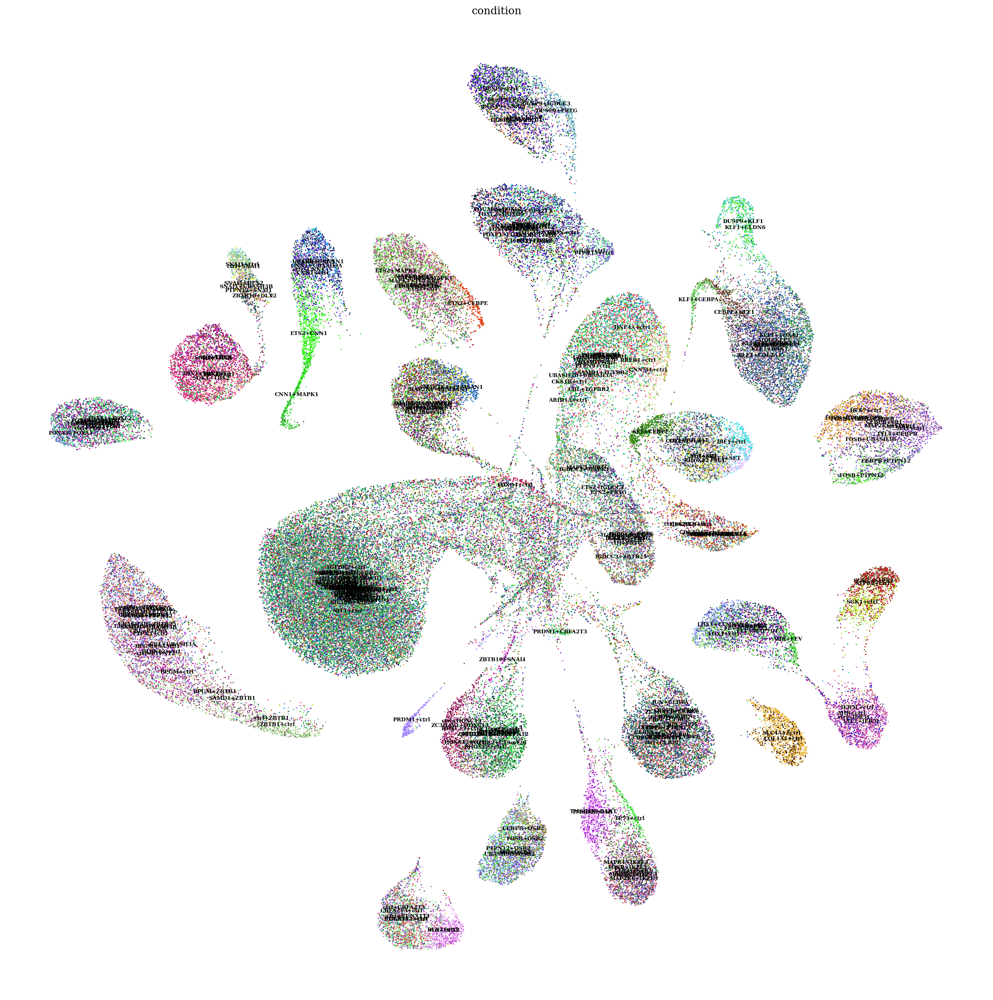

In [12]:
def generate_random_colors(num_colors):
    return ["#"+''.join([np.random.choice(list('0123456789ABCDEF')) for j in range(6)]) for i in range(num_colors)]
unique_cell_types = latent.obs["condition"].unique()
# Generate random colors for each unique cell type
random_colors = generate_random_colors(len(unique_cell_types))
# Create a dictionary to map cell types to colors
color_map = dict(zip(unique_cell_types, random_colors))

with warnings.catch_warnings():
    warnings.simplefilter("ignore")
    plt.figure(figsize=(20, 20))
    sc.pl.umap(
        latent, 
        color=["condition"], 
        ncols=1,
        size=8,
        frameon=False,
        palette=color_map,
        legend_loc="on data",
        legend_fontsize=6,
        legend_fontweight='bold',
        ax=plt.gca(),
    show=False
    )
plt.show()

In [13]:
sublatent = DM.configurations.unreserved_latent_indices
latent = ad.AnnData(X=vae.get_latent_representation()[:, sublatent], obs=adata.obs.copy())
rsc.utils.anndata_to_GPU(latent)
rsc.pp.neighbors(latent)
rsc.tl.umap(latent)

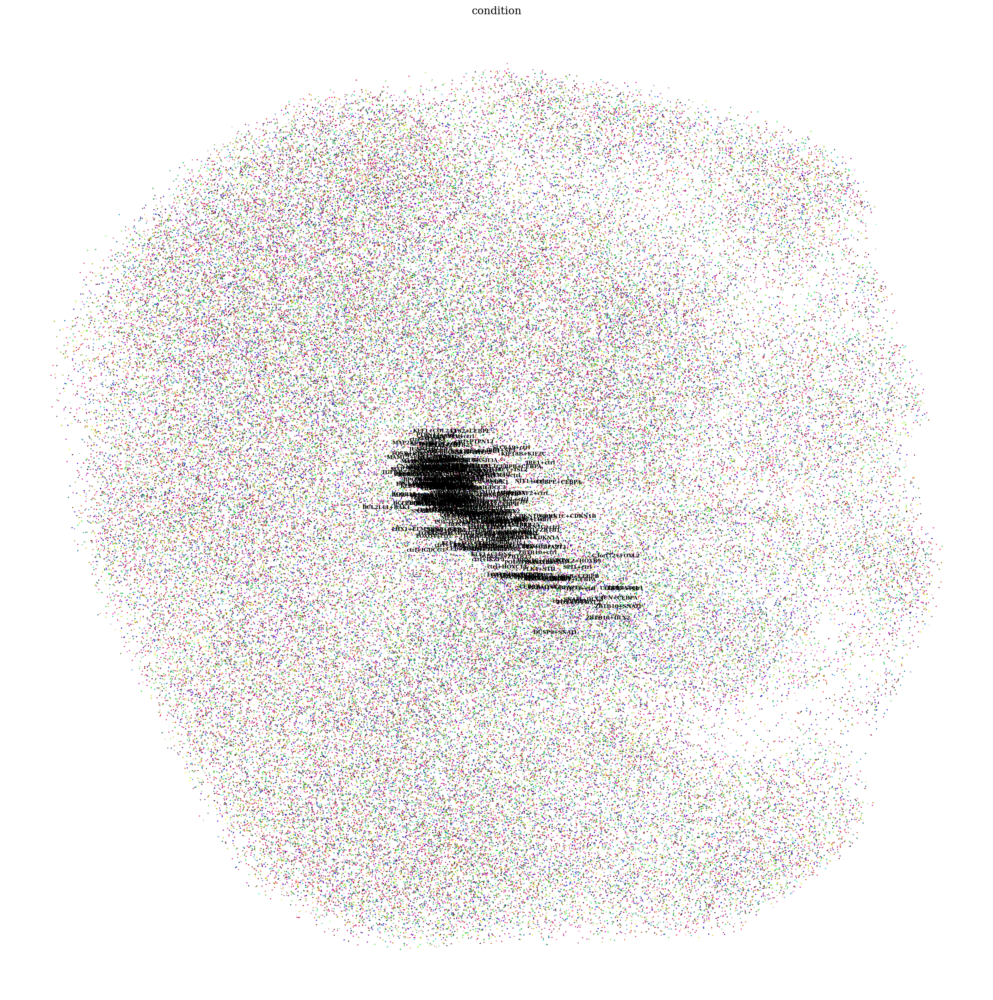

In [14]:
def generate_random_colors(num_colors):
    return ["#"+''.join([np.random.choice(list('0123456789ABCDEF')) for j in range(6)]) for i in range(num_colors)]
unique_cell_types = latent.obs["condition"].unique()
# Generate random colors for each unique cell type
random_colors = generate_random_colors(len(unique_cell_types))
# Create a dictionary to map cell types to colors
color_map = dict(zip(unique_cell_types, random_colors))

with warnings.catch_warnings():
    warnings.simplefilter("ignore")
    plt.figure(figsize=(20, 20))
    sc.pl.umap(
        latent, 
        color=["condition"], 
        ncols=1,
        size=8,
        frameon=False,
        palette=color_map,
        legend_loc="on data",
        legend_fontsize=6,
        legend_fontweight='bold',
        ax=plt.gca(),
    show=False
    )
plt.show()